In [1]:
import os
import numpy as np
import itertools
import time
import random
from collections import OrderedDict, Counter, defaultdict
from functools import partial
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.nn.utils.rnn import pad_sequence
import math, copy, time
from torch.autograd import Variable
import matplotlib.pyplot as plt
%matplotlib inline

import copy
from torch.utils.data import Dataset, DataLoader
import pytorch_lightning as pl
from pytorch_lightning.callbacks import ModelCheckpoint
from torch.utils.data import random_split

import math
import json
from typing import Callable, Iterable, Tuple
from torch.optim import Optimizer
from torch.utils.data import WeightedRandomSampler

import wandb
wandb.login()
from pytorch_lightning.loggers import WandbLogger

import collections

wandb: Currently logged in as: chucooleg (use `wandb login --relogin` to force relogin)


## Data -- Generation

In [2]:
def generate_cards(attributes, attr_order, num_attributes, num_attr_vals):
    
    attr_order = attr_order[:num_attributes]
    attributes = {att_k:attributes[att_k][:num_attr_vals] for att_k in attributes if att_k in attr_order}
    
    cards = []
    idx_to_card = {}
    card_to_idx = {}

    i = 0
    attr_vals = [attributes[attr] for attr in attr_order]
    for combo in itertools.product(*attr_vals):
        card = tuple(combo)
        cards.append(card)
        card_to_idx[card] = i
        idx_to_card[i] = card
        i += 1
    
    assert len(cards) == len(set(cards))
    print(f'Generated {len(cards)} unqiue cards')                
    return cards, idx_to_card, card_to_idx


def num_shared_attributes(card1, card2):
    matching_concepts = tuple(s1 if s1==s2 else '-' for s1,s2 in zip(card1,card2))
    num_matching_concepts = len([c for c in matching_concepts if c != '-'])
    return matching_concepts, num_matching_concepts


def generate_card_pairs(cards, card_to_idx):
    '''
    find all combos of cards, filter down to the ones that share concepts.
    '''
    cardpairs_with_shared_concepts = []
    cardpairs_without_shared_concepts = []

    cardpair_to_idx, idx_to_cardpair, idx = {}, {}, 0
    num_matching_concepts_all = {}
    for card1, card2 in itertools.combinations(cards,2):
        if card1 != card2:
            matching_concepts, num_matching_concepts = num_shared_attributes(card1, card2)
            num_matching_concepts_all[(card1, card2)] = num_matching_concepts
            if num_matching_concepts:
                cardpairs_with_shared_concepts.append(((card_to_idx[card1], card_to_idx[card2]), matching_concepts))
            else:
                cardpairs_without_shared_concepts.append(((card_to_idx[card1], card_to_idx[card2]), matching_concepts))
            idx_to_cardpair[idx] = (card_to_idx[card1], card_to_idx[card2])
            cardpair_to_idx[(card_to_idx[card1], card_to_idx[card2])] = idx
            idx += 1
    print(f'Generated {len(cardpairs_with_shared_concepts) + len(cardpairs_without_shared_concepts)} cardpairs')
    print(f'-- {len(cardpairs_with_shared_concepts)} cardpairs with shared concept')
    print(f'-- {len(cardpairs_without_shared_concepts)} cardpairs without shared concept')
    print(Counter(num_matching_concepts_all.values()).most_common())
    return cardpairs_with_shared_concepts, cardpairs_without_shared_concepts, cardpair_to_idx, idx_to_cardpair


def match_concept_to_card(concept, card):
    '''
    Given a concept, determine if card matches.
    
    Arguments:
        concept: ('red', 'void', '-', '-')
        card: ex1. ('red', 'void', 'triangle', 'XOX')
              ex2. ('green', 'void', 'square', 'OXX')
    Returns:
        match: bool. ex1. True,
                     ex2. False
    '''
    match = 0
    for ct, cd in zip(concept, card):
        # As long as one concept matches, it is a match!
        if ct == cd:
            match += 1
    return match


def default_to_regular(d):
    if isinstance(d, defaultdict):
        d = {k: default_to_regular(v) for k, v in d.items()}
    return d

def gen_card_data(attributes, attr_order, num_attributes, num_attr_vals, num_unseen_cardpairs=100, debug=False):
    
    # all cards
    cards, idx_to_card, card_to_idx = generate_cards(attributes, attr_order, num_attributes, num_attr_vals)
    # all card pairs
    cardpairs_with_shared_concepts, cardpairs_without_shared_concepts, cardpair_to_idx, idx_to_cardpair = \
        generate_card_pairs(cards, card_to_idx)
    
    # generate answers
    all_matches = []
    number_of_shared_concepts_per_match = []
    cardpair_to_matches = defaultdict(lambda : defaultdict(int))
#     for cardpair in cardpairs_with_shared_concepts + cardpairs_without_shared_concepts: # NOTE!!
    for cardpair in cardpairs_with_shared_concepts:
        shared_concept = cardpair[1]
        # look for all matching cards
        # ((card pair query), matching card)
        for card in cards:
            num_matched_concepts = match_concept_to_card(shared_concept, card)
            if num_matched_concepts:
                all_matches.append((cardpair_to_idx[cardpair[0]], card_to_idx[card]))
                cardpair_to_matches[cardpair_to_idx[cardpair[0]]][card_to_idx[card]] = num_matched_concepts
                number_of_shared_concepts_per_match.append(num_matched_concepts)
    cardpair_to_matches = default_to_regular(cardpair_to_matches)
    print('Total number of matches = ', len(all_matches))
    print('Number of shared concepts per match = ', Counter(number_of_shared_concepts_per_match).most_common())
    
    # hold out some cardpairs
    unseen_cardpair_indices = list(np.random.choice(len(cardpair_to_idx), size=num_unseen_cardpairs, replace=False))
    train_cardpair_indices = [idx for idx in range(len(cardpair_to_idx)) if idx not in unseen_cardpair_indices]
    assert len(set(unseen_cardpair_indices) | set(train_cardpair_indices)) == len(cardpair_to_idx)
    
    data = {
        'idx_to_key': idx_to_card,
        'key_to_idx': card_to_idx,
        'query_to_idx': cardpair_to_idx, 
        'idx_to_query': idx_to_cardpair,
        'all_matches': all_matches, # list of tuples (query idx, answer card)
        'query_to_keys': cardpair_to_matches, # lookup query idx:{'card1':num matched concepts, 'card2':num matched concepts,...}
        'unseen_query_indices': unseen_cardpair_indices,
        'seen_query_indices': train_cardpair_indices
    }
    return data


attributes = {
    'color': ['red', 'green', 'blue', 'orange', 'cyan', 'magenta', 'black', 'yellow'],
    'fill': ['void', 'dashed', 'solid', 'checkered', 'dotted', 'mosaic', 'noise', 'brushed'],
    'shape': ['square', 'circle', 'triangle', 'star', 'hexagon', 'pentagon', 'ellipse', 'rectangle'],
    'config': ['OOO', 'OOX', 'OXO', 'OXX', 'XOO', 'XOX', 'XXO', 'XXX']
}

attr_order = ['color', 'fill', 'shape', 'config']

num_attributes = 2
num_attr_vals = 8
game_data = gen_card_data(attributes, attr_order, num_attributes, num_attr_vals, num_unseen_cardpairs=0, debug=False)

Generated 64 unqiue cards
Generated 2016 cardpairs
-- 448 cardpairs with shared concept
-- 1568 cardpairs without shared concept
[(0, 1568), (1, 448)]
Total number of matches =  3584
Number of shared concepts per match =  [(1, 3584)]


## Data -- Distribution, Splits

In [3]:
distribution_epsilon = 1e-100

count_table = np.zeros((len(game_data['idx_to_key']), len(game_data['idx_to_query'])))
        
for q, k in game_data['all_matches']:
    count_table[k, q] += 1    
        
xy = count_table/np.sum(count_table)
xy += distribution_epsilon
xy /= np.sum(xy)

x = np.sum(xy,0)
y = np.sum(xy,1)
xyind = y[None].T @ x[None]

In [4]:
# + 0.1
[(0.0029940119760479044, 270), (0.003548458638278998, 54)]
# + nothing
Counter(list(xy.reshape(-1))).most_common()

[(1e-100, 125440), (0.00027901785714285713, 3584)]

In [5]:
np.sum(count_table)

3584.0

In [6]:
xy_rank = np.linalg.matrix_rank(xy)
print('xy_rank=',xy_rank)

xy_div_xyind_rank = np.linalg.matrix_rank((xy/xyind))
print('xy_div_xyind_rank=',xy_div_xyind_rank)

xy_rank= 15
xy_div_xyind_rank= 15


In [37]:
figsize = (20,15)
# figrange = (fx_s, fx_e, fy_s, fy_e)
# figrange = (0, len(game_data['idx_to_key']), 0, len(game_data['idx_to_query']))
figrange = (0, len(game_data['idx_to_key']), 0, 500)

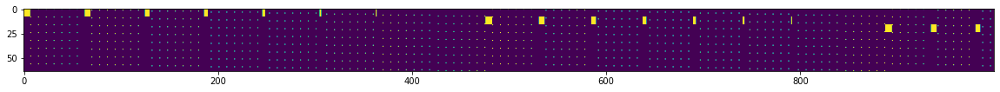

In [14]:
# all
plt.figure(figsize = figsize)
plt.imshow((xy)[figrange[0]:figrange[1], figrange[2]:figrange[3]])

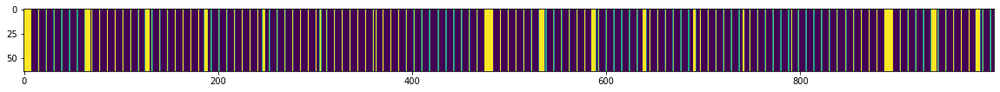

In [15]:
# all
plt.figure(figsize = figsize)
plt.imshow((xyind)[figrange[0]:figrange[1], figrange[2]:figrange[3]])

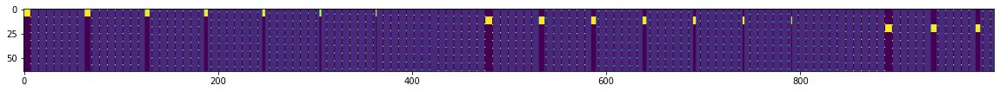

In [16]:
# all
plt.figure(figsize = figsize)
plt.imshow((xy/xyind)[figrange[0]:figrange[1], figrange[2]:figrange[3]])

In [19]:
Counter(list((xy/xyind).reshape(-1))).most_common()

[(0.9999999999999988, 64288),
 (0.9999999999999986, 21952),
 (2.8672000000000013e-96, 19600),
 (0.9999999999999989, 14112),
 (2.867200000000001e-96, 5488),
 (8.000000000000004, 2800),
 (8.000000000000002, 784)]

## Dataset

In [20]:
### One embed per query!

class GameDataset(Dataset):
    
    def __init__(self, raw_data, debug=False):
        '''
        raw_data: object returned by gen_card_data.
        '''
        super().__init__()
        self.raw_data = raw_data
        self.debug = debug
        # y
        self.query_support_size = len(self.raw_data['idx_to_query'])
        # x
        self.key_support_size = len(self.raw_data['idx_to_key'])
        
    def __len__(self):
        return self.query_support_size * self.key_support_size
    
    def __getitem__(self, idx):
        '''
        key_idx: (xy_i) * (xy.shape[1]=self.query_support_size) + (xy_j)
        '''
        x_i, y_j = idx//self.query_support_size, idx%self.query_support_size
        all_matches = list(self.raw_data['query_to_keys'].get(y_j, {}).keys())
        gt = np.zeros(self.key_support_size)
        gt[all_matches] = 1.0
        
        if self.debug:
            yj1, yj2 = self.raw_data['idx_to_query'][y_j]
            print('query\n', y_j,":", yj1, yj2, self.raw_data['idx_to_key'][yj1], self.raw_data['idx_to_key'][yj2])
            print('key\n', x_i, self.raw_data['idx_to_key'][x_i])
            print('all matches \n', [self.raw_data['idx_to_key'][m] for m in all_matches])
        
        return (
            idx, 
            torch.tensor([y_j]).long(), # query
            torch.tensor([x_i]).long(), # gt key
            torch.tensor(gt).long()     # all gt keys
        )    

game_dataset = GameDataset(raw_data=game_data, debug=True)
game_dataset[10] 
print('-----')
game_dataset[7] # 7 has zero prob of being sampled

query
 10 : 0 11 ('red', 'void') ('green', 'checkered')
key
 0 ('red', 'void')
all matches 
 []
-----
query
 7 : 0 8 ('red', 'void') ('green', 'void')
key
 0 ('red', 'void')
all matches 
 [('red', 'void'), ('green', 'void'), ('blue', 'void'), ('orange', 'void'), ('cyan', 'void'), ('magenta', 'void'), ('black', 'void'), ('yellow', 'void')]


(7,
 tensor([7]),
 tensor([0]),
 tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
         1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
         1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0]))

In [21]:
class GameTestFullDataset(Dataset):
    
    def __init__(self, raw_data, debug=False):
        '''
        raw_data: object returned by gen_card_data.
        queries_with_shared_attr_only: bool.
        '''
        super().__init__()
        self.raw_data = raw_data
        self.debug = debug
        # y
        self.query_support_size = len(self.raw_data['idx_to_query'])
        # x
        self.key_support_size = len(self.raw_data['idx_to_key'])
        
    def __len__(self):
        return len(self.raw_data['idx_to_query'])
    
    def __getitem__(self, idx):
        '''
        key_idx: int. 0 to query_support_size-1
        '''
        y_j = idx
        x_i = torch.empty(1) # just a meaningless value
        all_matches = list(self.raw_data['query_to_keys'].get(y_j, {}).keys())
        gt = np.zeros(self.key_support_size)
        gt[all_matches] = 1.0

        if self.debug:
            yj1, yj2 = self.raw_data['idx_to_query'][y_j]
            print('query\n', y_j,":", yj1, yj2, self.raw_data['idx_to_key'][yj1], self.raw_data['idx_to_key'][yj2])
            print('all matches \n', [self.raw_data['idx_to_key'][m] for m in all_matches])
            
            
        return (
            idx, 
            torch.tensor([y_j]).long(), # query
            torch.tensor([x_i]).long(), # gt key
            torch.tensor(gt).long()     # all gt keys
        ) 
    
game_testdataset = GameTestFullDataset(raw_data=game_data, debug=True)
game_testdataset[10]
print('-----')
game_testdataset[7] # 7 has zero prob of being sampled

query
 10 : 0 11 ('red', 'void') ('green', 'checkered')
all matches 
 []
-----
query
 7 : 0 8 ('red', 'void') ('green', 'void')
all matches 
 [('red', 'void'), ('green', 'void'), ('blue', 'void'), ('orange', 'void'), ('cyan', 'void'), ('magenta', 'void'), ('black', 'void'), ('yellow', 'void')]


(7,
 tensor([7]),
 tensor([0]),
 tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
         1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
         1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0]))

In [22]:
class GameDataModule(pl.LightningDataModule):
    
    def __init__(self, batch_size, raw_data, seen_train_xy, seen_val_xy, debug=False):
        super().__init__()
        self.batch_size = batch_size
        self.dataset = GameDataset(raw_data=raw_data, debug=debug)
#         self.testdataset = GameTestFullDataset(raw_data=raw_data, debug=debug)
        self.seen_train_xy = seen_train_xy
        self.seen_val_xy = seen_val_xy
        self.setup_samplers()
        
    def setup_samplers(self):
        self.train_sampler = WeightedRandomSampler(
            weights=self.seen_train_xy.reshape(-1), num_samples=self.batch_size, replacement=True
        ) 
        self.val_sampler = WeightedRandomSampler(
            weights=self.seen_val_xy.reshape(-1), num_samples=self.batch_size, replacement=True
        )
        
    def setup(self, stage=None):
        if stage == 'fit' or stage is None:
            self.train = self.dataset
            self.val = self.dataset
#         if stage == 'test' or stage is None:
#             self.test = self.testdataset
            
    def train_dataloader(self):
        train_loader = DataLoader(
            self.train, batch_size=self.batch_size, shuffle=False, sampler=self.train_sampler
        )
        return train_loader
    
    def val_dataloader(self):
        val_loader = DataLoader(
            self.val, batch_size=self.batch_size,  shuffle=False, sampler=self.val_sampler
        )
        return val_loader
    
#     def test_dataloader(self):
#         test_loader = DataLoader(
#             self.test, batch_size=self.batch_size, shuffle=False
#         )
#         return test_loader  

## Model Architecture

In [23]:
def construct_full_model(hparams):
    '''
    return: nn.Module.
    '''
    # embeddings
    query_embed_X = ScaledEmbedding(hparams['query_support_size'], hparams['d_model'])
    key_embed_X = ScaledEmbedding(hparams['key_support_size'], hparams['d_model'])
    embed_dropout = nn.Dropout(hparams['embed_dropout'])
    
    # full model
    model = EncoderPredictor(
        inp_query_layer = nn.Sequential(
            OrderedDict([
                ('scaled_embed', query_embed_X),
                ('embed_dropout', embed_dropout)
            ])
        ),
        inp_key_layer = nn.Sequential(
            OrderedDict([
                ('scaled_embed', key_embed_X),
                ('embed_dropout', embed_dropout)
            ])
        ),
        classifier = nn.Sequential(
            OrderedDict([   
                ('linear1', nn.Linear(2*hparams['d_model'], hparams['d_model'])),
                ('nonLinear1', nn.ReLU()),
                ('linear-out', nn.Linear(hparams['d_model'], 1)),
            ])
        ) if not hparams['dotproduct_bottleneck'] else None, 
        
        key_support_size = hparams['key_support_size'],
        d_model = hparams['d_model'],
        debug = hparams['debug'],
    )
    
    return model

In [24]:
class ScaledEmbedding(nn.Module):

    def __init__(self, V, d_model):
        super(ScaledEmbedding, self).__init__()
        self.embedding = nn.Embedding(V, d_model)
        # scale embedding to have variance 0.01
        nn.init.normal_(self.embedding.weight, mean=0., std=(0.01)**(1/2))
        self.d_model = d_model

    def forward(self, tokens):
        '''
        tokens: shape (batch_size=b, len)
        '''
        # shape (b, len, d_model)
        embedded = self.embedding(tokens) * math.sqrt(self.d_model)
        if torch.max(embedded) > 2000.:
            import pdb; pdb.set_trace()
        return embedded

In [25]:
class EncoderPredictor(nn.Module):
    
    def __init__(self, inp_query_layer, inp_key_layer, classifier, key_support_size, d_model, debug=False):
        super().__init__()
        self.inp_query_layer = inp_query_layer
        self.inp_key_layer = inp_key_layer
        self.classifier = classifier
        self.key_support_size = key_support_size
        self.d_model = d_model
        
    def forward(self, X_query, X_key, val_bool, debug=False):
        '''
        X_query: (b, 1)
        X_key: (b, 1) if test bool, else (b, num matched cards) or None.
        '''
        if X_key is not None: assert X_query.shape == X_key.shape
        if val_bool:
            return self.forward_norm_support(X_query, debug=debug)
        else:
            assert X_key is not None, 'X_key should not be None for normalizing over minibatch keys.'
            return self.forward_norm_minibatch(X_query, X_key, debug=debug)

    def forward_norm_minibatch(self, X_query, X_key, debug=False):
        b = X_query.shape[0]
        assert X_query.shape == (b, 1)
        
        # shape(b, d_model)
        query_repr = self.encode_query(X_query).squeeze(1)
        assert query_repr.shape == (b, self.d_model)
        
        # shape(b, d_model)
        key_repr = self.encode_key(X_key).squeeze(1)
        assert key_repr.shape == (b, self.d_model)

        if self.classifier:
            # shape(b, b, d_model)
            query_repr_tiled = query_repr.unsqueeze(1).expand(b, b, self.d_model)
            # shape(b, b, d_model)
            key_repr_tiled = key_repr.unsqueeze(0).expand(b, b, self.d_model)
            # shape(b, b, 2*d_model)
            query_key_concat = torch.cat([query_repr_tiled, key_repr_tiled], dim=2)
            assert query_key_concat.shape == (b, b, 2*self.d_model)
            # shape(b*b, 2*d_model)
            query_key_concat = query_key_concat.reshape(b*b, 2*self.d_model)
            # shape(b*b, 1)
            logits = self.classifier(query_key_concat)
            assert logits.shape == (b*b, 1)
            # shape(b, b)
            logits = logits.squeeze(1).reshape(b, b)
        else:
            # shape(b, b) dotproduct=logit matrix
            logits = torch.matmul(query_repr, key_repr.T)
        assert logits.shape == (b, b)
        
        # shape(b, b)
        return logits

    def forward_norm_support(self, X_query, debug=False):
        b = X_query.shape[0]
        assert X_query.shape == (b, 1)
        
        # shape(b, d_model)
        query_repr = self.encode_query(X_query).squeeze(1)
        assert query_repr.shape == (b, self.d_model)

        # shape(size(support), d_model)
        keys_repr = self.encode_all_keys()
        assert keys_repr.shape == (self.key_support_size, self.d_model)
        
        if self.classifier:
            # shape(b, size(support), d_model)
            query_repr_tiled = query_repr.unsqueeze(1).expand(b, self.key_support_size, self.d_model)
            # shape(b, size(support), d_model)
            key_repr_tiled = keys_repr.unsqueeze(0).expand(b, self.key_support_size, self.d_model)
            # shape(b, size(support), 2*d_model)
            query_key_concat = torch.cat([query_repr_tiled, key_repr_tiled], dim=2)
            # shape(b*size(support), 2*d_model)
            query_key_concat = query_key_concat.reshape(b*self.key_support_size, 2*self.d_model)
            # shape(b*size(support), 1)
            logits = self.classifier(query_key_concat)
            # shape(b, size(support))
            logits = logits.squeeze(1).reshape(b, self.key_support_size)
        else:
            # shape(b, size(support)) dotproduct=logit matrix
            logits = torch.matmul(query_repr, keys_repr.T)
        assert logits.shape == (b, self.key_support_size)
        
        # shape(b, size(support)) 
        return logits

    def encode_query(self, X):
        '''
        X: (batch_size=b,1)
        '''
        b = X.shape[0] 
        # shape(b, 1, embed_dim)
        inp_embed = self.inp_query_layer(X)
        assert inp_embed.shape == (b, 1, self.d_model)
        return inp_embed     
        
    def encode_key(self, X):
        '''
        X: (batch_size=b)
        '''
        b = X.shape[0] 
        # shape(b, 1, embed_dim)
        inp_embed = self.inp_key_layer(X) 
        assert inp_embed.shape == (b, 1, self.d_model)
        return inp_embed  

    def encode_all_keys(self):
        
        # shape(size(support), embed_dim)
        all_embed = self.inp_key_layer.scaled_embed.embedding.weight
        assert all_embed.requires_grad == True
        assert all_embed.shape == (self.key_support_size, self.d_model)
        
        return all_embed

## Loss, Metric

In [26]:
class InfoCELoss(nn.Module):
    '''
    InfoCE Loss on a (b, b) logits matrix with Temperature scaling
    '''

    def __init__(self, temperature_const=1.0):
        super().__init__()
        self.temperature_const = temperature_const
        self.CE_loss = nn.CrossEntropyLoss(reduction='sum')

    def forward(self, logits, debug=False):
        '''
        logits: shape (batch_size=b, b)
        '''
        assert logits.shape[0] == logits.shape[1]
        b = logits.shape[0]
        
        logits /= self.temperature_const
        
        labels = torch.arange(b).type_as(logits).long()
        sum_loss_per_row = self.CE_loss(logits, labels)
        sum_loss_per_col = self.CE_loss(logits.T, labels)
        
        if debug:
            print('sum_loss_per_row=',sum_loss_per_row)
            print('sum_loss_per_col=',sum_loss_per_col)

        loss = (sum_loss_per_row + sum_loss_per_col) * 0.5
        return loss


# ---------------------------    
loss_criterion = InfoCELoss(temperature_const=0.1)

logits = torch.tensor([
    [1.,2.,3.],
    [6.,7.,4.],
    [5.,8.,9.]
])
print('avg loss=',loss_criterion(logits, True))
print('-------------')
logits = torch.tensor([
    [3.,2.,3.],
    [6.,7.,4.],
    [5.,8.,9.]
])
print('avg loss=',loss_criterion(logits, True))


# ref
# sum_loss_per_row= tensor(20.0001)
# sum_loss_per_col= tensor(60.0001)
# avg loss= tensor(40.0001)
# -------------
# sum_loss_per_row= tensor(0.6933)
# sum_loss_per_col= tensor(40.0001)
# avg loss= tensor(20.3467)

sum_loss_per_row= tensor(20.0001)
sum_loss_per_col= tensor(60.0001)
avg loss= tensor(40.0001)
-------------
sum_loss_per_row= tensor(0.6933)
sum_loss_per_col= tensor(40.0001)
avg loss= tensor(20.3467)


In [27]:
class ThresholdedMetrics(nn.Module):
    
    def __init__(self, raw_data):
        '''
        tot_k: total number of candidates. e.g. 81 cards
        '''
        super().__init__()
        self.raw_data = raw_data
        self.key_support_size = len(self.raw_data['idx_to_key'])
        self.threshold = 1.0 / (self.key_support_size)
        self.softmax = nn.Softmax(dim=1)

    def breakdown_errors(self, X_query, corrects):
        '''
        X_query: shape (b,1) (if one embed per query)
        corrects: shape (b, support size)
        '''
        b = X_query.shape[0]
        assert corrects.shape == (b, self.key_support_size)
        
        X_query_list = X_query.squeeze(-1)
        wrongs = (1 - corrects).cpu().numpy()
        
        num_matched_concepts = [
             self.raw_data['query_to_keys'].get(X_query_list[batch_i].item(), {}).get(card_idx, 0)
            for batch_i in range(b) for card_idx in range(self.key_support_size)  
        ]
        
        num_matched_concepts = np.array(num_matched_concepts).reshape(b, self.key_support_size)
        assert num_matched_concepts.shape == wrongs.shape
        
        wrongs_mask = wrongs.reshape(-1).tolist()
        num_matched_concepts = num_matched_concepts.reshape(-1).tolist()

        error_count_by_num_matched_concepts = {k:0 for k in range(num_attributes)}
        total_count_by_num_matched_concepts = {k:0 for k in range(num_attributes)}
        for w,k in zip(wrongs_mask, num_matched_concepts):
            if w == 1:
                error_count_by_num_matched_concepts[k] += 1
            total_count_by_num_matched_concepts[k] += 1    

        error_counts, total_counts = {}, {}
        for k in range(num_attributes):
            err_ct = error_count_by_num_matched_concepts[k]
            tot_ct = total_count_by_num_matched_concepts[k]
            error_counts[f'error_rate_for_{k}_matched_concepts'] = 0 if tot_ct == 0 else (err_ct *1.0 / tot_ct)
            total_counts[f'total_count_for_{k}_matched_concepts'] = tot_ct

        return {**error_counts, **total_counts}    
    
    def forward(self, X_query, logits, X_keys, full_test_bool=False, breakdown_errors_bool=False, debug=False):
        b = X_query.shape[0]
        assert X_query.shape == (b, 1)
        b, key_support_size = logits.shape
        assert key_support_size == self.key_support_size
        assert logits.shape == X_keys.shape
        
        if full_test_bool:
            # filter down to query cards with >0 true matches
            queryIdxs_with_nonzero_matches = list(self.raw_data['query_to_keys'].keys())
            X_query_flat = X_query.squeeze(-1)
            fil = torch.stack([(X_query_flat == qId) for qId in queryIdxs_with_nonzero_matches], dim=1).any(dim=1)
            assert fil.shape == (b, )
            
            # queries with shared attributes
            fil_metrics = self.compute_metrics(X_query[fil], logits[fil], X_keys[fil], breakdown_errors_bool, debug)
            fil_metrics = {'nonNullQueries_'+k:fil_metrics[k] for k in fil_metrics}
            
            # queries without shared attributes
            not_fil = torch.logical_not(fil)
            not_fil_metrics = self.compute_metrics(X_query[not_fil], logits[not_fil], X_keys[not_fil], breakdown_errors_bool, debug)
            not_fil_metrics = {'NullQueries_'+k:not_fil_metrics[k] for k in not_fil_metrics}
            
            # all queries
            all_metrics = self.compute_metrics(X_query, logits, X_keys, breakdown_errors_bool, debug)
            
            return {**fil_metrics, **not_fil_metrics, **all_metrics}
        else:
            return self.compute_metrics(X_query, logits, X_keys, breakdown_errors_bool, debug)
    
    def compute_metrics(self, X_query, logits, X_keys, breakdown_errors_bool=False, debug=False):
        '''
        X_query: shape (b,1) (if one embed per query)
        logits: shape (b, support size)
        X_keys: shape (b, support size). value 1.0 at where card matches. value 0 otherwise.
        '''
        b, key_support_size = logits.shape
        
        # model predictions, shape (b, support size)
        binary_predictions = (self.softmax(logits) >= self.threshold).type(torch.float)
        # ground truth, shape (b, support size)
        gt = X_keys
        # correct predictions, shape (b, support size)
        corrects = (binary_predictions == gt).type(torch.float)
        
        # accuracy, computed per query, average across queries
        # (b,)
        accuracy_row = torch.sum(corrects, dim=1) / key_support_size
        # scalar
        accuracy_meanrows = torch.mean(accuracy_row)
        # accuracy, computed per query-key, average across all
        accuracy_all = torch.sum(corrects) / (b * key_support_size)
        
        # precision, computed per query, average across queries
        # (b,)
        precision_row = torch.sum((corrects * binary_predictions), dim=1) / torch.sum(binary_predictions, dim=1)
        # scalar
        precision_meanrows = torch.mean(precision_row)
        # precision, computed per query-key, average across all
        precision_all = torch.sum((corrects * binary_predictions)) / torch.sum(binary_predictions)

        # recall, computed per query, average across queries
        # (b,)
        recall_row = torch.sum((corrects * gt), dim=1) / torch.sum(gt, dim=1)
        # scalar
        recall_meanrows = torch.mean(recall_row)
        # recall, computed per query-key, average across all
        recall_all = torch.sum((corrects * gt)) / torch.sum(gt)
        
        # f1, computed per query, average across queries
        # (b,)
        f1_row = 2 * (precision_row * recall_row) / (precision_row + recall_row)
        # scalar
        f1_meanrows = torch.mean(f1_row)
        # f1, computed per query-key, average across all
        f1_all = (precision_all * recall_all) / (precision_all + recall_all)
        
        if breakdown_errors_bool:
            error_breakdown_by_num_matched_concepts = self.breakdown_errors(X_query, corrects)
        else:
            error_breakdown_by_num_matched_concepts = {} 
            
        if debug:
            print('####################################################')
            print('Metrics Per Query:')
            print('accuracy_rows', accuracy_row)
            print('precision_row', precision_row)
            print('recall_row', recall_row)
            print('f1_row', f1_row)
            print('####################################################')
            print('Metrics Averaged Across Queries')
            print('accuracy_meanrows', accuracy_meanrows)
            print('precision_meanrows', precision_meanrows)
            print('recall_meanrows', recall_meanrows)
            print('f1_meanrows', f1_meanrows)
            print('####################################################')
            print('Metrics Averaged Across All Query-Key Pairs:')
            print('accuracy_all', accuracy_all)
            print('precision_all', precision_all)
            print('recall_all', recall_all)
            print('f1_all', f1_all)
            print('####################################################')
            print('error_breakdown', error_breakdown_by_num_matched_concepts)
            
        metrics = {
            'accuracy_by_Query': accuracy_meanrows,
            'precision_by_Query': precision_meanrows,
            'recall_by_Query': recall_meanrows,
            'f1_by_Query': f1_meanrows,
            'accuracy_by_QueryKey': accuracy_all,
            'precision_by_QueryKey': precision_all,
            'recall_by_QueryKey': recall_all,
            'f1_by_QueryKey': f1_all
        }
        metrics = {
            **metrics, **error_breakdown_by_num_matched_concepts
        }
        return metrics


def test_metric_module():
    key_support_size=3
    thresh=1./key_support_size

    m_f = ThresholdedMetrics(raw_data=game_data)
    m_f.key_support_size = 3

    logits = torch.tensor(
        [
            [thresh, thresh, thresh],
            [thresh, thresh, thresh],
            [thresh, thresh, thresh]
        ]
    )
    X_keys = torch.tensor(
        [
            [1,0,0],
            [0,1,0],
            [1,1,1]
        ]
    )

    print(m_f(None, logits, X_keys, debug=True))
    print('----------------------------------------------')
    
    logits = torch.tensor(
        [
            [0.4, 0.2, 0.4],
            [thresh, thresh, thresh],
            [thresh, thresh, thresh]
        ]
    )
    X_keys = torch.tensor(
        [
            [1,0,0],
            [0,1,0],
            [1,1,1]
        ]
    )

    print(m_f(None, logits, X_keys, debug=True))
    
    
# test_metric_module()

# reference output
# accuracy_row tensor([0.3333, 0.3333, 1.0000])
# precision_row tensor([0.3333, 0.3333, 1.0000])
# recall_row tensor([1., 1., 1.])
# f1_row tensor([0.5000, 0.5000, 1.0000])
# {'accuracy': tensor(0.5556), 'precision': tensor(0.5556), 'recall': tensor(1.), 'f1': tensor(0.6667)}
# ----------------------------------------------
# accuracy_row tensor([0.6667, 0.3333, 1.0000])
# precision_row tensor([0.5000, 0.3333, 1.0000])
# recall_row tensor([1., 1., 1.])
# f1_row tensor([0.6667, 0.5000, 1.0000])
# {'accuracy': tensor(0.6667), 'precision': tensor(0.6111), 'recall': tensor(1.), 'f1': tensor(0.7222)}

## Training Module

In [28]:
# Build Lightning Module
# https://colab.research.google.com/drive/1F_RNcHzTfFuQf-LeKvSlud6x7jXYkG31#scrollTo=UIXLW8CO-W8w

thresholded_metrics = ThresholdedMetrics(raw_data=game_data)

class TrainModule(pl.LightningModule):
    
    def __init__(self, hparams, gt_distributions):
        '''
        hparams: dictionary of hyperparams
        gt_distributions: dictionary that stores the groundtruth 'xy', 'xyind' distributions.
                         each is a key_support_size by query_support_size matrix that sums up to 1.0
        '''
        super().__init__()
        self.hparams = hparams
        self.debug = hparams['debug']
        self.save_hyperparameters()
        
        self.model = construct_full_model(hparams)
        self.loss_criterion = InfoCELoss(temperature_const=self.hparams['loss_temperature_const'])
        self.metrics = thresholded_metrics

        self.key_support_size = self.hparams['key_support_size']
        self.query_support_size = self.hparams['query_support_size']
        
        # for pulling model p(x,y) and p(x,y)/[pxpy]
        self.populate_logits_matrix = hparams['populate_logits_matrix']
        if self.populate_logits_matrix:
            self.register_buffer(
                name='model_logits_matrix',
                tensor= torch.zeros(hparams['key_support_size'], hparams['query_support_size'])
            )
            self.setup_gt_distributions(gt_distributions)
        
    def log_metrics(self, metrics_dict):
        for k, v in metrics_dict.items():
            self.log(k, v)
            
    def get_max_memory_alloc(self):
        devices_max_memory_alloc = {}
        for i in range(torch.cuda.device_count()):
            device = torch.device(f'cuda:{i}')
            devices_max_memory_alloc[device] = torch.cuda.max_memory_allocated(device) / 1e6
            torch.cuda.reset_max_memory_allocated(device)
        return devices_max_memory_alloc
    
    ###################################################
    
    def forward(self, X_query, X_key, X_keys, val_bool, full_test_bool=False, debug=False):
        '''
        X_query: (b, 1)
        X_key: (b, 1)
        X_keys: (b, key_support_size) 1s and 0s.
        test_bool: boolean.
        '''
        batch_size = X_query.shape[0]
        
        # ToDo batch_size_b
        
        # shape (b,support) if test_bool else (b, b)
        logits = self.model(X_query, X_key, val_bool, debug=debug)
        # scalar
        loss = None if val_bool else self.loss_criterion(logits, debug=debug)
        # scalar
        metrics = self.metrics(
            logits=logits, X_keys=X_keys, X_query=X_query, 
            debug=debug, full_test_bool=full_test_bool, breakdown_errors_bool=True, 
        ) if val_bool else None

        return logits, loss, metrics
    
    ###################################################
    
    def setup_gt_distributions(self, gt_distributions):
        '''called once during init to setup groundtruth distributions'''
        assert gt_distributions['xy'].shape == gt_distributions['xyind'].shape
        
        # (key_support_size, query_support_size)
        self.register_buffer(
            name='gt_xy',
            tensor= torch.tensor(gt_distributions['xy'])
        )        
        # (key_support_size, query_support_size)
        self.register_buffer(
            name='gt_xyind',
            tensor= torch.tensor(gt_distributions['xyind'])
        )        
        # (key_support_size, query_support_size)
        self.register_buffer(
            name='gt_xy_div_xyind',
            tensor= self.gt_xy/self.gt_xyind
        )
        # scalar
        self.register_buffer(
            name='one',
            tensor= torch.tensor([1.0])
        )   
        # scalar
        self.register_buffer(
            name='gt_mi',
            tensor= self.compute_mutual_information(self.gt_xy, self.gt_xy_div_xyind)
        ) 
   
    
    def populate_model_logits_matrix(self, query_idx, logits):
        '''
        query_idx: shape (b,)
        logits: shape(b, key_support_size)
        '''  
        assert query_idx.shape[0] == logits.shape[0]
        b = query_idx.shape[0]
        assert logits.shape[1] == self.key_support_size
        for i in range(b):
            self.model_logits_matrix[:,query_idx[i]] = logits[i]
    
    def compute_mutual_information(self, xy, xy_div_xyind):
        '''
        xy: p(xy). shape(b, key_support_size)
        xy_div_xyind_hat: p(xy)/[p(x)(y)].
                          shape(b, key_support_size)
        '''
        assert torch.isclose(torch.sum(xy), self.one.type_as(xy))
        assert xy.shape == xy_div_xyind.shape == (
            self.key_support_size, self.query_support_size
        )
        pmi = torch.log(xy_div_xyind)
        mi = torch.sum(xy * pmi)
        return mi
    
    def pull_model_distribution(self, debug=True):

        # sanity check
        sum_logits = torch.sum(self.model_logits_matrix)
        assert sum_logits != 0.0
        
        if debug:
            print('Sum of model logits matrix\n', sum_logits)
            print('Number of model logits with zero value\n', torch.sum(self.model_logits_matrix == 0.0)) 
            print('Variance of model logits\n', torch.var(self.model_logits_matrix))
        
        # estimate the full distribution
        # hat( k * pxy/(pxpy)
        f = torch.exp(self.model_logits_matrix)
        # hat( k * pxy)
        xy_hat = f * self.gt_xyind
        # hat( pxy)
        xy_hat = (xy_hat / torch.sum(xy_hat))
        
        # estimate exp(pmi)
        # hat(k)
        k_hat = torch.sum(f) / torch.sum(self.gt_xy_div_xyind)
        # hat(pxy/(pxpy)
        xy_div_xyind_hat = (f / k_hat)
        if torch.any(torch.isnan(xy_div_xyind_hat)):
            import pdb; pdb.set_trace()
        
        # estimate MI
        # scalar
        mi_hat = self.compute_mutual_information(xy_hat, xy_div_xyind_hat)
        # scalar
        mi_gt_minus_hat = self.gt_mi - mi_hat
        
        # estimate KL divergence
        kl_div_val = F.kl_div(torch.log(xy_hat), self.gt_xy)

        # estimate ranks
        xy_hat = xy_hat.detach().cpu().numpy()
        xy_div_xyind_hat = xy_div_xyind_hat.detach().cpu().numpy()
        # hat(pxy rank)
        xy_hat_rank = np.linalg.matrix_rank(xy_hat)
        # hat(pxy/(pxpy rank)
        xy_div_xyind_hat_rank = np.linalg.matrix_rank(xy_div_xyind_hat) 
        
        pulled_distribution_results = {
            'xy_hat':xy_hat,
            'xy_div_xyind_hat':xy_div_xyind_hat,
            'xy_hat_rank':xy_hat_rank,
            'xy_div_xyind_hat_rank':xy_div_xyind_hat_rank,
            'mi_hat':mi_hat,
            'mi_gt_minus_hat':mi_gt_minus_hat,
            'kl_div':kl_div_val
        }
        
        return pulled_distribution_results

    ###################################################
    
    def training_step(self, batch, batch_nb):
        
        # _, (b, 1), (b, 1), (b, support size)
        _, X_query, X_key, X_keys = batch
        # scalar
        _, loss, _ = self(X_query, X_key, None, val_bool=False, debug=self.debug)
        # dict
        _, _, metrics = self(X_query, None, X_keys, val_bool=True, debug=self.debug)
        
        if self.debug:
            print('-----------------------------')
            print('train step')
            print(Counter(torch.sum(X_keys, dim=1).tolist()).most_common())
            print(
                'X_query:',X_query[0], '\nX_key:',
                X_key[0], '\nloss:', loss, '\nmetrics:\n', [(m,metrics[m]) for m in metrics]
            )
        
        # log
        step_metrics = {**{'train_loss': loss}, **{'train_'+m:metrics[m] for m in metrics}}
        self.log_metrics(step_metrics)
        return loss
    
    def validation_step(self, batch, batch_nb):
        
        # _, (b, 1), (b, 1), (b, support size)
        _, X_query, X_key, X_keys = batch
        _, loss, _ = self(X_query, X_key, None, val_bool=False, debug=self.debug)
        _, _, metrics = self(X_query, None, X_keys, val_bool=True, debug=self.debug)
        
        if self.debug:
            print('-----------------------------')
            print('validation step')
            print(Counter(torch.sum(X_keys, dim=1).tolist()).most_common())
            print(
                'X_query:',X_query[0], '\X_key:',
                X_key[0], '\nloss:', loss, '\nmetrics:', [(m,metrics[m]) for m in metrics]
            )
            
        # log 
        step_metrics = {**{'val_loss': loss}, **{'val_'+m:metrics[m] for m in metrics}}
        devices_max_memory_alloc = self.get_max_memory_alloc()
        for device, val in devices_max_memory_alloc.items():
            step_metrics[f'step_max_memory_alloc_cuda:{device}'] = val
        self.log_metrics(step_metrics)
        return step_metrics
    
    def test_step(self, batch, batch_nb):
        
        # (b,1), (b,1), _, (b, support size)
        query_idx, X_query, _, X_keys = batch
        
        # compute scores for all keys
        # shape(b, key_support_size), _, dictionary
        logits, _, metrics = self(X_query, None, X_keys, val_bool=True, full_test_bool=True, debug=self.debug)
        
        if self.populate_logits_matrix:
            self.populate_model_logits_matrix(query_idx, logits)
        
        # log
        step_metrics = {'test_'+m:metrics[m] for m in metrics}
        self.log_metrics(step_metrics)
        return step_metrics 
    
    ###################################################
    
    def aggregate_metrics_at_epoch_end(self, outputs):
        # log metrics
        epoch_metrics = {}
        metric_names = outputs[0].keys()
        for m in metric_names:
            if not ('max_memory_alloc_cuda' in m or 'count' in m or 'rate' in m):
                epoch_metrics['avg_'+m] = torch.stack([x[m] for x in outputs]).mean()
            elif '_matched_concepts' in m:
                epoch_metrics['avg_'+m] = np.mean([x[m] for x in outputs])
        self.log_metrics(epoch_metrics)
        return epoch_metrics         
    
    def validation_epoch_end(self, outputs):
        averaged_metrics = self.aggregate_metrics_at_epoch_end(outputs)
        return averaged_metrics
    
    def test_epoch_end(self, outputs):        
        averaged_metrics = self.aggregate_metrics_at_epoch_end(outputs)
        try:
            assert 'avg_test_error_rate_for_1_matched_concepts' in averaged_metrics
        except:
            import pdb; pdb.set_trace()
            
        return averaged_metrics
    
    ###################################################
    
    def configure_optimizers(self):
        opt = torch.optim.Adam(
            params=self.model.parameters(),
            lr=self.hparams['lr'],
            betas=(
                self.hparams['adam_beta1'], self.hparams['adam_beta2']),
            eps=self.hparams['adam_epsilon'],
            weight_decay=self.hparams['adam_weight_decay']
        )
        return opt

## hparams, init train module

In [29]:
# W&B References
# https://docs.wandb.com/library/integrations/lightning
# colab example
# https://colab.research.google.com/github/wandb/examples/blob/master/colabs/pytorch-lightning/Supercharge_your_Training_with_Pytorch_Lightning_%2B_Weights_%26_Biases.ipynb
# step by step guide
# https://wandb.ai/cayush/pytorchlightning/reports/Use-Pytorch-Lightning-with-Weights-Biases--Vmlldzo2NjQ1Mw


# Distributed Weighted Sampler
# https://discuss.pytorch.org/t/how-to-use-my-own-sampler-when-i-already-use-distributedsampler/62143/8
# https://github.com/PyTorchLightning/pytorch-lightning/discussions/3716#discussioncomment-238296

# torch lightning -- how sampler is added or removed
# https://pytorch-lightning.readthedocs.io/en/stable/multi_gpu.html?highlight=sampler#remove-samplers


hparams = {
    # game difficulty
    'num_attributes': num_attributes,
    'num_attr_vals': num_attr_vals,
    # distribution
    'distribution_epsilon': distribution_epsilon,
    'xy_size': xy.shape,
    # 
    'batch_size': 128,
    # Arch
    'key_support_size': len(game_data['idx_to_key']),
    'query_support_size': len(game_data['idx_to_query']),
    # embedding
    'd_model': 128,
    'embed_dropout': 0.0,
    # final prediction
    'dotproduct_bottleneck':False,
    # loss
    'loss_temperature_const': 1.0,
    # optimizer
    'lr': 0.001,
    'adam_beta1': 0.9,
    'adam_beta2': 0.999,
    'adam_epsilon': 1e-08,
    'warmup_steps': 12000,
    'adam_weight_decay':0,
    'gradient_clip_val': 0,
    # others
    'debug':False,
    'populate_logits_matrix': True
}

pl.seed_everything(42)

# model
trainmodule =  TrainModule(hparams, gt_distributions={'xy':xy, 'xyind':xyind})# , raw_data=game_data)
model_summary = pl.core.memory.ModelSummary(trainmodule, mode='full')
print(model_summary,'\n')

# data
game_datamodule = GameDataModule(
    batch_size = hparams['batch_size'],
    raw_data = game_data,
    seen_train_xy = xy,
    seen_val_xy = xy,
    debug=hparams['debug']
)

# logger
run_name = 'CardGame:OR;attr{}-val{};epsilon{};d_model{};params{}K'.format(num_attributes, num_attr_vals, str(distribution_epsilon), hparams['d_model'], round(max(model_summary.param_nums)/1000,2))
project_name = 'ContrastiveLearning-cardgame-Scaling'
wd_logger = WandbLogger(name=run_name, project=project_name)
print('RUN NAME :\n', run_name)
# check point path
ckpt_dir_PATH = os.path.join('checkpoints', project_name, run_name)

Global seed set to 42


   | Name                                         | Type               | Params
-------------------------------------------------------------------------------------
0  | model                                        | EncoderPredictor   | 299 K 
1  | model.inp_query_layer                        | Sequential         | 258 K 
2  | model.inp_query_layer.scaled_embed           | ScaledEmbedding    | 258 K 
3  | model.inp_query_layer.scaled_embed.embedding | Embedding          | 258 K 
4  | model.inp_query_layer.embed_dropout          | Dropout            | 0     
5  | model.inp_key_layer                          | Sequential         | 8.2 K 
6  | model.inp_key_layer.scaled_embed             | ScaledEmbedding    | 8.2 K 
7  | model.inp_key_layer.scaled_embed.embedding   | Embedding          | 8.2 K 
8  | model.classifier                             | Sequential         | 33.0 K
9  | model.classifier.linear1                     | Linear             | 32.9 K
10 | model.classifier.nonLinear1  

## Run Training

In [30]:
# checkpoints
os.makedirs(ckpt_dir_PATH, exist_ok=True)
checkpoint_callback = ModelCheckpoint(
    monitor='avg_val_accuracy_by_Query',
    dirpath=ckpt_dir_PATH,
    filename='{epoch:02d}-{val_loss:.2f}',
    save_top_k=6,
    save_last=True,
    mode='max',
)

# trainer
trainer = pl.Trainer(
    gpus=[1], 
    min_epochs=2, max_epochs=60000, 
    precision=32, 
    logger=wd_logger,
    log_gpu_memory='all',
    weights_summary = 'full',
    gradient_clip_val=hparams['gradient_clip_val'],
    replace_sampler_ddp=False,
    callbacks=[checkpoint_callback]
)

#fit
with torch.autograd.detect_anomaly():
    trainer.fit(trainmodule, game_datamodule)
    
wandb.save(os.path.join(ckpt_dir_PATH, 'last.ckpt'))

GPU available: True, used: True
TPU available: None, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]
<ipython-input-30-e10bd6447acb>:26: UserWarning: Anomaly Detection has been enabled. This mode will increase the runtime and should only be enabled for debugging.
  with torch.autograd.detect_anomaly():


wandb: WARNING Serializing object of type ndarray that is 1032304 bytes
wandb: WARNING Serializing object of type ndarray that is 1032304 bytes

   | Name                                         | Type               | Params
-------------------------------------------------------------------------------------
0  | model                                        | EncoderPredictor   | 299 K 
1  | model.inp_query_layer                        | Sequential         | 258 K 
2  | model.inp_query_layer.scaled_embed           | ScaledEmbedding    | 258 K 
3  | model.inp_query_layer.scaled_embed.embedding | Embedding          | 258 K 
4  | model.inp_query_layer.embed_dropout          | Dropout            | 0     
5  | model.inp_key_layer                          | Sequential         | 8.2 K 
6  | model.inp_key_layer.scaled_embed             | ScaledEmbedding    | 8.2 K 
7  | model.inp_key_layer.scaled_embed.embedding   | Embedding          | 8.2 K 
8  | model.classifier                            

Validation sanity check:   0%|          | 0/1 [00:00<?, ?it/s]

/home/user/miniconda/lib/python3.8/site-packages/pytorch_lightning/utilities/distributed.py:50: UserWarning: The dataloader, val dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  warnings.warn(*args, **kwargs)


Epoch 0:  50%|█████     | 1/2 [00:00<00:00,  9.02it/s, loss=622, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Validating:   0%|          | 0/1 [00:00<?, ?it/s]

/home/user/miniconda/lib/python3.8/site-packages/torch/cuda/memory.py:231: FutureWarning: torch.cuda.reset_max_memory_allocated now calls torch.cuda.reset_peak_memory_stats, which resets /all/ peak memory stats.
  warnings.warn(
/home/user/miniconda/lib/python3.8/site-packages/pytorch_lightning/utilities/distributed.py:50: UserWarning: The validation_epoch_end should not return anything as of 9.1. To log, use self.log(...) or self.write(...) directly in the LightningModule
  warnings.warn(*args, **kwargs)
/home/user/miniconda/lib/python3.8/site-packages/pytorch_lightning/utilities/distributed.py:50: UserWarning: The dataloader, train dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  warnings.warn(*args, **kwargs)


Epoch 1:  50%|█████     | 1/2 [00:00<00:00,  9.01it/s, loss=623, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2:  50%|█████     | 1/2 [00:00<00:00,  9.38it/s, loss=623, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=623, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=623, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=623, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=622, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7: 100%|██████████| 2/2 [00:00<00:00, 18.29it/s, loss=622, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=622, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9: 100%|██████████| 2/2 [00:00<00:00, 16.97it/s, loss=621, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10: 100%|██████████| 2

Epoch 43: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=611, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=611, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=610, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=610, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47: 100%|██████████| 2/2 [00:00<00:00, 16.86it/s, loss=610, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=609, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49: 100%|██████████| 2/2 [00:00<00:00, 12.15it/s, loss=609, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=608, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=608, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52: 100%|████

Epoch 86: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=565, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 87: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=563, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 88: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=561, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 89: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=559, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 90: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=557, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 91: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=555, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 92: 100%|██████████| 2/2 [00:00<00:00, 15.09it/s, loss=553, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 93: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=550, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 94: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=548, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 95: 100%|████

Validating: 0it [00:00, ?it/s]
Epoch 128: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=458, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 129: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=456, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 130: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=453, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 131: 100%|██████████| 2/2 [00:00<00:00, 14.42it/s, loss=450, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 132: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=449, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 133: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=446, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 134: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=444, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 135: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=442, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 136: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=440, v_num=uqus]
Validating

Epoch 170: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=407, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 171: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=407, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 172: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=406, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 173: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=406, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 174: 100%|██████████| 2/2 [00:00<00:00, 16.03it/s, loss=406, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 175: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=405, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 176: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=405, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 177: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=404, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 178: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=403, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 179:

Epoch 212: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=390, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 213: 100%|██████████| 2/2 [00:00<00:00, 16.23it/s, loss=390, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 214: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=390, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 215: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=390, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 216: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=390, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 217: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=390, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 218: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=389, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 219: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=389, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 220: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=388, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 221:

Epoch 255: 100%|██████████| 2/2 [00:00<00:00, 16.60it/s, loss=384, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 256: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=384, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 257: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=384, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 258: 100%|██████████| 2/2 [00:00<00:00, 18.34it/s, loss=384, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 259: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=385, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 260: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=384, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 261: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=384, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 262: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=383, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 263: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=384, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 264:

Epoch 297: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=380, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 298: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=379, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 299: 100%|██████████| 2/2 [00:00<00:00, 12.03it/s, loss=379, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 300: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=379, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 301: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=379, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 302: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=379, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 303: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=379, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 304: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=378, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 305: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=378, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 306:

Epoch 340: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=379, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 341: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=379, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 342: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=379, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 343: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=379, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 344: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=379, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 345: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=379, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 346: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=378, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 347: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=377, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 348: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=378, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 349:

Epoch 382: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=377, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 383: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=377, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 384: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=377, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 385: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=377, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 386: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=377, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 387: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=377, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 388: 100%|██████████| 2/2 [00:00<00:00, 16.63it/s, loss=377, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 389: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=377, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 390: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=377, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 391:

Epoch 424: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=374, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 425: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=374, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 426: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=375, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 427: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=375, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 428: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=375, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 429: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=375, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 430: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=375, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 431: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=374, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 432: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=375, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 433:

Epoch 466: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=375, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 467: 100%|██████████| 2/2 [00:00<00:00, 16.67it/s, loss=375, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 468: 100%|██████████| 2/2 [00:00<00:00, 13.91it/s, loss=375, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 469: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=375, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 470: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=375, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 471: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=375, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 472: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=375, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 473: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=375, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 474: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=375, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 475:

Epoch 508: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=374, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 509: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=375, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 510: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=374, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 511: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=374, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 512: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=374, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 513: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=374, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 514: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=374, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 515: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=375, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 516: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=375, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 517:

Epoch 550: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=372, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 551: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=372, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 552: 100%|██████████| 2/2 [00:00<00:00, 16.43it/s, loss=372, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 553: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=372, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 554: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=372, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 555: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=371, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 556: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=372, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 557: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=371, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 558: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=372, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 559:

Epoch 592: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=373, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 593: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=373, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 594: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=373, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 595: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=373, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 596: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=373, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 597: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=372, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 598: 100%|██████████| 2/2 [00:00<00:00, 18.29it/s, loss=372, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 599: 100%|██████████| 2/2 [00:00<00:00,  9.90it/s, loss=372, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 600: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=371, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 601:

Epoch 635: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=371, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 636: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=371, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 637: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=371, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 638: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=371, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 639: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=371, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 640: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=371, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 641: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=371, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 642: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=371, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 643: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=371, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 644:

Epoch 677: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=372, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 678: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=372, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 679: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=372, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 680: 100%|██████████| 2/2 [00:00<00:00, 18.34it/s, loss=372, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 681: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=372, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 682: 100%|██████████| 2/2 [00:00<00:00, 16.22it/s, loss=372, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 683: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=372, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 684: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=373, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 685: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=373, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 686:

Epoch 719: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=371, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 720: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=371, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 721: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=371, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 722: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=370, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 723: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=371, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 724: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=371, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 725: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=371, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 726: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=371, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 727: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=372, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 728:

Epoch 761: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=370, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 762: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=370, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 763: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=370, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 764: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=370, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 765: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=370, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 766: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=370, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 767: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=369, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 768: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=369, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 769: 100%|██████████| 2/2 [00:00<00:00, 15.37it/s, loss=369, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 770:

Epoch 803: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=369, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 804: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=369, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 805: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=369, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 806: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=369, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 807: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=370, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 808: 100%|██████████| 2/2 [00:00<00:00, 14.61it/s, loss=370, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 809: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=369, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 810: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=370, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 811: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=370, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 812:

Epoch 845: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=371, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 846: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=371, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 847: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=371, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 848: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=371, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 849: 100%|██████████| 2/2 [00:00<00:00, 11.55it/s, loss=371, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 850: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=371, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 851: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=371, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 852: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=371, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 853: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=371, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 854:

Epoch 887: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=369, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 888: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=369, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 889: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=369, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 890: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=370, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 891: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=370, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 892: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=370, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 893: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=370, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 894: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=370, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 895: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=370, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 896:

Epoch 929: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=370, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 930: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=370, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 931: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=371, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 932: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=371, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 933: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=370, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 934: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=370, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 935: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=371, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 936: 100%|██████████| 2/2 [00:00<00:00, 13.44it/s, loss=371, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 937: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=371, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 938:

Epoch 971: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=369, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 972: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=369, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 973: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=369, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 974: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=369, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 975: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=369, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 976: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 977: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 978: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 979: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 980:

Epoch 1013: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=369, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1014: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=369, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1015: 100%|██████████| 2/2 [00:00<00:00, 18.34it/s, loss=369, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1016: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=369, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1017: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=370, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1018: 100%|██████████| 2/2 [00:00<00:00, 15.90it/s, loss=370, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1019: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=369, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1020: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=369, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1021: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=369, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 1055: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=369, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1056: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=370, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1057: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=370, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1058: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=369, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1059: 100%|██████████| 2/2 [00:00<00:00, 16.67it/s, loss=370, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1060: 100%|██████████| 2/2 [00:00<00:00, 12.95it/s, loss=370, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1061: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=370, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1062: 100%|██████████| 2/2 [00:00<00:00, 15.02it/s, loss=369, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1063: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=369, v_num=uqus]
V

Epoch 1096: 100%|██████████| 2/2 [00:00<00:00, 18.29it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1097: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1098: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1099: 100%|██████████| 2/2 [00:00<00:00, 11.93it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1100: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1101: 100%|██████████| 2/2 [00:00<00:00, 16.60it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1102: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1103: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1104: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 1138: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=369, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1139: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=369, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1140: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=369, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1141: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=369, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1142: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=369, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1143: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=369, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1144: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1145: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1146: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 1180: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1181: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1182: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=369, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1183: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=369, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1184: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1185: 100%|██████████| 2/2 [00:00<00:00, 15.13it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1186: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=369, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1187: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=369, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1188: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=369, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 1222: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=369, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1223: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=369, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1224: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=369, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1225: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=369, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1226: 100%|██████████| 2/2 [00:00<00:00, 15.41it/s, loss=369, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1227: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=369, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1228: 100%|██████████| 2/2 [00:00<00:00, 18.34it/s, loss=369, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1229: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=369, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1230: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=370, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 1264: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1265: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1266: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1267: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1268: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1269: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1270: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1271: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1272: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 1306: 100%|██████████| 2/2 [00:00<00:00, 15.44it/s, loss=369, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1307: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1308: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1309: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1310: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1311: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1312: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1313: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1314: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 1348: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1349: 100%|██████████| 2/2 [00:00<00:00, 11.87it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1350: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1351: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1352: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1353: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1354: 100%|██████████| 2/2 [00:00<00:00, 14.77it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1355: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1356: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 1390: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1391: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1392: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1393: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1394: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1395: 100%|██████████| 2/2 [00:00<00:00, 16.06it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1396: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1397: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1398: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=366, v_num=uqus]
V

Epoch 1431: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1432: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1433: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1434: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1435: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1436: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1437: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1438: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=369, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1439: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 1473: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1474: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1475: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1476: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1477: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1478: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1479: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1480: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1481: 100%|██████████| 2/2 [00:00<00:00, 13.63it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 1515: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1516: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1517: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1518: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1519: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1520: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1521: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1522: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1523: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=365, v_num=uqus]
V

Epoch 1556: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1557: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1558: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1559: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1560: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1561: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1562: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1563: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1564: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 1598: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1599: 100%|██████████| 2/2 [00:00<00:00, 12.29it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1600: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1601: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1602: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1603: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1604: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1605: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1606: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 1639: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1640: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1641: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1642: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1643: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1644: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1645: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1646: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1647: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 1681: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1682: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1683: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1684: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1685: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1686: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1687: 100%|██████████| 2/2 [00:00<00:00, 15.01it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1688: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1689: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 1723: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1724: 100%|██████████| 2/2 [00:00<00:00, 14.47it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1725: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1726: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1727: 100%|██████████| 2/2 [00:00<00:00, 16.86it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1728: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1729: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1730: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1731: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=367, v_num=uqus]
V

Epoch 1764: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1765: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1766: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1767: 100%|██████████| 2/2 [00:00<00:00, 16.53it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1768: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1769: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1770: 100%|██████████| 2/2 [00:00<00:00, 15.46it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1771: 100%|██████████| 2/2 [00:00<00:00, 16.53it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1772: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 1806: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1807: 100%|██████████| 2/2 [00:00<00:00, 16.11it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1808: 100%|██████████| 2/2 [00:00<00:00, 15.59it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1809: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1810: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1811: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1812: 100%|██████████| 2/2 [00:00<00:00, 16.95it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1813: 100%|██████████| 2/2 [00:00<00:00, 13.30it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1814: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 1847: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1848: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1849: 100%|██████████| 2/2 [00:00<00:00, 11.77it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1850: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1851: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1852: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1853: 100%|██████████| 2/2 [00:00<00:00, 14.08it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1854: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1855: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 1888: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1889: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1890: 100%|██████████| 2/2 [00:00<00:00, 15.73it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1891: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1892: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1893: 100%|██████████| 2/2 [00:00<00:00, 16.53it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1894: 100%|██████████| 2/2 [00:00<00:00, 14.66it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1895: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1896: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 1929: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1930: 100%|██████████| 2/2 [00:00<00:00, 15.37it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1931: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1932: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1933: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1934: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1935: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1936: 100%|██████████| 2/2 [00:00<00:00, 16.67it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1937: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=364, v_num=uqus]
V

Epoch 1970: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1971: 100%|██████████| 2/2 [00:00<00:00, 15.82it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1972: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1973: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1974: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1975: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1976: 100%|██████████| 2/2 [00:00<00:00, 15.78it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1977: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=368, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 1978: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 2011: 100%|██████████| 2/2 [00:00<00:00, 16.01it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2012: 100%|██████████| 2/2 [00:00<00:00, 13.86it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2013: 100%|██████████| 2/2 [00:00<00:00, 13.92it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2014: 100%|██████████| 2/2 [00:00<00:00, 14.49it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2015: 100%|██████████| 2/2 [00:00<00:00, 15.40it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2016: 100%|██████████| 2/2 [00:00<00:00, 13.69it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2017: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2018: 100%|██████████| 2/2 [00:00<00:00, 15.06it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2019: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 2052: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2053: 100%|██████████| 2/2 [00:00<00:00, 17.32it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2054: 100%|██████████| 2/2 [00:00<00:00, 16.72it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2055: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2056: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2057: 100%|██████████| 2/2 [00:00<00:00, 15.48it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2058: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2059: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2060: 100%|██████████| 2/2 [00:00<00:00, 16.05it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 2094: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2095: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2096: 100%|██████████| 2/2 [00:00<00:00, 15.76it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2097: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2098: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2099: 100%|██████████| 2/2 [00:00<00:00, 10.89it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2100: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2101: 100%|██████████| 2/2 [00:00<00:00, 15.78it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2102: 100%|██████████| 2/2 [00:00<00:00, 16.26it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 2135: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2136: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2137: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2138: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2139: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2140: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2141: 100%|██████████| 2/2 [00:00<00:00, 13.62it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2142: 100%|██████████| 2/2 [00:00<00:00, 16.67it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2143: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=366, v_num=uqus]
V

Validating: 0it [00:00, ?it/s]
Epoch 2176: 100%|██████████| 2/2 [00:00<00:00, 15.93it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2177: 100%|██████████| 2/2 [00:00<00:00, 14.08it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2178: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2179: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2180: 100%|██████████| 2/2 [00:00<00:00, 14.38it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2181: 100%|██████████| 2/2 [00:00<00:00, 14.66it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2182: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2183: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2184: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=366, v_num=uqus]
V

Epoch 2216: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2217: 100%|██████████| 2/2 [00:00<00:00, 12.69it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2218: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2219: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2220: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2221: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2222: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2223: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2224: 100%|██████████| 2/2 [00:00<00:00, 15.92it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 2256: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2257: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2258: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2259: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2260: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2261: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2262: 100%|██████████| 2/2 [00:00<00:00, 13.18it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2263: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2264: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 2298: 100%|██████████| 2/2 [00:00<00:00, 14.38it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2299: 100%|██████████| 2/2 [00:00<00:00, 10.63it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2300: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2301: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2302: 100%|██████████| 2/2 [00:00<00:00, 12.87it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2303: 100%|██████████| 2/2 [00:00<00:00, 14.65it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2304: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2305: 100%|██████████| 2/2 [00:00<00:00, 15.69it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2306: 100%|██████████| 2/2 [00:00<00:00, 12.68it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 2338: 100%|██████████| 2/2 [00:00<00:00, 16.61it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2339: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2340: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2341: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2342: 100%|██████████| 2/2 [00:00<00:00, 16.30it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2343: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2344: 100%|██████████| 2/2 [00:00<00:00, 16.18it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2345: 100%|██████████| 2/2 [00:00<00:00, 14.15it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2346: 100%|██████████| 2/2 [00:00<00:00, 13.91it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 2379: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2380: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2381: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2382: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2383: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2384: 100%|██████████| 2/2 [00:00<00:00, 15.91it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2385: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2386: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2387: 100%|██████████| 2/2 [00:00<00:00, 13.87it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 2419: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2420: 100%|██████████| 2/2 [00:00<00:00, 16.95it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2421: 100%|██████████| 2/2 [00:00<00:00, 15.59it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2422: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2423: 100%|██████████| 2/2 [00:00<00:00, 16.35it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2424: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2425: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2426: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2427: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=367, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 2460: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2461: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2462: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2463: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2464: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2465: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2466: 100%|██████████| 2/2 [00:00<00:00, 16.50it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2467: 100%|██████████| 2/2 [00:00<00:00, 13.93it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2468: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 2500: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2501: 100%|██████████| 2/2 [00:00<00:00, 15.63it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2502: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2503: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2504: 100%|██████████| 2/2 [00:00<00:00, 16.01it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2505: 100%|██████████| 2/2 [00:00<00:00, 15.38it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2506: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2507: 100%|██████████| 2/2 [00:00<00:00, 16.97it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2508: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 2540: 100%|██████████| 2/2 [00:00<00:00, 15.40it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2541: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2542: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2543: 100%|██████████| 2/2 [00:00<00:00, 13.48it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2544: 100%|██████████| 2/2 [00:00<00:00, 16.85it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2545: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2546: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2547: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2548: 100%|██████████| 2/2 [00:00<00:00, 14.02it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 2580: 100%|██████████| 2/2 [00:00<00:00, 14.29it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2581: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2582: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2583: 100%|██████████| 2/2 [00:00<00:00, 16.59it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2584: 100%|██████████| 2/2 [00:00<00:00, 15.20it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2585: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2586: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2587: 100%|██████████| 2/2 [00:00<00:00, 13.53it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2588: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 2620: 100%|██████████| 2/2 [00:00<00:00, 16.04it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2621: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2622: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2623: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2624: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2625: 100%|██████████| 2/2 [00:00<00:00, 15.70it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2626: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2627: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2628: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 2660: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2661: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2662: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2663: 100%|██████████| 2/2 [00:00<00:00, 14.02it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2664: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2665: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2666: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2667: 100%|██████████| 2/2 [00:00<00:00, 16.10it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2668: 100%|██████████| 2/2 [00:00<00:00, 14.81it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 2702: 100%|██████████| 2/2 [00:00<00:00, 14.02it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2703: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2704: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2705: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2706: 100%|██████████| 2/2 [00:00<00:00, 13.71it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2707: 100%|██████████| 2/2 [00:00<00:00, 16.57it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2708: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2709: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2710: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=364, v_num=uqus]
V

Validating: 0it [00:00, ?it/s]
Epoch 2742: 100%|██████████| 2/2 [00:00<00:00, 15.69it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2743: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2744: 100%|██████████| 2/2 [00:00<00:00, 15.14it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2745: 100%|██████████| 2/2 [00:00<00:00, 16.17it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2746: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2747: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2748: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2749: 100%|██████████| 2/2 [00:00<00:00,  9.83it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2750: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=365, v_num=uqus]
V

Epoch 2783: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2784: 100%|██████████| 2/2 [00:00<00:00, 17.32it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2785: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2786: 100%|██████████| 2/2 [00:00<00:00, 15.87it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2787: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2788: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2789: 100%|██████████| 2/2 [00:00<00:00, 16.10it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2790: 100%|██████████| 2/2 [00:00<00:00, 12.78it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2791: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 2823: 100%|██████████| 2/2 [00:00<00:00, 16.19it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2824: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2825: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2826: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2827: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2828: 100%|██████████| 2/2 [00:00<00:00, 17.32it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2829: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2830: 100%|██████████| 2/2 [00:00<00:00, 14.01it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2831: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 2863: 100%|██████████| 2/2 [00:00<00:00, 15.71it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2864: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2865: 100%|██████████| 2/2 [00:00<00:00, 13.99it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2866: 100%|██████████| 2/2 [00:00<00:00, 13.60it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2867: 100%|██████████| 2/2 [00:00<00:00, 15.06it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2868: 100%|██████████| 2/2 [00:00<00:00, 14.48it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2869: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2870: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2871: 100%|██████████| 2/2 [00:00<00:00, 14.76it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 2904: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2905: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2906: 100%|██████████| 2/2 [00:00<00:00, 13.27it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2907: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2908: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2909: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2910: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2911: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2912: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 2944: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2945: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2946: 100%|██████████| 2/2 [00:00<00:00, 14.59it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2947: 100%|██████████| 2/2 [00:00<00:00, 16.97it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2948: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2949: 100%|██████████| 2/2 [00:00<00:00, 10.43it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2950: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2951: 100%|██████████| 2/2 [00:00<00:00, 15.70it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2952: 100%|██████████| 2/2 [00:00<00:00, 16.08it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 2985: 100%|██████████| 2/2 [00:00<00:00, 16.85it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2986: 100%|██████████| 2/2 [00:00<00:00, 12.85it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2987: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2988: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2989: 100%|██████████| 2/2 [00:00<00:00, 16.85it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2990: 100%|██████████| 2/2 [00:00<00:00, 15.45it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2991: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2992: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 2993: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 3026: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3027: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3028: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3029: 100%|██████████| 2/2 [00:00<00:00, 12.78it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3030: 100%|██████████| 2/2 [00:00<00:00, 14.89it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3031: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3032: 100%|██████████| 2/2 [00:00<00:00, 16.45it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3033: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3034: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 3067: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3068: 100%|██████████| 2/2 [00:00<00:00, 14.06it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3069: 100%|██████████| 2/2 [00:00<00:00, 16.11it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3070: 100%|██████████| 2/2 [00:00<00:00, 16.06it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3071: 100%|██████████| 2/2 [00:00<00:00, 15.29it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3072: 100%|██████████| 2/2 [00:00<00:00, 14.08it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3073: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3074: 100%|██████████| 2/2 [00:00<00:00, 16.72it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3075: 100%|██████████| 2/2 [00:00<00:00, 14.53it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 3109: 100%|██████████| 2/2 [00:00<00:00, 13.13it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3110: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3111: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3112: 100%|██████████| 2/2 [00:00<00:00, 15.04it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3113: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3114: 100%|██████████| 2/2 [00:00<00:00, 15.70it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3115: 100%|██████████| 2/2 [00:00<00:00, 17.32it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3116: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3117: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=364, v_num=uqus]
V

Epoch 3149: 100%|██████████| 2/2 [00:00<00:00, 11.16it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3150: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3151: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3152: 100%|██████████| 2/2 [00:00<00:00, 16.52it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3153: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3154: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3155: 100%|██████████| 2/2 [00:00<00:00, 15.77it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3156: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3157: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 3190: 100%|██████████| 2/2 [00:00<00:00, 14.50it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3191: 100%|██████████| 2/2 [00:00<00:00, 15.33it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3192: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3193: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3194: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3195: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3196: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3197: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3198: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 3231: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3232: 100%|██████████| 2/2 [00:00<00:00, 15.36it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3233: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3234: 100%|██████████| 2/2 [00:00<00:00, 16.19it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3235: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3236: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3237: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3238: 100%|██████████| 2/2 [00:00<00:00, 16.52it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3239: 100%|██████████| 2/2 [00:00<00:00, 16.71it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 3272: 100%|██████████| 2/2 [00:00<00:00, 12.75it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3273: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3274: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3275: 100%|██████████| 2/2 [00:00<00:00, 13.94it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3276: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3277: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3278: 100%|██████████| 2/2 [00:00<00:00, 16.95it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3279: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3280: 100%|██████████| 2/2 [00:00<00:00, 16.08it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 3313: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3314: 100%|██████████| 2/2 [00:00<00:00, 14.15it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3315: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3316: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3317: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3318: 100%|██████████| 2/2 [00:00<00:00, 16.67it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3319: 100%|██████████| 2/2 [00:00<00:00, 13.78it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3320: 100%|██████████| 2/2 [00:00<00:00, 14.20it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3321: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 3354: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3355: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3356: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3357: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3358: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3359: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3360: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3361: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3362: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 3395: 100%|██████████| 2/2 [00:00<00:00, 16.11it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3396: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3397: 100%|██████████| 2/2 [00:00<00:00, 13.54it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3398: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3399: 100%|██████████| 2/2 [00:00<00:00, 11.20it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3400: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3401: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3402: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3403: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 3437: 100%|██████████| 2/2 [00:00<00:00, 15.28it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3438: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3439: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3440: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3441: 100%|██████████| 2/2 [00:00<00:00, 14.90it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3442: 100%|██████████| 2/2 [00:00<00:00, 14.75it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3443: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3444: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3445: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 3479: 100%|██████████| 2/2 [00:00<00:00, 15.63it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3480: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3481: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3482: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3483: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3484: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3485: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3486: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3487: 100%|██████████| 2/2 [00:00<00:00, 15.95it/s, loss=364, v_num=uqus]
V

Epoch 3520: 100%|██████████| 2/2 [00:00<00:00, 16.67it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3521: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3522: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3523: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3524: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3525: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3526: 100%|██████████| 2/2 [00:00<00:00, 16.48it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3527: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3528: 100%|██████████| 2/2 [00:00<00:00, 15.97it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 3562: 100%|██████████| 2/2 [00:00<00:00, 13.31it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3563: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3564: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3565: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3566: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3567: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3568: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3569: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3570: 100%|██████████| 2/2 [00:00<00:00, 15.57it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 3604: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3605: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3606: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3607: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3608: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3609: 100%|██████████| 2/2 [00:00<00:00, 14.32it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3610: 100%|██████████| 2/2 [00:00<00:00, 15.78it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3611: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3612: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=364, v_num=uqus]
V

Validating: 0it [00:00, ?it/s]
Epoch 3645: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3646: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3647: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3648: 100%|██████████| 2/2 [00:00<00:00, 16.79it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3649: 100%|██████████| 2/2 [00:00<00:00, 11.42it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3650: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3651: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3652: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3653: 100%|██████████| 2/2 [00:00<00:00, 16.26it/s, loss=364, v_num=uqus]
V

Epoch 3686: 100%|██████████| 2/2 [00:00<00:00, 15.79it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3687: 100%|██████████| 2/2 [00:00<00:00, 16.95it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3688: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3689: 100%|██████████| 2/2 [00:00<00:00, 14.21it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3690: 100%|██████████| 2/2 [00:00<00:00, 12.58it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3691: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3692: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3693: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3694: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 3726: 100%|██████████| 2/2 [00:00<00:00, 15.96it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3727: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3728: 100%|██████████| 2/2 [00:00<00:00, 16.67it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3729: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3730: 100%|██████████| 2/2 [00:00<00:00, 16.60it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3731: 100%|██████████| 2/2 [00:00<00:00, 16.03it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3732: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3733: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3734: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 3768: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3769: 100%|██████████| 2/2 [00:00<00:00, 13.66it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3770: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3771: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3772: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3773: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3774: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3775: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3776: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 3809: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3810: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3811: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3812: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3813: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3814: 100%|██████████| 2/2 [00:00<00:00, 16.61it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3815: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3816: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3817: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 3851: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3852: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3853: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3854: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3855: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3856: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3857: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3858: 100%|██████████| 2/2 [00:00<00:00, 13.88it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3859: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 3892: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3893: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3894: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3895: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3896: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3897: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3898: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3899: 100%|██████████| 2/2 [00:00<00:00, 11.34it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3900: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 3934: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3935: 100%|██████████| 2/2 [00:00<00:00, 14.44it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3936: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3937: 100%|██████████| 2/2 [00:00<00:00, 13.72it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3938: 100%|██████████| 2/2 [00:00<00:00, 13.36it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3939: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3940: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3941: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3942: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=364, v_num=uqus]
V

Epoch 3975: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3976: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3977: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3978: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3979: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3980: 100%|██████████| 2/2 [00:00<00:00, 15.96it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3981: 100%|██████████| 2/2 [00:00<00:00, 16.40it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3982: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 3983: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 4016: 100%|██████████| 2/2 [00:00<00:00, 14.61it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4017: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4018: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4019: 100%|██████████| 2/2 [00:00<00:00, 16.85it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4020: 100%|██████████| 2/2 [00:00<00:00, 16.40it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4021: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4022: 100%|██████████| 2/2 [00:00<00:00, 13.28it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4023: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4024: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 4057: 100%|██████████| 2/2 [00:00<00:00, 17.25it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4058: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4059: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4060: 100%|██████████| 2/2 [00:00<00:00, 16.20it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4061: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4062: 100%|██████████| 2/2 [00:00<00:00, 15.53it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4063: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4064: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4065: 100%|██████████| 2/2 [00:00<00:00, 15.13it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 4099: 100%|██████████| 2/2 [00:00<00:00, 10.91it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4100: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4101: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4102: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4103: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4104: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4105: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4106: 100%|██████████| 2/2 [00:00<00:00, 14.27it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4107: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 4140: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4141: 100%|██████████| 2/2 [00:00<00:00, 16.45it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4142: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4143: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4144: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4145: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4146: 100%|██████████| 2/2 [00:00<00:00, 15.30it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4147: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4148: 100%|██████████| 2/2 [00:00<00:00, 16.09it/s, loss=365, v_num=uqus]
V

Epoch 4181: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4182: 100%|██████████| 2/2 [00:00<00:00, 16.76it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4183: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4184: 100%|██████████| 2/2 [00:00<00:00, 14.52it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4185: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4186: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4187: 100%|██████████| 2/2 [00:00<00:00, 13.63it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4188: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4189: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 4222: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4223: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4224: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4225: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4226: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4227: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4228: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4229: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4230: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 4264: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4265: 100%|██████████| 2/2 [00:00<00:00, 14.63it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4266: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4267: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4268: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4269: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4270: 100%|██████████| 2/2 [00:00<00:00, 16.90it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4271: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4272: 100%|██████████| 2/2 [00:00<00:00, 14.48it/s, loss=364, v_num=uqus]
V

Epoch 4305: 100%|██████████| 2/2 [00:00<00:00, 15.86it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4306: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4307: 100%|██████████| 2/2 [00:00<00:00, 15.51it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4308: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4309: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4310: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4311: 100%|██████████| 2/2 [00:00<00:00, 16.09it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4312: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4313: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 4347: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4348: 100%|██████████| 2/2 [00:00<00:00, 16.37it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4349: 100%|██████████| 2/2 [00:00<00:00, 10.79it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4350: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4351: 100%|██████████| 2/2 [00:00<00:00, 15.73it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4352: 100%|██████████| 2/2 [00:00<00:00, 14.23it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4353: 100%|██████████| 2/2 [00:00<00:00, 12.58it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4354: 100%|██████████| 2/2 [00:00<00:00, 14.82it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4355: 100%|██████████| 2/2 [00:00<00:00, 15.77it/s, loss=363, v_num=uqus]
V

Validating: 0it [00:00, ?it/s]
Epoch 4387: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4388: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4389: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4390: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4391: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4392: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4393: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4394: 100%|██████████| 2/2 [00:00<00:00, 16.00it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4395: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=364, v_num=uqus]
V

Epoch 4427: 100%|██████████| 2/2 [00:00<00:00, 14.03it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4428: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4429: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4430: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4431: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4432: 100%|██████████| 2/2 [00:00<00:00, 13.72it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4433: 100%|██████████| 2/2 [00:00<00:00, 15.89it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4434: 100%|██████████| 2/2 [00:00<00:00, 16.08it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4435: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 4468: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4469: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4470: 100%|██████████| 2/2 [00:00<00:00, 16.48it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4471: 100%|██████████| 2/2 [00:00<00:00, 15.78it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4472: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4473: 100%|██████████| 2/2 [00:00<00:00, 16.17it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4474: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4475: 100%|██████████| 2/2 [00:00<00:00, 14.33it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4476: 100%|██████████| 2/2 [00:00<00:00, 13.88it/s, loss=364, v_num=uqus]
V

Epoch 4508: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4509: 100%|██████████| 2/2 [00:00<00:00, 16.06it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4510: 100%|██████████| 2/2 [00:00<00:00, 14.75it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4511: 100%|██████████| 2/2 [00:00<00:00, 16.77it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4512: 100%|██████████| 2/2 [00:00<00:00, 13.87it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4513: 100%|██████████| 2/2 [00:00<00:00, 13.58it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4514: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4515: 100%|██████████| 2/2 [00:00<00:00, 12.91it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4516: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 4548: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4549: 100%|██████████| 2/2 [00:00<00:00, 11.15it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4550: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4551: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4552: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4553: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4554: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4555: 100%|██████████| 2/2 [00:00<00:00, 16.18it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4556: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 4589: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4590: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4591: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4592: 100%|██████████| 2/2 [00:00<00:00, 15.89it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4593: 100%|██████████| 2/2 [00:00<00:00, 17.32it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4594: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4595: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4596: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4597: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=364, v_num=uqus]
V

Epoch 4629: 100%|██████████| 2/2 [00:00<00:00, 16.52it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4630: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4631: 100%|██████████| 2/2 [00:00<00:00, 15.90it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4632: 100%|██████████| 2/2 [00:00<00:00, 16.33it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4633: 100%|██████████| 2/2 [00:00<00:00, 14.61it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4634: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4635: 100%|██████████| 2/2 [00:00<00:00, 15.15it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4636: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4637: 100%|██████████| 2/2 [00:00<00:00, 15.99it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 4669: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4670: 100%|██████████| 2/2 [00:00<00:00, 13.12it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4671: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4672: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4673: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4674: 100%|██████████| 2/2 [00:00<00:00, 16.48it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4675: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4676: 100%|██████████| 2/2 [00:00<00:00, 14.38it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4677: 100%|██████████| 2/2 [00:00<00:00, 12.89it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 4710: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4711: 100%|██████████| 2/2 [00:00<00:00, 13.94it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4712: 100%|██████████| 2/2 [00:00<00:00, 16.44it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4713: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4714: 100%|██████████| 2/2 [00:00<00:00, 16.35it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4715: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4716: 100%|██████████| 2/2 [00:00<00:00, 16.45it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4717: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4718: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 4751: 100%|██████████| 2/2 [00:00<00:00, 15.60it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4752: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4753: 100%|██████████| 2/2 [00:00<00:00, 16.04it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4754: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4755: 100%|██████████| 2/2 [00:00<00:00, 16.30it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4756: 100%|██████████| 2/2 [00:00<00:00, 14.79it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4757: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4758: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4759: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 4792: 100%|██████████| 2/2 [00:00<00:00, 15.47it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4793: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4794: 100%|██████████| 2/2 [00:00<00:00, 12.89it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4795: 100%|██████████| 2/2 [00:00<00:00, 15.91it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4796: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4797: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4798: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4799: 100%|██████████| 2/2 [00:00<00:00,  9.63it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4800: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 4834: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4835: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4836: 100%|██████████| 2/2 [00:00<00:00, 14.65it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4837: 100%|██████████| 2/2 [00:00<00:00, 15.92it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4838: 100%|██████████| 2/2 [00:00<00:00, 17.32it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4839: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4840: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4841: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4842: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=363, v_num=uqus]
V

Validating: 0it [00:00, ?it/s]
Epoch 4874: 100%|██████████| 2/2 [00:00<00:00, 15.93it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4875: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4876: 100%|██████████| 2/2 [00:00<00:00, 15.82it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4877: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4878: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4879: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4880: 100%|██████████| 2/2 [00:00<00:00, 15.21it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4881: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4882: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=364, v_num=uqus]
V

Epoch 4915: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4916: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4917: 100%|██████████| 2/2 [00:00<00:00, 15.61it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4918: 100%|██████████| 2/2 [00:00<00:00, 15.56it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4919: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4920: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4921: 100%|██████████| 2/2 [00:00<00:00, 15.60it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4922: 100%|██████████| 2/2 [00:00<00:00, 14.72it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4923: 100%|██████████| 2/2 [00:00<00:00, 15.92it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 4955: 100%|██████████| 2/2 [00:00<00:00, 14.62it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4956: 100%|██████████| 2/2 [00:00<00:00, 16.40it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4957: 100%|██████████| 2/2 [00:00<00:00, 14.18it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4958: 100%|██████████| 2/2 [00:00<00:00, 14.40it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4959: 100%|██████████| 2/2 [00:00<00:00, 15.81it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4960: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4961: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4962: 100%|██████████| 2/2 [00:00<00:00, 13.63it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4963: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 4995: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4996: 100%|██████████| 2/2 [00:00<00:00, 14.46it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4997: 100%|██████████| 2/2 [00:00<00:00, 17.32it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4998: 100%|██████████| 2/2 [00:00<00:00, 14.96it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 4999: 100%|██████████| 2/2 [00:00<00:00, 11.29it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5000: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5001: 100%|██████████| 2/2 [00:00<00:00, 16.14it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5002: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5003: 100%|██████████| 2/2 [00:00<00:00, 13.62it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 5036: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5037: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5038: 100%|██████████| 2/2 [00:00<00:00, 16.53it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5039: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5040: 100%|██████████| 2/2 [00:00<00:00, 16.00it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5041: 100%|██████████| 2/2 [00:00<00:00, 13.22it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5042: 100%|██████████| 2/2 [00:00<00:00, 15.56it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5043: 100%|██████████| 2/2 [00:00<00:00, 16.61it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5044: 100%|██████████| 2/2 [00:00<00:00, 12.44it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 5077: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5078: 100%|██████████| 2/2 [00:00<00:00, 15.61it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5079: 100%|██████████| 2/2 [00:00<00:00, 15.72it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5080: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5081: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5082: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5083: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5084: 100%|██████████| 2/2 [00:00<00:00, 13.66it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5085: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 5117: 100%|██████████| 2/2 [00:00<00:00, 17.25it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5118: 100%|██████████| 2/2 [00:00<00:00, 16.85it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5119: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5120: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5121: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5122: 100%|██████████| 2/2 [00:00<00:00, 14.90it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5123: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5124: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5125: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 5158: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5159: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5160: 100%|██████████| 2/2 [00:00<00:00, 16.21it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5161: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5162: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5163: 100%|██████████| 2/2 [00:00<00:00, 16.85it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5164: 100%|██████████| 2/2 [00:00<00:00, 15.65it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5165: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5166: 100%|██████████| 2/2 [00:00<00:00, 15.03it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 5198: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5199: 100%|██████████| 2/2 [00:00<00:00, 11.45it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5200: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5201: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5202: 100%|██████████| 2/2 [00:00<00:00, 16.95it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5203: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5204: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5205: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5206: 100%|██████████| 2/2 [00:00<00:00, 16.00it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 5239: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5240: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5241: 100%|██████████| 2/2 [00:00<00:00, 16.97it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5242: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5243: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5244: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5245: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5246: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5247: 100%|██████████| 2/2 [00:00<00:00, 15.71it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 5280: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5281: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5282: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5283: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5284: 100%|██████████| 2/2 [00:00<00:00, 13.89it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5285: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5286: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5287: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5288: 100%|██████████| 2/2 [00:00<00:00, 13.80it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 5320: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5321: 100%|██████████| 2/2 [00:00<00:00, 14.95it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5322: 100%|██████████| 2/2 [00:00<00:00, 15.82it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5323: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5324: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5325: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5326: 100%|██████████| 2/2 [00:00<00:00, 16.19it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5327: 100%|██████████| 2/2 [00:00<00:00, 13.62it/s, loss=366, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5328: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 5361: 100%|██████████| 2/2 [00:00<00:00, 16.01it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5362: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5363: 100%|██████████| 2/2 [00:00<00:00, 13.28it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5364: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5365: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5366: 100%|██████████| 2/2 [00:00<00:00, 14.57it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5367: 100%|██████████| 2/2 [00:00<00:00, 14.74it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5368: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5369: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 5402: 100%|██████████| 2/2 [00:00<00:00, 16.43it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5403: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5404: 100%|██████████| 2/2 [00:00<00:00, 15.52it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5405: 100%|██████████| 2/2 [00:00<00:00, 14.25it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5406: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5407: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5408: 100%|██████████| 2/2 [00:00<00:00, 13.81it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5409: 100%|██████████| 2/2 [00:00<00:00, 16.14it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5410: 100%|██████████| 2/2 [00:00<00:00, 15.73it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 5443: 100%|██████████| 2/2 [00:00<00:00, 16.53it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5444: 100%|██████████| 2/2 [00:00<00:00, 17.25it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5445: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5446: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5447: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5448: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5449: 100%|██████████| 2/2 [00:00<00:00, 10.90it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5450: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5451: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 5484: 100%|██████████| 2/2 [00:00<00:00, 14.78it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5485: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5486: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5487: 100%|██████████| 2/2 [00:00<00:00, 16.72it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5488: 100%|██████████| 2/2 [00:00<00:00, 16.05it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5489: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5490: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5491: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5492: 100%|██████████| 2/2 [00:00<00:00, 16.26it/s, loss=363, v_num=uqus]
V

Epoch 5523: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5524: 100%|██████████| 2/2 [00:00<00:00, 16.53it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5525: 100%|██████████| 2/2 [00:00<00:00, 15.61it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5526: 100%|██████████| 2/2 [00:00<00:00, 13.45it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5527: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5528: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5529: 100%|██████████| 2/2 [00:00<00:00, 14.56it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5530: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5531: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 5563: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5564: 100%|██████████| 2/2 [00:00<00:00, 15.43it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5565: 100%|██████████| 2/2 [00:00<00:00, 12.77it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5566: 100%|██████████| 2/2 [00:00<00:00, 14.27it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5567: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5568: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5569: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5570: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5571: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 5604: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5605: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5606: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5607: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5608: 100%|██████████| 2/2 [00:00<00:00, 16.97it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5609: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5610: 100%|██████████| 2/2 [00:00<00:00, 15.80it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5611: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5612: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 5645: 100%|██████████| 2/2 [00:00<00:00, 16.29it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5646: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5647: 100%|██████████| 2/2 [00:00<00:00, 15.76it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5648: 100%|██████████| 2/2 [00:00<00:00, 16.67it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5649: 100%|██████████| 2/2 [00:00<00:00, 10.88it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5650: 100%|██████████| 2/2 [00:00<00:00, 16.30it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5651: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5652: 100%|██████████| 2/2 [00:00<00:00, 15.53it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5653: 100%|██████████| 2/2 [00:00<00:00, 14.65it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 5685: 100%|██████████| 2/2 [00:00<00:00, 16.76it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5686: 100%|██████████| 2/2 [00:00<00:00, 15.88it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5687: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5688: 100%|██████████| 2/2 [00:00<00:00, 15.36it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5689: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5690: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5691: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5692: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5693: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=364, v_num=uqus]
V

Epoch 5725: 100%|██████████| 2/2 [00:00<00:00, 15.17it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5726: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5727: 100%|██████████| 2/2 [00:00<00:00, 17.32it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5728: 100%|██████████| 2/2 [00:00<00:00, 12.76it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5729: 100%|██████████| 2/2 [00:00<00:00, 15.89it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5730: 100%|██████████| 2/2 [00:00<00:00, 14.49it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5731: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5732: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5733: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 5766: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5767: 100%|██████████| 2/2 [00:00<00:00, 16.02it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5768: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5769: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5770: 100%|██████████| 2/2 [00:00<00:00, 15.27it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5771: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5772: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5773: 100%|██████████| 2/2 [00:00<00:00, 15.81it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5774: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 5806: 100%|██████████| 2/2 [00:00<00:00, 15.16it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5807: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5808: 100%|██████████| 2/2 [00:00<00:00, 14.61it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5809: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5810: 100%|██████████| 2/2 [00:00<00:00, 14.72it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5811: 100%|██████████| 2/2 [00:00<00:00, 15.78it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5812: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5813: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5814: 100%|██████████| 2/2 [00:00<00:00, 12.54it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 5846: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5847: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5848: 100%|██████████| 2/2 [00:00<00:00, 14.02it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5849: 100%|██████████| 2/2 [00:00<00:00, 10.97it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5850: 100%|██████████| 2/2 [00:00<00:00, 15.23it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5851: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5852: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5853: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5854: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 5886: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5887: 100%|██████████| 2/2 [00:00<00:00, 16.85it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5888: 100%|██████████| 2/2 [00:00<00:00, 16.86it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5889: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5890: 100%|██████████| 2/2 [00:00<00:00, 15.54it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5891: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5892: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5893: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5894: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 5927: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5928: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5929: 100%|██████████| 2/2 [00:00<00:00, 12.62it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5930: 100%|██████████| 2/2 [00:00<00:00, 16.63it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5931: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5932: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5933: 100%|██████████| 2/2 [00:00<00:00, 16.27it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5934: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5935: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 5967: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5968: 100%|██████████| 2/2 [00:00<00:00, 16.36it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5969: 100%|██████████| 2/2 [00:00<00:00, 15.04it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5970: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5971: 100%|██████████| 2/2 [00:00<00:00, 12.77it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5972: 100%|██████████| 2/2 [00:00<00:00, 15.62it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5973: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5974: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 5975: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 6008: 100%|██████████| 2/2 [00:00<00:00, 16.17it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6009: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6010: 100%|██████████| 2/2 [00:00<00:00, 14.14it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6011: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6012: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6013: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6014: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6015: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6016: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=364, v_num=uqus]
V

Epoch 6049: 100%|██████████| 2/2 [00:00<00:00, 11.24it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6050: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6051: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6052: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6053: 100%|██████████| 2/2 [00:00<00:00, 15.62it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6054: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6055: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6056: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6057: 100%|██████████| 2/2 [00:00<00:00, 16.67it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 6089: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6090: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6091: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6092: 100%|██████████| 2/2 [00:00<00:00, 14.75it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6093: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6094: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6095: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6096: 100%|██████████| 2/2 [00:00<00:00, 14.73it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6097: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 6128: 100%|██████████| 2/2 [00:00<00:00, 16.41it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6129: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6130: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6131: 100%|██████████| 2/2 [00:00<00:00, 12.54it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6132: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6133: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6134: 100%|██████████| 2/2 [00:00<00:00, 16.18it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6135: 100%|██████████| 2/2 [00:00<00:00, 12.48it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6136: 100%|██████████| 2/2 [00:00<00:00, 12.44it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 6170: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6171: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6172: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6173: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6174: 100%|██████████| 2/2 [00:00<00:00, 16.97it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6175: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6176: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6177: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6178: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=363, v_num=uqus]
V

Epoch 6210: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6211: 100%|██████████| 2/2 [00:00<00:00, 14.01it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6212: 100%|██████████| 2/2 [00:00<00:00, 14.29it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6213: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6214: 100%|██████████| 2/2 [00:00<00:00, 13.03it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6215: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6216: 100%|██████████| 2/2 [00:00<00:00, 15.49it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6217: 100%|██████████| 2/2 [00:00<00:00, 14.38it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6218: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 6251: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6252: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6253: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6254: 100%|██████████| 2/2 [00:00<00:00, 13.70it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6255: 100%|██████████| 2/2 [00:00<00:00, 15.29it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6256: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6257: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6258: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6259: 100%|██████████| 2/2 [00:00<00:00, 13.22it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 6292: 100%|██████████| 2/2 [00:00<00:00, 15.92it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6293: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6294: 100%|██████████| 2/2 [00:00<00:00, 14.89it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6295: 100%|██████████| 2/2 [00:00<00:00, 14.10it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6296: 100%|██████████| 2/2 [00:00<00:00, 13.07it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6297: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6298: 100%|██████████| 2/2 [00:00<00:00, 14.10it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6299: 100%|██████████| 2/2 [00:00<00:00,  9.34it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6300: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=364, v_num=uqus]
V

Epoch 6332: 100%|██████████| 2/2 [00:00<00:00, 16.48it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6333: 100%|██████████| 2/2 [00:00<00:00, 12.57it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6334: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6335: 100%|██████████| 2/2 [00:00<00:00, 14.43it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6336: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6337: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6338: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6339: 100%|██████████| 2/2 [00:00<00:00, 16.09it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6340: 100%|██████████| 2/2 [00:00<00:00, 15.65it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 6371: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6372: 100%|██████████| 2/2 [00:00<00:00, 15.17it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6373: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6374: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6375: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6376: 100%|██████████| 2/2 [00:00<00:00, 13.36it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6377: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6378: 100%|██████████| 2/2 [00:00<00:00, 13.99it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6379: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 6411: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6412: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6413: 100%|██████████| 2/2 [00:00<00:00, 12.42it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6414: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6415: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6416: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6417: 100%|██████████| 2/2 [00:00<00:00, 16.11it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6418: 100%|██████████| 2/2 [00:00<00:00, 15.48it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6419: 100%|██████████| 2/2 [00:00<00:00, 12.59it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 6451: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6452: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6453: 100%|██████████| 2/2 [00:00<00:00, 14.10it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6454: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6455: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6456: 100%|██████████| 2/2 [00:00<00:00, 17.32it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6457: 100%|██████████| 2/2 [00:00<00:00, 16.22it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6458: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6459: 100%|██████████| 2/2 [00:00<00:00, 16.13it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 6489: 100%|██████████| 2/2 [00:00<00:00, 16.22it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6490: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6491: 100%|██████████| 2/2 [00:00<00:00, 16.13it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6492: 100%|██████████| 2/2 [00:00<00:00, 13.72it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6493: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6494: 100%|██████████| 2/2 [00:00<00:00, 16.63it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6495: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6496: 100%|██████████| 2/2 [00:00<00:00, 15.80it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6497: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 6529: 100%|██████████| 2/2 [00:00<00:00, 13.54it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6530: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6531: 100%|██████████| 2/2 [00:00<00:00, 16.43it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6532: 100%|██████████| 2/2 [00:00<00:00, 13.61it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6533: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6534: 100%|██████████| 2/2 [00:00<00:00, 15.54it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6535: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6536: 100%|██████████| 2/2 [00:00<00:00, 16.26it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6537: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=364, v_num=uqus]
V

Epoch 6568: 100%|██████████| 2/2 [00:00<00:00, 14.61it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6569: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6570: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6571: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6572: 100%|██████████| 2/2 [00:00<00:00, 14.39it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6573: 100%|██████████| 2/2 [00:00<00:00, 12.45it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6574: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6575: 100%|██████████| 2/2 [00:00<00:00, 15.67it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6576: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 6609: 100%|██████████| 2/2 [00:00<00:00, 13.30it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6610: 100%|██████████| 2/2 [00:00<00:00, 15.90it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6611: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6612: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6613: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6614: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6615: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6616: 100%|██████████| 2/2 [00:00<00:00, 14.72it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6617: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 6649: 100%|██████████| 2/2 [00:00<00:00, 11.37it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6650: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6651: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6652: 100%|██████████| 2/2 [00:00<00:00, 16.04it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6653: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6654: 100%|██████████| 2/2 [00:00<00:00, 14.40it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6655: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6656: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6657: 100%|██████████| 2/2 [00:00<00:00, 14.83it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 6689: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6690: 100%|██████████| 2/2 [00:00<00:00, 14.43it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6691: 100%|██████████| 2/2 [00:00<00:00, 13.41it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6692: 100%|██████████| 2/2 [00:00<00:00, 16.40it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6693: 100%|██████████| 2/2 [00:00<00:00, 14.04it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6694: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6695: 100%|██████████| 2/2 [00:00<00:00, 15.07it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6696: 100%|██████████| 2/2 [00:00<00:00, 14.26it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6697: 100%|██████████| 2/2 [00:00<00:00, 16.41it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 6728: 100%|██████████| 2/2 [00:00<00:00, 13.55it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6729: 100%|██████████| 2/2 [00:00<00:00, 15.91it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6730: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6731: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6732: 100%|██████████| 2/2 [00:00<00:00, 15.79it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6733: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6734: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6735: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6736: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 6768: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6769: 100%|██████████| 2/2 [00:00<00:00, 15.77it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6770: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6771: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6772: 100%|██████████| 2/2 [00:00<00:00, 13.98it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6773: 100%|██████████| 2/2 [00:00<00:00, 14.84it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6774: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6775: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6776: 100%|██████████| 2/2 [00:00<00:00, 13.75it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 6809: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6810: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6811: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6812: 100%|██████████| 2/2 [00:00<00:00, 14.42it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6813: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6814: 100%|██████████| 2/2 [00:00<00:00, 16.10it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6815: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6816: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6817: 100%|██████████| 2/2 [00:00<00:00, 17.25it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 6848: 100%|██████████| 2/2 [00:00<00:00, 16.24it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6849: 100%|██████████| 2/2 [00:00<00:00, 10.22it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6850: 100%|██████████| 2/2 [00:00<00:00, 14.83it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6851: 100%|██████████| 2/2 [00:00<00:00, 16.53it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6852: 100%|██████████| 2/2 [00:00<00:00, 15.27it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6853: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6854: 100%|██████████| 2/2 [00:00<00:00, 15.32it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6855: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6856: 100%|██████████| 2/2 [00:00<00:00, 15.95it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 6887: 100%|██████████| 2/2 [00:00<00:00, 16.76it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6888: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6889: 100%|██████████| 2/2 [00:00<00:00, 14.21it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6890: 100%|██████████| 2/2 [00:00<00:00, 16.45it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6891: 100%|██████████| 2/2 [00:00<00:00, 13.37it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6892: 100%|██████████| 2/2 [00:00<00:00, 15.55it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6893: 100%|██████████| 2/2 [00:00<00:00, 15.02it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6894: 100%|██████████| 2/2 [00:00<00:00, 12.47it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6895: 100%|██████████| 2/2 [00:00<00:00, 14.84it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 6926: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6927: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6928: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6929: 100%|██████████| 2/2 [00:00<00:00, 15.94it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6930: 100%|██████████| 2/2 [00:00<00:00, 13.43it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6931: 100%|██████████| 2/2 [00:00<00:00, 13.37it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6932: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6933: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6934: 100%|██████████| 2/2 [00:00<00:00, 14.84it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 6965: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6966: 100%|██████████| 2/2 [00:00<00:00, 14.54it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6967: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6968: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6969: 100%|██████████| 2/2 [00:00<00:00, 15.43it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6970: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6971: 100%|██████████| 2/2 [00:00<00:00, 13.74it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6972: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 6973: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 7004: 100%|██████████| 2/2 [00:00<00:00, 16.06it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7005: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7006: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7007: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7008: 100%|██████████| 2/2 [00:00<00:00, 16.33it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7009: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7010: 100%|██████████| 2/2 [00:00<00:00, 15.08it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7011: 100%|██████████| 2/2 [00:00<00:00, 13.70it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7012: 100%|██████████| 2/2 [00:00<00:00, 13.14it/s, loss=362, v_num=uqus]
V

Validating: 0it [00:00, ?it/s]
Epoch 7044: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7045: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7046: 100%|██████████| 2/2 [00:00<00:00, 15.89it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7047: 100%|██████████| 2/2 [00:00<00:00, 13.25it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7048: 100%|██████████| 2/2 [00:00<00:00, 16.20it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7049: 100%|██████████| 2/2 [00:00<00:00, 10.64it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7050: 100%|██████████| 2/2 [00:00<00:00, 12.14it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7051: 100%|██████████| 2/2 [00:00<00:00, 13.19it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7052: 100%|██████████| 2/2 [00:00<00:00, 16.08it/s, loss=362, v_num=uqus]
V

Epoch 7084: 100%|██████████| 2/2 [00:00<00:00, 14.53it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7085: 100%|██████████| 2/2 [00:00<00:00, 16.24it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7086: 100%|██████████| 2/2 [00:00<00:00, 13.92it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7087: 100%|██████████| 2/2 [00:00<00:00, 15.75it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7088: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7089: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7090: 100%|██████████| 2/2 [00:00<00:00, 13.48it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7091: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7092: 100%|██████████| 2/2 [00:00<00:00, 15.89it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 7124: 100%|██████████| 2/2 [00:00<00:00, 16.43it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7125: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7126: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7127: 100%|██████████| 2/2 [00:00<00:00, 15.60it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7128: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7129: 100%|██████████| 2/2 [00:00<00:00, 15.09it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7130: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7131: 100%|██████████| 2/2 [00:00<00:00, 14.78it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7132: 100%|██████████| 2/2 [00:00<00:00, 16.77it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 7164: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7165: 100%|██████████| 2/2 [00:00<00:00, 14.48it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7166: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7167: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7168: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7169: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7170: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7171: 100%|██████████| 2/2 [00:00<00:00, 16.24it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7172: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 7204: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7205: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7206: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7207: 100%|██████████| 2/2 [00:00<00:00, 15.90it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7208: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7209: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7210: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7211: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7212: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=364, v_num=uqus]
V

Epoch 7243: 100%|██████████| 2/2 [00:00<00:00, 16.31it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7244: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7245: 100%|██████████| 2/2 [00:00<00:00, 13.06it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7246: 100%|██████████| 2/2 [00:00<00:00, 13.11it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7247: 100%|██████████| 2/2 [00:00<00:00, 15.67it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7248: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7249: 100%|██████████| 2/2 [00:00<00:00, 10.26it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7250: 100%|██████████| 2/2 [00:00<00:00, 14.90it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7251: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 7283: 100%|██████████| 2/2 [00:00<00:00, 16.24it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7284: 100%|██████████| 2/2 [00:00<00:00, 14.23it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7285: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7286: 100%|██████████| 2/2 [00:00<00:00, 14.91it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7287: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7288: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7289: 100%|██████████| 2/2 [00:00<00:00, 15.02it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7290: 100%|██████████| 2/2 [00:00<00:00, 12.19it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7291: 100%|██████████| 2/2 [00:00<00:00, 12.38it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 7323: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7324: 100%|██████████| 2/2 [00:00<00:00, 14.16it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7325: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7326: 100%|██████████| 2/2 [00:00<00:00, 14.75it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7327: 100%|██████████| 2/2 [00:00<00:00, 15.29it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7328: 100%|██████████| 2/2 [00:00<00:00, 16.11it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7329: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7330: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7331: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 7362: 100%|██████████| 2/2 [00:00<00:00, 14.38it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7363: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7364: 100%|██████████| 2/2 [00:00<00:00, 14.93it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7365: 100%|██████████| 2/2 [00:00<00:00, 14.90it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7366: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7367: 100%|██████████| 2/2 [00:00<00:00, 16.45it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7368: 100%|██████████| 2/2 [00:00<00:00, 15.84it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7369: 100%|██████████| 2/2 [00:00<00:00, 14.32it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7370: 100%|██████████| 2/2 [00:00<00:00, 15.03it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 7400: 100%|██████████| 2/2 [00:00<00:00, 15.52it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7401: 100%|██████████| 2/2 [00:00<00:00, 16.33it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7402: 100%|██████████| 2/2 [00:00<00:00, 16.85it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7403: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7404: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7405: 100%|██████████| 2/2 [00:00<00:00, 15.46it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7406: 100%|██████████| 2/2 [00:00<00:00, 15.49it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7407: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7408: 100%|██████████| 2/2 [00:00<00:00, 16.22it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 7440: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7441: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7442: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7443: 100%|██████████| 2/2 [00:00<00:00, 15.73it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7444: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7445: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7446: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7447: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7448: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 7479: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7480: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7481: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7482: 100%|██████████| 2/2 [00:00<00:00, 11.73it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7483: 100%|██████████| 2/2 [00:00<00:00, 13.37it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7484: 100%|██████████| 2/2 [00:00<00:00, 13.29it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7485: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7486: 100%|██████████| 2/2 [00:00<00:00, 14.48it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7487: 100%|██████████| 2/2 [00:00<00:00, 12.92it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 7517: 100%|██████████| 2/2 [00:00<00:00, 15.81it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7518: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7519: 100%|██████████| 2/2 [00:00<00:00, 13.99it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7520: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7521: 100%|██████████| 2/2 [00:00<00:00, 12.86it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7522: 100%|██████████| 2/2 [00:00<00:00, 16.95it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7523: 100%|██████████| 2/2 [00:00<00:00, 16.10it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7524: 100%|██████████| 2/2 [00:00<00:00, 15.26it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7525: 100%|██████████| 2/2 [00:00<00:00, 13.48it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 7555: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7556: 100%|██████████| 2/2 [00:00<00:00, 16.41it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7557: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7558: 100%|██████████| 2/2 [00:00<00:00, 14.23it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7559: 100%|██████████| 2/2 [00:00<00:00, 15.92it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7560: 100%|██████████| 2/2 [00:00<00:00, 14.17it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7561: 100%|██████████| 2/2 [00:00<00:00, 13.72it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7562: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7563: 100%|██████████| 2/2 [00:00<00:00, 14.10it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 7593: 100%|██████████| 2/2 [00:00<00:00, 15.82it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7594: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7595: 100%|██████████| 2/2 [00:00<00:00, 15.80it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7596: 100%|██████████| 2/2 [00:00<00:00, 13.01it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7597: 100%|██████████| 2/2 [00:00<00:00, 13.79it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7598: 100%|██████████| 2/2 [00:00<00:00, 16.90it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7599: 100%|██████████| 2/2 [00:00<00:00,  9.19it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7600: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7601: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 7632: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7633: 100%|██████████| 2/2 [00:00<00:00, 15.60it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7634: 100%|██████████| 2/2 [00:00<00:00, 15.38it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7635: 100%|██████████| 2/2 [00:00<00:00, 13.02it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7636: 100%|██████████| 2/2 [00:00<00:00, 16.11it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7637: 100%|██████████| 2/2 [00:00<00:00, 16.35it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7638: 100%|██████████| 2/2 [00:00<00:00, 16.20it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7639: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7640: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 7671: 100%|██████████| 2/2 [00:00<00:00, 14.57it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7672: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7673: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7674: 100%|██████████| 2/2 [00:00<00:00, 15.50it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7675: 100%|██████████| 2/2 [00:00<00:00, 14.32it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7676: 100%|██████████| 2/2 [00:00<00:00, 15.34it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7677: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7678: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7679: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 7709: 100%|██████████| 2/2 [00:00<00:00, 15.37it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7710: 100%|██████████| 2/2 [00:00<00:00, 15.21it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7711: 100%|██████████| 2/2 [00:00<00:00, 15.28it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7712: 100%|██████████| 2/2 [00:00<00:00, 13.06it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7713: 100%|██████████| 2/2 [00:00<00:00, 15.72it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7714: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7715: 100%|██████████| 2/2 [00:00<00:00, 13.54it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7716: 100%|██████████| 2/2 [00:00<00:00, 15.84it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7717: 100%|██████████| 2/2 [00:00<00:00, 15.31it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 7746: 100%|██████████| 2/2 [00:00<00:00, 15.48it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7747: 100%|██████████| 2/2 [00:00<00:00, 15.71it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7748: 100%|██████████| 2/2 [00:00<00:00, 13.71it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7749: 100%|██████████| 2/2 [00:00<00:00,  9.98it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7750: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7751: 100%|██████████| 2/2 [00:00<00:00, 15.36it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7752: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7753: 100%|██████████| 2/2 [00:00<00:00, 16.00it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7754: 100%|██████████| 2/2 [00:00<00:00, 16.00it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 7786: 100%|██████████| 2/2 [00:00<00:00, 15.62it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7787: 100%|██████████| 2/2 [00:00<00:00, 15.90it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7788: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7789: 100%|██████████| 2/2 [00:00<00:00, 14.46it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7790: 100%|██████████| 2/2 [00:00<00:00, 13.84it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7791: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7792: 100%|██████████| 2/2 [00:00<00:00, 13.77it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7793: 100%|██████████| 2/2 [00:00<00:00, 14.09it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7794: 100%|██████████| 2/2 [00:00<00:00, 13.75it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 7824: 100%|██████████| 2/2 [00:00<00:00, 13.94it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7825: 100%|██████████| 2/2 [00:00<00:00, 14.68it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7826: 100%|██████████| 2/2 [00:00<00:00, 13.52it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7827: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7828: 100%|██████████| 2/2 [00:00<00:00, 12.36it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7829: 100%|██████████| 2/2 [00:00<00:00, 14.31it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7830: 100%|██████████| 2/2 [00:00<00:00, 17.25it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7831: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7832: 100%|██████████| 2/2 [00:00<00:00, 15.87it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 7863: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7864: 100%|██████████| 2/2 [00:00<00:00, 13.64it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7865: 100%|██████████| 2/2 [00:00<00:00, 14.36it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7866: 100%|██████████| 2/2 [00:00<00:00, 15.86it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7867: 100%|██████████| 2/2 [00:00<00:00, 16.30it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7868: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7869: 100%|██████████| 2/2 [00:00<00:00, 13.66it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7870: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7871: 100%|██████████| 2/2 [00:00<00:00, 13.86it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 7901: 100%|██████████| 2/2 [00:00<00:00, 16.23it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7902: 100%|██████████| 2/2 [00:00<00:00, 14.85it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7903: 100%|██████████| 2/2 [00:00<00:00, 14.88it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7904: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7905: 100%|██████████| 2/2 [00:00<00:00, 15.71it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7906: 100%|██████████| 2/2 [00:00<00:00, 12.92it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7907: 100%|██████████| 2/2 [00:00<00:00, 13.94it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7908: 100%|██████████| 2/2 [00:00<00:00, 13.25it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7909: 100%|██████████| 2/2 [00:00<00:00, 14.14it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 7939: 100%|██████████| 2/2 [00:00<00:00, 16.04it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7940: 100%|██████████| 2/2 [00:00<00:00, 14.20it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7941: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7942: 100%|██████████| 2/2 [00:00<00:00, 11.87it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7943: 100%|██████████| 2/2 [00:00<00:00, 13.63it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7944: 100%|██████████| 2/2 [00:00<00:00, 12.48it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7945: 100%|██████████| 2/2 [00:00<00:00, 14.92it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7946: 100%|██████████| 2/2 [00:00<00:00, 15.06it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7947: 100%|██████████| 2/2 [00:00<00:00, 15.58it/s, loss=364, v_num=uqus]
V

Epoch 7978: 100%|██████████| 2/2 [00:00<00:00, 13.62it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7979: 100%|██████████| 2/2 [00:00<00:00, 15.49it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7980: 100%|██████████| 2/2 [00:00<00:00, 13.73it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7981: 100%|██████████| 2/2 [00:00<00:00, 14.90it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7982: 100%|██████████| 2/2 [00:00<00:00, 16.55it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7983: 100%|██████████| 2/2 [00:00<00:00, 16.60it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7984: 100%|██████████| 2/2 [00:00<00:00, 13.29it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7985: 100%|██████████| 2/2 [00:00<00:00, 16.05it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 7986: 100%|██████████| 2/2 [00:00<00:00, 12.98it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 8016: 100%|██████████| 2/2 [00:00<00:00, 16.37it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8017: 100%|██████████| 2/2 [00:00<00:00, 13.95it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8018: 100%|██████████| 2/2 [00:00<00:00, 15.88it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8019: 100%|██████████| 2/2 [00:00<00:00, 15.65it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8020: 100%|██████████| 2/2 [00:00<00:00, 14.18it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8021: 100%|██████████| 2/2 [00:00<00:00, 15.68it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8022: 100%|██████████| 2/2 [00:00<00:00, 15.10it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8023: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8024: 100%|██████████| 2/2 [00:00<00:00, 14.30it/s, loss=362, v_num=uqus]
V

Epoch 8053: 100%|██████████| 2/2 [00:00<00:00, 13.66it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8054: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8055: 100%|██████████| 2/2 [00:00<00:00, 13.38it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8056: 100%|██████████| 2/2 [00:00<00:00, 14.74it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8057: 100%|██████████| 2/2 [00:00<00:00, 13.20it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8058: 100%|██████████| 2/2 [00:00<00:00, 14.73it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8059: 100%|██████████| 2/2 [00:00<00:00, 14.14it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8060: 100%|██████████| 2/2 [00:00<00:00, 14.13it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8061: 100%|██████████| 2/2 [00:00<00:00, 15.28it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 8091: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8092: 100%|██████████| 2/2 [00:00<00:00, 15.88it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8093: 100%|██████████| 2/2 [00:00<00:00, 13.16it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8094: 100%|██████████| 2/2 [00:00<00:00, 13.20it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8095: 100%|██████████| 2/2 [00:00<00:00, 15.86it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8096: 100%|██████████| 2/2 [00:00<00:00, 16.24it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8097: 100%|██████████| 2/2 [00:00<00:00, 14.47it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8098: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8099: 100%|██████████| 2/2 [00:00<00:00, 10.47it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 8129: 100%|██████████| 2/2 [00:00<00:00, 14.46it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8130: 100%|██████████| 2/2 [00:00<00:00, 12.57it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8131: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8132: 100%|██████████| 2/2 [00:00<00:00, 15.70it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8133: 100%|██████████| 2/2 [00:00<00:00, 15.19it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8134: 100%|██████████| 2/2 [00:00<00:00, 12.89it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8135: 100%|██████████| 2/2 [00:00<00:00, 15.94it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8136: 100%|██████████| 2/2 [00:00<00:00, 13.26it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8137: 100%|██████████| 2/2 [00:00<00:00, 15.75it/s, loss=364, v_num=uqus]
V

Epoch 8166: 100%|██████████| 2/2 [00:00<00:00, 15.72it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8167: 100%|██████████| 2/2 [00:00<00:00, 14.63it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8168: 100%|██████████| 2/2 [00:00<00:00, 16.00it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8169: 100%|██████████| 2/2 [00:00<00:00, 15.64it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8170: 100%|██████████| 2/2 [00:00<00:00, 13.97it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8171: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8172: 100%|██████████| 2/2 [00:00<00:00, 12.10it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8173: 100%|██████████| 2/2 [00:00<00:00, 13.97it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8174: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 8203: 100%|██████████| 2/2 [00:00<00:00, 15.16it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8204: 100%|██████████| 2/2 [00:00<00:00, 16.41it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8205: 100%|██████████| 2/2 [00:00<00:00, 15.82it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8206: 100%|██████████| 2/2 [00:00<00:00, 13.68it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8207: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8208: 100%|██████████| 2/2 [00:00<00:00, 12.95it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8209: 100%|██████████| 2/2 [00:00<00:00, 15.60it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8210: 100%|██████████| 2/2 [00:00<00:00, 13.81it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8211: 100%|██████████| 2/2 [00:00<00:00, 13.84it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 8241: 100%|██████████| 2/2 [00:00<00:00, 16.50it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8242: 100%|██████████| 2/2 [00:00<00:00, 16.30it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8243: 100%|██████████| 2/2 [00:00<00:00, 14.98it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8244: 100%|██████████| 2/2 [00:00<00:00, 13.65it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8245: 100%|██████████| 2/2 [00:00<00:00, 15.16it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8246: 100%|██████████| 2/2 [00:00<00:00, 13.17it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8247: 100%|██████████| 2/2 [00:00<00:00, 16.01it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8248: 100%|██████████| 2/2 [00:00<00:00, 15.37it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8249: 100%|██████████| 2/2 [00:00<00:00,  9.99it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 8280: 100%|██████████| 2/2 [00:00<00:00, 16.27it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8281: 100%|██████████| 2/2 [00:00<00:00, 14.55it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8282: 100%|██████████| 2/2 [00:00<00:00, 15.78it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8283: 100%|██████████| 2/2 [00:00<00:00, 13.51it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8284: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8285: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8286: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8287: 100%|██████████| 2/2 [00:00<00:00, 16.24it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8288: 100%|██████████| 2/2 [00:00<00:00, 14.44it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 8319: 100%|██████████| 2/2 [00:00<00:00, 16.50it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8320: 100%|██████████| 2/2 [00:00<00:00, 14.45it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8321: 100%|██████████| 2/2 [00:00<00:00, 15.09it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8322: 100%|██████████| 2/2 [00:00<00:00, 16.67it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8323: 100%|██████████| 2/2 [00:00<00:00, 13.77it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8324: 100%|██████████| 2/2 [00:00<00:00, 15.05it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8325: 100%|██████████| 2/2 [00:00<00:00, 13.16it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8326: 100%|██████████| 2/2 [00:00<00:00, 13.27it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8327: 100%|██████████| 2/2 [00:00<00:00, 15.48it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 8356: 100%|██████████| 2/2 [00:00<00:00, 16.44it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8357: 100%|██████████| 2/2 [00:00<00:00, 13.62it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8358: 100%|██████████| 2/2 [00:00<00:00, 14.89it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8359: 100%|██████████| 2/2 [00:00<00:00, 12.46it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8360: 100%|██████████| 2/2 [00:00<00:00, 13.67it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8361: 100%|██████████| 2/2 [00:00<00:00, 14.76it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8362: 100%|██████████| 2/2 [00:00<00:00, 13.51it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8363: 100%|██████████| 2/2 [00:00<00:00, 14.50it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8364: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 8396: 100%|██████████| 2/2 [00:00<00:00, 13.14it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8397: 100%|██████████| 2/2 [00:00<00:00, 13.36it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8398: 100%|██████████| 2/2 [00:00<00:00, 16.19it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8399: 100%|██████████| 2/2 [00:00<00:00, 10.52it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8400: 100%|██████████| 2/2 [00:00<00:00, 12.22it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8401: 100%|██████████| 2/2 [00:00<00:00, 14.13it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8402: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8403: 100%|██████████| 2/2 [00:00<00:00, 16.03it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8404: 100%|██████████| 2/2 [00:00<00:00, 15.69it/s, loss=363, v_num=uqus]
V

Validating: 0it [00:00, ?it/s]
Epoch 8433: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8434: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8435: 100%|██████████| 2/2 [00:00<00:00, 14.67it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8436: 100%|██████████| 2/2 [00:00<00:00, 12.24it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8437: 100%|██████████| 2/2 [00:00<00:00, 16.71it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8438: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8439: 100%|██████████| 2/2 [00:00<00:00, 15.11it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8440: 100%|██████████| 2/2 [00:00<00:00, 15.08it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8441: 100%|██████████| 2/2 [00:00<00:00, 14.98it/s, loss=363, v_num=uqus]
V

Epoch 8469: 100%|██████████| 2/2 [00:00<00:00, 11.99it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8470: 100%|██████████| 2/2 [00:00<00:00, 12.76it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8471: 100%|██████████| 2/2 [00:00<00:00, 15.60it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8472: 100%|██████████| 2/2 [00:00<00:00, 13.82it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8473: 100%|██████████| 2/2 [00:00<00:00, 13.23it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8474: 100%|██████████| 2/2 [00:00<00:00, 14.65it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8475: 100%|██████████| 2/2 [00:00<00:00, 14.25it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8476: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8477: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 8507: 100%|██████████| 2/2 [00:00<00:00, 13.36it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8508: 100%|██████████| 2/2 [00:00<00:00, 12.87it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8509: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8510: 100%|██████████| 2/2 [00:00<00:00, 12.12it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8511: 100%|██████████| 2/2 [00:00<00:00, 12.83it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8512: 100%|██████████| 2/2 [00:00<00:00, 14.49it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8513: 100%|██████████| 2/2 [00:00<00:00, 16.21it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8514: 100%|██████████| 2/2 [00:00<00:00, 13.35it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8515: 100%|██████████| 2/2 [00:00<00:00, 14.62it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 8546: 100%|██████████| 2/2 [00:00<00:00, 15.68it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8547: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8548: 100%|██████████| 2/2 [00:00<00:00, 14.57it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8549: 100%|██████████| 2/2 [00:00<00:00,  9.78it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8550: 100%|██████████| 2/2 [00:00<00:00, 13.93it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8551: 100%|██████████| 2/2 [00:00<00:00, 15.52it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8552: 100%|██████████| 2/2 [00:00<00:00, 14.14it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8553: 100%|██████████| 2/2 [00:00<00:00, 15.54it/s, loss=365, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8554: 100%|██████████| 2/2 [00:00<00:00, 14.24it/s, loss=365, v_num=uqus]
V

Epoch 8583: 100%|██████████| 2/2 [00:00<00:00, 14.20it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8584: 100%|██████████| 2/2 [00:00<00:00, 14.46it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8585: 100%|██████████| 2/2 [00:00<00:00, 14.11it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8586: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8587: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8588: 100%|██████████| 2/2 [00:00<00:00, 13.56it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8589: 100%|██████████| 2/2 [00:00<00:00, 13.27it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8590: 100%|██████████| 2/2 [00:00<00:00, 16.26it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8591: 100%|██████████| 2/2 [00:00<00:00, 15.80it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 8622: 100%|██████████| 2/2 [00:00<00:00, 15.42it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8623: 100%|██████████| 2/2 [00:00<00:00, 14.83it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8624: 100%|██████████| 2/2 [00:00<00:00, 15.91it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8625: 100%|██████████| 2/2 [00:00<00:00, 15.45it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8626: 100%|██████████| 2/2 [00:00<00:00, 13.87it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8627: 100%|██████████| 2/2 [00:00<00:00, 15.93it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8628: 100%|██████████| 2/2 [00:00<00:00, 13.07it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8629: 100%|██████████| 2/2 [00:00<00:00, 14.30it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8630: 100%|██████████| 2/2 [00:00<00:00, 15.23it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 8659: 100%|██████████| 2/2 [00:00<00:00, 15.00it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8660: 100%|██████████| 2/2 [00:00<00:00, 15.78it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8661: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8662: 100%|██████████| 2/2 [00:00<00:00, 13.78it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8663: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8664: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8665: 100%|██████████| 2/2 [00:00<00:00, 13.80it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8666: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8667: 100%|██████████| 2/2 [00:00<00:00, 11.91it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 8697: 100%|██████████| 2/2 [00:00<00:00, 16.29it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8698: 100%|██████████| 2/2 [00:00<00:00, 15.07it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8699: 100%|██████████| 2/2 [00:00<00:00,  9.22it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8700: 100%|██████████| 2/2 [00:00<00:00, 13.54it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8701: 100%|██████████| 2/2 [00:00<00:00, 14.80it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8702: 100%|██████████| 2/2 [00:00<00:00, 14.41it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8703: 100%|██████████| 2/2 [00:00<00:00, 15.91it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8704: 100%|██████████| 2/2 [00:00<00:00, 14.34it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8705: 100%|██████████| 2/2 [00:00<00:00, 14.92it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 8734: 100%|██████████| 2/2 [00:00<00:00, 15.05it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8735: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8736: 100%|██████████| 2/2 [00:00<00:00, 14.55it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8737: 100%|██████████| 2/2 [00:00<00:00, 15.62it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8738: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8739: 100%|██████████| 2/2 [00:00<00:00, 15.27it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8740: 100%|██████████| 2/2 [00:00<00:00, 16.01it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8741: 100%|██████████| 2/2 [00:00<00:00, 13.31it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8742: 100%|██████████| 2/2 [00:00<00:00, 12.50it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 8774: 100%|██████████| 2/2 [00:00<00:00, 14.31it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8775: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8776: 100%|██████████| 2/2 [00:00<00:00, 16.09it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8777: 100%|██████████| 2/2 [00:00<00:00, 16.86it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8778: 100%|██████████| 2/2 [00:00<00:00, 13.75it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8779: 100%|██████████| 2/2 [00:00<00:00, 14.82it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8780: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8781: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8782: 100%|██████████| 2/2 [00:00<00:00, 16.41it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 8812: 100%|██████████| 2/2 [00:00<00:00, 13.74it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8813: 100%|██████████| 2/2 [00:00<00:00, 16.50it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8814: 100%|██████████| 2/2 [00:00<00:00, 14.42it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8815: 100%|██████████| 2/2 [00:00<00:00, 14.37it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8816: 100%|██████████| 2/2 [00:00<00:00, 15.26it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8817: 100%|██████████| 2/2 [00:00<00:00, 16.52it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8818: 100%|██████████| 2/2 [00:00<00:00, 14.76it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8819: 100%|██████████| 2/2 [00:00<00:00, 16.30it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8820: 100%|██████████| 2/2 [00:00<00:00, 15.50it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 8849: 100%|██████████| 2/2 [00:00<00:00,  9.59it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8850: 100%|██████████| 2/2 [00:00<00:00, 15.19it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8851: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8852: 100%|██████████| 2/2 [00:00<00:00, 15.43it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8853: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8854: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8855: 100%|██████████| 2/2 [00:00<00:00, 12.99it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8856: 100%|██████████| 2/2 [00:00<00:00, 15.67it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8857: 100%|██████████| 2/2 [00:00<00:00, 15.94it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 8885: 100%|██████████| 2/2 [00:00<00:00, 13.31it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8886: 100%|██████████| 2/2 [00:00<00:00, 14.34it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8887: 100%|██████████| 2/2 [00:00<00:00, 16.72it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8888: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8889: 100%|██████████| 2/2 [00:00<00:00, 14.78it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8890: 100%|██████████| 2/2 [00:00<00:00, 15.43it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8891: 100%|██████████| 2/2 [00:00<00:00, 15.26it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8892: 100%|██████████| 2/2 [00:00<00:00, 15.79it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8893: 100%|██████████| 2/2 [00:00<00:00, 15.40it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 8923: 100%|██████████| 2/2 [00:00<00:00, 13.90it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8924: 100%|██████████| 2/2 [00:00<00:00, 13.49it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8925: 100%|██████████| 2/2 [00:00<00:00, 14.06it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8926: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8927: 100%|██████████| 2/2 [00:00<00:00, 12.39it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8928: 100%|██████████| 2/2 [00:00<00:00, 13.21it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8929: 100%|██████████| 2/2 [00:00<00:00, 16.14it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8930: 100%|██████████| 2/2 [00:00<00:00, 15.99it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8931: 100%|██████████| 2/2 [00:00<00:00, 12.98it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 8961: 100%|██████████| 2/2 [00:00<00:00, 14.06it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8962: 100%|██████████| 2/2 [00:00<00:00, 15.16it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8963: 100%|██████████| 2/2 [00:00<00:00, 14.99it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8964: 100%|██████████| 2/2 [00:00<00:00, 13.14it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8965: 100%|██████████| 2/2 [00:00<00:00, 12.95it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8966: 100%|██████████| 2/2 [00:00<00:00, 11.96it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8967: 100%|██████████| 2/2 [00:00<00:00, 16.37it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8968: 100%|██████████| 2/2 [00:00<00:00, 16.31it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8969: 100%|██████████| 2/2 [00:00<00:00, 15.58it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 8998: 100%|██████████| 2/2 [00:00<00:00, 15.81it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 8999: 100%|██████████| 2/2 [00:00<00:00,  9.12it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9000: 100%|██████████| 2/2 [00:00<00:00, 14.23it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9001: 100%|██████████| 2/2 [00:00<00:00, 14.22it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9002: 100%|██████████| 2/2 [00:00<00:00, 13.39it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9003: 100%|██████████| 2/2 [00:00<00:00, 15.64it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9004: 100%|██████████| 2/2 [00:00<00:00, 15.68it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9005: 100%|██████████| 2/2 [00:00<00:00, 15.16it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9006: 100%|██████████| 2/2 [00:00<00:00, 12.51it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 9035: 100%|██████████| 2/2 [00:00<00:00, 13.48it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9036: 100%|██████████| 2/2 [00:00<00:00, 12.86it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9037: 100%|██████████| 2/2 [00:00<00:00, 14.44it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9038: 100%|██████████| 2/2 [00:00<00:00, 15.25it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9039: 100%|██████████| 2/2 [00:00<00:00, 15.62it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9040: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9041: 100%|██████████| 2/2 [00:00<00:00, 13.76it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9042: 100%|██████████| 2/2 [00:00<00:00, 13.89it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9043: 100%|██████████| 2/2 [00:00<00:00, 15.47it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 9073: 100%|██████████| 2/2 [00:00<00:00, 12.96it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9074: 100%|██████████| 2/2 [00:00<00:00, 16.27it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9075: 100%|██████████| 2/2 [00:00<00:00, 16.18it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9076: 100%|██████████| 2/2 [00:00<00:00, 12.88it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9077: 100%|██████████| 2/2 [00:00<00:00, 15.30it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9078: 100%|██████████| 2/2 [00:00<00:00, 13.97it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9079: 100%|██████████| 2/2 [00:00<00:00, 15.85it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9080: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9081: 100%|██████████| 2/2 [00:00<00:00, 15.00it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 9111: 100%|██████████| 2/2 [00:00<00:00, 13.35it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9112: 100%|██████████| 2/2 [00:00<00:00, 15.29it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9113: 100%|██████████| 2/2 [00:00<00:00, 13.65it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9114: 100%|██████████| 2/2 [00:00<00:00, 15.82it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9115: 100%|██████████| 2/2 [00:00<00:00, 15.08it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9116: 100%|██████████| 2/2 [00:00<00:00, 14.08it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9117: 100%|██████████| 2/2 [00:00<00:00, 13.96it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9118: 100%|██████████| 2/2 [00:00<00:00, 15.60it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9119: 100%|██████████| 2/2 [00:00<00:00, 13.76it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 9148: 100%|██████████| 2/2 [00:00<00:00, 15.03it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9149: 100%|██████████| 2/2 [00:00<00:00, 10.87it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9150: 100%|██████████| 2/2 [00:00<00:00, 14.20it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9151: 100%|██████████| 2/2 [00:00<00:00, 15.66it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9152: 100%|██████████| 2/2 [00:00<00:00, 16.26it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9153: 100%|██████████| 2/2 [00:00<00:00, 13.58it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9154: 100%|██████████| 2/2 [00:00<00:00, 15.66it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9155: 100%|██████████| 2/2 [00:00<00:00, 15.95it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9156: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 9187: 100%|██████████| 2/2 [00:00<00:00, 13.66it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9188: 100%|██████████| 2/2 [00:00<00:00, 16.43it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9189: 100%|██████████| 2/2 [00:00<00:00, 14.80it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9190: 100%|██████████| 2/2 [00:00<00:00, 12.08it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9191: 100%|██████████| 2/2 [00:00<00:00, 16.04it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9192: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9193: 100%|██████████| 2/2 [00:00<00:00, 13.17it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9194: 100%|██████████| 2/2 [00:00<00:00, 14.39it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9195: 100%|██████████| 2/2 [00:00<00:00, 13.51it/s, loss=362, v_num=uqus]
V

Epoch 9224: 100%|██████████| 2/2 [00:00<00:00, 14.63it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9225: 100%|██████████| 2/2 [00:00<00:00, 16.33it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9226: 100%|██████████| 2/2 [00:00<00:00, 15.31it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9227: 100%|██████████| 2/2 [00:00<00:00, 15.19it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9228: 100%|██████████| 2/2 [00:00<00:00, 15.12it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9229: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9230: 100%|██████████| 2/2 [00:00<00:00, 15.75it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9231: 100%|██████████| 2/2 [00:00<00:00, 15.07it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9232: 100%|██████████| 2/2 [00:00<00:00, 14.15it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 9262: 100%|██████████| 2/2 [00:00<00:00, 12.91it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9263: 100%|██████████| 2/2 [00:00<00:00, 16.12it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9264: 100%|██████████| 2/2 [00:00<00:00, 12.43it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9265: 100%|██████████| 2/2 [00:00<00:00, 14.98it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9266: 100%|██████████| 2/2 [00:00<00:00, 15.73it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9267: 100%|██████████| 2/2 [00:00<00:00, 15.40it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9268: 100%|██████████| 2/2 [00:00<00:00, 16.06it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9269: 100%|██████████| 2/2 [00:00<00:00, 14.33it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9270: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 9300: 100%|██████████| 2/2 [00:00<00:00, 14.21it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9301: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9302: 100%|██████████| 2/2 [00:00<00:00, 14.72it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9303: 100%|██████████| 2/2 [00:00<00:00, 16.06it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9304: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9305: 100%|██████████| 2/2 [00:00<00:00, 14.04it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9306: 100%|██████████| 2/2 [00:00<00:00, 13.74it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9307: 100%|██████████| 2/2 [00:00<00:00, 16.59it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9308: 100%|██████████| 2/2 [00:00<00:00, 15.26it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 9336: 100%|██████████| 2/2 [00:00<00:00, 14.43it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9337: 100%|██████████| 2/2 [00:00<00:00, 13.50it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9338: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9339: 100%|██████████| 2/2 [00:00<00:00, 13.91it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9340: 100%|██████████| 2/2 [00:00<00:00, 14.01it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9341: 100%|██████████| 2/2 [00:00<00:00, 16.17it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9342: 100%|██████████| 2/2 [00:00<00:00, 15.48it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9343: 100%|██████████| 2/2 [00:00<00:00, 15.15it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9344: 100%|██████████| 2/2 [00:00<00:00, 13.80it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 9374: 100%|██████████| 2/2 [00:00<00:00, 14.51it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9375: 100%|██████████| 2/2 [00:00<00:00, 14.73it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9376: 100%|██████████| 2/2 [00:00<00:00, 13.42it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9377: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9378: 100%|██████████| 2/2 [00:00<00:00, 12.61it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9379: 100%|██████████| 2/2 [00:00<00:00, 16.00it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9380: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9381: 100%|██████████| 2/2 [00:00<00:00, 15.49it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9382: 100%|██████████| 2/2 [00:00<00:00, 14.75it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 9412: 100%|██████████| 2/2 [00:00<00:00, 15.75it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9413: 100%|██████████| 2/2 [00:00<00:00, 15.33it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9414: 100%|██████████| 2/2 [00:00<00:00, 13.60it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9415: 100%|██████████| 2/2 [00:00<00:00, 15.94it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9416: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9417: 100%|██████████| 2/2 [00:00<00:00, 12.74it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9418: 100%|██████████| 2/2 [00:00<00:00, 15.94it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9419: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9420: 100%|██████████| 2/2 [00:00<00:00, 14.23it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 9451: 100%|██████████| 2/2 [00:00<00:00, 15.43it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9452: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9453: 100%|██████████| 2/2 [00:00<00:00, 14.93it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9454: 100%|██████████| 2/2 [00:00<00:00, 15.40it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9455: 100%|██████████| 2/2 [00:00<00:00, 14.58it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9456: 100%|██████████| 2/2 [00:00<00:00, 13.79it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9457: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9458: 100%|██████████| 2/2 [00:00<00:00, 12.58it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9459: 100%|██████████| 2/2 [00:00<00:00, 15.39it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 9488: 100%|██████████| 2/2 [00:00<00:00, 13.84it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9489: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9490: 100%|██████████| 2/2 [00:00<00:00, 12.95it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9491: 100%|██████████| 2/2 [00:00<00:00, 15.43it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9492: 100%|██████████| 2/2 [00:00<00:00, 12.91it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9493: 100%|██████████| 2/2 [00:00<00:00, 13.12it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9494: 100%|██████████| 2/2 [00:00<00:00, 14.34it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9495: 100%|██████████| 2/2 [00:00<00:00, 12.21it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9496: 100%|██████████| 2/2 [00:00<00:00, 12.93it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 9527: 100%|██████████| 2/2 [00:00<00:00, 15.82it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9528: 100%|██████████| 2/2 [00:00<00:00, 12.34it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9529: 100%|██████████| 2/2 [00:00<00:00, 12.88it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9530: 100%|██████████| 2/2 [00:00<00:00, 13.76it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9531: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9532: 100%|██████████| 2/2 [00:00<00:00, 16.22it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9533: 100%|██████████| 2/2 [00:00<00:00, 13.23it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9534: 100%|██████████| 2/2 [00:00<00:00, 13.38it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9535: 100%|██████████| 2/2 [00:00<00:00, 16.79it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 9565: 100%|██████████| 2/2 [00:00<00:00, 15.26it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9566: 100%|██████████| 2/2 [00:00<00:00, 15.48it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9567: 100%|██████████| 2/2 [00:00<00:00, 15.43it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9568: 100%|██████████| 2/2 [00:00<00:00, 15.87it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9569: 100%|██████████| 2/2 [00:00<00:00, 15.75it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9570: 100%|██████████| 2/2 [00:00<00:00, 15.97it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9571: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9572: 100%|██████████| 2/2 [00:00<00:00, 12.71it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9573: 100%|██████████| 2/2 [00:00<00:00, 14.30it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 9601: 100%|██████████| 2/2 [00:00<00:00, 12.65it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9602: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9603: 100%|██████████| 2/2 [00:00<00:00, 12.75it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9604: 100%|██████████| 2/2 [00:00<00:00, 14.96it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9605: 100%|██████████| 2/2 [00:00<00:00, 13.20it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9606: 100%|██████████| 2/2 [00:00<00:00, 15.53it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9607: 100%|██████████| 2/2 [00:00<00:00, 16.24it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9608: 100%|██████████| 2/2 [00:00<00:00, 16.40it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9609: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=362, v_num=uqus]
V

Epoch 9639: 100%|██████████| 2/2 [00:00<00:00, 15.39it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9640: 100%|██████████| 2/2 [00:00<00:00, 14.31it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9641: 100%|██████████| 2/2 [00:00<00:00, 13.19it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9642: 100%|██████████| 2/2 [00:00<00:00, 15.89it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9643: 100%|██████████| 2/2 [00:00<00:00, 15.87it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9644: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9645: 100%|██████████| 2/2 [00:00<00:00, 16.04it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9646: 100%|██████████| 2/2 [00:00<00:00, 16.61it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9647: 100%|██████████| 2/2 [00:00<00:00, 14.39it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 9677: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9678: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9679: 100%|██████████| 2/2 [00:00<00:00, 16.79it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9680: 100%|██████████| 2/2 [00:00<00:00, 13.81it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9681: 100%|██████████| 2/2 [00:00<00:00, 12.45it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9682: 100%|██████████| 2/2 [00:00<00:00, 14.46it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9683: 100%|██████████| 2/2 [00:00<00:00, 14.69it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9684: 100%|██████████| 2/2 [00:00<00:00, 14.66it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9685: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 9715: 100%|██████████| 2/2 [00:00<00:00, 14.67it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9716: 100%|██████████| 2/2 [00:00<00:00, 16.19it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9717: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9718: 100%|██████████| 2/2 [00:00<00:00, 15.68it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9719: 100%|██████████| 2/2 [00:00<00:00, 12.28it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9720: 100%|██████████| 2/2 [00:00<00:00, 14.50it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9721: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9722: 100%|██████████| 2/2 [00:00<00:00, 14.12it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9723: 100%|██████████| 2/2 [00:00<00:00, 14.15it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 9753: 100%|██████████| 2/2 [00:00<00:00, 16.27it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9754: 100%|██████████| 2/2 [00:00<00:00, 13.35it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9755: 100%|██████████| 2/2 [00:00<00:00, 13.20it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9756: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9757: 100%|██████████| 2/2 [00:00<00:00, 15.68it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9758: 100%|██████████| 2/2 [00:00<00:00, 13.58it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9759: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9760: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9761: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 9792: 100%|██████████| 2/2 [00:00<00:00, 16.04it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9793: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9794: 100%|██████████| 2/2 [00:00<00:00, 16.04it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9795: 100%|██████████| 2/2 [00:00<00:00, 12.89it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9796: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9797: 100%|██████████| 2/2 [00:00<00:00, 12.95it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9798: 100%|██████████| 2/2 [00:00<00:00, 16.57it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9799: 100%|██████████| 2/2 [00:00<00:00, 10.50it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9800: 100%|██████████| 2/2 [00:00<00:00, 14.17it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 9829: 100%|██████████| 2/2 [00:00<00:00, 14.40it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9830: 100%|██████████| 2/2 [00:00<00:00, 13.49it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9831: 100%|██████████| 2/2 [00:00<00:00, 12.86it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9832: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9833: 100%|██████████| 2/2 [00:00<00:00, 13.47it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9834: 100%|██████████| 2/2 [00:00<00:00, 14.88it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9835: 100%|██████████| 2/2 [00:00<00:00, 15.03it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9836: 100%|██████████| 2/2 [00:00<00:00, 15.11it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9837: 100%|██████████| 2/2 [00:00<00:00, 14.81it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 9867: 100%|██████████| 2/2 [00:00<00:00, 14.26it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9868: 100%|██████████| 2/2 [00:00<00:00, 16.36it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9869: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9870: 100%|██████████| 2/2 [00:00<00:00, 13.99it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9871: 100%|██████████| 2/2 [00:00<00:00, 13.26it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9872: 100%|██████████| 2/2 [00:00<00:00, 12.34it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9873: 100%|██████████| 2/2 [00:00<00:00, 16.55it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9874: 100%|██████████| 2/2 [00:00<00:00, 14.75it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9875: 100%|██████████| 2/2 [00:00<00:00, 14.41it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 9905: 100%|██████████| 2/2 [00:00<00:00, 14.13it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9906: 100%|██████████| 2/2 [00:00<00:00, 13.86it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9907: 100%|██████████| 2/2 [00:00<00:00, 13.46it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9908: 100%|██████████| 2/2 [00:00<00:00, 13.79it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9909: 100%|██████████| 2/2 [00:00<00:00, 13.90it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9910: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9911: 100%|██████████| 2/2 [00:00<00:00, 12.70it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9912: 100%|██████████| 2/2 [00:00<00:00, 16.61it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9913: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 9943: 100%|██████████| 2/2 [00:00<00:00, 13.24it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9944: 100%|██████████| 2/2 [00:00<00:00, 14.95it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9945: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9946: 100%|██████████| 2/2 [00:00<00:00, 12.85it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9947: 100%|██████████| 2/2 [00:00<00:00, 16.09it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9948: 100%|██████████| 2/2 [00:00<00:00, 13.62it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9949: 100%|██████████| 2/2 [00:00<00:00,  8.79it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9950: 100%|██████████| 2/2 [00:00<00:00, 13.01it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9951: 100%|██████████| 2/2 [00:00<00:00, 13.07it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 9981: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9982: 100%|██████████| 2/2 [00:00<00:00, 14.79it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9983: 100%|██████████| 2/2 [00:00<00:00, 14.12it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9984: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9985: 100%|██████████| 2/2 [00:00<00:00, 12.92it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9986: 100%|██████████| 2/2 [00:00<00:00, 13.65it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9987: 100%|██████████| 2/2 [00:00<00:00, 15.21it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9988: 100%|██████████| 2/2 [00:00<00:00, 12.92it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 9989: 100%|██████████| 2/2 [00:00<00:00, 15.19it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
E

Epoch 10018: 100%|██████████| 2/2 [00:00<00:00, 13.07it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10019: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10020: 100%|██████████| 2/2 [00:00<00:00, 16.31it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10021: 100%|██████████| 2/2 [00:00<00:00, 16.22it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10022: 100%|██████████| 2/2 [00:00<00:00, 14.89it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10023: 100%|██████████| 2/2 [00:00<00:00, 13.00it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10024: 100%|██████████| 2/2 [00:00<00:00, 12.65it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10025: 100%|██████████| 2/2 [00:00<00:00, 12.94it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10026: 100%|██████████| 2/2 [00:00<00:00, 15.78it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Epoch 10055: 100%|██████████| 2/2 [00:00<00:00, 13.13it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10056: 100%|██████████| 2/2 [00:00<00:00, 13.37it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10057: 100%|██████████| 2/2 [00:00<00:00, 16.79it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10058: 100%|██████████| 2/2 [00:00<00:00, 14.35it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10059: 100%|██████████| 2/2 [00:00<00:00, 12.67it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10060: 100%|██████████| 2/2 [00:00<00:00, 15.57it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10061: 100%|██████████| 2/2 [00:00<00:00, 16.30it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10062: 100%|██████████| 2/2 [00:00<00:00, 14.71it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10063: 100%|██████████| 2/2 [00:00<00:00, 16.52it/s, loss=365, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 10094: 100%|██████████| 2/2 [00:00<00:00, 15.57it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10095: 100%|██████████| 2/2 [00:00<00:00, 15.41it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10096: 100%|██████████| 2/2 [00:00<00:00, 14.40it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10097: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10098: 100%|██████████| 2/2 [00:00<00:00, 14.00it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10099: 100%|██████████| 2/2 [00:00<00:00,  8.99it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10100: 100%|██████████| 2/2 [00:00<00:00, 13.61it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10101: 100%|██████████| 2/2 [00:00<00:00, 15.31it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10102: 100%|██████████| 2/2 [00:00<00:00, 15.91it/s, loss=362, v_nu

Epoch 10131: 100%|██████████| 2/2 [00:00<00:00, 15.88it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10132: 100%|██████████| 2/2 [00:00<00:00, 12.09it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10133: 100%|██████████| 2/2 [00:00<00:00, 14.69it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10134: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10135: 100%|██████████| 2/2 [00:00<00:00, 14.52it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10136: 100%|██████████| 2/2 [00:00<00:00, 13.62it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10137: 100%|██████████| 2/2 [00:00<00:00, 16.72it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10138: 100%|██████████| 2/2 [00:00<00:00, 14.22it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10139: 100%|██████████| 2/2 [00:00<00:00, 16.11it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 10168: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10169: 100%|██████████| 2/2 [00:00<00:00, 16.09it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10170: 100%|██████████| 2/2 [00:00<00:00, 14.65it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10171: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10172: 100%|██████████| 2/2 [00:00<00:00, 13.89it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10173: 100%|██████████| 2/2 [00:00<00:00, 15.91it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10174: 100%|██████████| 2/2 [00:00<00:00, 16.33it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10175: 100%|██████████| 2/2 [00:00<00:00, 15.27it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10176: 100%|██████████| 2/2 [00:00<00:00, 15.35it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 10205: 100%|██████████| 2/2 [00:00<00:00, 15.79it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10206: 100%|██████████| 2/2 [00:00<00:00, 16.63it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10207: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10208: 100%|██████████| 2/2 [00:00<00:00, 15.73it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10209: 100%|██████████| 2/2 [00:00<00:00, 16.08it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10210: 100%|██████████| 2/2 [00:00<00:00, 16.29it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10211: 100%|██████████| 2/2 [00:00<00:00, 14.86it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10212: 100%|██████████| 2/2 [00:00<00:00, 13.10it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10213: 100%|██████████| 2/2 [00:00<00:00, 15.75it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Epoch 10243: 100%|██████████| 2/2 [00:00<00:00, 16.10it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10244: 100%|██████████| 2/2 [00:00<00:00, 14.32it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10245: 100%|██████████| 2/2 [00:00<00:00, 14.81it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10246: 100%|██████████| 2/2 [00:00<00:00, 15.90it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10247: 100%|██████████| 2/2 [00:00<00:00, 15.20it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10248: 100%|██████████| 2/2 [00:00<00:00, 16.05it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10249: 100%|██████████| 2/2 [00:00<00:00,  8.78it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10250: 100%|██████████| 2/2 [00:00<00:00, 15.70it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10251: 100%|██████████| 2/2 [00:00<00:00, 14.31it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 10280: 100%|██████████| 2/2 [00:00<00:00, 14.28it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10281: 100%|██████████| 2/2 [00:00<00:00, 12.97it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10282: 100%|██████████| 2/2 [00:00<00:00, 12.88it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10283: 100%|██████████| 2/2 [00:00<00:00, 16.50it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10284: 100%|██████████| 2/2 [00:00<00:00, 13.99it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10285: 100%|██████████| 2/2 [00:00<00:00, 15.48it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10286: 100%|██████████| 2/2 [00:00<00:00, 14.35it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10287: 100%|██████████| 2/2 [00:00<00:00, 14.31it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10288: 100%|██████████| 2/2 [00:00<00:00, 15.64it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Epoch 10318: 100%|██████████| 2/2 [00:00<00:00, 15.58it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10319: 100%|██████████| 2/2 [00:00<00:00, 13.43it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10320: 100%|██████████| 2/2 [00:00<00:00, 16.03it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10321: 100%|██████████| 2/2 [00:00<00:00, 14.21it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10322: 100%|██████████| 2/2 [00:00<00:00, 13.60it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10323: 100%|██████████| 2/2 [00:00<00:00, 16.41it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10324: 100%|██████████| 2/2 [00:00<00:00, 13.48it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10325: 100%|██████████| 2/2 [00:00<00:00, 14.12it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10326: 100%|██████████| 2/2 [00:00<00:00, 15.29it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 10356: 100%|██████████| 2/2 [00:00<00:00, 15.24it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10357: 100%|██████████| 2/2 [00:00<00:00, 13.32it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10358: 100%|██████████| 2/2 [00:00<00:00, 14.95it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10359: 100%|██████████| 2/2 [00:00<00:00, 16.59it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10360: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10361: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10362: 100%|██████████| 2/2 [00:00<00:00, 13.61it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10363: 100%|██████████| 2/2 [00:00<00:00, 15.71it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10364: 100%|██████████| 2/2 [00:00<00:00, 13.99it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 10394: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10395: 100%|██████████| 2/2 [00:00<00:00, 15.39it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10396: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10397: 100%|██████████| 2/2 [00:00<00:00, 13.45it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10398: 100%|██████████| 2/2 [00:00<00:00, 14.04it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10399: 100%|██████████| 2/2 [00:00<00:00, 10.71it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10400: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10401: 100%|██████████| 2/2 [00:00<00:00, 15.27it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10402: 100%|██████████| 2/2 [00:00<00:00, 16.33it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Epoch 10432: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10433: 100%|██████████| 2/2 [00:00<00:00, 14.35it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10434: 100%|██████████| 2/2 [00:00<00:00, 14.48it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10435: 100%|██████████| 2/2 [00:00<00:00, 14.41it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10436: 100%|██████████| 2/2 [00:00<00:00, 13.44it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10437: 100%|██████████| 2/2 [00:00<00:00, 15.77it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10438: 100%|██████████| 2/2 [00:00<00:00, 13.31it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10439: 100%|██████████| 2/2 [00:00<00:00, 12.66it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10440: 100%|██████████| 2/2 [00:00<00:00, 16.09it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Epoch 10469: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10470: 100%|██████████| 2/2 [00:00<00:00, 13.94it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10471: 100%|██████████| 2/2 [00:00<00:00, 12.81it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10472: 100%|██████████| 2/2 [00:00<00:00, 15.53it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10473: 100%|██████████| 2/2 [00:00<00:00, 14.53it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10474: 100%|██████████| 2/2 [00:00<00:00, 13.53it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10475: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10476: 100%|██████████| 2/2 [00:00<00:00, 13.14it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10477: 100%|██████████| 2/2 [00:00<00:00, 16.39it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 10506: 100%|██████████| 2/2 [00:00<00:00, 12.56it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10507: 100%|██████████| 2/2 [00:00<00:00, 13.61it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10508: 100%|██████████| 2/2 [00:00<00:00, 13.97it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10509: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10510: 100%|██████████| 2/2 [00:00<00:00, 14.83it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10511: 100%|██████████| 2/2 [00:00<00:00, 15.45it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10512: 100%|██████████| 2/2 [00:00<00:00, 14.21it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10513: 100%|██████████| 2/2 [00:00<00:00, 14.37it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10514: 100%|██████████| 2/2 [00:00<00:00, 15.95it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 10544: 100%|██████████| 2/2 [00:00<00:00, 16.19it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10545: 100%|██████████| 2/2 [00:00<00:00, 13.70it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10546: 100%|██████████| 2/2 [00:00<00:00, 15.40it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10547: 100%|██████████| 2/2 [00:00<00:00, 16.24it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10548: 100%|██████████| 2/2 [00:00<00:00, 16.36it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10549: 100%|██████████| 2/2 [00:00<00:00,  8.81it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10550: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10551: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10552: 100%|██████████| 2/2 [00:00<00:00, 14.62it/s, loss=364, v_nu

Epoch 10582: 100%|██████████| 2/2 [00:00<00:00, 15.54it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10583: 100%|██████████| 2/2 [00:00<00:00, 13.49it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10584: 100%|██████████| 2/2 [00:00<00:00, 16.52it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10585: 100%|██████████| 2/2 [00:00<00:00, 15.45it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10586: 100%|██████████| 2/2 [00:00<00:00, 14.17it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10587: 100%|██████████| 2/2 [00:00<00:00, 13.81it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10588: 100%|██████████| 2/2 [00:00<00:00, 15.07it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10589: 100%|██████████| 2/2 [00:00<00:00, 13.49it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10590: 100%|██████████| 2/2 [00:00<00:00, 14.70it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 10619: 100%|██████████| 2/2 [00:00<00:00, 17.32it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10620: 100%|██████████| 2/2 [00:00<00:00, 13.76it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10621: 100%|██████████| 2/2 [00:00<00:00, 12.53it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10622: 100%|██████████| 2/2 [00:00<00:00, 14.53it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10623: 100%|██████████| 2/2 [00:00<00:00, 13.52it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10624: 100%|██████████| 2/2 [00:00<00:00, 14.63it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10625: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10626: 100%|██████████| 2/2 [00:00<00:00, 14.06it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10627: 100%|██████████| 2/2 [00:00<00:00, 13.19it/s, loss=362, v_nu

Epoch 10655: 100%|██████████| 2/2 [00:00<00:00, 12.68it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10656: 100%|██████████| 2/2 [00:00<00:00, 16.08it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10657: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10658: 100%|██████████| 2/2 [00:00<00:00, 15.27it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10659: 100%|██████████| 2/2 [00:00<00:00, 14.77it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10660: 100%|██████████| 2/2 [00:00<00:00, 15.65it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10661: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10662: 100%|██████████| 2/2 [00:00<00:00, 15.33it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10663: 100%|██████████| 2/2 [00:00<00:00, 15.63it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Epoch 10691: 100%|██████████| 2/2 [00:00<00:00, 15.82it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10692: 100%|██████████| 2/2 [00:00<00:00, 14.96it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10693: 100%|██████████| 2/2 [00:00<00:00, 13.46it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10694: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10695: 100%|██████████| 2/2 [00:00<00:00, 15.97it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10696: 100%|██████████| 2/2 [00:00<00:00, 16.37it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10697: 100%|██████████| 2/2 [00:00<00:00, 15.05it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10698: 100%|██████████| 2/2 [00:00<00:00, 13.99it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10699: 100%|██████████| 2/2 [00:00<00:00, 10.63it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 10730: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10731: 100%|██████████| 2/2 [00:00<00:00, 17.32it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10732: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10733: 100%|██████████| 2/2 [00:00<00:00, 15.80it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10734: 100%|██████████| 2/2 [00:00<00:00, 14.34it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10735: 100%|██████████| 2/2 [00:00<00:00, 13.25it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10736: 100%|██████████| 2/2 [00:00<00:00, 13.40it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10737: 100%|██████████| 2/2 [00:00<00:00, 16.57it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10738: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s, loss=362, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 10769: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10770: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10771: 100%|██████████| 2/2 [00:00<00:00, 14.13it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10772: 100%|██████████| 2/2 [00:00<00:00, 13.85it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10773: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10774: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10775: 100%|██████████| 2/2 [00:00<00:00, 15.97it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10776: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10777: 100%|██████████| 2/2 [00:00<00:00, 13.10it/s, loss=362, v_nu

Epoch 10808: 100%|██████████| 2/2 [00:00<00:00, 15.15it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10809: 100%|██████████| 2/2 [00:00<00:00, 12.22it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10810: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10811: 100%|██████████| 2/2 [00:00<00:00, 14.97it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10812: 100%|██████████| 2/2 [00:00<00:00, 15.69it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10813: 100%|██████████| 2/2 [00:00<00:00, 16.37it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10814: 100%|██████████| 2/2 [00:00<00:00, 16.53it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10815: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10816: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 10847: 100%|██████████| 2/2 [00:00<00:00, 15.30it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10848: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10849: 100%|██████████| 2/2 [00:00<00:00, 10.74it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10850: 100%|██████████| 2/2 [00:00<00:00, 16.85it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10851: 100%|██████████| 2/2 [00:00<00:00, 14.55it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10852: 100%|██████████| 2/2 [00:00<00:00, 16.36it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10853: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10854: 100%|██████████| 2/2 [00:00<00:00, 16.17it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10855: 100%|██████████| 2/2 [00:00<00:00, 16.08it/s, loss=362, v_nu

Epoch 10885: 100%|██████████| 2/2 [00:00<00:00, 14.05it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10886: 100%|██████████| 2/2 [00:00<00:00, 14.21it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10887: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10888: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10889: 100%|██████████| 2/2 [00:00<00:00, 14.48it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10890: 100%|██████████| 2/2 [00:00<00:00, 16.60it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10891: 100%|██████████| 2/2 [00:00<00:00, 14.04it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10892: 100%|██████████| 2/2 [00:00<00:00, 16.31it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10893: 100%|██████████| 2/2 [00:00<00:00, 12.65it/s, loss=364, v_num=uqus]
Validating: 0it [00:00,

Epoch 10924: 100%|██████████| 2/2 [00:00<00:00, 13.38it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10925: 100%|██████████| 2/2 [00:00<00:00, 12.76it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10926: 100%|██████████| 2/2 [00:00<00:00, 14.35it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10927: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10928: 100%|██████████| 2/2 [00:00<00:00, 14.05it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10929: 100%|██████████| 2/2 [00:00<00:00, 16.05it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10930: 100%|██████████| 2/2 [00:00<00:00, 14.45it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10931: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10932: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Epoch 10963: 100%|██████████| 2/2 [00:00<00:00, 15.50it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10964: 100%|██████████| 2/2 [00:00<00:00, 14.64it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10965: 100%|██████████| 2/2 [00:00<00:00, 15.28it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10966: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10967: 100%|██████████| 2/2 [00:00<00:00, 13.70it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10968: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10969: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10970: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 10971: 100%|██████████| 2/2 [00:00<00:00, 15.71it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Epoch 11002: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11003: 100%|██████████| 2/2 [00:00<00:00, 13.55it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11004: 100%|██████████| 2/2 [00:00<00:00, 14.45it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11005: 100%|██████████| 2/2 [00:00<00:00, 14.39it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11006: 100%|██████████| 2/2 [00:00<00:00, 14.00it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11007: 100%|██████████| 2/2 [00:00<00:00, 15.51it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11008: 100%|██████████| 2/2 [00:00<00:00, 16.09it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11009: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11010: 100%|██████████| 2/2 [00:00<00:00, 14.38it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 11041: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11042: 100%|██████████| 2/2 [00:00<00:00, 16.03it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11043: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11044: 100%|██████████| 2/2 [00:00<00:00, 13.60it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11045: 100%|██████████| 2/2 [00:00<00:00, 13.29it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11046: 100%|██████████| 2/2 [00:00<00:00, 14.86it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11047: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11048: 100%|██████████| 2/2 [00:00<00:00, 15.45it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11049: 100%|██████████| 2/2 [00:00<00:00,  8.92it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Epoch 11080: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11081: 100%|██████████| 2/2 [00:00<00:00, 13.68it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11082: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11083: 100%|██████████| 2/2 [00:00<00:00, 15.49it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11084: 100%|██████████| 2/2 [00:00<00:00, 15.00it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11085: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11086: 100%|██████████| 2/2 [00:00<00:00, 15.39it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11087: 100%|██████████| 2/2 [00:00<00:00, 15.64it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11088: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Epoch 11119: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11120: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11121: 100%|██████████| 2/2 [00:00<00:00, 14.43it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11122: 100%|██████████| 2/2 [00:00<00:00, 14.33it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11123: 100%|██████████| 2/2 [00:00<00:00, 14.16it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11124: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11125: 100%|██████████| 2/2 [00:00<00:00, 16.57it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11126: 100%|██████████| 2/2 [00:00<00:00, 16.05it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11127: 100%|██████████| 2/2 [00:00<00:00, 14.12it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 11159: 100%|██████████| 2/2 [00:00<00:00, 15.33it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11160: 100%|██████████| 2/2 [00:00<00:00, 17.32it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11161: 100%|██████████| 2/2 [00:00<00:00, 15.25it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11162: 100%|██████████| 2/2 [00:00<00:00, 17.32it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11163: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11164: 100%|██████████| 2/2 [00:00<00:00, 12.55it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11165: 100%|██████████| 2/2 [00:00<00:00, 13.57it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11166: 100%|██████████| 2/2 [00:00<00:00, 15.70it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11167: 100%|██████████| 2/2 [00:00<00:00, 14.92it/s, loss=362, v_nu

Epoch 11199: 100%|██████████| 2/2 [00:00<00:00, 10.57it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11200: 100%|██████████| 2/2 [00:00<00:00, 15.30it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11201: 100%|██████████| 2/2 [00:00<00:00, 12.61it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11202: 100%|██████████| 2/2 [00:00<00:00, 12.57it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11203: 100%|██████████| 2/2 [00:00<00:00, 15.10it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11204: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11205: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11206: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11207: 100%|██████████| 2/2 [00:00<00:00, 14.42it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 11238: 100%|██████████| 2/2 [00:00<00:00, 12.92it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11239: 100%|██████████| 2/2 [00:00<00:00, 14.34it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11240: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11241: 100%|██████████| 2/2 [00:00<00:00, 12.14it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11242: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11243: 100%|██████████| 2/2 [00:00<00:00, 13.45it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11244: 100%|██████████| 2/2 [00:00<00:00, 15.73it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11245: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11246: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=362, v_nu

Epoch 11278: 100%|██████████| 2/2 [00:00<00:00, 12.76it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11279: 100%|██████████| 2/2 [00:00<00:00, 15.86it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11280: 100%|██████████| 2/2 [00:00<00:00, 13.90it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11281: 100%|██████████| 2/2 [00:00<00:00, 15.08it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11282: 100%|██████████| 2/2 [00:00<00:00, 15.02it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11283: 100%|██████████| 2/2 [00:00<00:00, 16.85it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11284: 100%|██████████| 2/2 [00:00<00:00, 16.86it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11285: 100%|██████████| 2/2 [00:00<00:00, 13.19it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11286: 100%|██████████| 2/2 [00:00<00:00, 13.80it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 11317: 100%|██████████| 2/2 [00:00<00:00, 14.31it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11318: 100%|██████████| 2/2 [00:00<00:00, 12.72it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11319: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11320: 100%|██████████| 2/2 [00:00<00:00, 16.79it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11321: 100%|██████████| 2/2 [00:00<00:00, 13.74it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11322: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11323: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11324: 100%|██████████| 2/2 [00:00<00:00, 16.97it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11325: 100%|██████████| 2/2 [00:00<00:00, 14.97it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 11357: 100%|██████████| 2/2 [00:00<00:00, 15.47it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11358: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11359: 100%|██████████| 2/2 [00:00<00:00, 16.90it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11360: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11361: 100%|██████████| 2/2 [00:00<00:00, 15.78it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11362: 100%|██████████| 2/2 [00:00<00:00, 13.28it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11363: 100%|██████████| 2/2 [00:00<00:00, 14.85it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11364: 100%|██████████| 2/2 [00:00<00:00, 16.90it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11365: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Epoch 11395: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11396: 100%|██████████| 2/2 [00:00<00:00, 12.96it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11397: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11398: 100%|██████████| 2/2 [00:00<00:00, 12.44it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11399: 100%|██████████| 2/2 [00:00<00:00, 10.78it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11400: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11401: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11402: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11403: 100%|██████████| 2/2 [00:00<00:00, 15.52it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Epoch 11434: 100%|██████████| 2/2 [00:00<00:00, 16.17it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11435: 100%|██████████| 2/2 [00:00<00:00, 12.64it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11436: 100%|██████████| 2/2 [00:00<00:00, 14.14it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11437: 100%|██████████| 2/2 [00:00<00:00, 15.07it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11438: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11439: 100%|██████████| 2/2 [00:00<00:00, 15.48it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11440: 100%|██████████| 2/2 [00:00<00:00, 14.93it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11441: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11442: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 11473: 100%|██████████| 2/2 [00:00<00:00, 13.67it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11474: 100%|██████████| 2/2 [00:00<00:00, 12.99it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11475: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11476: 100%|██████████| 2/2 [00:00<00:00, 16.39it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11477: 100%|██████████| 2/2 [00:00<00:00, 16.03it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11478: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11479: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11480: 100%|██████████| 2/2 [00:00<00:00, 16.17it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11481: 100%|██████████| 2/2 [00:00<00:00, 15.99it/s, loss=363, v_nu

Epoch 11511: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11512: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11513: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11514: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11515: 100%|██████████| 2/2 [00:00<00:00, 15.50it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11516: 100%|██████████| 2/2 [00:00<00:00, 13.79it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11517: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11518: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11519: 100%|██████████| 2/2 [00:00<00:00, 13.54it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 11549: 100%|██████████| 2/2 [00:00<00:00,  9.84it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11550: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11551: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11552: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11553: 100%|██████████| 2/2 [00:00<00:00, 14.09it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11554: 100%|██████████| 2/2 [00:00<00:00, 14.41it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11555: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11556: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11557: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 11588: 100%|██████████| 2/2 [00:00<00:00, 15.60it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11589: 100%|██████████| 2/2 [00:00<00:00, 14.16it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11590: 100%|██████████| 2/2 [00:00<00:00, 14.52it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11591: 100%|██████████| 2/2 [00:00<00:00, 15.72it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11592: 100%|██████████| 2/2 [00:00<00:00, 15.22it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11593: 100%|██████████| 2/2 [00:00<00:00, 15.12it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11594: 100%|██████████| 2/2 [00:00<00:00, 13.54it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11595: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11596: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Epoch 11626: 100%|██████████| 2/2 [00:00<00:00, 16.48it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11627: 100%|██████████| 2/2 [00:00<00:00, 13.32it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11628: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11629: 100%|██████████| 2/2 [00:00<00:00, 14.05it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11630: 100%|██████████| 2/2 [00:00<00:00, 14.39it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11631: 100%|██████████| 2/2 [00:00<00:00, 14.02it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11632: 100%|██████████| 2/2 [00:00<00:00, 12.43it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11633: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11634: 100%|██████████| 2/2 [00:00<00:00, 14.49it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Epoch 11665: 100%|██████████| 2/2 [00:00<00:00, 14.56it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11666: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11667: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11668: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11669: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11670: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11671: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11672: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11673: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Epoch 11703: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11704: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11705: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11706: 100%|██████████| 2/2 [00:00<00:00, 16.61it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11707: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11708: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11709: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11710: 100%|██████████| 2/2 [00:00<00:00, 15.50it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11711: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 11742: 100%|██████████| 2/2 [00:00<00:00, 14.93it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11743: 100%|██████████| 2/2 [00:00<00:00, 16.72it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11744: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11745: 100%|██████████| 2/2 [00:00<00:00, 15.77it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11746: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11747: 100%|██████████| 2/2 [00:00<00:00, 13.22it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11748: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11749: 100%|██████████| 2/2 [00:00<00:00, 11.06it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11750: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=362, v_nu

Epoch 11780: 100%|██████████| 2/2 [00:00<00:00, 16.52it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11781: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11782: 100%|██████████| 2/2 [00:00<00:00, 15.13it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11783: 100%|██████████| 2/2 [00:00<00:00, 15.61it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11784: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11785: 100%|██████████| 2/2 [00:00<00:00, 14.77it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11786: 100%|██████████| 2/2 [00:00<00:00, 18.29it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11787: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11788: 100%|██████████| 2/2 [00:00<00:00, 16.24it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 11819: 100%|██████████| 2/2 [00:00<00:00, 16.50it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11820: 100%|██████████| 2/2 [00:00<00:00, 13.72it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11821: 100%|██████████| 2/2 [00:00<00:00, 14.99it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11822: 100%|██████████| 2/2 [00:00<00:00, 13.52it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11823: 100%|██████████| 2/2 [00:00<00:00, 16.12it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11824: 100%|██████████| 2/2 [00:00<00:00, 14.93it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11825: 100%|██████████| 2/2 [00:00<00:00, 14.49it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11826: 100%|██████████| 2/2 [00:00<00:00, 14.32it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11827: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=362, v_nu

Epoch 11858: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11859: 100%|██████████| 2/2 [00:00<00:00, 15.44it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11860: 100%|██████████| 2/2 [00:00<00:00, 14.93it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11861: 100%|██████████| 2/2 [00:00<00:00, 15.12it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11862: 100%|██████████| 2/2 [00:00<00:00, 16.09it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11863: 100%|██████████| 2/2 [00:00<00:00, 13.82it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11864: 100%|██████████| 2/2 [00:00<00:00, 14.38it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11865: 100%|██████████| 2/2 [00:00<00:00, 13.82it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11866: 100%|██████████| 2/2 [00:00<00:00, 16.55it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 11898: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11899: 100%|██████████| 2/2 [00:00<00:00, 10.88it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11900: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11901: 100%|██████████| 2/2 [00:00<00:00, 16.59it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11902: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11903: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11904: 100%|██████████| 2/2 [00:00<00:00, 13.14it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11905: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11906: 100%|██████████| 2/2 [00:00<00:00, 15.08it/s, loss=364, v_num=uqus]
Validating: 0it [00:00,

Epoch 11936: 100%|██████████| 2/2 [00:00<00:00, 14.90it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11937: 100%|██████████| 2/2 [00:00<00:00, 13.95it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11938: 100%|██████████| 2/2 [00:00<00:00, 14.45it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11939: 100%|██████████| 2/2 [00:00<00:00, 13.84it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11940: 100%|██████████| 2/2 [00:00<00:00, 14.33it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11941: 100%|██████████| 2/2 [00:00<00:00, 16.11it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11942: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11943: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11944: 100%|██████████| 2/2 [00:00<00:00, 13.36it/s, loss=364, v_num=uqus]
Validating: 0it [00:00,

Epoch 11975: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11976: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11977: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11978: 100%|██████████| 2/2 [00:00<00:00, 14.04it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11979: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11980: 100%|██████████| 2/2 [00:00<00:00, 16.97it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11981: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11982: 100%|██████████| 2/2 [00:00<00:00, 16.11it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 11983: 100%|██████████| 2/2 [00:00<00:00, 14.58it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 12014: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12015: 100%|██████████| 2/2 [00:00<00:00, 14.01it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12016: 100%|██████████| 2/2 [00:00<00:00, 12.50it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12017: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12018: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12019: 100%|██████████| 2/2 [00:00<00:00, 12.95it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12020: 100%|██████████| 2/2 [00:00<00:00, 15.93it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12021: 100%|██████████| 2/2 [00:00<00:00, 16.59it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12022: 100%|██████████| 2/2 [00:00<00:00, 16.06it/s, loss=364, v_num=uqus]
Validating: 0it [00:00,

Epoch 12054: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12055: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12056: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12057: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12058: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12059: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12060: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12061: 100%|██████████| 2/2 [00:00<00:00, 14.94it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12062: 100%|██████████| 2/2 [00:00<00:00, 14.61it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 12093: 100%|██████████| 2/2 [00:00<00:00, 15.72it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12094: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12095: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12096: 100%|██████████| 2/2 [00:00<00:00, 16.22it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12097: 100%|██████████| 2/2 [00:00<00:00, 16.77it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12098: 100%|██████████| 2/2 [00:00<00:00, 15.71it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12099: 100%|██████████| 2/2 [00:00<00:00, 10.52it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12100: 100%|██████████| 2/2 [00:00<00:00, 15.93it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12101: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 12132: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12133: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12134: 100%|██████████| 2/2 [00:00<00:00, 12.93it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12135: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12136: 100%|██████████| 2/2 [00:00<00:00, 15.82it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12137: 100%|██████████| 2/2 [00:00<00:00, 16.43it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12138: 100%|██████████| 2/2 [00:00<00:00, 13.31it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12139: 100%|██████████| 2/2 [00:00<00:00, 12.81it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12140: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Epoch 12171: 100%|██████████| 2/2 [00:00<00:00, 14.87it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12172: 100%|██████████| 2/2 [00:00<00:00, 12.26it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12173: 100%|██████████| 2/2 [00:00<00:00, 15.92it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12174: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12175: 100%|██████████| 2/2 [00:00<00:00, 14.51it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12176: 100%|██████████| 2/2 [00:00<00:00, 13.51it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12177: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12178: 100%|██████████| 2/2 [00:00<00:00, 15.40it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12179: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 12210: 100%|██████████| 2/2 [00:00<00:00, 16.44it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12211: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12212: 100%|██████████| 2/2 [00:00<00:00, 16.41it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12213: 100%|██████████| 2/2 [00:00<00:00, 13.56it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12214: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12215: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12216: 100%|██████████| 2/2 [00:00<00:00, 14.69it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12217: 100%|██████████| 2/2 [00:00<00:00, 13.72it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12218: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=361, v_nu

Epoch 12249: 100%|██████████| 2/2 [00:00<00:00,  9.05it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12250: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12251: 100%|██████████| 2/2 [00:00<00:00, 16.43it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12252: 100%|██████████| 2/2 [00:00<00:00, 15.23it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12253: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12254: 100%|██████████| 2/2 [00:00<00:00, 14.57it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12255: 100%|██████████| 2/2 [00:00<00:00, 15.04it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12256: 100%|██████████| 2/2 [00:00<00:00, 13.73it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12257: 100%|██████████| 2/2 [00:00<00:00, 13.67it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Epoch 12288: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12289: 100%|██████████| 2/2 [00:00<00:00, 15.97it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12290: 100%|██████████| 2/2 [00:00<00:00, 15.20it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12291: 100%|██████████| 2/2 [00:00<00:00, 14.82it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12292: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12293: 100%|██████████| 2/2 [00:00<00:00, 14.21it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12294: 100%|██████████| 2/2 [00:00<00:00, 15.54it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12295: 100%|██████████| 2/2 [00:00<00:00, 14.00it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12296: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 12326: 100%|██████████| 2/2 [00:00<00:00, 14.26it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12327: 100%|██████████| 2/2 [00:00<00:00, 13.61it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12328: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12329: 100%|██████████| 2/2 [00:00<00:00, 16.23it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12330: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12331: 100%|██████████| 2/2 [00:00<00:00, 12.92it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12332: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12333: 100%|██████████| 2/2 [00:00<00:00, 16.05it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12334: 100%|██████████| 2/2 [00:00<00:00, 15.79it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 12364: 100%|██████████| 2/2 [00:00<00:00, 14.69it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12365: 100%|██████████| 2/2 [00:00<00:00, 15.92it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12366: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12367: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12368: 100%|██████████| 2/2 [00:00<00:00, 14.49it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12369: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12370: 100%|██████████| 2/2 [00:00<00:00, 15.64it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12371: 100%|██████████| 2/2 [00:00<00:00, 14.61it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12372: 100%|██████████| 2/2 [00:00<00:00, 13.03it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 12402: 100%|██████████| 2/2 [00:00<00:00, 14.51it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12403: 100%|██████████| 2/2 [00:00<00:00, 12.72it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12404: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12405: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12406: 100%|██████████| 2/2 [00:00<00:00, 16.72it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12407: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12408: 100%|██████████| 2/2 [00:00<00:00, 16.76it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12409: 100%|██████████| 2/2 [00:00<00:00, 14.41it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12410: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Epoch 12440: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12441: 100%|██████████| 2/2 [00:00<00:00, 15.31it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12442: 100%|██████████| 2/2 [00:00<00:00, 15.81it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12443: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12444: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12445: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12446: 100%|██████████| 2/2 [00:00<00:00, 16.71it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12447: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12448: 100%|██████████| 2/2 [00:00<00:00, 15.72it/s, loss=364, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 12479: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12480: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12481: 100%|██████████| 2/2 [00:00<00:00, 14.86it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12482: 100%|██████████| 2/2 [00:00<00:00, 16.05it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12483: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12484: 100%|██████████| 2/2 [00:00<00:00, 12.36it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12485: 100%|██████████| 2/2 [00:00<00:00, 14.21it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12486: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12487: 100%|██████████| 2/2 [00:00<00:00, 14.97it/s, loss=363, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 12518: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12519: 100%|██████████| 2/2 [00:00<00:00, 14.80it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12520: 100%|██████████| 2/2 [00:00<00:00, 15.32it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12521: 100%|██████████| 2/2 [00:00<00:00, 16.71it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12522: 100%|██████████| 2/2 [00:00<00:00, 13.01it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12523: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12524: 100%|██████████| 2/2 [00:00<00:00, 14.46it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12525: 100%|██████████| 2/2 [00:00<00:00, 13.27it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12526: 100%|██████████| 2/2 [00:00<00:00, 16.95it/s, loss=361, v_nu

Epoch 12556: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12557: 100%|██████████| 2/2 [00:00<00:00, 16.02it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12558: 100%|██████████| 2/2 [00:00<00:00, 15.97it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12559: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12560: 100%|██████████| 2/2 [00:00<00:00, 13.63it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12561: 100%|██████████| 2/2 [00:00<00:00, 12.71it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12562: 100%|██████████| 2/2 [00:00<00:00, 13.10it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12563: 100%|██████████| 2/2 [00:00<00:00, 16.50it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12564: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 12595: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12596: 100%|██████████| 2/2 [00:00<00:00, 14.24it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12597: 100%|██████████| 2/2 [00:00<00:00, 16.76it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12598: 100%|██████████| 2/2 [00:00<00:00, 14.86it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12599: 100%|██████████| 2/2 [00:00<00:00, 11.06it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12600: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12601: 100%|██████████| 2/2 [00:00<00:00, 15.17it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12602: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12603: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=361, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 12634: 100%|██████████| 2/2 [00:00<00:00, 15.80it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12635: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12636: 100%|██████████| 2/2 [00:00<00:00, 15.69it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12637: 100%|██████████| 2/2 [00:00<00:00, 16.29it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12638: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12639: 100%|██████████| 2/2 [00:00<00:00, 13.15it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12640: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12641: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12642: 100%|██████████| 2/2 [00:00<00:00, 15.51it/s, loss=362, v_nu

Epoch 12672: 100%|██████████| 2/2 [00:00<00:00, 13.45it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12673: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12674: 100%|██████████| 2/2 [00:00<00:00, 12.91it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12675: 100%|██████████| 2/2 [00:00<00:00, 14.80it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12676: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12677: 100%|██████████| 2/2 [00:00<00:00, 16.77it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12678: 100%|██████████| 2/2 [00:00<00:00, 16.20it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12679: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12680: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 12711: 100%|██████████| 2/2 [00:00<00:00, 15.00it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12712: 100%|██████████| 2/2 [00:00<00:00, 16.37it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12713: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12714: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12715: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12716: 100%|██████████| 2/2 [00:00<00:00, 15.18it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12717: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12718: 100%|██████████| 2/2 [00:00<00:00, 15.26it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12719: 100%|██████████| 2/2 [00:00<00:00, 15.12it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 12750: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12751: 100%|██████████| 2/2 [00:00<00:00, 14.71it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12752: 100%|██████████| 2/2 [00:00<00:00, 12.71it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12753: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12754: 100%|██████████| 2/2 [00:00<00:00, 16.79it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12755: 100%|██████████| 2/2 [00:00<00:00, 15.49it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12756: 100%|██████████| 2/2 [00:00<00:00, 13.81it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12757: 100%|██████████| 2/2 [00:00<00:00, 14.92it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12758: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=362, v_nu

Epoch 12789: 100%|██████████| 2/2 [00:00<00:00, 16.63it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12790: 100%|██████████| 2/2 [00:00<00:00, 12.86it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12791: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12792: 100%|██████████| 2/2 [00:00<00:00, 16.12it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12793: 100%|██████████| 2/2 [00:00<00:00, 13.87it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12794: 100%|██████████| 2/2 [00:00<00:00, 13.10it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12795: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12796: 100%|██████████| 2/2 [00:00<00:00, 15.09it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12797: 100%|██████████| 2/2 [00:00<00:00, 15.11it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 12829: 100%|██████████| 2/2 [00:00<00:00, 12.92it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12830: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12831: 100%|██████████| 2/2 [00:00<00:00, 14.60it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12832: 100%|██████████| 2/2 [00:00<00:00, 15.22it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12833: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12834: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12835: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12836: 100%|██████████| 2/2 [00:00<00:00, 16.86it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12837: 100%|██████████| 2/2 [00:00<00:00, 15.29it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Epoch 12866: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12867: 100%|██████████| 2/2 [00:00<00:00, 14.92it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12868: 100%|██████████| 2/2 [00:00<00:00, 13.30it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12869: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12870: 100%|██████████| 2/2 [00:00<00:00, 12.76it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12871: 100%|██████████| 2/2 [00:00<00:00, 15.95it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12872: 100%|██████████| 2/2 [00:00<00:00, 13.40it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12873: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12874: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Epoch 12905: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12906: 100%|██████████| 2/2 [00:00<00:00, 12.61it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12907: 100%|██████████| 2/2 [00:00<00:00, 12.92it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12908: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12909: 100%|██████████| 2/2 [00:00<00:00, 16.63it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12910: 100%|██████████| 2/2 [00:00<00:00, 14.53it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12911: 100%|██████████| 2/2 [00:00<00:00, 16.48it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12912: 100%|██████████| 2/2 [00:00<00:00, 16.57it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12913: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 12942: 100%|██████████| 2/2 [00:00<00:00, 13.70it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12943: 100%|██████████| 2/2 [00:00<00:00, 12.18it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12944: 100%|██████████| 2/2 [00:00<00:00, 13.33it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12945: 100%|██████████| 2/2 [00:00<00:00, 16.27it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12946: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12947: 100%|██████████| 2/2 [00:00<00:00, 13.14it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12948: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12949: 100%|██████████| 2/2 [00:00<00:00,  9.11it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12950: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Epoch 12982: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12983: 100%|██████████| 2/2 [00:00<00:00, 14.23it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12984: 100%|██████████| 2/2 [00:00<00:00, 13.94it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12985: 100%|██████████| 2/2 [00:00<00:00, 16.41it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12986: 100%|██████████| 2/2 [00:00<00:00, 12.56it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12987: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12988: 100%|██████████| 2/2 [00:00<00:00, 14.76it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12989: 100%|██████████| 2/2 [00:00<00:00, 12.56it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 12990: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 13021: 100%|██████████| 2/2 [00:00<00:00, 16.17it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13022: 100%|██████████| 2/2 [00:00<00:00, 16.02it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13023: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13024: 100%|██████████| 2/2 [00:00<00:00, 13.68it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13025: 100%|██████████| 2/2 [00:00<00:00, 14.18it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13026: 100%|██████████| 2/2 [00:00<00:00, 16.20it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13027: 100%|██████████| 2/2 [00:00<00:00, 12.51it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13028: 100%|██████████| 2/2 [00:00<00:00, 14.50it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13029: 100%|██████████| 2/2 [00:00<00:00, 15.87it/s, loss=361, v_nu

Epoch 13059: 100%|██████████| 2/2 [00:00<00:00, 12.66it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13060: 100%|██████████| 2/2 [00:00<00:00, 15.97it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13061: 100%|██████████| 2/2 [00:00<00:00, 15.86it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13062: 100%|██████████| 2/2 [00:00<00:00, 13.85it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13063: 100%|██████████| 2/2 [00:00<00:00, 13.60it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13064: 100%|██████████| 2/2 [00:00<00:00, 14.78it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13065: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13066: 100%|██████████| 2/2 [00:00<00:00, 12.78it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13067: 100%|██████████| 2/2 [00:00<00:00, 14.74it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 13097: 100%|██████████| 2/2 [00:00<00:00, 14.27it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13098: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13099: 100%|██████████| 2/2 [00:00<00:00, 11.45it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13100: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13101: 100%|██████████| 2/2 [00:00<00:00, 15.64it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13102: 100%|██████████| 2/2 [00:00<00:00, 12.66it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13103: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13104: 100%|██████████| 2/2 [00:00<00:00, 13.30it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13105: 100%|██████████| 2/2 [00:00<00:00, 16.44it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 13135: 100%|██████████| 2/2 [00:00<00:00, 15.87it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13136: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13137: 100%|██████████| 2/2 [00:00<00:00, 14.93it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13138: 100%|██████████| 2/2 [00:00<00:00, 15.78it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13139: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13140: 100%|██████████| 2/2 [00:00<00:00, 14.51it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13141: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13142: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13143: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=364, v_num=uqus]
Validating: 0it [00:00,

Epoch 13174: 100%|██████████| 2/2 [00:00<00:00, 14.80it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13175: 100%|██████████| 2/2 [00:00<00:00, 12.88it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13176: 100%|██████████| 2/2 [00:00<00:00, 15.20it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13177: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13178: 100%|██████████| 2/2 [00:00<00:00, 12.71it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13179: 100%|██████████| 2/2 [00:00<00:00, 14.12it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13180: 100%|██████████| 2/2 [00:00<00:00, 15.09it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13181: 100%|██████████| 2/2 [00:00<00:00, 16.76it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13182: 100%|██████████| 2/2 [00:00<00:00, 15.55it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Epoch 13211: 100%|██████████| 2/2 [00:00<00:00, 15.09it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13212: 100%|██████████| 2/2 [00:00<00:00, 14.88it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13213: 100%|██████████| 2/2 [00:00<00:00, 15.30it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13214: 100%|██████████| 2/2 [00:00<00:00, 16.48it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13215: 100%|██████████| 2/2 [00:00<00:00, 12.75it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13216: 100%|██████████| 2/2 [00:00<00:00, 13.93it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13217: 100%|██████████| 2/2 [00:00<00:00, 13.20it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13218: 100%|██████████| 2/2 [00:00<00:00, 14.77it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13219: 100%|██████████| 2/2 [00:00<00:00, 14.64it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Epoch 13249: 100%|██████████| 2/2 [00:00<00:00, 11.21it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13250: 100%|██████████| 2/2 [00:00<00:00, 13.50it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13251: 100%|██████████| 2/2 [00:00<00:00, 15.02it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13252: 100%|██████████| 2/2 [00:00<00:00, 13.61it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13253: 100%|██████████| 2/2 [00:00<00:00, 16.27it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13254: 100%|██████████| 2/2 [00:00<00:00, 15.27it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13255: 100%|██████████| 2/2 [00:00<00:00, 13.72it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13256: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13257: 100%|██████████| 2/2 [00:00<00:00, 12.51it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 13286: 100%|██████████| 2/2 [00:00<00:00, 12.31it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13287: 100%|██████████| 2/2 [00:00<00:00, 14.87it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13288: 100%|██████████| 2/2 [00:00<00:00, 12.31it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13289: 100%|██████████| 2/2 [00:00<00:00, 15.77it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13290: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13291: 100%|██████████| 2/2 [00:00<00:00, 15.99it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13292: 100%|██████████| 2/2 [00:00<00:00, 15.96it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13293: 100%|██████████| 2/2 [00:00<00:00, 16.61it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13294: 100%|██████████| 2/2 [00:00<00:00, 12.85it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 13324: 100%|██████████| 2/2 [00:00<00:00, 12.27it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13325: 100%|██████████| 2/2 [00:00<00:00, 12.68it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13326: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13327: 100%|██████████| 2/2 [00:00<00:00, 13.48it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13328: 100%|██████████| 2/2 [00:00<00:00, 13.06it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13329: 100%|██████████| 2/2 [00:00<00:00, 12.56it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13330: 100%|██████████| 2/2 [00:00<00:00, 14.43it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13331: 100%|██████████| 2/2 [00:00<00:00, 12.41it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13332: 100%|██████████| 2/2 [00:00<00:00, 15.62it/s, loss=362, v_nu

Epoch 13361: 100%|██████████| 2/2 [00:00<00:00, 15.53it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13362: 100%|██████████| 2/2 [00:00<00:00, 15.65it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13363: 100%|██████████| 2/2 [00:00<00:00, 12.70it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13364: 100%|██████████| 2/2 [00:00<00:00, 14.78it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13365: 100%|██████████| 2/2 [00:00<00:00, 12.94it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13366: 100%|██████████| 2/2 [00:00<00:00, 13.63it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13367: 100%|██████████| 2/2 [00:00<00:00, 16.20it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13368: 100%|██████████| 2/2 [00:00<00:00, 15.05it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13369: 100%|██████████| 2/2 [00:00<00:00, 13.80it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Epoch 13397: 100%|██████████| 2/2 [00:00<00:00, 13.29it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13398: 100%|██████████| 2/2 [00:00<00:00, 14.61it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13399: 100%|██████████| 2/2 [00:00<00:00, 10.41it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13400: 100%|██████████| 2/2 [00:00<00:00, 14.72it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13401: 100%|██████████| 2/2 [00:00<00:00, 16.39it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13402: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13403: 100%|██████████| 2/2 [00:00<00:00, 13.93it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13404: 100%|██████████| 2/2 [00:00<00:00, 13.31it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13405: 100%|██████████| 2/2 [00:00<00:00, 12.93it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 13434: 100%|██████████| 2/2 [00:00<00:00, 13.72it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13435: 100%|██████████| 2/2 [00:00<00:00, 13.49it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13436: 100%|██████████| 2/2 [00:00<00:00, 15.03it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13437: 100%|██████████| 2/2 [00:00<00:00, 13.97it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13438: 100%|██████████| 2/2 [00:00<00:00, 14.04it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13439: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13440: 100%|██████████| 2/2 [00:00<00:00, 13.18it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13441: 100%|██████████| 2/2 [00:00<00:00, 13.62it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13442: 100%|██████████| 2/2 [00:00<00:00, 15.56it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Epoch 13471: 100%|██████████| 2/2 [00:00<00:00, 16.29it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13472: 100%|██████████| 2/2 [00:00<00:00, 13.86it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13473: 100%|██████████| 2/2 [00:00<00:00, 16.77it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13474: 100%|██████████| 2/2 [00:00<00:00, 14.53it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13475: 100%|██████████| 2/2 [00:00<00:00, 13.36it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13476: 100%|██████████| 2/2 [00:00<00:00, 14.55it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13477: 100%|██████████| 2/2 [00:00<00:00, 12.05it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13478: 100%|██████████| 2/2 [00:00<00:00, 15.75it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13479: 100%|██████████| 2/2 [00:00<00:00, 15.84it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 13509: 100%|██████████| 2/2 [00:00<00:00, 13.75it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13510: 100%|██████████| 2/2 [00:00<00:00, 16.40it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13511: 100%|██████████| 2/2 [00:00<00:00, 15.10it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13512: 100%|██████████| 2/2 [00:00<00:00, 14.24it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13513: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13514: 100%|██████████| 2/2 [00:00<00:00, 13.65it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13515: 100%|██████████| 2/2 [00:00<00:00, 13.26it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13516: 100%|██████████| 2/2 [00:00<00:00, 13.63it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13517: 100%|██████████| 2/2 [00:00<00:00, 14.85it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 13546: 100%|██████████| 2/2 [00:00<00:00, 13.18it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13547: 100%|██████████| 2/2 [00:00<00:00, 12.97it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13548: 100%|██████████| 2/2 [00:00<00:00, 13.57it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13549: 100%|██████████| 2/2 [00:00<00:00,  9.14it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13550: 100%|██████████| 2/2 [00:00<00:00, 14.47it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13551: 100%|██████████| 2/2 [00:00<00:00, 13.32it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13552: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13553: 100%|██████████| 2/2 [00:00<00:00, 13.44it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13554: 100%|██████████| 2/2 [00:00<00:00, 15.86it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 13583: 100%|██████████| 2/2 [00:00<00:00, 15.07it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13584: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13585: 100%|██████████| 2/2 [00:00<00:00, 15.40it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13586: 100%|██████████| 2/2 [00:00<00:00, 16.22it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13587: 100%|██████████| 2/2 [00:00<00:00, 12.55it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13588: 100%|██████████| 2/2 [00:00<00:00, 14.69it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13589: 100%|██████████| 2/2 [00:00<00:00, 14.53it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13590: 100%|██████████| 2/2 [00:00<00:00, 13.62it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13591: 100%|██████████| 2/2 [00:00<00:00, 13.56it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 13620: 100%|██████████| 2/2 [00:00<00:00, 14.21it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13621: 100%|██████████| 2/2 [00:00<00:00, 16.71it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13622: 100%|██████████| 2/2 [00:00<00:00, 13.92it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13623: 100%|██████████| 2/2 [00:00<00:00, 15.31it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13624: 100%|██████████| 2/2 [00:00<00:00, 15.44it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13625: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13626: 100%|██████████| 2/2 [00:00<00:00, 13.74it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13627: 100%|██████████| 2/2 [00:00<00:00, 13.17it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13628: 100%|██████████| 2/2 [00:00<00:00, 13.05it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 13657: 100%|██████████| 2/2 [00:00<00:00, 11.96it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13658: 100%|██████████| 2/2 [00:00<00:00, 16.20it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13659: 100%|██████████| 2/2 [00:00<00:00, 13.26it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13660: 100%|██████████| 2/2 [00:00<00:00, 12.77it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13661: 100%|██████████| 2/2 [00:00<00:00, 12.58it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13662: 100%|██████████| 2/2 [00:00<00:00, 13.22it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13663: 100%|██████████| 2/2 [00:00<00:00, 15.06it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13664: 100%|██████████| 2/2 [00:00<00:00, 14.68it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13665: 100%|██████████| 2/2 [00:00<00:00, 15.63it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 13695: 100%|██████████| 2/2 [00:00<00:00, 15.68it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13696: 100%|██████████| 2/2 [00:00<00:00, 14.64it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13697: 100%|██████████| 2/2 [00:00<00:00, 15.11it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13698: 100%|██████████| 2/2 [00:00<00:00, 15.56it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13699: 100%|██████████| 2/2 [00:00<00:00, 11.41it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13700: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13701: 100%|██████████| 2/2 [00:00<00:00, 15.84it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13702: 100%|██████████| 2/2 [00:00<00:00, 13.46it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13703: 100%|██████████| 2/2 [00:00<00:00, 15.76it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 13732: 100%|██████████| 2/2 [00:00<00:00, 14.32it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13733: 100%|██████████| 2/2 [00:00<00:00, 15.91it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13734: 100%|██████████| 2/2 [00:00<00:00, 14.14it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13735: 100%|██████████| 2/2 [00:00<00:00, 14.34it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13736: 100%|██████████| 2/2 [00:00<00:00, 14.12it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13737: 100%|██████████| 2/2 [00:00<00:00, 12.96it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13738: 100%|██████████| 2/2 [00:00<00:00, 12.88it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13739: 100%|██████████| 2/2 [00:00<00:00, 14.56it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13740: 100%|██████████| 2/2 [00:00<00:00, 15.97it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 13770: 100%|██████████| 2/2 [00:00<00:00, 14.63it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13771: 100%|██████████| 2/2 [00:00<00:00, 14.54it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13772: 100%|██████████| 2/2 [00:00<00:00, 15.40it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13773: 100%|██████████| 2/2 [00:00<00:00, 15.88it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13774: 100%|██████████| 2/2 [00:00<00:00, 16.00it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13775: 100%|██████████| 2/2 [00:00<00:00, 15.26it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13776: 100%|██████████| 2/2 [00:00<00:00, 12.82it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13777: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13778: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 13808: 100%|██████████| 2/2 [00:00<00:00, 14.44it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13809: 100%|██████████| 2/2 [00:00<00:00, 14.39it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13810: 100%|██████████| 2/2 [00:00<00:00, 13.62it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13811: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13812: 100%|██████████| 2/2 [00:00<00:00, 15.16it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13813: 100%|██████████| 2/2 [00:00<00:00, 14.94it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13814: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13815: 100%|██████████| 2/2 [00:00<00:00, 16.59it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13816: 100%|██████████| 2/2 [00:00<00:00, 13.56it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 13844: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13845: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13846: 100%|██████████| 2/2 [00:00<00:00, 16.20it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13847: 100%|██████████| 2/2 [00:00<00:00, 13.14it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13848: 100%|██████████| 2/2 [00:00<00:00, 16.59it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13849: 100%|██████████| 2/2 [00:00<00:00, 11.03it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13850: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13851: 100%|██████████| 2/2 [00:00<00:00, 15.15it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13852: 100%|██████████| 2/2 [00:00<00:00, 12.19it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 13883: 100%|██████████| 2/2 [00:00<00:00, 15.72it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13884: 100%|██████████| 2/2 [00:00<00:00, 14.42it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13885: 100%|██████████| 2/2 [00:00<00:00, 15.21it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13886: 100%|██████████| 2/2 [00:00<00:00, 16.86it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13887: 100%|██████████| 2/2 [00:00<00:00, 15.48it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13888: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13889: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13890: 100%|██████████| 2/2 [00:00<00:00, 16.08it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13891: 100%|██████████| 2/2 [00:00<00:00, 13.42it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 13922: 100%|██████████| 2/2 [00:00<00:00, 16.95it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13923: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13924: 100%|██████████| 2/2 [00:00<00:00, 12.62it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13925: 100%|██████████| 2/2 [00:00<00:00, 14.94it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13926: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13927: 100%|██████████| 2/2 [00:00<00:00, 16.19it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13928: 100%|██████████| 2/2 [00:00<00:00, 13.99it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13929: 100%|██████████| 2/2 [00:00<00:00, 13.70it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13930: 100%|██████████| 2/2 [00:00<00:00, 14.31it/s, loss=361, v_nu

Epoch 13959: 100%|██████████| 2/2 [00:00<00:00, 16.79it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13960: 100%|██████████| 2/2 [00:00<00:00, 14.20it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13961: 100%|██████████| 2/2 [00:00<00:00, 14.88it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13962: 100%|██████████| 2/2 [00:00<00:00, 15.93it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13963: 100%|██████████| 2/2 [00:00<00:00, 13.65it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13964: 100%|██████████| 2/2 [00:00<00:00, 15.55it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13965: 100%|██████████| 2/2 [00:00<00:00, 14.76it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13966: 100%|██████████| 2/2 [00:00<00:00, 13.31it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13967: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 13998: 100%|██████████| 2/2 [00:00<00:00, 16.02it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 13999: 100%|██████████| 2/2 [00:00<00:00, 10.54it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14000: 100%|██████████| 2/2 [00:00<00:00, 15.69it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14001: 100%|██████████| 2/2 [00:00<00:00, 14.99it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14002: 100%|██████████| 2/2 [00:00<00:00, 16.14it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14003: 100%|██████████| 2/2 [00:00<00:00, 12.31it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14004: 100%|██████████| 2/2 [00:00<00:00, 13.18it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14005: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14006: 100%|██████████| 2/2 [00:00<00:00, 12.46it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 14036: 100%|██████████| 2/2 [00:00<00:00, 14.56it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14037: 100%|██████████| 2/2 [00:00<00:00, 16.33it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14038: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14039: 100%|██████████| 2/2 [00:00<00:00, 15.71it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14040: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14041: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14042: 100%|██████████| 2/2 [00:00<00:00, 16.00it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14043: 100%|██████████| 2/2 [00:00<00:00, 12.72it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14044: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=362, v_nu

Epoch 14074: 100%|██████████| 2/2 [00:00<00:00, 11.87it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14075: 100%|██████████| 2/2 [00:00<00:00, 13.87it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14076: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14077: 100%|██████████| 2/2 [00:00<00:00, 16.35it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14078: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14079: 100%|██████████| 2/2 [00:00<00:00, 15.34it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14080: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14081: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14082: 100%|██████████| 2/2 [00:00<00:00, 12.85it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Epoch 14112: 100%|██████████| 2/2 [00:00<00:00, 15.66it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14113: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14114: 100%|██████████| 2/2 [00:00<00:00, 16.71it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14115: 100%|██████████| 2/2 [00:00<00:00, 13.87it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14116: 100%|██████████| 2/2 [00:00<00:00, 14.34it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14117: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14118: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14119: 100%|██████████| 2/2 [00:00<00:00, 13.01it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14120: 100%|██████████| 2/2 [00:00<00:00, 15.58it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 14153: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14154: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14155: 100%|██████████| 2/2 [00:00<00:00, 16.22it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14156: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14157: 100%|██████████| 2/2 [00:00<00:00, 15.13it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14158: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14159: 100%|██████████| 2/2 [00:00<00:00, 14.12it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14160: 100%|██████████| 2/2 [00:00<00:00, 13.60it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14161: 100%|██████████| 2/2 [00:00<00:00, 14.05it/s, loss=361, v_nu

Epoch 14190: 100%|██████████| 2/2 [00:00<00:00, 15.76it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14191: 100%|██████████| 2/2 [00:00<00:00, 14.82it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14192: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14193: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14194: 100%|██████████| 2/2 [00:00<00:00, 15.66it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14195: 100%|██████████| 2/2 [00:00<00:00, 16.18it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14196: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14197: 100%|██████████| 2/2 [00:00<00:00, 12.89it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14198: 100%|██████████| 2/2 [00:00<00:00, 15.61it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Epoch 14228: 100%|██████████| 2/2 [00:00<00:00, 16.35it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14229: 100%|██████████| 2/2 [00:00<00:00, 15.71it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14230: 100%|██████████| 2/2 [00:00<00:00, 16.60it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14231: 100%|██████████| 2/2 [00:00<00:00, 14.81it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14232: 100%|██████████| 2/2 [00:00<00:00, 14.64it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14233: 100%|██████████| 2/2 [00:00<00:00, 15.92it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14234: 100%|██████████| 2/2 [00:00<00:00, 14.69it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14235: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14236: 100%|██████████| 2/2 [00:00<00:00, 15.76it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 14267: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14268: 100%|██████████| 2/2 [00:00<00:00, 15.61it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14269: 100%|██████████| 2/2 [00:00<00:00, 15.53it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14270: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14271: 100%|██████████| 2/2 [00:00<00:00, 13.38it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14272: 100%|██████████| 2/2 [00:00<00:00, 12.76it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14273: 100%|██████████| 2/2 [00:00<00:00, 16.19it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14274: 100%|██████████| 2/2 [00:00<00:00, 12.86it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14275: 100%|██████████| 2/2 [00:00<00:00, 12.13it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 14304: 100%|██████████| 2/2 [00:00<00:00, 12.74it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14305: 100%|██████████| 2/2 [00:00<00:00, 12.59it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14306: 100%|██████████| 2/2 [00:00<00:00, 14.76it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14307: 100%|██████████| 2/2 [00:00<00:00, 14.46it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14308: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14309: 100%|██████████| 2/2 [00:00<00:00, 16.76it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14310: 100%|██████████| 2/2 [00:00<00:00, 14.67it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14311: 100%|██████████| 2/2 [00:00<00:00, 14.24it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14312: 100%|██████████| 2/2 [00:00<00:00, 15.47it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 14342: 100%|██████████| 2/2 [00:00<00:00, 15.69it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14343: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14344: 100%|██████████| 2/2 [00:00<00:00, 13.23it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14345: 100%|██████████| 2/2 [00:00<00:00, 15.78it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14346: 100%|██████████| 2/2 [00:00<00:00, 15.98it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14347: 100%|██████████| 2/2 [00:00<00:00, 13.61it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14348: 100%|██████████| 2/2 [00:00<00:00, 15.73it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14349: 100%|██████████| 2/2 [00:00<00:00, 10.22it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14350: 100%|██████████| 2/2 [00:00<00:00, 15.54it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 14381: 100%|██████████| 2/2 [00:00<00:00, 13.92it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14382: 100%|██████████| 2/2 [00:00<00:00, 15.66it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14383: 100%|██████████| 2/2 [00:00<00:00, 16.24it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14384: 100%|██████████| 2/2 [00:00<00:00, 12.95it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14385: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14386: 100%|██████████| 2/2 [00:00<00:00, 12.71it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14387: 100%|██████████| 2/2 [00:00<00:00, 14.64it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14388: 100%|██████████| 2/2 [00:00<00:00, 16.14it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14389: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=362, v_nu

Epoch 14419: 100%|██████████| 2/2 [00:00<00:00, 13.07it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14420: 100%|██████████| 2/2 [00:00<00:00, 14.18it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14421: 100%|██████████| 2/2 [00:00<00:00, 15.16it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14422: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14423: 100%|██████████| 2/2 [00:00<00:00, 14.56it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14424: 100%|██████████| 2/2 [00:00<00:00, 16.20it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14425: 100%|██████████| 2/2 [00:00<00:00, 14.38it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14426: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14427: 100%|██████████| 2/2 [00:00<00:00, 16.31it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 14458: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14459: 100%|██████████| 2/2 [00:00<00:00, 14.08it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14460: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14461: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14462: 100%|██████████| 2/2 [00:00<00:00, 16.30it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14463: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14464: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14465: 100%|██████████| 2/2 [00:00<00:00, 14.43it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14466: 100%|██████████| 2/2 [00:00<00:00, 13.14it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 14497: 100%|██████████| 2/2 [00:00<00:00, 13.40it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14498: 100%|██████████| 2/2 [00:00<00:00, 14.94it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14499: 100%|██████████| 2/2 [00:00<00:00,  9.37it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14500: 100%|██████████| 2/2 [00:00<00:00, 14.50it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14501: 100%|██████████| 2/2 [00:00<00:00, 15.27it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14502: 100%|██████████| 2/2 [00:00<00:00, 13.65it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14503: 100%|██████████| 2/2 [00:00<00:00, 12.63it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14504: 100%|██████████| 2/2 [00:00<00:00, 12.89it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14505: 100%|██████████| 2/2 [00:00<00:00, 16.71it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 14535: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14536: 100%|██████████| 2/2 [00:00<00:00, 16.37it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14537: 100%|██████████| 2/2 [00:00<00:00, 13.22it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14538: 100%|██████████| 2/2 [00:00<00:00, 11.88it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14539: 100%|██████████| 2/2 [00:00<00:00, 15.06it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14540: 100%|██████████| 2/2 [00:00<00:00, 15.38it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14541: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14542: 100%|██████████| 2/2 [00:00<00:00, 13.18it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14543: 100%|██████████| 2/2 [00:00<00:00, 15.94it/s, loss=362, v_nu

Epoch 14573: 100%|██████████| 2/2 [00:00<00:00, 12.92it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14574: 100%|██████████| 2/2 [00:00<00:00, 14.96it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14575: 100%|██████████| 2/2 [00:00<00:00, 13.99it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14576: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14577: 100%|██████████| 2/2 [00:00<00:00, 15.32it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14578: 100%|██████████| 2/2 [00:00<00:00, 13.53it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14579: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14580: 100%|██████████| 2/2 [00:00<00:00, 13.58it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14581: 100%|██████████| 2/2 [00:00<00:00, 13.05it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 14612: 100%|██████████| 2/2 [00:00<00:00, 14.18it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14613: 100%|██████████| 2/2 [00:00<00:00, 13.38it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14614: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14615: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14616: 100%|██████████| 2/2 [00:00<00:00, 14.32it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14617: 100%|██████████| 2/2 [00:00<00:00, 13.00it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14618: 100%|██████████| 2/2 [00:00<00:00, 16.17it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14619: 100%|██████████| 2/2 [00:00<00:00, 15.15it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14620: 100%|██████████| 2/2 [00:00<00:00, 13.05it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 14652: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14653: 100%|██████████| 2/2 [00:00<00:00, 14.27it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14654: 100%|██████████| 2/2 [00:00<00:00, 14.91it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14655: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14656: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14657: 100%|██████████| 2/2 [00:00<00:00, 11.95it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14658: 100%|██████████| 2/2 [00:00<00:00, 12.38it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14659: 100%|██████████| 2/2 [00:00<00:00, 15.69it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14660: 100%|██████████| 2/2 [00:00<00:00, 14.62it/s, loss=363, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 14691: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14692: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14693: 100%|██████████| 2/2 [00:00<00:00, 13.66it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14694: 100%|██████████| 2/2 [00:00<00:00, 15.93it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14695: 100%|██████████| 2/2 [00:00<00:00, 16.55it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14696: 100%|██████████| 2/2 [00:00<00:00, 16.04it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14697: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14698: 100%|██████████| 2/2 [00:00<00:00, 16.22it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14699: 100%|██████████| 2/2 [00:00<00:00,  9.01it/s, loss=362, v_nu

Epoch 14730: 100%|██████████| 2/2 [00:00<00:00, 16.57it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14731: 100%|██████████| 2/2 [00:00<00:00, 13.85it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14732: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14733: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14734: 100%|██████████| 2/2 [00:00<00:00, 14.26it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14735: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14736: 100%|██████████| 2/2 [00:00<00:00, 15.08it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14737: 100%|██████████| 2/2 [00:00<00:00, 13.46it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14738: 100%|██████████| 2/2 [00:00<00:00, 15.57it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Epoch 14769: 100%|██████████| 2/2 [00:00<00:00, 15.52it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14770: 100%|██████████| 2/2 [00:00<00:00, 15.36it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14771: 100%|██████████| 2/2 [00:00<00:00, 15.51it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14772: 100%|██████████| 2/2 [00:00<00:00, 16.12it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14773: 100%|██████████| 2/2 [00:00<00:00, 13.34it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14774: 100%|██████████| 2/2 [00:00<00:00, 16.86it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14775: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14776: 100%|██████████| 2/2 [00:00<00:00, 14.32it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14777: 100%|██████████| 2/2 [00:00<00:00, 15.41it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 14807: 100%|██████████| 2/2 [00:00<00:00, 16.60it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14808: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14809: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14810: 100%|██████████| 2/2 [00:00<00:00, 14.22it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14811: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14812: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14813: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14814: 100%|██████████| 2/2 [00:00<00:00, 15.81it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14815: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 14846: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14847: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14848: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14849: 100%|██████████| 2/2 [00:00<00:00, 10.63it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14850: 100%|██████████| 2/2 [00:00<00:00, 15.35it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14851: 100%|██████████| 2/2 [00:00<00:00, 16.48it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14852: 100%|██████████| 2/2 [00:00<00:00, 14.21it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14853: 100%|██████████| 2/2 [00:00<00:00, 13.25it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14854: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 14884: 100%|██████████| 2/2 [00:00<00:00, 13.35it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14885: 100%|██████████| 2/2 [00:00<00:00, 14.80it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14886: 100%|██████████| 2/2 [00:00<00:00, 14.29it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14887: 100%|██████████| 2/2 [00:00<00:00, 13.03it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14888: 100%|██████████| 2/2 [00:00<00:00, 14.85it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14889: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14890: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14891: 100%|██████████| 2/2 [00:00<00:00, 15.88it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14892: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 14922: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14923: 100%|██████████| 2/2 [00:00<00:00, 16.33it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14924: 100%|██████████| 2/2 [00:00<00:00, 12.51it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14925: 100%|██████████| 2/2 [00:00<00:00, 14.61it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14926: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14927: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14928: 100%|██████████| 2/2 [00:00<00:00, 16.45it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14929: 100%|██████████| 2/2 [00:00<00:00, 16.95it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14930: 100%|██████████| 2/2 [00:00<00:00, 16.40it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 14961: 100%|██████████| 2/2 [00:00<00:00, 15.71it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14962: 100%|██████████| 2/2 [00:00<00:00, 15.95it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14963: 100%|██████████| 2/2 [00:00<00:00, 14.52it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14964: 100%|██████████| 2/2 [00:00<00:00, 13.89it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14965: 100%|██████████| 2/2 [00:00<00:00, 13.82it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14966: 100%|██████████| 2/2 [00:00<00:00, 14.95it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14967: 100%|██████████| 2/2 [00:00<00:00, 12.89it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14968: 100%|██████████| 2/2 [00:00<00:00, 13.57it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14969: 100%|██████████| 2/2 [00:00<00:00, 16.48it/s, loss=364, v_num=uqus]
Validating: 0it [00:00,

Epoch 14998: 100%|██████████| 2/2 [00:00<00:00, 12.90it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 14999: 100%|██████████| 2/2 [00:00<00:00,  9.28it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15000: 100%|██████████| 2/2 [00:00<00:00, 14.89it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15001: 100%|██████████| 2/2 [00:00<00:00, 13.28it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15002: 100%|██████████| 2/2 [00:00<00:00, 15.58it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15003: 100%|██████████| 2/2 [00:00<00:00, 12.80it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15004: 100%|██████████| 2/2 [00:00<00:00, 14.00it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15005: 100%|██████████| 2/2 [00:00<00:00, 14.17it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15006: 100%|██████████| 2/2 [00:00<00:00, 14.11it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 15035: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15036: 100%|██████████| 2/2 [00:00<00:00, 14.86it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15037: 100%|██████████| 2/2 [00:00<00:00, 15.79it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15038: 100%|██████████| 2/2 [00:00<00:00, 12.91it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15039: 100%|██████████| 2/2 [00:00<00:00, 13.33it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15040: 100%|██████████| 2/2 [00:00<00:00, 14.69it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15041: 100%|██████████| 2/2 [00:00<00:00, 13.60it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15042: 100%|██████████| 2/2 [00:00<00:00, 13.07it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15043: 100%|██████████| 2/2 [00:00<00:00, 12.00it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 15072: 100%|██████████| 2/2 [00:00<00:00, 12.38it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15073: 100%|██████████| 2/2 [00:00<00:00, 14.46it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15074: 100%|██████████| 2/2 [00:00<00:00, 14.43it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15075: 100%|██████████| 2/2 [00:00<00:00, 14.39it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15076: 100%|██████████| 2/2 [00:00<00:00, 14.01it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15077: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15078: 100%|██████████| 2/2 [00:00<00:00, 16.02it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15079: 100%|██████████| 2/2 [00:00<00:00, 12.46it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15080: 100%|██████████| 2/2 [00:00<00:00, 13.08it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 15109: 100%|██████████| 2/2 [00:00<00:00, 14.72it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15110: 100%|██████████| 2/2 [00:00<00:00, 13.30it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15111: 100%|██████████| 2/2 [00:00<00:00, 15.87it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15112: 100%|██████████| 2/2 [00:00<00:00, 16.12it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15113: 100%|██████████| 2/2 [00:00<00:00, 15.81it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15114: 100%|██████████| 2/2 [00:00<00:00, 15.87it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15115: 100%|██████████| 2/2 [00:00<00:00, 14.50it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15116: 100%|██████████| 2/2 [00:00<00:00, 13.64it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15117: 100%|██████████| 2/2 [00:00<00:00, 16.19it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Epoch 15146: 100%|██████████| 2/2 [00:00<00:00, 15.89it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15147: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15148: 100%|██████████| 2/2 [00:00<00:00, 15.43it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15149: 100%|██████████| 2/2 [00:00<00:00,  9.58it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15150: 100%|██████████| 2/2 [00:00<00:00, 14.72it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15151: 100%|██████████| 2/2 [00:00<00:00, 14.53it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15152: 100%|██████████| 2/2 [00:00<00:00, 13.43it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15153: 100%|██████████| 2/2 [00:00<00:00, 15.69it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15154: 100%|██████████| 2/2 [00:00<00:00, 15.55it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 15182: 100%|██████████| 2/2 [00:00<00:00, 15.44it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15183: 100%|██████████| 2/2 [00:00<00:00, 15.61it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15184: 100%|██████████| 2/2 [00:00<00:00, 12.98it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15185: 100%|██████████| 2/2 [00:00<00:00, 14.59it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15186: 100%|██████████| 2/2 [00:00<00:00, 14.38it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15187: 100%|██████████| 2/2 [00:00<00:00, 13.17it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15188: 100%|██████████| 2/2 [00:00<00:00, 14.73it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15189: 100%|██████████| 2/2 [00:00<00:00, 15.32it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15190: 100%|██████████| 2/2 [00:00<00:00, 15.75it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Epoch 15219: 100%|██████████| 2/2 [00:00<00:00, 15.40it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15220: 100%|██████████| 2/2 [00:00<00:00, 15.64it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15221: 100%|██████████| 2/2 [00:00<00:00, 14.15it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15222: 100%|██████████| 2/2 [00:00<00:00, 13.79it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15223: 100%|██████████| 2/2 [00:00<00:00, 12.08it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15224: 100%|██████████| 2/2 [00:00<00:00, 13.96it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15225: 100%|██████████| 2/2 [00:00<00:00, 13.84it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15226: 100%|██████████| 2/2 [00:00<00:00, 15.15it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15227: 100%|██████████| 2/2 [00:00<00:00, 13.45it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 15255: 100%|██████████| 2/2 [00:00<00:00, 16.22it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15256: 100%|██████████| 2/2 [00:00<00:00, 12.90it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15257: 100%|██████████| 2/2 [00:00<00:00, 13.92it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15258: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15259: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15260: 100%|██████████| 2/2 [00:00<00:00, 14.28it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15261: 100%|██████████| 2/2 [00:00<00:00, 14.67it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15262: 100%|██████████| 2/2 [00:00<00:00, 15.81it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15263: 100%|██████████| 2/2 [00:00<00:00, 12.97it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Epoch 15293: 100%|██████████| 2/2 [00:00<00:00, 14.72it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15294: 100%|██████████| 2/2 [00:00<00:00, 13.21it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15295: 100%|██████████| 2/2 [00:00<00:00, 13.77it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15296: 100%|██████████| 2/2 [00:00<00:00, 15.37it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15297: 100%|██████████| 2/2 [00:00<00:00, 15.65it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15298: 100%|██████████| 2/2 [00:00<00:00, 15.96it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15299: 100%|██████████| 2/2 [00:00<00:00,  9.42it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15300: 100%|██████████| 2/2 [00:00<00:00, 13.00it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15301: 100%|██████████| 2/2 [00:00<00:00, 15.60it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 15332: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15333: 100%|██████████| 2/2 [00:00<00:00, 15.71it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15334: 100%|██████████| 2/2 [00:00<00:00, 15.21it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15335: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15336: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15337: 100%|██████████| 2/2 [00:00<00:00, 16.33it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15338: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15339: 100%|██████████| 2/2 [00:00<00:00, 15.50it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15340: 100%|██████████| 2/2 [00:00<00:00, 13.50it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 15371: 100%|██████████| 2/2 [00:00<00:00, 16.79it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15372: 100%|██████████| 2/2 [00:00<00:00, 13.46it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15373: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15374: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15375: 100%|██████████| 2/2 [00:00<00:00, 13.25it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15376: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15377: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15378: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15379: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 15411: 100%|██████████| 2/2 [00:00<00:00, 13.17it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15412: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15413: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15414: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15415: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15416: 100%|██████████| 2/2 [00:00<00:00, 14.34it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15417: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15418: 100%|██████████| 2/2 [00:00<00:00, 14.55it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15419: 100%|██████████| 2/2 [00:00<00:00, 14.53it/s, loss=363, v_nu

Epoch 15448: 100%|██████████| 2/2 [00:00<00:00, 15.56it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15449: 100%|██████████| 2/2 [00:00<00:00, 10.40it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15450: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15451: 100%|██████████| 2/2 [00:00<00:00, 13.00it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15452: 100%|██████████| 2/2 [00:00<00:00, 16.19it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15453: 100%|██████████| 2/2 [00:00<00:00, 15.18it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15454: 100%|██████████| 2/2 [00:00<00:00, 14.50it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15455: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15456: 100%|██████████| 2/2 [00:00<00:00, 12.81it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 15486: 100%|██████████| 2/2 [00:00<00:00, 14.34it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15487: 100%|██████████| 2/2 [00:00<00:00, 13.35it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15488: 100%|██████████| 2/2 [00:00<00:00, 15.95it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15489: 100%|██████████| 2/2 [00:00<00:00, 14.18it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15490: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15491: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15492: 100%|██████████| 2/2 [00:00<00:00, 16.39it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15493: 100%|██████████| 2/2 [00:00<00:00, 14.70it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15494: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Epoch 15524: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15525: 100%|██████████| 2/2 [00:00<00:00, 14.52it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15526: 100%|██████████| 2/2 [00:00<00:00, 15.84it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15527: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15528: 100%|██████████| 2/2 [00:00<00:00, 16.85it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15529: 100%|██████████| 2/2 [00:00<00:00, 14.98it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15530: 100%|██████████| 2/2 [00:00<00:00, 14.88it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15531: 100%|██████████| 2/2 [00:00<00:00, 16.33it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15532: 100%|██████████| 2/2 [00:00<00:00, 13.07it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 15561: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15562: 100%|██████████| 2/2 [00:00<00:00, 13.72it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15563: 100%|██████████| 2/2 [00:00<00:00, 14.52it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15564: 100%|██████████| 2/2 [00:00<00:00, 13.66it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15565: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15566: 100%|██████████| 2/2 [00:00<00:00, 13.89it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15567: 100%|██████████| 2/2 [00:00<00:00, 15.86it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15568: 100%|██████████| 2/2 [00:00<00:00, 13.60it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15569: 100%|██████████| 2/2 [00:00<00:00, 15.32it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Epoch 15598: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15599: 100%|██████████| 2/2 [00:00<00:00,  9.36it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15600: 100%|██████████| 2/2 [00:00<00:00, 13.60it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15601: 100%|██████████| 2/2 [00:00<00:00, 15.49it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15602: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15603: 100%|██████████| 2/2 [00:00<00:00, 12.59it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15604: 100%|██████████| 2/2 [00:00<00:00, 15.96it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15605: 100%|██████████| 2/2 [00:00<00:00, 15.25it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15606: 100%|██████████| 2/2 [00:00<00:00, 14.54it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Epoch 15638: 100%|██████████| 2/2 [00:00<00:00, 15.11it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15639: 100%|██████████| 2/2 [00:00<00:00, 12.60it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15640: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15641: 100%|██████████| 2/2 [00:00<00:00, 12.35it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15642: 100%|██████████| 2/2 [00:00<00:00, 15.45it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15643: 100%|██████████| 2/2 [00:00<00:00, 16.26it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15644: 100%|██████████| 2/2 [00:00<00:00, 16.60it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15645: 100%|██████████| 2/2 [00:00<00:00, 16.00it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15646: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 15677: 100%|██████████| 2/2 [00:00<00:00, 13.74it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15678: 100%|██████████| 2/2 [00:00<00:00, 12.86it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15679: 100%|██████████| 2/2 [00:00<00:00, 15.29it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15680: 100%|██████████| 2/2 [00:00<00:00, 14.36it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15681: 100%|██████████| 2/2 [00:00<00:00, 16.43it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15682: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15683: 100%|██████████| 2/2 [00:00<00:00, 13.39it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15684: 100%|██████████| 2/2 [00:00<00:00, 15.28it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15685: 100%|██████████| 2/2 [00:00<00:00, 14.03it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 15715: 100%|██████████| 2/2 [00:00<00:00, 15.96it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15716: 100%|██████████| 2/2 [00:00<00:00, 12.93it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15717: 100%|██████████| 2/2 [00:00<00:00, 16.63it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15718: 100%|██████████| 2/2 [00:00<00:00, 16.63it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15719: 100%|██████████| 2/2 [00:00<00:00, 15.57it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15720: 100%|██████████| 2/2 [00:00<00:00, 16.95it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15721: 100%|██████████| 2/2 [00:00<00:00, 14.94it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15722: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15723: 100%|██████████| 2/2 [00:00<00:00, 16.02it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 15753: 100%|██████████| 2/2 [00:00<00:00, 15.86it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15754: 100%|██████████| 2/2 [00:00<00:00, 16.22it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15755: 100%|██████████| 2/2 [00:00<00:00, 13.22it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15756: 100%|██████████| 2/2 [00:00<00:00, 13.89it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15757: 100%|██████████| 2/2 [00:00<00:00, 14.32it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15758: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15759: 100%|██████████| 2/2 [00:00<00:00, 15.53it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15760: 100%|██████████| 2/2 [00:00<00:00, 16.24it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15761: 100%|██████████| 2/2 [00:00<00:00, 16.72it/s, loss=362, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 15792: 100%|██████████| 2/2 [00:00<00:00, 13.96it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15793: 100%|██████████| 2/2 [00:00<00:00, 15.35it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15794: 100%|██████████| 2/2 [00:00<00:00, 14.16it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15795: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15796: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15797: 100%|██████████| 2/2 [00:00<00:00, 14.36it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15798: 100%|██████████| 2/2 [00:00<00:00, 15.24it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15799: 100%|██████████| 2/2 [00:00<00:00,  9.13it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15800: 100%|██████████| 2/2 [00:00<00:00, 13.96it/s, loss=361, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 15831: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15832: 100%|██████████| 2/2 [00:00<00:00, 16.61it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15833: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15834: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15835: 100%|██████████| 2/2 [00:00<00:00, 15.51it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15836: 100%|██████████| 2/2 [00:00<00:00, 16.18it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15837: 100%|██████████| 2/2 [00:00<00:00, 12.85it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15838: 100%|██████████| 2/2 [00:00<00:00, 12.25it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15839: 100%|██████████| 2/2 [00:00<00:00, 16.50it/s, loss=362, v_nu

Epoch 15869: 100%|██████████| 2/2 [00:00<00:00, 15.12it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15870: 100%|██████████| 2/2 [00:00<00:00, 15.24it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15871: 100%|██████████| 2/2 [00:00<00:00, 15.30it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15872: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15873: 100%|██████████| 2/2 [00:00<00:00, 14.43it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15874: 100%|██████████| 2/2 [00:00<00:00, 15.31it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15875: 100%|██████████| 2/2 [00:00<00:00, 15.50it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15876: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15877: 100%|██████████| 2/2 [00:00<00:00, 13.97it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Epoch 15906: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15907: 100%|██████████| 2/2 [00:00<00:00, 13.11it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15908: 100%|██████████| 2/2 [00:00<00:00, 14.36it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15909: 100%|██████████| 2/2 [00:00<00:00, 16.33it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15910: 100%|██████████| 2/2 [00:00<00:00, 13.08it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15911: 100%|██████████| 2/2 [00:00<00:00, 13.10it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15912: 100%|██████████| 2/2 [00:00<00:00, 13.85it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15913: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15914: 100%|██████████| 2/2 [00:00<00:00, 15.58it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 15944: 100%|██████████| 2/2 [00:00<00:00, 16.03it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15945: 100%|██████████| 2/2 [00:00<00:00, 14.57it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15946: 100%|██████████| 2/2 [00:00<00:00, 17.25it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15947: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15948: 100%|██████████| 2/2 [00:00<00:00, 13.39it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15949: 100%|██████████| 2/2 [00:00<00:00, 10.01it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15950: 100%|██████████| 2/2 [00:00<00:00, 13.64it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15951: 100%|██████████| 2/2 [00:00<00:00, 14.11it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15952: 100%|██████████| 2/2 [00:00<00:00, 16.24it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 15982: 100%|██████████| 2/2 [00:00<00:00, 15.67it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15983: 100%|██████████| 2/2 [00:00<00:00, 13.34it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15984: 100%|██████████| 2/2 [00:00<00:00, 12.76it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15985: 100%|██████████| 2/2 [00:00<00:00, 15.12it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15986: 100%|██████████| 2/2 [00:00<00:00, 14.82it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15987: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15988: 100%|██████████| 2/2 [00:00<00:00, 16.36it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15989: 100%|██████████| 2/2 [00:00<00:00, 13.27it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 15990: 100%|██████████| 2/2 [00:00<00:00, 15.90it/s, loss=362, v_nu

Epoch 16018: 100%|██████████| 2/2 [00:00<00:00, 16.24it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16019: 100%|██████████| 2/2 [00:00<00:00, 13.08it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16020: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16021: 100%|██████████| 2/2 [00:00<00:00, 13.24it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16022: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16023: 100%|██████████| 2/2 [00:00<00:00, 13.64it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16024: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16025: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16026: 100%|██████████| 2/2 [00:00<00:00, 13.45it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 16055: 100%|██████████| 2/2 [00:00<00:00, 14.49it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16056: 100%|██████████| 2/2 [00:00<00:00, 13.07it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16057: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16058: 100%|██████████| 2/2 [00:00<00:00, 15.08it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16059: 100%|██████████| 2/2 [00:00<00:00, 12.76it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16060: 100%|██████████| 2/2 [00:00<00:00, 13.72it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16061: 100%|██████████| 2/2 [00:00<00:00, 14.46it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16062: 100%|██████████| 2/2 [00:00<00:00, 15.44it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16063: 100%|██████████| 2/2 [00:00<00:00, 15.77it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Epoch 16094: 100%|██████████| 2/2 [00:00<00:00, 15.19it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16095: 100%|██████████| 2/2 [00:00<00:00, 15.43it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16096: 100%|██████████| 2/2 [00:00<00:00, 14.12it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16097: 100%|██████████| 2/2 [00:00<00:00, 13.72it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16098: 100%|██████████| 2/2 [00:00<00:00, 15.34it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16099: 100%|██████████| 2/2 [00:00<00:00, 10.25it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16100: 100%|██████████| 2/2 [00:00<00:00, 15.86it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16101: 100%|██████████| 2/2 [00:00<00:00, 13.22it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16102: 100%|██████████| 2/2 [00:00<00:00, 14.91it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 16131: 100%|██████████| 2/2 [00:00<00:00, 14.47it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16132: 100%|██████████| 2/2 [00:00<00:00, 15.29it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16133: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16134: 100%|██████████| 2/2 [00:00<00:00, 14.13it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16135: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16136: 100%|██████████| 2/2 [00:00<00:00, 12.46it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16137: 100%|██████████| 2/2 [00:00<00:00, 15.91it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16138: 100%|██████████| 2/2 [00:00<00:00, 13.92it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16139: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 16168: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16169: 100%|██████████| 2/2 [00:00<00:00, 15.56it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16170: 100%|██████████| 2/2 [00:00<00:00, 16.55it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16171: 100%|██████████| 2/2 [00:00<00:00, 14.83it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16172: 100%|██████████| 2/2 [00:00<00:00, 15.04it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16173: 100%|██████████| 2/2 [00:00<00:00, 13.03it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16174: 100%|██████████| 2/2 [00:00<00:00, 13.90it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16175: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=364, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16176: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=364, v_num=uqus]
Validating: 0it [00:00,

Epoch 16205: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16206: 100%|██████████| 2/2 [00:00<00:00, 13.01it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16207: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16208: 100%|██████████| 2/2 [00:00<00:00, 12.62it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16209: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16210: 100%|██████████| 2/2 [00:00<00:00, 15.64it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16211: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16212: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16213: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 16242: 100%|██████████| 2/2 [00:00<00:00, 16.40it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16243: 100%|██████████| 2/2 [00:00<00:00, 13.92it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16244: 100%|██████████| 2/2 [00:00<00:00, 13.57it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16245: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16246: 100%|██████████| 2/2 [00:00<00:00, 15.09it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16247: 100%|██████████| 2/2 [00:00<00:00, 13.82it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16248: 100%|██████████| 2/2 [00:00<00:00, 12.88it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16249: 100%|██████████| 2/2 [00:00<00:00,  9.09it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16250: 100%|██████████| 2/2 [00:00<00:00, 15.75it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 16280: 100%|██████████| 2/2 [00:00<00:00, 13.12it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16281: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16282: 100%|██████████| 2/2 [00:00<00:00, 15.05it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16283: 100%|██████████| 2/2 [00:00<00:00, 16.21it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16284: 100%|██████████| 2/2 [00:00<00:00, 16.61it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16285: 100%|██████████| 2/2 [00:00<00:00, 14.18it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16286: 100%|██████████| 2/2 [00:00<00:00, 15.54it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16287: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16288: 100%|██████████| 2/2 [00:00<00:00, 15.56it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 16318: 100%|██████████| 2/2 [00:00<00:00, 15.76it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16319: 100%|██████████| 2/2 [00:00<00:00, 15.65it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16320: 100%|██████████| 2/2 [00:00<00:00, 14.45it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16321: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16322: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16323: 100%|██████████| 2/2 [00:00<00:00, 13.93it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16324: 100%|██████████| 2/2 [00:00<00:00, 15.81it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16325: 100%|██████████| 2/2 [00:00<00:00, 15.37it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16326: 100%|██████████| 2/2 [00:00<00:00, 16.35it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 16355: 100%|██████████| 2/2 [00:00<00:00, 13.93it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16356: 100%|██████████| 2/2 [00:00<00:00, 15.64it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16357: 100%|██████████| 2/2 [00:00<00:00, 13.41it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16358: 100%|██████████| 2/2 [00:00<00:00, 12.95it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16359: 100%|██████████| 2/2 [00:00<00:00, 13.69it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16360: 100%|██████████| 2/2 [00:00<00:00, 14.50it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16361: 100%|██████████| 2/2 [00:00<00:00, 14.31it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16362: 100%|██████████| 2/2 [00:00<00:00, 14.30it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16363: 100%|██████████| 2/2 [00:00<00:00, 13.93it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 16394: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16395: 100%|██████████| 2/2 [00:00<00:00, 15.45it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16396: 100%|██████████| 2/2 [00:00<00:00, 14.37it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16397: 100%|██████████| 2/2 [00:00<00:00, 13.70it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16398: 100%|██████████| 2/2 [00:00<00:00, 12.89it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16399: 100%|██████████| 2/2 [00:00<00:00,  8.78it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16400: 100%|██████████| 2/2 [00:00<00:00, 12.50it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16401: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16402: 100%|██████████| 2/2 [00:00<00:00, 15.30it/s, loss=361, v_nu

Epoch 16431: 100%|██████████| 2/2 [00:00<00:00, 13.80it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16432: 100%|██████████| 2/2 [00:00<00:00, 14.22it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16433: 100%|██████████| 2/2 [00:00<00:00, 13.80it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16434: 100%|██████████| 2/2 [00:00<00:00, 15.78it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16435: 100%|██████████| 2/2 [00:00<00:00, 13.60it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16436: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16437: 100%|██████████| 2/2 [00:00<00:00, 14.71it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16438: 100%|██████████| 2/2 [00:00<00:00, 15.78it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16439: 100%|██████████| 2/2 [00:00<00:00, 15.81it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 16469: 100%|██████████| 2/2 [00:00<00:00, 14.62it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16470: 100%|██████████| 2/2 [00:00<00:00, 13.80it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16471: 100%|██████████| 2/2 [00:00<00:00, 12.36it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16472: 100%|██████████| 2/2 [00:00<00:00, 15.62it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16473: 100%|██████████| 2/2 [00:00<00:00, 15.63it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16474: 100%|██████████| 2/2 [00:00<00:00, 13.57it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16475: 100%|██████████| 2/2 [00:00<00:00, 15.97it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16476: 100%|██████████| 2/2 [00:00<00:00, 13.52it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16477: 100%|██████████| 2/2 [00:00<00:00, 13.32it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 16507: 100%|██████████| 2/2 [00:00<00:00, 15.56it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16508: 100%|██████████| 2/2 [00:00<00:00, 14.03it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16509: 100%|██████████| 2/2 [00:00<00:00, 16.12it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16510: 100%|██████████| 2/2 [00:00<00:00, 13.76it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16511: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16512: 100%|██████████| 2/2 [00:00<00:00, 16.10it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16513: 100%|██████████| 2/2 [00:00<00:00, 16.12it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16514: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16515: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 16544: 100%|██████████| 2/2 [00:00<00:00, 14.85it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16545: 100%|██████████| 2/2 [00:00<00:00, 15.77it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16546: 100%|██████████| 2/2 [00:00<00:00, 15.66it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16547: 100%|██████████| 2/2 [00:00<00:00, 14.28it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16548: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16549: 100%|██████████| 2/2 [00:00<00:00, 10.60it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16550: 100%|██████████| 2/2 [00:00<00:00, 13.97it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16551: 100%|██████████| 2/2 [00:00<00:00, 16.77it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16552: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 16583: 100%|██████████| 2/2 [00:00<00:00, 14.07it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16584: 100%|██████████| 2/2 [00:00<00:00, 13.76it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16585: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16586: 100%|██████████| 2/2 [00:00<00:00, 14.58it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16587: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16588: 100%|██████████| 2/2 [00:00<00:00, 16.53it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16589: 100%|██████████| 2/2 [00:00<00:00, 13.28it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16590: 100%|██████████| 2/2 [00:00<00:00, 15.39it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16591: 100%|██████████| 2/2 [00:00<00:00, 12.72it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 16621: 100%|██████████| 2/2 [00:00<00:00, 16.53it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16622: 100%|██████████| 2/2 [00:00<00:00, 16.79it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16623: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16624: 100%|██████████| 2/2 [00:00<00:00, 13.02it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16625: 100%|██████████| 2/2 [00:00<00:00, 14.55it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16626: 100%|██████████| 2/2 [00:00<00:00, 15.57it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16627: 100%|██████████| 2/2 [00:00<00:00, 12.95it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16628: 100%|██████████| 2/2 [00:00<00:00, 13.25it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16629: 100%|██████████| 2/2 [00:00<00:00, 13.90it/s, loss=362, v_nu

Epoch 16657: 100%|██████████| 2/2 [00:00<00:00, 15.10it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16658: 100%|██████████| 2/2 [00:00<00:00, 13.19it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16659: 100%|██████████| 2/2 [00:00<00:00, 14.76it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16660: 100%|██████████| 2/2 [00:00<00:00, 14.95it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16661: 100%|██████████| 2/2 [00:00<00:00, 16.31it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16662: 100%|██████████| 2/2 [00:00<00:00, 16.86it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16663: 100%|██████████| 2/2 [00:00<00:00, 15.26it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16664: 100%|██████████| 2/2 [00:00<00:00, 15.79it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16665: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 16694: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16695: 100%|██████████| 2/2 [00:00<00:00, 13.60it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16696: 100%|██████████| 2/2 [00:00<00:00, 12.46it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16697: 100%|██████████| 2/2 [00:00<00:00, 15.14it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16698: 100%|██████████| 2/2 [00:00<00:00, 15.01it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16699: 100%|██████████| 2/2 [00:00<00:00, 10.81it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16700: 100%|██████████| 2/2 [00:00<00:00, 16.01it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16701: 100%|██████████| 2/2 [00:00<00:00, 14.23it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16702: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 16730: 100%|██████████| 2/2 [00:00<00:00, 12.63it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16731: 100%|██████████| 2/2 [00:00<00:00, 16.29it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16732: 100%|██████████| 2/2 [00:00<00:00, 15.82it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16733: 100%|██████████| 2/2 [00:00<00:00, 15.23it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16734: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16735: 100%|██████████| 2/2 [00:00<00:00, 15.51it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16736: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16737: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16738: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Epoch 16767: 100%|██████████| 2/2 [00:00<00:00, 13.67it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16768: 100%|██████████| 2/2 [00:00<00:00, 16.41it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16769: 100%|██████████| 2/2 [00:00<00:00, 14.19it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16770: 100%|██████████| 2/2 [00:00<00:00, 16.18it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16771: 100%|██████████| 2/2 [00:00<00:00, 14.17it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16772: 100%|██████████| 2/2 [00:00<00:00, 12.49it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16773: 100%|██████████| 2/2 [00:00<00:00, 15.86it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16774: 100%|██████████| 2/2 [00:00<00:00, 16.12it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16775: 100%|██████████| 2/2 [00:00<00:00, 13.94it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 16804: 100%|██████████| 2/2 [00:00<00:00, 15.38it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16805: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16806: 100%|██████████| 2/2 [00:00<00:00, 13.23it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16807: 100%|██████████| 2/2 [00:00<00:00, 12.26it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16808: 100%|██████████| 2/2 [00:00<00:00, 16.60it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16809: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16810: 100%|██████████| 2/2 [00:00<00:00, 12.97it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16811: 100%|██████████| 2/2 [00:00<00:00, 13.38it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16812: 100%|██████████| 2/2 [00:00<00:00, 12.90it/s, loss=362, v_nu

Epoch 16842: 100%|██████████| 2/2 [00:00<00:00, 12.91it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16843: 100%|██████████| 2/2 [00:00<00:00, 13.41it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16844: 100%|██████████| 2/2 [00:00<00:00, 14.01it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16845: 100%|██████████| 2/2 [00:00<00:00, 12.91it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16846: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16847: 100%|██████████| 2/2 [00:00<00:00, 14.90it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16848: 100%|██████████| 2/2 [00:00<00:00, 12.79it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16849: 100%|██████████| 2/2 [00:00<00:00,  9.03it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16850: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 16881: 100%|██████████| 2/2 [00:00<00:00, 13.54it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16882: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16883: 100%|██████████| 2/2 [00:00<00:00, 13.17it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16884: 100%|██████████| 2/2 [00:00<00:00, 16.63it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16885: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16886: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16887: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16888: 100%|██████████| 2/2 [00:00<00:00, 16.37it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16889: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=362, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 16920: 100%|██████████| 2/2 [00:00<00:00, 14.88it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16921: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16922: 100%|██████████| 2/2 [00:00<00:00, 15.10it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16923: 100%|██████████| 2/2 [00:00<00:00, 15.71it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16924: 100%|██████████| 2/2 [00:00<00:00, 14.50it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16925: 100%|██████████| 2/2 [00:00<00:00, 14.89it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16926: 100%|██████████| 2/2 [00:00<00:00, 12.82it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16927: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16928: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=362, v_nu

Epoch 16957: 100%|██████████| 2/2 [00:00<00:00, 13.09it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16958: 100%|██████████| 2/2 [00:00<00:00, 15.45it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16959: 100%|██████████| 2/2 [00:00<00:00, 14.04it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16960: 100%|██████████| 2/2 [00:00<00:00, 14.18it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16961: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16962: 100%|██████████| 2/2 [00:00<00:00, 13.88it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16963: 100%|██████████| 2/2 [00:00<00:00, 15.68it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16964: 100%|██████████| 2/2 [00:00<00:00, 15.50it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16965: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 16994: 100%|██████████| 2/2 [00:00<00:00, 15.84it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16995: 100%|██████████| 2/2 [00:00<00:00, 12.47it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16996: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16997: 100%|██████████| 2/2 [00:00<00:00, 15.39it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16998: 100%|██████████| 2/2 [00:00<00:00, 14.45it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 16999: 100%|██████████| 2/2 [00:00<00:00, 10.54it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17000: 100%|██████████| 2/2 [00:00<00:00, 13.86it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17001: 100%|██████████| 2/2 [00:00<00:00, 14.68it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17002: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 17031: 100%|██████████| 2/2 [00:00<00:00, 13.26it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17032: 100%|██████████| 2/2 [00:00<00:00, 15.45it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17033: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17034: 100%|██████████| 2/2 [00:00<00:00, 15.22it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17035: 100%|██████████| 2/2 [00:00<00:00, 15.91it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17036: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17037: 100%|██████████| 2/2 [00:00<00:00, 14.46it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17038: 100%|██████████| 2/2 [00:00<00:00, 14.60it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17039: 100%|██████████| 2/2 [00:00<00:00, 16.12it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 17069: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17070: 100%|██████████| 2/2 [00:00<00:00, 14.67it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17071: 100%|██████████| 2/2 [00:00<00:00, 13.67it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17072: 100%|██████████| 2/2 [00:00<00:00, 14.26it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17073: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17074: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17075: 100%|██████████| 2/2 [00:00<00:00, 16.35it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17076: 100%|██████████| 2/2 [00:00<00:00, 15.57it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17077: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 17107: 100%|██████████| 2/2 [00:00<00:00, 15.70it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17108: 100%|██████████| 2/2 [00:00<00:00, 14.23it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17109: 100%|██████████| 2/2 [00:00<00:00, 15.45it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17110: 100%|██████████| 2/2 [00:00<00:00, 13.53it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17111: 100%|██████████| 2/2 [00:00<00:00, 16.48it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17112: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17113: 100%|██████████| 2/2 [00:00<00:00, 15.58it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17114: 100%|██████████| 2/2 [00:00<00:00, 13.50it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17115: 100%|██████████| 2/2 [00:00<00:00, 15.17it/s, loss=362, v_nu

Epoch 17143: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17144: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17145: 100%|██████████| 2/2 [00:00<00:00, 13.88it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17146: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17147: 100%|██████████| 2/2 [00:00<00:00, 15.47it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17148: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17149: 100%|██████████| 2/2 [00:00<00:00,  9.97it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17150: 100%|██████████| 2/2 [00:00<00:00, 13.59it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17151: 100%|██████████| 2/2 [00:00<00:00, 16.23it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 17181: 100%|██████████| 2/2 [00:00<00:00, 15.42it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17182: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17183: 100%|██████████| 2/2 [00:00<00:00, 14.61it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17184: 100%|██████████| 2/2 [00:00<00:00, 14.57it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17185: 100%|██████████| 2/2 [00:00<00:00, 14.03it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17186: 100%|██████████| 2/2 [00:00<00:00, 16.22it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17187: 100%|██████████| 2/2 [00:00<00:00, 13.41it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17188: 100%|██████████| 2/2 [00:00<00:00, 13.57it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17189: 100%|██████████| 2/2 [00:00<00:00, 13.52it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 17218: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17219: 100%|██████████| 2/2 [00:00<00:00, 15.33it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17220: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17221: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17222: 100%|██████████| 2/2 [00:00<00:00, 16.60it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17223: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17224: 100%|██████████| 2/2 [00:00<00:00, 15.43it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17225: 100%|██████████| 2/2 [00:00<00:00, 13.04it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17226: 100%|██████████| 2/2 [00:00<00:00, 12.34it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Epoch 17258: 100%|██████████| 2/2 [00:00<00:00, 15.24it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17259: 100%|██████████| 2/2 [00:00<00:00, 15.40it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17260: 100%|██████████| 2/2 [00:00<00:00, 16.02it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17261: 100%|██████████| 2/2 [00:00<00:00, 12.84it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17262: 100%|██████████| 2/2 [00:00<00:00, 15.43it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17263: 100%|██████████| 2/2 [00:00<00:00, 13.51it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17264: 100%|██████████| 2/2 [00:00<00:00, 13.46it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17265: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17266: 100%|██████████| 2/2 [00:00<00:00, 16.60it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 17295: 100%|██████████| 2/2 [00:00<00:00, 16.01it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17296: 100%|██████████| 2/2 [00:00<00:00, 16.09it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17297: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17298: 100%|██████████| 2/2 [00:00<00:00, 14.95it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17299: 100%|██████████| 2/2 [00:00<00:00,  9.34it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17300: 100%|██████████| 2/2 [00:00<00:00, 14.87it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17301: 100%|██████████| 2/2 [00:00<00:00, 15.97it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17302: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17303: 100%|██████████| 2/2 [00:00<00:00, 15.76it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 17332: 100%|██████████| 2/2 [00:00<00:00, 15.45it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17333: 100%|██████████| 2/2 [00:00<00:00, 14.06it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17334: 100%|██████████| 2/2 [00:00<00:00, 15.08it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17335: 100%|██████████| 2/2 [00:00<00:00, 15.42it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17336: 100%|██████████| 2/2 [00:00<00:00, 12.92it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17337: 100%|██████████| 2/2 [00:00<00:00, 13.66it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17338: 100%|██████████| 2/2 [00:00<00:00, 15.99it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17339: 100%|██████████| 2/2 [00:00<00:00, 16.77it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17340: 100%|██████████| 2/2 [00:00<00:00, 11.81it/s, loss=362, v_nu

Epoch 17369: 100%|██████████| 2/2 [00:00<00:00, 14.01it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17370: 100%|██████████| 2/2 [00:00<00:00, 15.45it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17371: 100%|██████████| 2/2 [00:00<00:00, 15.34it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17372: 100%|██████████| 2/2 [00:00<00:00, 14.27it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17373: 100%|██████████| 2/2 [00:00<00:00, 13.32it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17374: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17375: 100%|██████████| 2/2 [00:00<00:00, 16.97it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17376: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17377: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 17407: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17408: 100%|██████████| 2/2 [00:00<00:00, 13.24it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17409: 100%|██████████| 2/2 [00:00<00:00, 14.06it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17410: 100%|██████████| 2/2 [00:00<00:00, 14.68it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17411: 100%|██████████| 2/2 [00:00<00:00, 15.68it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17412: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17413: 100%|██████████| 2/2 [00:00<00:00, 16.18it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17414: 100%|██████████| 2/2 [00:00<00:00, 14.12it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17415: 100%|██████████| 2/2 [00:00<00:00, 12.50it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 17446: 100%|██████████| 2/2 [00:00<00:00, 15.06it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17447: 100%|██████████| 2/2 [00:00<00:00, 13.60it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17448: 100%|██████████| 2/2 [00:00<00:00, 14.87it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17449: 100%|██████████| 2/2 [00:00<00:00, 10.09it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17450: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17451: 100%|██████████| 2/2 [00:00<00:00, 13.04it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17452: 100%|██████████| 2/2 [00:00<00:00, 14.18it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17453: 100%|██████████| 2/2 [00:00<00:00, 14.10it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17454: 100%|██████████| 2/2 [00:00<00:00, 12.71it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Epoch 17484: 100%|██████████| 2/2 [00:00<00:00, 13.95it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17485: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17486: 100%|██████████| 2/2 [00:00<00:00, 14.53it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17487: 100%|██████████| 2/2 [00:00<00:00, 13.03it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17488: 100%|██████████| 2/2 [00:00<00:00, 16.03it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17489: 100%|██████████| 2/2 [00:00<00:00, 12.23it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17490: 100%|██████████| 2/2 [00:00<00:00, 15.55it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17491: 100%|██████████| 2/2 [00:00<00:00, 15.40it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17492: 100%|██████████| 2/2 [00:00<00:00, 16.57it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 17521: 100%|██████████| 2/2 [00:00<00:00, 15.08it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17522: 100%|██████████| 2/2 [00:00<00:00, 15.52it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17523: 100%|██████████| 2/2 [00:00<00:00, 15.65it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17524: 100%|██████████| 2/2 [00:00<00:00, 14.89it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17525: 100%|██████████| 2/2 [00:00<00:00, 16.37it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17526: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17527: 100%|██████████| 2/2 [00:00<00:00, 13.71it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17528: 100%|██████████| 2/2 [00:00<00:00, 13.96it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17529: 100%|██████████| 2/2 [00:00<00:00, 15.65it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 17559: 100%|██████████| 2/2 [00:00<00:00, 14.27it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17560: 100%|██████████| 2/2 [00:00<00:00, 13.84it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17561: 100%|██████████| 2/2 [00:00<00:00, 15.38it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17562: 100%|██████████| 2/2 [00:00<00:00, 14.60it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17563: 100%|██████████| 2/2 [00:00<00:00, 12.80it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17564: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17565: 100%|██████████| 2/2 [00:00<00:00, 14.20it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17566: 100%|██████████| 2/2 [00:00<00:00, 15.52it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17567: 100%|██████████| 2/2 [00:00<00:00, 15.37it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 17596: 100%|██████████| 2/2 [00:00<00:00, 16.63it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17597: 100%|██████████| 2/2 [00:00<00:00, 12.75it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17598: 100%|██████████| 2/2 [00:00<00:00, 15.31it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17599: 100%|██████████| 2/2 [00:00<00:00, 10.98it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17600: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17601: 100%|██████████| 2/2 [00:00<00:00, 16.41it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17602: 100%|██████████| 2/2 [00:00<00:00, 15.47it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17603: 100%|██████████| 2/2 [00:00<00:00, 14.39it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17604: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 17633: 100%|██████████| 2/2 [00:00<00:00, 16.31it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17634: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17635: 100%|██████████| 2/2 [00:00<00:00, 15.95it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17636: 100%|██████████| 2/2 [00:00<00:00, 13.21it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17637: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17638: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17639: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17640: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17641: 100%|██████████| 2/2 [00:00<00:00, 13.47it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 17670: 100%|██████████| 2/2 [00:00<00:00, 13.25it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17671: 100%|██████████| 2/2 [00:00<00:00, 16.57it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17672: 100%|██████████| 2/2 [00:00<00:00, 12.40it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17673: 100%|██████████| 2/2 [00:00<00:00, 13.25it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17674: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17675: 100%|██████████| 2/2 [00:00<00:00, 15.71it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17676: 100%|██████████| 2/2 [00:00<00:00, 14.05it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17677: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17678: 100%|██████████| 2/2 [00:00<00:00, 15.51it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 17707: 100%|██████████| 2/2 [00:00<00:00, 16.44it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17708: 100%|██████████| 2/2 [00:00<00:00, 15.64it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17709: 100%|██████████| 2/2 [00:00<00:00, 14.88it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17710: 100%|██████████| 2/2 [00:00<00:00, 13.59it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17711: 100%|██████████| 2/2 [00:00<00:00, 13.66it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17712: 100%|██████████| 2/2 [00:00<00:00, 12.43it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17713: 100%|██████████| 2/2 [00:00<00:00, 13.02it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17714: 100%|██████████| 2/2 [00:00<00:00, 14.18it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17715: 100%|██████████| 2/2 [00:00<00:00, 16.36it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 17746: 100%|██████████| 2/2 [00:00<00:00, 14.89it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17747: 100%|██████████| 2/2 [00:00<00:00, 15.80it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17748: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17749: 100%|██████████| 2/2 [00:00<00:00,  9.94it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17750: 100%|██████████| 2/2 [00:00<00:00, 14.25it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17751: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17752: 100%|██████████| 2/2 [00:00<00:00, 14.61it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17753: 100%|██████████| 2/2 [00:00<00:00, 15.56it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17754: 100%|██████████| 2/2 [00:00<00:00, 14.83it/s, loss=362, v_nu

Epoch 17784: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17785: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17786: 100%|██████████| 2/2 [00:00<00:00, 13.25it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17787: 100%|██████████| 2/2 [00:00<00:00, 14.37it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17788: 100%|██████████| 2/2 [00:00<00:00, 13.17it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17789: 100%|██████████| 2/2 [00:00<00:00, 15.71it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17790: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17791: 100%|██████████| 2/2 [00:00<00:00, 15.70it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17792: 100%|██████████| 2/2 [00:00<00:00, 14.52it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 17821: 100%|██████████| 2/2 [00:00<00:00, 13.03it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17822: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17823: 100%|██████████| 2/2 [00:00<00:00, 13.22it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17824: 100%|██████████| 2/2 [00:00<00:00, 14.96it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17825: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17826: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17827: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17828: 100%|██████████| 2/2 [00:00<00:00, 16.41it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17829: 100%|██████████| 2/2 [00:00<00:00, 15.63it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 17859: 100%|██████████| 2/2 [00:00<00:00, 14.67it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17860: 100%|██████████| 2/2 [00:00<00:00, 13.43it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17861: 100%|██████████| 2/2 [00:00<00:00, 12.63it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17862: 100%|██████████| 2/2 [00:00<00:00, 15.46it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17863: 100%|██████████| 2/2 [00:00<00:00, 14.17it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17864: 100%|██████████| 2/2 [00:00<00:00, 14.37it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17865: 100%|██████████| 2/2 [00:00<00:00, 16.59it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17866: 100%|██████████| 2/2 [00:00<00:00, 15.72it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17867: 100%|██████████| 2/2 [00:00<00:00, 14.81it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 17896: 100%|██████████| 2/2 [00:00<00:00, 16.67it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17897: 100%|██████████| 2/2 [00:00<00:00, 16.60it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17898: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17899: 100%|██████████| 2/2 [00:00<00:00, 11.32it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17900: 100%|██████████| 2/2 [00:00<00:00, 14.89it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17901: 100%|██████████| 2/2 [00:00<00:00, 16.40it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17902: 100%|██████████| 2/2 [00:00<00:00, 14.58it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17903: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17904: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 17934: 100%|██████████| 2/2 [00:00<00:00, 15.26it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17935: 100%|██████████| 2/2 [00:00<00:00, 12.95it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17936: 100%|██████████| 2/2 [00:00<00:00, 15.18it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17937: 100%|██████████| 2/2 [00:00<00:00, 13.67it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17938: 100%|██████████| 2/2 [00:00<00:00, 14.27it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17939: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17940: 100%|██████████| 2/2 [00:00<00:00, 13.65it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17941: 100%|██████████| 2/2 [00:00<00:00, 15.26it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17942: 100%|██████████| 2/2 [00:00<00:00, 13.61it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 17972: 100%|██████████| 2/2 [00:00<00:00, 15.76it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17973: 100%|██████████| 2/2 [00:00<00:00, 14.61it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17974: 100%|██████████| 2/2 [00:00<00:00, 14.44it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17975: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17976: 100%|██████████| 2/2 [00:00<00:00, 16.22it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17977: 100%|██████████| 2/2 [00:00<00:00, 14.74it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17978: 100%|██████████| 2/2 [00:00<00:00, 14.96it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17979: 100%|██████████| 2/2 [00:00<00:00, 15.48it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 17980: 100%|██████████| 2/2 [00:00<00:00, 12.89it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 18010: 100%|██████████| 2/2 [00:00<00:00, 15.75it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18011: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18012: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18013: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18014: 100%|██████████| 2/2 [00:00<00:00, 16.08it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18015: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18016: 100%|██████████| 2/2 [00:00<00:00, 12.08it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18017: 100%|██████████| 2/2 [00:00<00:00, 12.83it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18018: 100%|██████████| 2/2 [00:00<00:00, 14.16it/s, loss=362, v_nu

Epoch 18047: 100%|██████████| 2/2 [00:00<00:00, 14.84it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18048: 100%|██████████| 2/2 [00:00<00:00, 14.78it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18049: 100%|██████████| 2/2 [00:00<00:00,  9.72it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18050: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18051: 100%|██████████| 2/2 [00:00<00:00, 15.49it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18052: 100%|██████████| 2/2 [00:00<00:00, 11.91it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18053: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18054: 100%|██████████| 2/2 [00:00<00:00, 15.53it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18055: 100%|██████████| 2/2 [00:00<00:00, 13.14it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 18085: 100%|██████████| 2/2 [00:00<00:00, 16.95it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18086: 100%|██████████| 2/2 [00:00<00:00, 16.61it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18087: 100%|██████████| 2/2 [00:00<00:00, 16.60it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18088: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18089: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18090: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18091: 100%|██████████| 2/2 [00:00<00:00, 15.77it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18092: 100%|██████████| 2/2 [00:00<00:00, 16.29it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18093: 100%|██████████| 2/2 [00:00<00:00, 15.24it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 18124: 100%|██████████| 2/2 [00:00<00:00, 16.22it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18125: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18126: 100%|██████████| 2/2 [00:00<00:00, 14.92it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18127: 100%|██████████| 2/2 [00:00<00:00, 13.38it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18128: 100%|██████████| 2/2 [00:00<00:00, 15.27it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18129: 100%|██████████| 2/2 [00:00<00:00, 13.29it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18130: 100%|██████████| 2/2 [00:00<00:00, 12.62it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18131: 100%|██████████| 2/2 [00:00<00:00, 13.33it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18132: 100%|██████████| 2/2 [00:00<00:00, 13.05it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 18161: 100%|██████████| 2/2 [00:00<00:00, 13.53it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18162: 100%|██████████| 2/2 [00:00<00:00, 16.26it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18163: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18164: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18165: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18166: 100%|██████████| 2/2 [00:00<00:00, 14.67it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18167: 100%|██████████| 2/2 [00:00<00:00, 13.35it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18168: 100%|██████████| 2/2 [00:00<00:00, 13.56it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18169: 100%|██████████| 2/2 [00:00<00:00, 12.22it/s, loss=362, v_nu

Epoch 18199: 100%|██████████| 2/2 [00:00<00:00,  9.54it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18200: 100%|██████████| 2/2 [00:00<00:00, 16.41it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18201: 100%|██████████| 2/2 [00:00<00:00, 14.93it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18202: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18203: 100%|██████████| 2/2 [00:00<00:00, 15.43it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18204: 100%|██████████| 2/2 [00:00<00:00, 14.17it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18205: 100%|██████████| 2/2 [00:00<00:00, 12.49it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18206: 100%|██████████| 2/2 [00:00<00:00, 14.83it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18207: 100%|██████████| 2/2 [00:00<00:00, 14.45it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 18237: 100%|██████████| 2/2 [00:00<00:00, 15.53it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18238: 100%|██████████| 2/2 [00:00<00:00, 16.60it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18239: 100%|██████████| 2/2 [00:00<00:00, 15.50it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18240: 100%|██████████| 2/2 [00:00<00:00, 15.67it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18241: 100%|██████████| 2/2 [00:00<00:00, 14.22it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18242: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18243: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18244: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18245: 100%|██████████| 2/2 [00:00<00:00, 14.18it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 18274: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18275: 100%|██████████| 2/2 [00:00<00:00, 12.52it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18276: 100%|██████████| 2/2 [00:00<00:00, 14.17it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18277: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18278: 100%|██████████| 2/2 [00:00<00:00, 16.02it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18279: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18280: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18281: 100%|██████████| 2/2 [00:00<00:00, 13.35it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18282: 100%|██████████| 2/2 [00:00<00:00, 14.69it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Epoch 18313: 100%|██████████| 2/2 [00:00<00:00, 13.59it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18314: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18315: 100%|██████████| 2/2 [00:00<00:00, 16.00it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18316: 100%|██████████| 2/2 [00:00<00:00, 13.70it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18317: 100%|██████████| 2/2 [00:00<00:00, 13.84it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18318: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18319: 100%|██████████| 2/2 [00:00<00:00, 15.27it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18320: 100%|██████████| 2/2 [00:00<00:00, 15.79it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18321: 100%|██████████| 2/2 [00:00<00:00, 14.56it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 18351: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18352: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18353: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18354: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18355: 100%|██████████| 2/2 [00:00<00:00, 12.76it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18356: 100%|██████████| 2/2 [00:00<00:00, 15.64it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18357: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18358: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18359: 100%|██████████| 2/2 [00:00<00:00, 15.22it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 18390: 100%|██████████| 2/2 [00:00<00:00, 14.79it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18391: 100%|██████████| 2/2 [00:00<00:00, 15.50it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18392: 100%|██████████| 2/2 [00:00<00:00, 14.34it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18393: 100%|██████████| 2/2 [00:00<00:00, 14.08it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18394: 100%|██████████| 2/2 [00:00<00:00, 16.13it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18395: 100%|██████████| 2/2 [00:00<00:00, 14.94it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18396: 100%|██████████| 2/2 [00:00<00:00, 15.62it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18397: 100%|██████████| 2/2 [00:00<00:00, 13.77it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18398: 100%|██████████| 2/2 [00:00<00:00, 13.09it/s, loss=362, v_nu

Epoch 18428: 100%|██████████| 2/2 [00:00<00:00, 15.11it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18429: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18430: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18431: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18432: 100%|██████████| 2/2 [00:00<00:00, 15.01it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18433: 100%|██████████| 2/2 [00:00<00:00, 14.11it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18434: 100%|██████████| 2/2 [00:00<00:00, 14.29it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18435: 100%|██████████| 2/2 [00:00<00:00, 16.41it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18436: 100%|██████████| 2/2 [00:00<00:00, 16.27it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 18466: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18467: 100%|██████████| 2/2 [00:00<00:00, 15.33it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18468: 100%|██████████| 2/2 [00:00<00:00, 16.50it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18469: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18470: 100%|██████████| 2/2 [00:00<00:00, 15.66it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18471: 100%|██████████| 2/2 [00:00<00:00, 14.81it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18472: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18473: 100%|██████████| 2/2 [00:00<00:00, 13.78it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18474: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 18504: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18505: 100%|██████████| 2/2 [00:00<00:00, 16.39it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18506: 100%|██████████| 2/2 [00:00<00:00, 15.60it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18507: 100%|██████████| 2/2 [00:00<00:00, 14.02it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18508: 100%|██████████| 2/2 [00:00<00:00, 12.89it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18509: 100%|██████████| 2/2 [00:00<00:00, 15.11it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18510: 100%|██████████| 2/2 [00:00<00:00, 12.35it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18511: 100%|██████████| 2/2 [00:00<00:00, 15.26it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18512: 100%|██████████| 2/2 [00:00<00:00, 12.73it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 18540: 100%|██████████| 2/2 [00:00<00:00, 13.14it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18541: 100%|██████████| 2/2 [00:00<00:00, 15.17it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18542: 100%|██████████| 2/2 [00:00<00:00, 14.99it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18543: 100%|██████████| 2/2 [00:00<00:00, 15.96it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18544: 100%|██████████| 2/2 [00:00<00:00, 14.48it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18545: 100%|██████████| 2/2 [00:00<00:00, 15.59it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18546: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18547: 100%|██████████| 2/2 [00:00<00:00, 15.52it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18548: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 18578: 100%|██████████| 2/2 [00:00<00:00, 13.91it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18579: 100%|██████████| 2/2 [00:00<00:00, 14.03it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18580: 100%|██████████| 2/2 [00:00<00:00, 14.26it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18581: 100%|██████████| 2/2 [00:00<00:00, 13.86it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18582: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18583: 100%|██████████| 2/2 [00:00<00:00, 14.28it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18584: 100%|██████████| 2/2 [00:00<00:00, 15.44it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18585: 100%|██████████| 2/2 [00:00<00:00, 13.24it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18586: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=360, v_nu

Epoch 18615: 100%|██████████| 2/2 [00:00<00:00, 16.35it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18616: 100%|██████████| 2/2 [00:00<00:00, 16.61it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18617: 100%|██████████| 2/2 [00:00<00:00, 16.37it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18618: 100%|██████████| 2/2 [00:00<00:00, 15.46it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18619: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18620: 100%|██████████| 2/2 [00:00<00:00, 16.50it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18621: 100%|██████████| 2/2 [00:00<00:00, 15.39it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18622: 100%|██████████| 2/2 [00:00<00:00, 15.48it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18623: 100%|██████████| 2/2 [00:00<00:00, 15.15it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 18654: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18655: 100%|██████████| 2/2 [00:00<00:00, 13.00it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18656: 100%|██████████| 2/2 [00:00<00:00, 13.14it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18657: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18658: 100%|██████████| 2/2 [00:00<00:00, 16.45it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18659: 100%|██████████| 2/2 [00:00<00:00, 15.12it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18660: 100%|██████████| 2/2 [00:00<00:00, 15.84it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18661: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18662: 100%|██████████| 2/2 [00:00<00:00, 16.19it/s, loss=361, v_nu

Epoch 18691: 100%|██████████| 2/2 [00:00<00:00, 15.62it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18692: 100%|██████████| 2/2 [00:00<00:00, 13.37it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18693: 100%|██████████| 2/2 [00:00<00:00, 14.49it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18694: 100%|██████████| 2/2 [00:00<00:00, 14.59it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18695: 100%|██████████| 2/2 [00:00<00:00, 16.60it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18696: 100%|██████████| 2/2 [00:00<00:00, 15.52it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18697: 100%|██████████| 2/2 [00:00<00:00, 15.27it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18698: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18699: 100%|██████████| 2/2 [00:00<00:00,  9.42it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 18727: 100%|██████████| 2/2 [00:00<00:00, 15.55it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18728: 100%|██████████| 2/2 [00:00<00:00, 16.52it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18729: 100%|██████████| 2/2 [00:00<00:00, 16.55it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18730: 100%|██████████| 2/2 [00:00<00:00, 15.80it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18731: 100%|██████████| 2/2 [00:00<00:00, 15.40it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18732: 100%|██████████| 2/2 [00:00<00:00, 13.97it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18733: 100%|██████████| 2/2 [00:00<00:00, 13.34it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18734: 100%|██████████| 2/2 [00:00<00:00, 13.64it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18735: 100%|██████████| 2/2 [00:00<00:00, 16.08it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Epoch 18764: 100%|██████████| 2/2 [00:00<00:00, 14.21it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18765: 100%|██████████| 2/2 [00:00<00:00, 15.48it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18766: 100%|██████████| 2/2 [00:00<00:00, 15.63it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18767: 100%|██████████| 2/2 [00:00<00:00, 13.20it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18768: 100%|██████████| 2/2 [00:00<00:00, 14.83it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18769: 100%|██████████| 2/2 [00:00<00:00, 12.31it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18770: 100%|██████████| 2/2 [00:00<00:00, 16.95it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18771: 100%|██████████| 2/2 [00:00<00:00, 12.49it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18772: 100%|██████████| 2/2 [00:00<00:00, 16.85it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 18801: 100%|██████████| 2/2 [00:00<00:00, 15.65it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18802: 100%|██████████| 2/2 [00:00<00:00, 13.48it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18803: 100%|██████████| 2/2 [00:00<00:00, 13.79it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18804: 100%|██████████| 2/2 [00:00<00:00, 15.81it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18805: 100%|██████████| 2/2 [00:00<00:00, 13.39it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18806: 100%|██████████| 2/2 [00:00<00:00, 15.71it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18807: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18808: 100%|██████████| 2/2 [00:00<00:00, 14.19it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18809: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 18838: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18839: 100%|██████████| 2/2 [00:00<00:00, 16.12it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18840: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18841: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18842: 100%|██████████| 2/2 [00:00<00:00, 13.85it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18843: 100%|██████████| 2/2 [00:00<00:00, 14.09it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18844: 100%|██████████| 2/2 [00:00<00:00, 14.12it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18845: 100%|██████████| 2/2 [00:00<00:00, 13.45it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18846: 100%|██████████| 2/2 [00:00<00:00, 16.18it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 18876: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18877: 100%|██████████| 2/2 [00:00<00:00, 14.68it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18878: 100%|██████████| 2/2 [00:00<00:00, 14.53it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18879: 100%|██████████| 2/2 [00:00<00:00, 16.26it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18880: 100%|██████████| 2/2 [00:00<00:00, 16.17it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18881: 100%|██████████| 2/2 [00:00<00:00, 14.14it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18882: 100%|██████████| 2/2 [00:00<00:00, 16.40it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18883: 100%|██████████| 2/2 [00:00<00:00, 16.03it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18884: 100%|██████████| 2/2 [00:00<00:00, 14.38it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 18913: 100%|██████████| 2/2 [00:00<00:00, 14.18it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18914: 100%|██████████| 2/2 [00:00<00:00, 14.36it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18915: 100%|██████████| 2/2 [00:00<00:00, 12.21it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18916: 100%|██████████| 2/2 [00:00<00:00, 12.75it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18917: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18918: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18919: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18920: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18921: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 18952: 100%|██████████| 2/2 [00:00<00:00, 15.60it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18953: 100%|██████████| 2/2 [00:00<00:00, 16.41it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18954: 100%|██████████| 2/2 [00:00<00:00, 13.51it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18955: 100%|██████████| 2/2 [00:00<00:00, 15.72it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18956: 100%|██████████| 2/2 [00:00<00:00, 15.75it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18957: 100%|██████████| 2/2 [00:00<00:00, 14.22it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18958: 100%|██████████| 2/2 [00:00<00:00, 13.54it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18959: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18960: 100%|██████████| 2/2 [00:00<00:00, 16.30it/s, loss=362, v_nu

Epoch 18990: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18991: 100%|██████████| 2/2 [00:00<00:00, 13.47it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18992: 100%|██████████| 2/2 [00:00<00:00, 12.11it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18993: 100%|██████████| 2/2 [00:00<00:00, 16.29it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18994: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18995: 100%|██████████| 2/2 [00:00<00:00, 12.91it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18996: 100%|██████████| 2/2 [00:00<00:00, 16.05it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18997: 100%|██████████| 2/2 [00:00<00:00, 13.65it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 18998: 100%|██████████| 2/2 [00:00<00:00, 16.05it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 19029: 100%|██████████| 2/2 [00:00<00:00, 16.30it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19030: 100%|██████████| 2/2 [00:00<00:00, 16.24it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19031: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19032: 100%|██████████| 2/2 [00:00<00:00, 12.88it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19033: 100%|██████████| 2/2 [00:00<00:00, 15.76it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19034: 100%|██████████| 2/2 [00:00<00:00, 16.00it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19035: 100%|██████████| 2/2 [00:00<00:00, 15.54it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19036: 100%|██████████| 2/2 [00:00<00:00, 13.66it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19037: 100%|██████████| 2/2 [00:00<00:00, 14.07it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 19068: 100%|██████████| 2/2 [00:00<00:00, 15.61it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19069: 100%|██████████| 2/2 [00:00<00:00, 13.24it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19070: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19071: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19072: 100%|██████████| 2/2 [00:00<00:00, 13.90it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19073: 100%|██████████| 2/2 [00:00<00:00, 13.48it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19074: 100%|██████████| 2/2 [00:00<00:00, 12.96it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19075: 100%|██████████| 2/2 [00:00<00:00, 13.38it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19076: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Epoch 19107: 100%|██████████| 2/2 [00:00<00:00, 14.87it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19108: 100%|██████████| 2/2 [00:00<00:00, 15.96it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19109: 100%|██████████| 2/2 [00:00<00:00, 13.35it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19110: 100%|██████████| 2/2 [00:00<00:00, 13.36it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19111: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19112: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19113: 100%|██████████| 2/2 [00:00<00:00, 13.75it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19114: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19115: 100%|██████████| 2/2 [00:00<00:00, 14.11it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 19146: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19147: 100%|██████████| 2/2 [00:00<00:00, 13.62it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19148: 100%|██████████| 2/2 [00:00<00:00, 15.58it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19149: 100%|██████████| 2/2 [00:00<00:00, 10.13it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19150: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19151: 100%|██████████| 2/2 [00:00<00:00, 12.55it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19152: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19153: 100%|██████████| 2/2 [00:00<00:00, 15.92it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19154: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 19185: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19186: 100%|██████████| 2/2 [00:00<00:00, 13.65it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19187: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19188: 100%|██████████| 2/2 [00:00<00:00, 12.73it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19189: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19190: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19191: 100%|██████████| 2/2 [00:00<00:00, 15.85it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19192: 100%|██████████| 2/2 [00:00<00:00, 16.19it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19193: 100%|██████████| 2/2 [00:00<00:00, 13.19it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 19222: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19223: 100%|██████████| 2/2 [00:00<00:00, 14.07it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19224: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19225: 100%|██████████| 2/2 [00:00<00:00, 16.41it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19226: 100%|██████████| 2/2 [00:00<00:00, 13.88it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19227: 100%|██████████| 2/2 [00:00<00:00, 14.84it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19228: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19229: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19230: 100%|██████████| 2/2 [00:00<00:00, 13.88it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 19262: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19263: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19264: 100%|██████████| 2/2 [00:00<00:00, 13.62it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19265: 100%|██████████| 2/2 [00:00<00:00, 14.35it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19266: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19267: 100%|██████████| 2/2 [00:00<00:00, 16.30it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19268: 100%|██████████| 2/2 [00:00<00:00, 14.62it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19269: 100%|██████████| 2/2 [00:00<00:00, 12.92it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19270: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 19301: 100%|██████████| 2/2 [00:00<00:00, 14.05it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19302: 100%|██████████| 2/2 [00:00<00:00, 15.67it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19303: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19304: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19305: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19306: 100%|██████████| 2/2 [00:00<00:00, 13.71it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19307: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19308: 100%|██████████| 2/2 [00:00<00:00, 16.36it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19309: 100%|██████████| 2/2 [00:00<00:00, 15.99it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 19339: 100%|██████████| 2/2 [00:00<00:00, 13.64it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19340: 100%|██████████| 2/2 [00:00<00:00, 12.87it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19341: 100%|██████████| 2/2 [00:00<00:00, 15.14it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19342: 100%|██████████| 2/2 [00:00<00:00, 15.63it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19343: 100%|██████████| 2/2 [00:00<00:00, 14.45it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19344: 100%|██████████| 2/2 [00:00<00:00, 15.95it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19345: 100%|██████████| 2/2 [00:00<00:00, 14.90it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19346: 100%|██████████| 2/2 [00:00<00:00, 13.19it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19347: 100%|██████████| 2/2 [00:00<00:00, 14.43it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 19379: 100%|██████████| 2/2 [00:00<00:00, 15.04it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19380: 100%|██████████| 2/2 [00:00<00:00, 13.02it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19381: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19382: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19383: 100%|██████████| 2/2 [00:00<00:00, 15.95it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19384: 100%|██████████| 2/2 [00:00<00:00, 14.25it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19385: 100%|██████████| 2/2 [00:00<00:00, 12.29it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19386: 100%|██████████| 2/2 [00:00<00:00, 15.13it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19387: 100%|██████████| 2/2 [00:00<00:00, 13.56it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Epoch 19417: 100%|██████████| 2/2 [00:00<00:00, 16.11it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19418: 100%|██████████| 2/2 [00:00<00:00, 12.68it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19419: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19420: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19421: 100%|██████████| 2/2 [00:00<00:00, 14.14it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19422: 100%|██████████| 2/2 [00:00<00:00, 14.75it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19423: 100%|██████████| 2/2 [00:00<00:00, 15.31it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19424: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19425: 100%|██████████| 2/2 [00:00<00:00, 15.98it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 19455: 100%|██████████| 2/2 [00:00<00:00, 13.73it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19456: 100%|██████████| 2/2 [00:00<00:00, 12.93it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19457: 100%|██████████| 2/2 [00:00<00:00, 13.92it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19458: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19459: 100%|██████████| 2/2 [00:00<00:00, 15.89it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19460: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19461: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19462: 100%|██████████| 2/2 [00:00<00:00, 15.28it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19463: 100%|██████████| 2/2 [00:00<00:00, 16.13it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 19496: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19497: 100%|██████████| 2/2 [00:00<00:00, 14.53it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19498: 100%|██████████| 2/2 [00:00<00:00, 15.92it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19499: 100%|██████████| 2/2 [00:00<00:00, 10.76it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19500: 100%|██████████| 2/2 [00:00<00:00, 16.08it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19501: 100%|██████████| 2/2 [00:00<00:00, 16.01it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19502: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19503: 100%|██████████| 2/2 [00:00<00:00, 12.94it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19504: 100%|██████████| 2/2 [00:00<00:00, 15.93it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 19534: 100%|██████████| 2/2 [00:00<00:00, 16.60it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19535: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19536: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19537: 100%|██████████| 2/2 [00:00<00:00, 16.33it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19538: 100%|██████████| 2/2 [00:00<00:00, 15.20it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19539: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19540: 100%|██████████| 2/2 [00:00<00:00, 16.57it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19541: 100%|██████████| 2/2 [00:00<00:00, 12.75it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19542: 100%|██████████| 2/2 [00:00<00:00, 13.67it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Epoch 19572: 100%|██████████| 2/2 [00:00<00:00, 13.81it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19573: 100%|██████████| 2/2 [00:00<00:00, 14.54it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19574: 100%|██████████| 2/2 [00:00<00:00, 15.53it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19575: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19576: 100%|██████████| 2/2 [00:00<00:00, 16.20it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19577: 100%|██████████| 2/2 [00:00<00:00, 15.04it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19578: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19579: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19580: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 19613: 100%|██████████| 2/2 [00:00<00:00, 16.59it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19614: 100%|██████████| 2/2 [00:00<00:00, 14.40it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19615: 100%|██████████| 2/2 [00:00<00:00, 13.95it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19616: 100%|██████████| 2/2 [00:00<00:00, 16.86it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19617: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19618: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19619: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19620: 100%|██████████| 2/2 [00:00<00:00, 15.75it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19621: 100%|██████████| 2/2 [00:00<00:00, 16.97it/s, loss=361, v_nu

Epoch 19652: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19653: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19654: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19655: 100%|██████████| 2/2 [00:00<00:00, 13.17it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19656: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19657: 100%|██████████| 2/2 [00:00<00:00, 15.14it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19658: 100%|██████████| 2/2 [00:00<00:00, 16.60it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19659: 100%|██████████| 2/2 [00:00<00:00, 14.70it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19660: 100%|██████████| 2/2 [00:00<00:00, 16.40it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 19691: 100%|██████████| 2/2 [00:00<00:00, 16.22it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19692: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19693: 100%|██████████| 2/2 [00:00<00:00, 16.67it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19694: 100%|██████████| 2/2 [00:00<00:00, 16.45it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19695: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19696: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19697: 100%|██████████| 2/2 [00:00<00:00, 16.53it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19698: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19699: 100%|██████████| 2/2 [00:00<00:00, 10.85it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 19732: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19733: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19734: 100%|██████████| 2/2 [00:00<00:00, 16.10it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19735: 100%|██████████| 2/2 [00:00<00:00, 13.95it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19736: 100%|██████████| 2/2 [00:00<00:00, 14.60it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19737: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19738: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19739: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19740: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 19772: 100%|██████████| 2/2 [00:00<00:00, 14.39it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19773: 100%|██████████| 2/2 [00:00<00:00, 16.05it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19774: 100%|██████████| 2/2 [00:00<00:00, 16.90it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19775: 100%|██████████| 2/2 [00:00<00:00, 16.02it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19776: 100%|██████████| 2/2 [00:00<00:00, 13.70it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19777: 100%|██████████| 2/2 [00:00<00:00, 12.87it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19778: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19779: 100%|██████████| 2/2 [00:00<00:00, 15.47it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19780: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 19812: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19813: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19814: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19815: 100%|██████████| 2/2 [00:00<00:00, 15.11it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19816: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19817: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19818: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19819: 100%|██████████| 2/2 [00:00<00:00, 14.84it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19820: 100%|██████████| 2/2 [00:00<00:00, 12.30it/s, loss=362, v_nu

Epoch 19852: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19853: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19854: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19855: 100%|██████████| 2/2 [00:00<00:00, 16.72it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19856: 100%|██████████| 2/2 [00:00<00:00, 15.15it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19857: 100%|██████████| 2/2 [00:00<00:00, 15.91it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19858: 100%|██████████| 2/2 [00:00<00:00, 15.92it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19859: 100%|██████████| 2/2 [00:00<00:00, 15.08it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19860: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 19891: 100%|██████████| 2/2 [00:00<00:00, 15.01it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19892: 100%|██████████| 2/2 [00:00<00:00, 15.68it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19893: 100%|██████████| 2/2 [00:00<00:00, 16.01it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19894: 100%|██████████| 2/2 [00:00<00:00, 12.52it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19895: 100%|██████████| 2/2 [00:00<00:00, 16.85it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19896: 100%|██████████| 2/2 [00:00<00:00, 16.63it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19897: 100%|██████████| 2/2 [00:00<00:00, 14.95it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19898: 100%|██████████| 2/2 [00:00<00:00, 12.49it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19899: 100%|██████████| 2/2 [00:00<00:00, 10.76it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 19931: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19932: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19933: 100%|██████████| 2/2 [00:00<00:00, 13.50it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19934: 100%|██████████| 2/2 [00:00<00:00, 16.48it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19935: 100%|██████████| 2/2 [00:00<00:00, 15.44it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19936: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19937: 100%|██████████| 2/2 [00:00<00:00, 12.38it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19938: 100%|██████████| 2/2 [00:00<00:00, 15.56it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19939: 100%|██████████| 2/2 [00:00<00:00, 12.90it/s, loss=362, v_nu

Epoch 19971: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19972: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19973: 100%|██████████| 2/2 [00:00<00:00, 12.42it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19974: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19975: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19976: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19977: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19978: 100%|██████████| 2/2 [00:00<00:00, 12.74it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 19979: 100%|██████████| 2/2 [00:00<00:00, 16.36it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 20010: 100%|██████████| 2/2 [00:00<00:00, 14.50it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20011: 100%|██████████| 2/2 [00:00<00:00, 15.94it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20012: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20013: 100%|██████████| 2/2 [00:00<00:00, 13.59it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20014: 100%|██████████| 2/2 [00:00<00:00, 14.51it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20015: 100%|██████████| 2/2 [00:00<00:00, 12.91it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20016: 100%|██████████| 2/2 [00:00<00:00, 16.36it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20017: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20018: 100%|██████████| 2/2 [00:00<00:00, 13.44it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 20050: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20051: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20052: 100%|██████████| 2/2 [00:00<00:00, 14.90it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20053: 100%|██████████| 2/2 [00:00<00:00, 15.97it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20054: 100%|██████████| 2/2 [00:00<00:00, 15.73it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20055: 100%|██████████| 2/2 [00:00<00:00, 15.17it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20056: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20057: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20058: 100%|██████████| 2/2 [00:00<00:00, 16.72it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 20090: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20091: 100%|██████████| 2/2 [00:00<00:00, 15.70it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20092: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20093: 100%|██████████| 2/2 [00:00<00:00, 13.99it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20094: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20095: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20096: 100%|██████████| 2/2 [00:00<00:00, 16.21it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20097: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20098: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 20130: 100%|██████████| 2/2 [00:00<00:00, 14.84it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20131: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20132: 100%|██████████| 2/2 [00:00<00:00, 14.59it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20133: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20134: 100%|██████████| 2/2 [00:00<00:00, 15.12it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20135: 100%|██████████| 2/2 [00:00<00:00, 13.78it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20136: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20137: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20138: 100%|██████████| 2/2 [00:00<00:00, 15.68it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 20169: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20170: 100%|██████████| 2/2 [00:00<00:00, 15.12it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20171: 100%|██████████| 2/2 [00:00<00:00, 14.17it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20172: 100%|██████████| 2/2 [00:00<00:00, 15.69it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20173: 100%|██████████| 2/2 [00:00<00:00, 13.40it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20174: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20175: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20176: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20177: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 20208: 100%|██████████| 2/2 [00:00<00:00, 16.86it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20209: 100%|██████████| 2/2 [00:00<00:00, 15.26it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20210: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20211: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20212: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20213: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20214: 100%|██████████| 2/2 [00:00<00:00, 15.64it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20215: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20216: 100%|██████████| 2/2 [00:00<00:00, 16.44it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 20248: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20249: 100%|██████████| 2/2 [00:00<00:00, 10.19it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20250: 100%|██████████| 2/2 [00:00<00:00, 14.21it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20251: 100%|██████████| 2/2 [00:00<00:00, 15.13it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20252: 100%|██████████| 2/2 [00:00<00:00, 16.30it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20253: 100%|██████████| 2/2 [00:00<00:00, 15.13it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20254: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20255: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20256: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 20286: 100%|██████████| 2/2 [00:00<00:00, 16.71it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20287: 100%|██████████| 2/2 [00:00<00:00, 15.38it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20288: 100%|██████████| 2/2 [00:00<00:00, 13.18it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20289: 100%|██████████| 2/2 [00:00<00:00, 13.38it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20290: 100%|██████████| 2/2 [00:00<00:00, 15.52it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20291: 100%|██████████| 2/2 [00:00<00:00, 15.95it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20292: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20293: 100%|██████████| 2/2 [00:00<00:00, 15.05it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20294: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 20326: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20327: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20328: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20329: 100%|██████████| 2/2 [00:00<00:00, 14.48it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20330: 100%|██████████| 2/2 [00:00<00:00, 16.03it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20331: 100%|██████████| 2/2 [00:00<00:00, 13.98it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20332: 100%|██████████| 2/2 [00:00<00:00, 15.84it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20333: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20334: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Epoch 20366: 100%|██████████| 2/2 [00:00<00:00, 16.19it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20367: 100%|██████████| 2/2 [00:00<00:00, 15.01it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20368: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20369: 100%|██████████| 2/2 [00:00<00:00, 12.78it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20370: 100%|██████████| 2/2 [00:00<00:00, 13.97it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20371: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20372: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20373: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20374: 100%|██████████| 2/2 [00:00<00:00, 14.99it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 20405: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20406: 100%|██████████| 2/2 [00:00<00:00, 16.55it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20407: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20408: 100%|██████████| 2/2 [00:00<00:00, 15.78it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20409: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20410: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20411: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20412: 100%|██████████| 2/2 [00:00<00:00, 13.88it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20413: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 20445: 100%|██████████| 2/2 [00:00<00:00, 15.48it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20446: 100%|██████████| 2/2 [00:00<00:00, 16.61it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20447: 100%|██████████| 2/2 [00:00<00:00, 14.40it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20448: 100%|██████████| 2/2 [00:00<00:00, 15.98it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20449: 100%|██████████| 2/2 [00:00<00:00, 10.60it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20450: 100%|██████████| 2/2 [00:00<00:00, 16.26it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20451: 100%|██████████| 2/2 [00:00<00:00, 16.26it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20452: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20453: 100%|██████████| 2/2 [00:00<00:00, 12.93it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 20484: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20485: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20486: 100%|██████████| 2/2 [00:00<00:00, 14.41it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20487: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20488: 100%|██████████| 2/2 [00:00<00:00, 17.32it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20489: 100%|██████████| 2/2 [00:00<00:00, 13.67it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20490: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20491: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20492: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 20524: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20525: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20526: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20527: 100%|██████████| 2/2 [00:00<00:00, 14.67it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20528: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20529: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20530: 100%|██████████| 2/2 [00:00<00:00, 16.52it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20531: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20532: 100%|██████████| 2/2 [00:00<00:00, 15.98it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 20564: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20565: 100%|██████████| 2/2 [00:00<00:00, 15.55it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20566: 100%|██████████| 2/2 [00:00<00:00, 15.96it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20567: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20568: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20569: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20570: 100%|██████████| 2/2 [00:00<00:00, 13.93it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20571: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20572: 100%|██████████| 2/2 [00:00<00:00, 13.99it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 20605: 100%|██████████| 2/2 [00:00<00:00, 12.51it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20606: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20607: 100%|██████████| 2/2 [00:00<00:00, 15.05it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20608: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20609: 100%|██████████| 2/2 [00:00<00:00, 13.03it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20610: 100%|██████████| 2/2 [00:00<00:00, 16.97it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20611: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20612: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20613: 100%|██████████| 2/2 [00:00<00:00, 13.45it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Epoch 20646: 100%|██████████| 2/2 [00:00<00:00, 15.18it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20647: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20648: 100%|██████████| 2/2 [00:00<00:00, 15.81it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20649: 100%|██████████| 2/2 [00:00<00:00, 10.61it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20650: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20651: 100%|██████████| 2/2 [00:00<00:00, 15.98it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20652: 100%|██████████| 2/2 [00:00<00:00, 16.77it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20653: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20654: 100%|██████████| 2/2 [00:00<00:00, 14.20it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 20686: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20687: 100%|██████████| 2/2 [00:00<00:00, 13.10it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20688: 100%|██████████| 2/2 [00:00<00:00, 13.78it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20689: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20690: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20691: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20692: 100%|██████████| 2/2 [00:00<00:00, 14.84it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20693: 100%|██████████| 2/2 [00:00<00:00, 14.38it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20694: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=362, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 20725: 100%|██████████| 2/2 [00:00<00:00, 16.55it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20726: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20727: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20728: 100%|██████████| 2/2 [00:00<00:00, 14.24it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20729: 100%|██████████| 2/2 [00:00<00:00, 15.44it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20730: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20731: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20732: 100%|██████████| 2/2 [00:00<00:00, 15.84it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20733: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=361, v_nu

Epoch 20764: 100%|██████████| 2/2 [00:00<00:00, 15.81it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20765: 100%|██████████| 2/2 [00:00<00:00, 14.49it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20766: 100%|██████████| 2/2 [00:00<00:00, 14.62it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20767: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20768: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20769: 100%|██████████| 2/2 [00:00<00:00, 15.94it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20770: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20771: 100%|██████████| 2/2 [00:00<00:00, 13.84it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20772: 100%|██████████| 2/2 [00:00<00:00, 14.35it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 20804: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20805: 100%|██████████| 2/2 [00:00<00:00, 13.97it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20806: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20807: 100%|██████████| 2/2 [00:00<00:00, 15.32it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20808: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20809: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20810: 100%|██████████| 2/2 [00:00<00:00, 16.85it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20811: 100%|██████████| 2/2 [00:00<00:00, 16.08it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20812: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 20844: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20845: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20846: 100%|██████████| 2/2 [00:00<00:00, 15.78it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20847: 100%|██████████| 2/2 [00:00<00:00, 16.14it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20848: 100%|██████████| 2/2 [00:00<00:00, 16.19it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20849: 100%|██████████| 2/2 [00:00<00:00, 10.34it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20850: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20851: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20852: 100%|██████████| 2/2 [00:00<00:00, 12.81it/s, loss=362, v_nu

Epoch 20883: 100%|██████████| 2/2 [00:00<00:00, 16.61it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20884: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20885: 100%|██████████| 2/2 [00:00<00:00, 14.71it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20886: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20887: 100%|██████████| 2/2 [00:00<00:00, 16.44it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20888: 100%|██████████| 2/2 [00:00<00:00, 15.73it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20889: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20890: 100%|██████████| 2/2 [00:00<00:00, 13.61it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20891: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 20923: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20924: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20925: 100%|██████████| 2/2 [00:00<00:00, 15.63it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20926: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20927: 100%|██████████| 2/2 [00:00<00:00, 14.70it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20928: 100%|██████████| 2/2 [00:00<00:00, 12.76it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20929: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20930: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20931: 100%|██████████| 2/2 [00:00<00:00, 15.13it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 20962: 100%|██████████| 2/2 [00:00<00:00, 16.71it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20963: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20964: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20965: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20966: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20967: 100%|██████████| 2/2 [00:00<00:00, 12.94it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20968: 100%|██████████| 2/2 [00:00<00:00, 13.76it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20969: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 20970: 100%|██████████| 2/2 [00:00<00:00, 16.06it/s, loss=361, v_nu

Epoch 21002: 100%|██████████| 2/2 [00:00<00:00, 14.00it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21003: 100%|██████████| 2/2 [00:00<00:00, 14.78it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21004: 100%|██████████| 2/2 [00:00<00:00, 15.56it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21005: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21006: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21007: 100%|██████████| 2/2 [00:00<00:00, 14.40it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21008: 100%|██████████| 2/2 [00:00<00:00, 15.48it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21009: 100%|██████████| 2/2 [00:00<00:00, 16.06it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21010: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 21042: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21043: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21044: 100%|██████████| 2/2 [00:00<00:00, 13.49it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21045: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21046: 100%|██████████| 2/2 [00:00<00:00, 13.19it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21047: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21048: 100%|██████████| 2/2 [00:00<00:00, 14.27it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21049: 100%|██████████| 2/2 [00:00<00:00, 10.89it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21050: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 21082: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21083: 100%|██████████| 2/2 [00:00<00:00, 15.94it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21084: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21085: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21086: 100%|██████████| 2/2 [00:00<00:00, 13.50it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21087: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21088: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21089: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21090: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 21122: 100%|██████████| 2/2 [00:00<00:00, 15.89it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21123: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21124: 100%|██████████| 2/2 [00:00<00:00, 14.94it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21125: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21126: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21127: 100%|██████████| 2/2 [00:00<00:00, 14.80it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21128: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21129: 100%|██████████| 2/2 [00:00<00:00, 16.24it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21130: 100%|██████████| 2/2 [00:00<00:00, 13.80it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 21162: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21163: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21164: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21165: 100%|██████████| 2/2 [00:00<00:00, 14.11it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21166: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21167: 100%|██████████| 2/2 [00:00<00:00, 15.61it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21168: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21169: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21170: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=361, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 21200: 100%|██████████| 2/2 [00:00<00:00, 16.43it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21201: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21202: 100%|██████████| 2/2 [00:00<00:00, 15.65it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21203: 100%|██████████| 2/2 [00:00<00:00, 14.85it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21204: 100%|██████████| 2/2 [00:00<00:00, 13.93it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21205: 100%|██████████| 2/2 [00:00<00:00, 13.39it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21206: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21207: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21208: 100%|██████████| 2/2 [00:00<00:00, 15.08it/s, loss=362, v_nu

Epoch 21240: 100%|██████████| 2/2 [00:00<00:00, 13.19it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21241: 100%|██████████| 2/2 [00:00<00:00, 15.01it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21242: 100%|██████████| 2/2 [00:00<00:00, 16.86it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21243: 100%|██████████| 2/2 [00:00<00:00, 15.39it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21244: 100%|██████████| 2/2 [00:00<00:00, 13.67it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21245: 100%|██████████| 2/2 [00:00<00:00, 16.48it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21246: 100%|██████████| 2/2 [00:00<00:00, 14.90it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21247: 100%|██████████| 2/2 [00:00<00:00, 13.55it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21248: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 21279: 100%|██████████| 2/2 [00:00<00:00, 13.68it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21280: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21281: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21282: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21283: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21284: 100%|██████████| 2/2 [00:00<00:00, 16.02it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21285: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21286: 100%|██████████| 2/2 [00:00<00:00, 13.64it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21287: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 21319: 100%|██████████| 2/2 [00:00<00:00, 14.55it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21320: 100%|██████████| 2/2 [00:00<00:00, 15.22it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21321: 100%|██████████| 2/2 [00:00<00:00, 14.55it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21322: 100%|██████████| 2/2 [00:00<00:00, 15.31it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21323: 100%|██████████| 2/2 [00:00<00:00, 15.42it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21324: 100%|██████████| 2/2 [00:00<00:00, 14.09it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21325: 100%|██████████| 2/2 [00:00<00:00, 15.41it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21326: 100%|██████████| 2/2 [00:00<00:00, 13.82it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21327: 100%|██████████| 2/2 [00:00<00:00, 14.18it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 21359: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21360: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21361: 100%|██████████| 2/2 [00:00<00:00, 15.89it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21362: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21363: 100%|██████████| 2/2 [00:00<00:00, 16.24it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21364: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21365: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21366: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21367: 100%|██████████| 2/2 [00:00<00:00, 14.33it/s, loss=362, v_nu

Epoch 21399: 100%|██████████| 2/2 [00:00<00:00, 10.33it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21400: 100%|██████████| 2/2 [00:00<00:00, 15.94it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21401: 100%|██████████| 2/2 [00:00<00:00, 14.65it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21402: 100%|██████████| 2/2 [00:00<00:00, 15.69it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21403: 100%|██████████| 2/2 [00:00<00:00, 15.48it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21404: 100%|██████████| 2/2 [00:00<00:00, 14.58it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21405: 100%|██████████| 2/2 [00:00<00:00, 14.24it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21406: 100%|██████████| 2/2 [00:00<00:00, 14.07it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21407: 100%|██████████| 2/2 [00:00<00:00, 16.59it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 21439: 100%|██████████| 2/2 [00:00<00:00, 15.87it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21440: 100%|██████████| 2/2 [00:00<00:00, 14.24it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21441: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21442: 100%|██████████| 2/2 [00:00<00:00, 14.56it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21443: 100%|██████████| 2/2 [00:00<00:00, 14.24it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21444: 100%|██████████| 2/2 [00:00<00:00, 15.23it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21445: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21446: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21447: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 21479: 100%|██████████| 2/2 [00:00<00:00, 15.57it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21480: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21481: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21482: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21483: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21484: 100%|██████████| 2/2 [00:00<00:00, 16.57it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21485: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21486: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21487: 100%|██████████| 2/2 [00:00<00:00, 16.18it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 21518: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21519: 100%|██████████| 2/2 [00:00<00:00, 14.03it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21520: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21521: 100%|██████████| 2/2 [00:00<00:00, 16.13it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21522: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21523: 100%|██████████| 2/2 [00:00<00:00, 14.48it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21524: 100%|██████████| 2/2 [00:00<00:00, 13.47it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21525: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21526: 100%|██████████| 2/2 [00:00<00:00, 16.72it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 21558: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21559: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21560: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21561: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21562: 100%|██████████| 2/2 [00:00<00:00, 18.29it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21563: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21564: 100%|██████████| 2/2 [00:00<00:00, 15.99it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21565: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21566: 100%|██████████| 2/2 [00:00<00:00, 15.50it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 21598: 100%|██████████| 2/2 [00:00<00:00, 13.23it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21599: 100%|██████████| 2/2 [00:00<00:00, 11.13it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21600: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21601: 100%|██████████| 2/2 [00:00<00:00, 15.14it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21602: 100%|██████████| 2/2 [00:00<00:00, 16.33it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21603: 100%|██████████| 2/2 [00:00<00:00, 13.64it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21604: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21605: 100%|██████████| 2/2 [00:00<00:00, 15.06it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21606: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=361, v_nu

Epoch 21637: 100%|██████████| 2/2 [00:00<00:00, 13.99it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21638: 100%|██████████| 2/2 [00:00<00:00, 15.50it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21639: 100%|██████████| 2/2 [00:00<00:00, 15.91it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21640: 100%|██████████| 2/2 [00:00<00:00, 16.43it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21641: 100%|██████████| 2/2 [00:00<00:00, 14.94it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21642: 100%|██████████| 2/2 [00:00<00:00, 15.38it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21643: 100%|██████████| 2/2 [00:00<00:00, 15.24it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21644: 100%|██████████| 2/2 [00:00<00:00, 15.92it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21645: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 21677: 100%|██████████| 2/2 [00:00<00:00, 15.19it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21678: 100%|██████████| 2/2 [00:00<00:00, 15.57it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21679: 100%|██████████| 2/2 [00:00<00:00, 13.72it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21680: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21681: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21682: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21683: 100%|██████████| 2/2 [00:00<00:00, 15.28it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21684: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21685: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 21717: 100%|██████████| 2/2 [00:00<00:00, 14.83it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21718: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21719: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21720: 100%|██████████| 2/2 [00:00<00:00, 15.55it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21721: 100%|██████████| 2/2 [00:00<00:00, 12.79it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21722: 100%|██████████| 2/2 [00:00<00:00, 16.02it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21723: 100%|██████████| 2/2 [00:00<00:00, 15.91it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21724: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21725: 100%|██████████| 2/2 [00:00<00:00, 16.37it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 21757: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21758: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21759: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21760: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21761: 100%|██████████| 2/2 [00:00<00:00, 15.45it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21762: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21763: 100%|██████████| 2/2 [00:00<00:00, 13.54it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21764: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21765: 100%|██████████| 2/2 [00:00<00:00, 14.80it/s, loss=361, v_nu

Epoch 21797: 100%|██████████| 2/2 [00:00<00:00, 14.83it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21798: 100%|██████████| 2/2 [00:00<00:00, 15.12it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21799: 100%|██████████| 2/2 [00:00<00:00, 10.50it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21800: 100%|██████████| 2/2 [00:00<00:00, 14.47it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21801: 100%|██████████| 2/2 [00:00<00:00, 14.75it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21802: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21803: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21804: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21805: 100%|██████████| 2/2 [00:00<00:00, 16.09it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 21837: 100%|██████████| 2/2 [00:00<00:00, 16.90it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21838: 100%|██████████| 2/2 [00:00<00:00, 15.84it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21839: 100%|██████████| 2/2 [00:00<00:00, 13.78it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21840: 100%|██████████| 2/2 [00:00<00:00, 16.04it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21841: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21842: 100%|██████████| 2/2 [00:00<00:00, 15.64it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21843: 100%|██████████| 2/2 [00:00<00:00, 13.82it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21844: 100%|██████████| 2/2 [00:00<00:00, 16.45it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21845: 100%|██████████| 2/2 [00:00<00:00, 13.43it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 21876: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21877: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21878: 100%|██████████| 2/2 [00:00<00:00, 14.77it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21879: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21880: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21881: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21882: 100%|██████████| 2/2 [00:00<00:00, 13.29it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21883: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21884: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 21917: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21918: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21919: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21920: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21921: 100%|██████████| 2/2 [00:00<00:00, 14.64it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21922: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21923: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21924: 100%|██████████| 2/2 [00:00<00:00, 14.68it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21925: 100%|██████████| 2/2 [00:00<00:00, 16.27it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 21958: 100%|██████████| 2/2 [00:00<00:00, 14.60it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21959: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21960: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21961: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21962: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21963: 100%|██████████| 2/2 [00:00<00:00, 13.62it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21964: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21965: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 21966: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 21999: 100%|██████████| 2/2 [00:00<00:00, 11.42it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22000: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22001: 100%|██████████| 2/2 [00:00<00:00, 15.32it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22002: 100%|██████████| 2/2 [00:00<00:00, 13.85it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22003: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22004: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22005: 100%|██████████| 2/2 [00:00<00:00, 15.25it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22006: 100%|██████████| 2/2 [00:00<00:00, 13.55it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22007: 100%|██████████| 2/2 [00:00<00:00, 16.90it/s, loss=362, v_nu

Epoch 22038: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22039: 100%|██████████| 2/2 [00:00<00:00, 13.84it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22040: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22041: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22042: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22043: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22044: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22045: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22046: 100%|██████████| 2/2 [00:00<00:00, 16.39it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 22079: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22080: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22081: 100%|██████████| 2/2 [00:00<00:00, 14.92it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22082: 100%|██████████| 2/2 [00:00<00:00, 18.29it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22083: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22084: 100%|██████████| 2/2 [00:00<00:00, 12.27it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22085: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22086: 100%|██████████| 2/2 [00:00<00:00, 13.15it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22087: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 22119: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22120: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22121: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22122: 100%|██████████| 2/2 [00:00<00:00, 13.21it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22123: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22124: 100%|██████████| 2/2 [00:00<00:00, 15.89it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22125: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22126: 100%|██████████| 2/2 [00:00<00:00, 16.59it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22127: 100%|██████████| 2/2 [00:00<00:00, 15.99it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 22160: 100%|██████████| 2/2 [00:00<00:00, 13.45it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22161: 100%|██████████| 2/2 [00:00<00:00, 15.93it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22162: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22163: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22164: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22165: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22166: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22167: 100%|██████████| 2/2 [00:00<00:00, 13.43it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22168: 100%|██████████| 2/2 [00:00<00:00, 15.84it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 22199: 100%|██████████| 2/2 [00:00<00:00, 10.62it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22200: 100%|██████████| 2/2 [00:00<00:00, 16.77it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22201: 100%|██████████| 2/2 [00:00<00:00, 13.95it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22202: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22203: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22204: 100%|██████████| 2/2 [00:00<00:00, 13.59it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22205: 100%|██████████| 2/2 [00:00<00:00, 14.26it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22206: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22207: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 22240: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22241: 100%|██████████| 2/2 [00:00<00:00, 15.84it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22242: 100%|██████████| 2/2 [00:00<00:00, 15.33it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22243: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22244: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22245: 100%|██████████| 2/2 [00:00<00:00, 16.26it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22246: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22247: 100%|██████████| 2/2 [00:00<00:00, 16.85it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22248: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 22280: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22281: 100%|██████████| 2/2 [00:00<00:00, 16.06it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22282: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22283: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22284: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22285: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22286: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22287: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22288: 100%|██████████| 2/2 [00:00<00:00, 16.53it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Epoch 22320: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22321: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22322: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22323: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22324: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22325: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22326: 100%|██████████| 2/2 [00:00<00:00, 16.44it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22327: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22328: 100%|██████████| 2/2 [00:00<00:00, 15.66it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 22360: 100%|██████████| 2/2 [00:00<00:00, 14.13it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22361: 100%|██████████| 2/2 [00:00<00:00, 12.64it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22362: 100%|██████████| 2/2 [00:00<00:00, 15.52it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22363: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22364: 100%|██████████| 2/2 [00:00<00:00, 15.85it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22365: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22366: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22367: 100%|██████████| 2/2 [00:00<00:00, 13.88it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22368: 100%|██████████| 2/2 [00:00<00:00, 16.86it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 22401: 100%|██████████| 2/2 [00:00<00:00, 13.45it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22402: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22403: 100%|██████████| 2/2 [00:00<00:00, 13.81it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22404: 100%|██████████| 2/2 [00:00<00:00, 14.63it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22405: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22406: 100%|██████████| 2/2 [00:00<00:00, 13.57it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22407: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22408: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22409: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 22441: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22442: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22443: 100%|██████████| 2/2 [00:00<00:00, 13.49it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22444: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22445: 100%|██████████| 2/2 [00:00<00:00, 13.44it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22446: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22447: 100%|██████████| 2/2 [00:00<00:00, 13.32it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22448: 100%|██████████| 2/2 [00:00<00:00, 14.91it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22449: 100%|██████████| 2/2 [00:00<00:00, 11.37it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 22481: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22482: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22483: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22484: 100%|██████████| 2/2 [00:00<00:00, 15.50it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22485: 100%|██████████| 2/2 [00:00<00:00, 13.76it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22486: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22487: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22488: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22489: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 22522: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22523: 100%|██████████| 2/2 [00:00<00:00, 15.85it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22524: 100%|██████████| 2/2 [00:00<00:00, 16.37it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22525: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22526: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22527: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22528: 100%|██████████| 2/2 [00:00<00:00, 15.15it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22529: 100%|██████████| 2/2 [00:00<00:00, 14.27it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22530: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=362, v_nu

Epoch 22562: 100%|██████████| 2/2 [00:00<00:00, 16.12it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22563: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22564: 100%|██████████| 2/2 [00:00<00:00, 15.93it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22565: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22566: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22567: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22568: 100%|██████████| 2/2 [00:00<00:00, 18.34it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22569: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22570: 100%|██████████| 2/2 [00:00<00:00, 14.89it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 22602: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22603: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22604: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22605: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22606: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22607: 100%|██████████| 2/2 [00:00<00:00, 15.55it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22608: 100%|██████████| 2/2 [00:00<00:00, 12.96it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22609: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22610: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 22642: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22643: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22644: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22645: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22646: 100%|██████████| 2/2 [00:00<00:00, 16.13it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22647: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22648: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22649: 100%|██████████| 2/2 [00:00<00:00, 10.71it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22650: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 22683: 100%|██████████| 2/2 [00:00<00:00, 14.76it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22684: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22685: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22686: 100%|██████████| 2/2 [00:00<00:00, 14.16it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22687: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22688: 100%|██████████| 2/2 [00:00<00:00, 14.82it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22689: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22690: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22691: 100%|██████████| 2/2 [00:00<00:00, 15.78it/s, loss=362, v_nu

Epoch 22723: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22724: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22725: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22726: 100%|██████████| 2/2 [00:00<00:00, 15.46it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22727: 100%|██████████| 2/2 [00:00<00:00, 12.50it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22728: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22729: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22730: 100%|██████████| 2/2 [00:00<00:00, 14.72it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22731: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 22764: 100%|██████████| 2/2 [00:00<00:00, 16.59it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22765: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22766: 100%|██████████| 2/2 [00:00<00:00, 16.50it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22767: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22768: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22769: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22770: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22771: 100%|██████████| 2/2 [00:00<00:00, 13.74it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22772: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 22805: 100%|██████████| 2/2 [00:00<00:00, 16.59it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22806: 100%|██████████| 2/2 [00:00<00:00, 14.81it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22807: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22808: 100%|██████████| 2/2 [00:00<00:00, 13.48it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22809: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22810: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22811: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22812: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22813: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=362, v_nu

Epoch 22846: 100%|██████████| 2/2 [00:00<00:00, 14.09it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22847: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22848: 100%|██████████| 2/2 [00:00<00:00, 16.53it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22849: 100%|██████████| 2/2 [00:00<00:00, 10.99it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22850: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22851: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22852: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22853: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22854: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 22887: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22888: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22889: 100%|██████████| 2/2 [00:00<00:00, 15.30it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22890: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22891: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22892: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22893: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22894: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22895: 100%|██████████| 2/2 [00:00<00:00, 16.61it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 22928: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22929: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22930: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22931: 100%|██████████| 2/2 [00:00<00:00, 16.11it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22932: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22933: 100%|██████████| 2/2 [00:00<00:00, 16.97it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22934: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22935: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22936: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 22969: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22970: 100%|██████████| 2/2 [00:00<00:00, 15.91it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22971: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22972: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22973: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22974: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22975: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22976: 100%|██████████| 2/2 [00:00<00:00, 15.37it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 22977: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 23010: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23011: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23012: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23013: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23014: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23015: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23016: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23017: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23018: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 23051: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23052: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23053: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23054: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23055: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23056: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23057: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23058: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23059: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 23092: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23093: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23094: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23095: 100%|██████████| 2/2 [00:00<00:00, 16.03it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23096: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23097: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23098: 100%|██████████| 2/2 [00:00<00:00, 16.20it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23099: 100%|██████████| 2/2 [00:00<00:00, 10.88it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23100: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 23134: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23135: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23136: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23137: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23138: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23139: 100%|██████████| 2/2 [00:00<00:00, 15.34it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23140: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23141: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23142: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 23175: 100%|██████████| 2/2 [00:00<00:00, 16.67it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23176: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23177: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23178: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23179: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23180: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23181: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23182: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23183: 100%|██████████| 2/2 [00:00<00:00, 15.86it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 23216: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23217: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23218: 100%|██████████| 2/2 [00:00<00:00, 18.29it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23219: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23220: 100%|██████████| 2/2 [00:00<00:00, 15.75it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23221: 100%|██████████| 2/2 [00:00<00:00, 15.53it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23222: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23223: 100%|██████████| 2/2 [00:00<00:00, 13.29it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23224: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=360, v_nu

Epoch 23257: 100%|██████████| 2/2 [00:00<00:00, 13.49it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23258: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23259: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23260: 100%|██████████| 2/2 [00:00<00:00, 14.14it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23261: 100%|██████████| 2/2 [00:00<00:00, 15.32it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23262: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23263: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23264: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23265: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 23298: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23299: 100%|██████████| 2/2 [00:00<00:00, 11.53it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23300: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23301: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23302: 100%|██████████| 2/2 [00:00<00:00, 15.73it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23303: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23304: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23305: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23306: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 23339: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23340: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23341: 100%|██████████| 2/2 [00:00<00:00, 16.21it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23342: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23343: 100%|██████████| 2/2 [00:00<00:00, 16.53it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23344: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23345: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23346: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23347: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 23380: 100%|██████████| 2/2 [00:00<00:00, 14.55it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23381: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23382: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23383: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23384: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23385: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23386: 100%|██████████| 2/2 [00:00<00:00, 16.76it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23387: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23388: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 23421: 100%|██████████| 2/2 [00:00<00:00, 16.01it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23422: 100%|██████████| 2/2 [00:00<00:00, 15.62it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23423: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23424: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23425: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23426: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23427: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23428: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23429: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 23462: 100%|██████████| 2/2 [00:00<00:00, 15.96it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23463: 100%|██████████| 2/2 [00:00<00:00, 15.95it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23464: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23465: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23466: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23467: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23468: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23469: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23470: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 23502: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23503: 100%|██████████| 2/2 [00:00<00:00, 16.59it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23504: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23505: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23506: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23507: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23508: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23509: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23510: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 23542: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23543: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23544: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23545: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23546: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23547: 100%|██████████| 2/2 [00:00<00:00, 16.59it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23548: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23549: 100%|██████████| 2/2 [00:00<00:00, 11.66it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23550: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 23583: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23584: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23585: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23586: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23587: 100%|██████████| 2/2 [00:00<00:00, 16.40it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23588: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23589: 100%|██████████| 2/2 [00:00<00:00, 14.26it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23590: 100%|██████████| 2/2 [00:00<00:00, 15.81it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23591: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 23624: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23625: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23626: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23627: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23628: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23629: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23630: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23631: 100%|██████████| 2/2 [00:00<00:00, 16.14it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23632: 100%|██████████| 2/2 [00:00<00:00, 16.39it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 23665: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23666: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23667: 100%|██████████| 2/2 [00:00<00:00, 18.29it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23668: 100%|██████████| 2/2 [00:00<00:00, 13.94it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23669: 100%|██████████| 2/2 [00:00<00:00, 16.22it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23670: 100%|██████████| 2/2 [00:00<00:00, 16.72it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23671: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23672: 100%|██████████| 2/2 [00:00<00:00, 14.99it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23673: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 23706: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23707: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23708: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23709: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23710: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23711: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23712: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23713: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23714: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 23747: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23748: 100%|██████████| 2/2 [00:00<00:00, 16.40it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23749: 100%|██████████| 2/2 [00:00<00:00, 11.21it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23750: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23751: 100%|██████████| 2/2 [00:00<00:00, 15.61it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23752: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23753: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23754: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23755: 100%|██████████| 2/2 [00:00<00:00, 15.76it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 23788: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23789: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23790: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23791: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23792: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23793: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23794: 100%|██████████| 2/2 [00:00<00:00, 15.61it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23795: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23796: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=363, v_nu

Epoch 23828: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23829: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23830: 100%|██████████| 2/2 [00:00<00:00, 15.22it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23831: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23832: 100%|██████████| 2/2 [00:00<00:00, 15.71it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23833: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23834: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23835: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23836: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 23869: 100%|██████████| 2/2 [00:00<00:00, 16.43it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23870: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23871: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23872: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23873: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23874: 100%|██████████| 2/2 [00:00<00:00, 16.57it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23875: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23876: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23877: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=362, v_nu

Epoch 23910: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23911: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23912: 100%|██████████| 2/2 [00:00<00:00, 16.86it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23913: 100%|██████████| 2/2 [00:00<00:00, 15.48it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23914: 100%|██████████| 2/2 [00:00<00:00, 14.87it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23915: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23916: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23917: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23918: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 23951: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23952: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23953: 100%|██████████| 2/2 [00:00<00:00, 14.13it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23954: 100%|██████████| 2/2 [00:00<00:00, 16.18it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23955: 100%|██████████| 2/2 [00:00<00:00, 17.25it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23956: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23957: 100%|██████████| 2/2 [00:00<00:00, 14.08it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23958: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23959: 100%|██████████| 2/2 [00:00<00:00, 13.70it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 23992: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23993: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23994: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23995: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23996: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23997: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23998: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 23999: 100%|██████████| 2/2 [00:00<00:00, 10.68it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24000: 100%|██████████| 2/2 [00:00<00:00, 16.43it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 24032: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24033: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24034: 100%|██████████| 2/2 [00:00<00:00, 13.68it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24035: 100%|██████████| 2/2 [00:00<00:00, 14.99it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24036: 100%|██████████| 2/2 [00:00<00:00, 15.58it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24037: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24038: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24039: 100%|██████████| 2/2 [00:00<00:00, 15.95it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24040: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 24072: 100%|██████████| 2/2 [00:00<00:00, 16.41it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24073: 100%|██████████| 2/2 [00:00<00:00, 16.43it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24074: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24075: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24076: 100%|██████████| 2/2 [00:00<00:00, 14.83it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24077: 100%|██████████| 2/2 [00:00<00:00, 16.39it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24078: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24079: 100%|██████████| 2/2 [00:00<00:00, 16.23it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24080: 100%|██████████| 2/2 [00:00<00:00, 15.19it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 24112: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24113: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24114: 100%|██████████| 2/2 [00:00<00:00, 16.50it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24115: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24116: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24117: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24118: 100%|██████████| 2/2 [00:00<00:00, 16.97it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24119: 100%|██████████| 2/2 [00:00<00:00, 16.55it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24120: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 24152: 100%|██████████| 2/2 [00:00<00:00, 14.28it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24153: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24154: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24155: 100%|██████████| 2/2 [00:00<00:00, 15.60it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24156: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24157: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24158: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24159: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24160: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 24192: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24193: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24194: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24195: 100%|██████████| 2/2 [00:00<00:00, 15.53it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24196: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24197: 100%|██████████| 2/2 [00:00<00:00, 13.57it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24198: 100%|██████████| 2/2 [00:00<00:00, 14.45it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24199: 100%|██████████| 2/2 [00:00<00:00, 11.19it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24200: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 24232: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24233: 100%|██████████| 2/2 [00:00<00:00, 13.52it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24234: 100%|██████████| 2/2 [00:00<00:00, 16.24it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24235: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24236: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24237: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24238: 100%|██████████| 2/2 [00:00<00:00, 14.45it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24239: 100%|██████████| 2/2 [00:00<00:00, 14.87it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24240: 100%|██████████| 2/2 [00:00<00:00, 14.68it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Epoch 24273: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24274: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24275: 100%|██████████| 2/2 [00:00<00:00, 16.52it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24276: 100%|██████████| 2/2 [00:00<00:00, 16.00it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24277: 100%|██████████| 2/2 [00:00<00:00, 13.50it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24278: 100%|██████████| 2/2 [00:00<00:00, 15.73it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24279: 100%|██████████| 2/2 [00:00<00:00, 14.82it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24280: 100%|██████████| 2/2 [00:00<00:00, 15.67it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24281: 100%|██████████| 2/2 [00:00<00:00, 15.97it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 24312: 100%|██████████| 2/2 [00:00<00:00, 16.31it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24313: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24314: 100%|██████████| 2/2 [00:00<00:00, 14.38it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24315: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24316: 100%|██████████| 2/2 [00:00<00:00, 12.61it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24317: 100%|██████████| 2/2 [00:00<00:00, 14.02it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24318: 100%|██████████| 2/2 [00:00<00:00, 15.09it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24319: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24320: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 24352: 100%|██████████| 2/2 [00:00<00:00, 14.70it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24353: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24354: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24355: 100%|██████████| 2/2 [00:00<00:00, 14.66it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24356: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24357: 100%|██████████| 2/2 [00:00<00:00, 12.40it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24358: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24359: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24360: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 24391: 100%|██████████| 2/2 [00:00<00:00, 16.27it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24392: 100%|██████████| 2/2 [00:00<00:00, 16.23it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24393: 100%|██████████| 2/2 [00:00<00:00, 13.28it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24394: 100%|██████████| 2/2 [00:00<00:00, 13.12it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24395: 100%|██████████| 2/2 [00:00<00:00, 15.16it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24396: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24397: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24398: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24399: 100%|██████████| 2/2 [00:00<00:00, 10.50it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 24431: 100%|██████████| 2/2 [00:00<00:00, 13.13it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24432: 100%|██████████| 2/2 [00:00<00:00, 15.00it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24433: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24434: 100%|██████████| 2/2 [00:00<00:00, 14.63it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24435: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24436: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24437: 100%|██████████| 2/2 [00:00<00:00, 15.45it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24438: 100%|██████████| 2/2 [00:00<00:00, 13.28it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24439: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 24470: 100%|██████████| 2/2 [00:00<00:00, 15.88it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24471: 100%|██████████| 2/2 [00:00<00:00, 15.24it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24472: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24473: 100%|██████████| 2/2 [00:00<00:00, 14.79it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24474: 100%|██████████| 2/2 [00:00<00:00, 15.46it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24475: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24476: 100%|██████████| 2/2 [00:00<00:00, 14.40it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24477: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24478: 100%|██████████| 2/2 [00:00<00:00, 15.50it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Epoch 24508: 100%|██████████| 2/2 [00:00<00:00, 14.87it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24509: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24510: 100%|██████████| 2/2 [00:00<00:00, 13.30it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24511: 100%|██████████| 2/2 [00:00<00:00, 16.20it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24512: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24513: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24514: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24515: 100%|██████████| 2/2 [00:00<00:00, 14.00it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24516: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 24547: 100%|██████████| 2/2 [00:00<00:00, 12.32it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24548: 100%|██████████| 2/2 [00:00<00:00, 12.52it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24549: 100%|██████████| 2/2 [00:00<00:00, 10.85it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24550: 100%|██████████| 2/2 [00:00<00:00, 12.79it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24551: 100%|██████████| 2/2 [00:00<00:00, 16.20it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24552: 100%|██████████| 2/2 [00:00<00:00, 16.59it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24553: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24554: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24555: 100%|██████████| 2/2 [00:00<00:00, 16.40it/s, loss=361, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 24586: 100%|██████████| 2/2 [00:00<00:00, 15.97it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24587: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24588: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24589: 100%|██████████| 2/2 [00:00<00:00, 14.68it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24590: 100%|██████████| 2/2 [00:00<00:00, 16.11it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24591: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24592: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24593: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24594: 100%|██████████| 2/2 [00:00<00:00, 14.88it/s, loss=362, v_nu

Epoch 24625: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24626: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24627: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24628: 100%|██████████| 2/2 [00:00<00:00, 15.89it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24629: 100%|██████████| 2/2 [00:00<00:00, 12.74it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24630: 100%|██████████| 2/2 [00:00<00:00, 13.70it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24631: 100%|██████████| 2/2 [00:00<00:00, 12.18it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24632: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24633: 100%|██████████| 2/2 [00:00<00:00, 15.10it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 24664: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24665: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24666: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24667: 100%|██████████| 2/2 [00:00<00:00, 13.28it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24668: 100%|██████████| 2/2 [00:00<00:00, 15.30it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24669: 100%|██████████| 2/2 [00:00<00:00, 16.17it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24670: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24671: 100%|██████████| 2/2 [00:00<00:00, 16.03it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24672: 100%|██████████| 2/2 [00:00<00:00, 14.62it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 24703: 100%|██████████| 2/2 [00:00<00:00, 16.52it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24704: 100%|██████████| 2/2 [00:00<00:00, 14.51it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24705: 100%|██████████| 2/2 [00:00<00:00, 15.90it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24706: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24707: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24708: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24709: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24710: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24711: 100%|██████████| 2/2 [00:00<00:00, 12.62it/s, loss=362, v_nu

Epoch 24741: 100%|██████████| 2/2 [00:00<00:00, 14.06it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24742: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24743: 100%|██████████| 2/2 [00:00<00:00, 14.27it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24744: 100%|██████████| 2/2 [00:00<00:00, 17.25it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24745: 100%|██████████| 2/2 [00:00<00:00, 15.22it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24746: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24747: 100%|██████████| 2/2 [00:00<00:00, 13.20it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24748: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24749: 100%|██████████| 2/2 [00:00<00:00, 10.84it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 24782: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24783: 100%|██████████| 2/2 [00:00<00:00, 16.08it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24784: 100%|██████████| 2/2 [00:00<00:00, 16.11it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24785: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24786: 100%|██████████| 2/2 [00:00<00:00, 15.81it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24787: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24788: 100%|██████████| 2/2 [00:00<00:00, 14.67it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24789: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24790: 100%|██████████| 2/2 [00:00<00:00, 15.88it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 24821: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24822: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24823: 100%|██████████| 2/2 [00:00<00:00, 14.44it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24824: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24825: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24826: 100%|██████████| 2/2 [00:00<00:00, 14.85it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24827: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24828: 100%|██████████| 2/2 [00:00<00:00, 16.63it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24829: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 24860: 100%|██████████| 2/2 [00:00<00:00, 15.65it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24861: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24862: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24863: 100%|██████████| 2/2 [00:00<00:00, 16.59it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24864: 100%|██████████| 2/2 [00:00<00:00, 15.99it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24865: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24866: 100%|██████████| 2/2 [00:00<00:00, 15.06it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24867: 100%|██████████| 2/2 [00:00<00:00, 14.99it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24868: 100%|██████████| 2/2 [00:00<00:00, 16.01it/s, loss=362, v_nu

Epoch 24899: 100%|██████████| 2/2 [00:00<00:00, 10.01it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24900: 100%|██████████| 2/2 [00:00<00:00, 15.47it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24901: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24902: 100%|██████████| 2/2 [00:00<00:00, 14.32it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24903: 100%|██████████| 2/2 [00:00<00:00, 13.79it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24904: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24905: 100%|██████████| 2/2 [00:00<00:00, 16.41it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24906: 100%|██████████| 2/2 [00:00<00:00, 13.89it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24907: 100%|██████████| 2/2 [00:00<00:00, 16.79it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 24939: 100%|██████████| 2/2 [00:00<00:00, 13.92it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24940: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24941: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24942: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24943: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24944: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24945: 100%|██████████| 2/2 [00:00<00:00, 13.18it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24946: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24947: 100%|██████████| 2/2 [00:00<00:00, 15.82it/s, loss=362, v_nu

Epoch 24978: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24979: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24980: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24981: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24982: 100%|██████████| 2/2 [00:00<00:00, 15.73it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24983: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24984: 100%|██████████| 2/2 [00:00<00:00, 14.51it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24985: 100%|██████████| 2/2 [00:00<00:00, 15.13it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 24986: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 25017: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25018: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25019: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25020: 100%|██████████| 2/2 [00:00<00:00, 12.25it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25021: 100%|██████████| 2/2 [00:00<00:00, 16.63it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25022: 100%|██████████| 2/2 [00:00<00:00, 13.45it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25023: 100%|██████████| 2/2 [00:00<00:00, 16.20it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25024: 100%|██████████| 2/2 [00:00<00:00, 13.35it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25025: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=363, v_nu

Epoch 25056: 100%|██████████| 2/2 [00:00<00:00, 15.51it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25057: 100%|██████████| 2/2 [00:00<00:00, 16.72it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25058: 100%|██████████| 2/2 [00:00<00:00, 14.14it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25059: 100%|██████████| 2/2 [00:00<00:00, 14.57it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25060: 100%|██████████| 2/2 [00:00<00:00, 14.17it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25061: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25062: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25063: 100%|██████████| 2/2 [00:00<00:00, 15.14it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25064: 100%|██████████| 2/2 [00:00<00:00, 16.86it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 25096: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25097: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25098: 100%|██████████| 2/2 [00:00<00:00, 15.49it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25099: 100%|██████████| 2/2 [00:00<00:00, 11.04it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25100: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25101: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25102: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25103: 100%|██████████| 2/2 [00:00<00:00, 12.50it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25104: 100%|██████████| 2/2 [00:00<00:00, 15.64it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 25134: 100%|██████████| 2/2 [00:00<00:00, 14.18it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25135: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25136: 100%|██████████| 2/2 [00:00<00:00, 16.09it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25137: 100%|██████████| 2/2 [00:00<00:00, 14.90it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25138: 100%|██████████| 2/2 [00:00<00:00, 15.09it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25139: 100%|██████████| 2/2 [00:00<00:00, 16.44it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25140: 100%|██████████| 2/2 [00:00<00:00, 13.63it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25141: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25142: 100%|██████████| 2/2 [00:00<00:00, 15.36it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 25172: 100%|██████████| 2/2 [00:00<00:00, 14.15it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25173: 100%|██████████| 2/2 [00:00<00:00, 16.37it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25174: 100%|██████████| 2/2 [00:00<00:00, 10.44it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25175: 100%|██████████| 2/2 [00:00<00:00, 14.43it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25176: 100%|██████████| 2/2 [00:00<00:00, 13.88it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25177: 100%|██████████| 2/2 [00:00<00:00, 14.86it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25178: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25179: 100%|██████████| 2/2 [00:00<00:00, 15.52it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25180: 100%|██████████| 2/2 [00:00<00:00, 16.06it/s, loss=362, v_nu

Epoch 25210: 100%|██████████| 2/2 [00:00<00:00, 14.93it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25211: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25212: 100%|██████████| 2/2 [00:00<00:00, 16.44it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25213: 100%|██████████| 2/2 [00:00<00:00, 16.00it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25214: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25215: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25216: 100%|██████████| 2/2 [00:00<00:00, 14.39it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25217: 100%|██████████| 2/2 [00:00<00:00, 16.08it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25218: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 25248: 100%|██████████| 2/2 [00:00<00:00, 15.40it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25249: 100%|██████████| 2/2 [00:00<00:00, 10.72it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25250: 100%|██████████| 2/2 [00:00<00:00, 16.45it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25251: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25252: 100%|██████████| 2/2 [00:00<00:00, 13.44it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25253: 100%|██████████| 2/2 [00:00<00:00, 15.14it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25254: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25255: 100%|██████████| 2/2 [00:00<00:00, 13.80it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25256: 100%|██████████| 2/2 [00:00<00:00, 15.35it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 25286: 100%|██████████| 2/2 [00:00<00:00, 16.23it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25287: 100%|██████████| 2/2 [00:00<00:00, 11.84it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25288: 100%|██████████| 2/2 [00:00<00:00, 13.94it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25289: 100%|██████████| 2/2 [00:00<00:00, 16.30it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25290: 100%|██████████| 2/2 [00:00<00:00, 15.75it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25291: 100%|██████████| 2/2 [00:00<00:00, 16.77it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25292: 100%|██████████| 2/2 [00:00<00:00, 14.45it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25293: 100%|██████████| 2/2 [00:00<00:00, 16.31it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25294: 100%|██████████| 2/2 [00:00<00:00, 15.27it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 25324: 100%|██████████| 2/2 [00:00<00:00, 14.98it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25325: 100%|██████████| 2/2 [00:00<00:00, 13.48it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25326: 100%|██████████| 2/2 [00:00<00:00, 15.64it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25327: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25328: 100%|██████████| 2/2 [00:00<00:00, 13.81it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25329: 100%|██████████| 2/2 [00:00<00:00, 16.10it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25330: 100%|██████████| 2/2 [00:00<00:00, 13.62it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25331: 100%|██████████| 2/2 [00:00<00:00, 13.11it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25332: 100%|██████████| 2/2 [00:00<00:00, 13.16it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 25363: 100%|██████████| 2/2 [00:00<00:00, 15.20it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25364: 100%|██████████| 2/2 [00:00<00:00, 13.93it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25365: 100%|██████████| 2/2 [00:00<00:00, 14.05it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25366: 100%|██████████| 2/2 [00:00<00:00, 14.01it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25367: 100%|██████████| 2/2 [00:00<00:00, 16.53it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25368: 100%|██████████| 2/2 [00:00<00:00, 14.10it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25369: 100%|██████████| 2/2 [00:00<00:00, 13.51it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25370: 100%|██████████| 2/2 [00:00<00:00, 15.40it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25371: 100%|██████████| 2/2 [00:00<00:00, 16.86it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 25400: 100%|██████████| 2/2 [00:00<00:00, 16.39it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25401: 100%|██████████| 2/2 [00:00<00:00, 15.12it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25402: 100%|██████████| 2/2 [00:00<00:00, 16.95it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25403: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25404: 100%|██████████| 2/2 [00:00<00:00, 13.77it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25405: 100%|██████████| 2/2 [00:00<00:00, 16.57it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25406: 100%|██████████| 2/2 [00:00<00:00, 15.11it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25407: 100%|██████████| 2/2 [00:00<00:00, 12.63it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25408: 100%|██████████| 2/2 [00:00<00:00, 16.40it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 25439: 100%|██████████| 2/2 [00:00<00:00, 15.26it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25440: 100%|██████████| 2/2 [00:00<00:00, 16.79it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25441: 100%|██████████| 2/2 [00:00<00:00, 13.87it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25442: 100%|██████████| 2/2 [00:00<00:00, 14.65it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25443: 100%|██████████| 2/2 [00:00<00:00, 14.92it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25444: 100%|██████████| 2/2 [00:00<00:00, 15.87it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25445: 100%|██████████| 2/2 [00:00<00:00, 15.65it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25446: 100%|██████████| 2/2 [00:00<00:00, 13.92it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25447: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 25477: 100%|██████████| 2/2 [00:00<00:00, 16.02it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25478: 100%|██████████| 2/2 [00:00<00:00, 15.15it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25479: 100%|██████████| 2/2 [00:00<00:00, 16.31it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25480: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25481: 100%|██████████| 2/2 [00:00<00:00, 15.75it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25482: 100%|██████████| 2/2 [00:00<00:00, 15.56it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25483: 100%|██████████| 2/2 [00:00<00:00, 16.33it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25484: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25485: 100%|██████████| 2/2 [00:00<00:00, 16.21it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 25515: 100%|██████████| 2/2 [00:00<00:00, 16.11it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25516: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25517: 100%|██████████| 2/2 [00:00<00:00, 15.68it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25518: 100%|██████████| 2/2 [00:00<00:00, 15.87it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25519: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25520: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25521: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25522: 100%|██████████| 2/2 [00:00<00:00, 14.70it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25523: 100%|██████████| 2/2 [00:00<00:00, 16.12it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 25553: 100%|██████████| 2/2 [00:00<00:00, 15.80it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25554: 100%|██████████| 2/2 [00:00<00:00, 13.60it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25555: 100%|██████████| 2/2 [00:00<00:00, 16.27it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25556: 100%|██████████| 2/2 [00:00<00:00, 15.99it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25557: 100%|██████████| 2/2 [00:00<00:00, 16.85it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25558: 100%|██████████| 2/2 [00:00<00:00, 16.85it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25559: 100%|██████████| 2/2 [00:00<00:00, 15.37it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25560: 100%|██████████| 2/2 [00:00<00:00, 15.72it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25561: 100%|██████████| 2/2 [00:00<00:00, 16.14it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 25592: 100%|██████████| 2/2 [00:00<00:00, 16.12it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25593: 100%|██████████| 2/2 [00:00<00:00, 13.15it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25594: 100%|██████████| 2/2 [00:00<00:00, 12.18it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25595: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25596: 100%|██████████| 2/2 [00:00<00:00, 14.36it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25597: 100%|██████████| 2/2 [00:00<00:00, 12.94it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25598: 100%|██████████| 2/2 [00:00<00:00, 15.46it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25599: 100%|██████████| 2/2 [00:00<00:00, 10.21it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25600: 100%|██████████| 2/2 [00:00<00:00, 13.33it/s, loss=361, v_nu

Epoch 25629: 100%|██████████| 2/2 [00:00<00:00, 15.69it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25630: 100%|██████████| 2/2 [00:00<00:00, 16.35it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25631: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25632: 100%|██████████| 2/2 [00:00<00:00, 14.11it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25633: 100%|██████████| 2/2 [00:00<00:00, 12.67it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25634: 100%|██████████| 2/2 [00:00<00:00, 15.30it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25635: 100%|██████████| 2/2 [00:00<00:00, 15.43it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25636: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25637: 100%|██████████| 2/2 [00:00<00:00, 12.99it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 25669: 100%|██████████| 2/2 [00:00<00:00, 13.79it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25670: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25671: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25672: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25673: 100%|██████████| 2/2 [00:00<00:00, 16.19it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25674: 100%|██████████| 2/2 [00:00<00:00, 13.74it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25675: 100%|██████████| 2/2 [00:00<00:00, 16.06it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25676: 100%|██████████| 2/2 [00:00<00:00, 16.33it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25677: 100%|██████████| 2/2 [00:00<00:00, 12.78it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 25706: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25707: 100%|██████████| 2/2 [00:00<00:00, 14.39it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25708: 100%|██████████| 2/2 [00:00<00:00, 12.43it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25709: 100%|██████████| 2/2 [00:00<00:00, 13.46it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25710: 100%|██████████| 2/2 [00:00<00:00, 15.23it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25711: 100%|██████████| 2/2 [00:00<00:00, 15.93it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25712: 100%|██████████| 2/2 [00:00<00:00, 15.82it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25713: 100%|██████████| 2/2 [00:00<00:00, 15.94it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25714: 100%|██████████| 2/2 [00:00<00:00, 16.14it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 25745: 100%|██████████| 2/2 [00:00<00:00, 15.07it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25746: 100%|██████████| 2/2 [00:00<00:00, 13.76it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25747: 100%|██████████| 2/2 [00:00<00:00, 14.63it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25748: 100%|██████████| 2/2 [00:00<00:00, 16.04it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25749: 100%|██████████| 2/2 [00:00<00:00, 10.34it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25750: 100%|██████████| 2/2 [00:00<00:00, 14.45it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25751: 100%|██████████| 2/2 [00:00<00:00, 16.44it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25752: 100%|██████████| 2/2 [00:00<00:00, 13.21it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25753: 100%|██████████| 2/2 [00:00<00:00, 14.48it/s, loss=362, v_nu

Epoch 25783: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25784: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25785: 100%|██████████| 2/2 [00:00<00:00, 16.86it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25786: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25787: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25788: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25789: 100%|██████████| 2/2 [00:00<00:00, 14.55it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25790: 100%|██████████| 2/2 [00:00<00:00, 13.36it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25791: 100%|██████████| 2/2 [00:00<00:00, 13.28it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 25822: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25823: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25824: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25825: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25826: 100%|██████████| 2/2 [00:00<00:00, 14.47it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25827: 100%|██████████| 2/2 [00:00<00:00, 16.22it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25828: 100%|██████████| 2/2 [00:00<00:00, 16.50it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25829: 100%|██████████| 2/2 [00:00<00:00, 15.91it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25830: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=363, v_num=uqus]
Validating: 0it [00:00,

Epoch 25861: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25862: 100%|██████████| 2/2 [00:00<00:00, 14.40it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25863: 100%|██████████| 2/2 [00:00<00:00, 14.99it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25864: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25865: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25866: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25867: 100%|██████████| 2/2 [00:00<00:00, 16.44it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25868: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25869: 100%|██████████| 2/2 [00:00<00:00, 15.68it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 25901: 100%|██████████| 2/2 [00:00<00:00, 13.27it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25902: 100%|██████████| 2/2 [00:00<00:00, 15.58it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25903: 100%|██████████| 2/2 [00:00<00:00, 14.72it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25904: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25905: 100%|██████████| 2/2 [00:00<00:00, 14.48it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25906: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25907: 100%|██████████| 2/2 [00:00<00:00, 16.35it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25908: 100%|██████████| 2/2 [00:00<00:00, 14.74it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25909: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=361, v_nu

Epoch 25939: 100%|██████████| 2/2 [00:00<00:00, 13.48it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25940: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25941: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25942: 100%|██████████| 2/2 [00:00<00:00, 13.76it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25943: 100%|██████████| 2/2 [00:00<00:00, 13.25it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25944: 100%|██████████| 2/2 [00:00<00:00, 14.19it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25945: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25946: 100%|██████████| 2/2 [00:00<00:00, 14.65it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25947: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 25978: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25979: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25980: 100%|██████████| 2/2 [00:00<00:00, 13.48it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25981: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25982: 100%|██████████| 2/2 [00:00<00:00, 15.77it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25983: 100%|██████████| 2/2 [00:00<00:00, 15.47it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25984: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25985: 100%|██████████| 2/2 [00:00<00:00, 15.69it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 25986: 100%|██████████| 2/2 [00:00<00:00, 15.70it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 26017: 100%|██████████| 2/2 [00:00<00:00, 16.40it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26018: 100%|██████████| 2/2 [00:00<00:00, 16.27it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26019: 100%|██████████| 2/2 [00:00<00:00, 15.15it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26020: 100%|██████████| 2/2 [00:00<00:00, 15.48it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26021: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26022: 100%|██████████| 2/2 [00:00<00:00, 14.96it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26023: 100%|██████████| 2/2 [00:00<00:00, 15.87it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26024: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26025: 100%|██████████| 2/2 [00:00<00:00, 14.98it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 26057: 100%|██████████| 2/2 [00:00<00:00, 16.90it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26058: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26059: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26060: 100%|██████████| 2/2 [00:00<00:00, 16.09it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26061: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26062: 100%|██████████| 2/2 [00:00<00:00, 16.71it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26063: 100%|██████████| 2/2 [00:00<00:00, 15.41it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26064: 100%|██████████| 2/2 [00:00<00:00, 14.00it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26065: 100%|██████████| 2/2 [00:00<00:00, 14.61it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 26095: 100%|██████████| 2/2 [00:00<00:00, 14.89it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26096: 100%|██████████| 2/2 [00:00<00:00, 13.90it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26097: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26098: 100%|██████████| 2/2 [00:00<00:00, 13.48it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26099: 100%|██████████| 2/2 [00:00<00:00,  9.79it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26100: 100%|██████████| 2/2 [00:00<00:00, 13.95it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26101: 100%|██████████| 2/2 [00:00<00:00, 12.90it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26102: 100%|██████████| 2/2 [00:00<00:00, 13.86it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26103: 100%|██████████| 2/2 [00:00<00:00, 13.59it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 26134: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26135: 100%|██████████| 2/2 [00:00<00:00, 13.96it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26136: 100%|██████████| 2/2 [00:00<00:00, 13.32it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26137: 100%|██████████| 2/2 [00:00<00:00, 15.77it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26138: 100%|██████████| 2/2 [00:00<00:00, 16.72it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26139: 100%|██████████| 2/2 [00:00<00:00, 13.84it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26140: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26141: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26142: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 26173: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26174: 100%|██████████| 2/2 [00:00<00:00, 12.32it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26175: 100%|██████████| 2/2 [00:00<00:00, 13.65it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26176: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26177: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26178: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26179: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26180: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26181: 100%|██████████| 2/2 [00:00<00:00, 15.19it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 26212: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26213: 100%|██████████| 2/2 [00:00<00:00, 13.10it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26214: 100%|██████████| 2/2 [00:00<00:00, 13.32it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26215: 100%|██████████| 2/2 [00:00<00:00, 15.47it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26216: 100%|██████████| 2/2 [00:00<00:00, 14.09it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26217: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26218: 100%|██████████| 2/2 [00:00<00:00, 11.86it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26219: 100%|██████████| 2/2 [00:00<00:00, 12.46it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26220: 100%|██████████| 2/2 [00:00<00:00, 16.36it/s, loss=361, v_nu

Epoch 26250: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26251: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26252: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26253: 100%|██████████| 2/2 [00:00<00:00, 14.91it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26254: 100%|██████████| 2/2 [00:00<00:00, 16.97it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26255: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26256: 100%|██████████| 2/2 [00:00<00:00, 15.35it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26257: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26258: 100%|██████████| 2/2 [00:00<00:00, 15.97it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 26290: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26291: 100%|██████████| 2/2 [00:00<00:00, 14.15it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26292: 100%|██████████| 2/2 [00:00<00:00, 16.35it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26293: 100%|██████████| 2/2 [00:00<00:00, 13.96it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26294: 100%|██████████| 2/2 [00:00<00:00, 12.98it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26295: 100%|██████████| 2/2 [00:00<00:00, 13.79it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26296: 100%|██████████| 2/2 [00:00<00:00, 15.96it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26297: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26298: 100%|██████████| 2/2 [00:00<00:00, 16.33it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 26330: 100%|██████████| 2/2 [00:00<00:00, 16.63it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26331: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26332: 100%|██████████| 2/2 [00:00<00:00, 15.81it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26333: 100%|██████████| 2/2 [00:00<00:00, 14.57it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26334: 100%|██████████| 2/2 [00:00<00:00, 15.86it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26335: 100%|██████████| 2/2 [00:00<00:00, 15.85it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26336: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26337: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26338: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=360, v_nu

Epoch 26369: 100%|██████████| 2/2 [00:00<00:00, 13.52it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26370: 100%|██████████| 2/2 [00:00<00:00, 14.47it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26371: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26372: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26373: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26374: 100%|██████████| 2/2 [00:00<00:00, 12.25it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26375: 100%|██████████| 2/2 [00:00<00:00, 15.02it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26376: 100%|██████████| 2/2 [00:00<00:00, 13.56it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26377: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 26408: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26409: 100%|██████████| 2/2 [00:00<00:00, 13.84it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26410: 100%|██████████| 2/2 [00:00<00:00, 16.90it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26411: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26412: 100%|██████████| 2/2 [00:00<00:00, 13.29it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26413: 100%|██████████| 2/2 [00:00<00:00, 16.55it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26414: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26415: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26416: 100%|██████████| 2/2 [00:00<00:00, 15.89it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 26448: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26449: 100%|██████████| 2/2 [00:00<00:00, 10.55it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26450: 100%|██████████| 2/2 [00:00<00:00, 16.97it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26451: 100%|██████████| 2/2 [00:00<00:00, 16.02it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26452: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26453: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26454: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26455: 100%|██████████| 2/2 [00:00<00:00, 14.29it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26456: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=362, v_nu

Epoch 26487: 100%|██████████| 2/2 [00:00<00:00, 16.12it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26488: 100%|██████████| 2/2 [00:00<00:00, 15.38it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26489: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26490: 100%|██████████| 2/2 [00:00<00:00, 14.14it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26491: 100%|██████████| 2/2 [00:00<00:00, 16.39it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26492: 100%|██████████| 2/2 [00:00<00:00, 16.03it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26493: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26494: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26495: 100%|██████████| 2/2 [00:00<00:00, 14.22it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 26525: 100%|██████████| 2/2 [00:00<00:00, 13.30it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26526: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26527: 100%|██████████| 2/2 [00:00<00:00, 15.28it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26528: 100%|██████████| 2/2 [00:00<00:00, 16.59it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26529: 100%|██████████| 2/2 [00:00<00:00, 15.69it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26530: 100%|██████████| 2/2 [00:00<00:00, 14.44it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26531: 100%|██████████| 2/2 [00:00<00:00, 15.29it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26532: 100%|██████████| 2/2 [00:00<00:00, 16.05it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26533: 100%|██████████| 2/2 [00:00<00:00, 13.33it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 26564: 100%|██████████| 2/2 [00:00<00:00, 14.69it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26565: 100%|██████████| 2/2 [00:00<00:00, 15.09it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26566: 100%|██████████| 2/2 [00:00<00:00, 16.59it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26567: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26568: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26569: 100%|██████████| 2/2 [00:00<00:00, 16.19it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26570: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26571: 100%|██████████| 2/2 [00:00<00:00, 15.55it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26572: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=361, v_nu

Epoch 26603: 100%|██████████| 2/2 [00:00<00:00, 14.56it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26604: 100%|██████████| 2/2 [00:00<00:00, 14.96it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26605: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26606: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26607: 100%|██████████| 2/2 [00:00<00:00, 16.33it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26608: 100%|██████████| 2/2 [00:00<00:00, 15.19it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26609: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26610: 100%|██████████| 2/2 [00:00<00:00, 12.94it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26611: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 26642: 100%|██████████| 2/2 [00:00<00:00, 17.25it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26643: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26644: 100%|██████████| 2/2 [00:00<00:00, 13.79it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26645: 100%|██████████| 2/2 [00:00<00:00, 14.22it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26646: 100%|██████████| 2/2 [00:00<00:00, 14.28it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26647: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26648: 100%|██████████| 2/2 [00:00<00:00, 14.83it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26649: 100%|██████████| 2/2 [00:00<00:00, 10.77it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26650: 100%|██████████| 2/2 [00:00<00:00, 16.72it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 26681: 100%|██████████| 2/2 [00:00<00:00, 16.11it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26682: 100%|██████████| 2/2 [00:00<00:00, 15.18it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26683: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26684: 100%|██████████| 2/2 [00:00<00:00, 16.95it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26685: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26686: 100%|██████████| 2/2 [00:00<00:00, 15.19it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26687: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26688: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26689: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 26720: 100%|██████████| 2/2 [00:00<00:00, 16.79it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26721: 100%|██████████| 2/2 [00:00<00:00, 15.94it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26722: 100%|██████████| 2/2 [00:00<00:00, 16.63it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26723: 100%|██████████| 2/2 [00:00<00:00, 15.86it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26724: 100%|██████████| 2/2 [00:00<00:00, 13.20it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26725: 100%|██████████| 2/2 [00:00<00:00, 15.56it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26726: 100%|██████████| 2/2 [00:00<00:00, 16.50it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26727: 100%|██████████| 2/2 [00:00<00:00, 16.21it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26728: 100%|██████████| 2/2 [00:00<00:00, 13.46it/s, loss=361, v_nu

Epoch 26759: 100%|██████████| 2/2 [00:00<00:00, 15.57it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26760: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26761: 100%|██████████| 2/2 [00:00<00:00, 15.75it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26762: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26763: 100%|██████████| 2/2 [00:00<00:00, 15.12it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26764: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26765: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26766: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26767: 100%|██████████| 2/2 [00:00<00:00, 14.43it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 26799: 100%|██████████| 2/2 [00:00<00:00, 11.13it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26800: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26801: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26802: 100%|██████████| 2/2 [00:00<00:00, 16.44it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26803: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26804: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26805: 100%|██████████| 2/2 [00:00<00:00, 16.41it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26806: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26807: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 26839: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26840: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26841: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26842: 100%|██████████| 2/2 [00:00<00:00, 15.42it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26843: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26844: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26845: 100%|██████████| 2/2 [00:00<00:00, 16.44it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26846: 100%|██████████| 2/2 [00:00<00:00, 16.76it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26847: 100%|██████████| 2/2 [00:00<00:00, 13.35it/s, loss=361, v_nu

Epoch 26878: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26879: 100%|██████████| 2/2 [00:00<00:00, 13.26it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26880: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26881: 100%|██████████| 2/2 [00:00<00:00, 15.39it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26882: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26883: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26884: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26885: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26886: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 26919: 100%|██████████| 2/2 [00:00<00:00, 16.61it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26920: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26921: 100%|██████████| 2/2 [00:00<00:00, 16.02it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26922: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26923: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26924: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26925: 100%|██████████| 2/2 [00:00<00:00, 14.35it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26926: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26927: 100%|██████████| 2/2 [00:00<00:00, 12.75it/s, loss=361, v_nu

Epoch 26959: 100%|██████████| 2/2 [00:00<00:00, 15.60it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26960: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26961: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26962: 100%|██████████| 2/2 [00:00<00:00, 14.58it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26963: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26964: 100%|██████████| 2/2 [00:00<00:00, 14.65it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26965: 100%|██████████| 2/2 [00:00<00:00, 16.50it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26966: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26967: 100%|██████████| 2/2 [00:00<00:00, 13.42it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 26998: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 26999: 100%|██████████| 2/2 [00:00<00:00, 10.36it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27000: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27001: 100%|██████████| 2/2 [00:00<00:00, 13.66it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27002: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27003: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27004: 100%|██████████| 2/2 [00:00<00:00, 16.50it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27005: 100%|██████████| 2/2 [00:00<00:00, 12.45it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27006: 100%|██████████| 2/2 [00:00<00:00, 14.42it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 27038: 100%|██████████| 2/2 [00:00<00:00, 16.41it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27039: 100%|██████████| 2/2 [00:00<00:00, 12.92it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27040: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27041: 100%|██████████| 2/2 [00:00<00:00, 17.25it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27042: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27043: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27044: 100%|██████████| 2/2 [00:00<00:00, 17.32it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27045: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27046: 100%|██████████| 2/2 [00:00<00:00, 12.85it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 27079: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27080: 100%|██████████| 2/2 [00:00<00:00, 15.86it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27081: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27082: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27083: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27084: 100%|██████████| 2/2 [00:00<00:00, 13.70it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27085: 100%|██████████| 2/2 [00:00<00:00, 16.59it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27086: 100%|██████████| 2/2 [00:00<00:00, 13.46it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27087: 100%|██████████| 2/2 [00:00<00:00, 16.72it/s, loss=363, v_nu

Epoch 27118: 100%|██████████| 2/2 [00:00<00:00, 16.04it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27119: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27120: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27121: 100%|██████████| 2/2 [00:00<00:00, 14.81it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27122: 100%|██████████| 2/2 [00:00<00:00, 16.27it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27123: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27124: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27125: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27126: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 27159: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27160: 100%|██████████| 2/2 [00:00<00:00, 14.68it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27161: 100%|██████████| 2/2 [00:00<00:00, 14.22it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27162: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27163: 100%|██████████| 2/2 [00:00<00:00, 14.93it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27164: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27165: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27166: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27167: 100%|██████████| 2/2 [00:00<00:00, 14.88it/s, loss=362, v_nu

Epoch 27199: 100%|██████████| 2/2 [00:00<00:00, 11.14it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27200: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27201: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27202: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27203: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27204: 100%|██████████| 2/2 [00:00<00:00, 15.43it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27205: 100%|██████████| 2/2 [00:00<00:00, 16.33it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27206: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27207: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 27240: 100%|██████████| 2/2 [00:00<00:00, 15.77it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27241: 100%|██████████| 2/2 [00:00<00:00, 15.35it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27242: 100%|██████████| 2/2 [00:00<00:00, 16.14it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27243: 100%|██████████| 2/2 [00:00<00:00, 14.26it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27244: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27245: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27246: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27247: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27248: 100%|██████████| 2/2 [00:00<00:00, 16.02it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 27280: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27281: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27282: 100%|██████████| 2/2 [00:00<00:00, 14.47it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27283: 100%|██████████| 2/2 [00:00<00:00, 16.59it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27284: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27285: 100%|██████████| 2/2 [00:00<00:00, 15.67it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27286: 100%|██████████| 2/2 [00:00<00:00, 15.19it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27287: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27288: 100%|██████████| 2/2 [00:00<00:00, 14.29it/s, loss=360, v_nu

Epoch 27320: 100%|██████████| 2/2 [00:00<00:00, 16.09it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27321: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27322: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27323: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27324: 100%|██████████| 2/2 [00:00<00:00, 18.34it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27325: 100%|██████████| 2/2 [00:00<00:00, 16.33it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27326: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27327: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27328: 100%|██████████| 2/2 [00:00<00:00, 16.08it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 27361: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27362: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27363: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27364: 100%|██████████| 2/2 [00:00<00:00, 15.90it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27365: 100%|██████████| 2/2 [00:00<00:00, 15.87it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27366: 100%|██████████| 2/2 [00:00<00:00, 16.53it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27367: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27368: 100%|██████████| 2/2 [00:00<00:00, 13.88it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27369: 100%|██████████| 2/2 [00:00<00:00, 15.05it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 27400: 100%|██████████| 2/2 [00:00<00:00, 15.76it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27401: 100%|██████████| 2/2 [00:00<00:00, 16.04it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27402: 100%|██████████| 2/2 [00:00<00:00, 13.83it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27403: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27404: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27405: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27406: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27407: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27408: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 27441: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27442: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27443: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27444: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27445: 100%|██████████| 2/2 [00:00<00:00, 17.25it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27446: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27447: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27448: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27449: 100%|██████████| 2/2 [00:00<00:00, 11.50it/s, loss=362, v_nu

Epoch 27482: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27483: 100%|██████████| 2/2 [00:00<00:00, 15.30it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27484: 100%|██████████| 2/2 [00:00<00:00, 16.40it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27485: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27486: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27487: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27488: 100%|██████████| 2/2 [00:00<00:00, 18.29it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27489: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27490: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 27523: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27524: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27525: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27526: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27527: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27528: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27529: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27530: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27531: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 27564: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27565: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27566: 100%|██████████| 2/2 [00:00<00:00, 15.16it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27567: 100%|██████████| 2/2 [00:00<00:00, 15.28it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27568: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27569: 100%|██████████| 2/2 [00:00<00:00, 15.94it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27570: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27571: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27572: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=361, v_nu

Epoch 27604: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27605: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27606: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27607: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27608: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27609: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27610: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27611: 100%|██████████| 2/2 [00:00<00:00, 14.21it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27612: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 27644: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27645: 100%|██████████| 2/2 [00:00<00:00, 14.80it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27646: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27647: 100%|██████████| 2/2 [00:00<00:00, 12.80it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27648: 100%|██████████| 2/2 [00:00<00:00, 16.36it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27649: 100%|██████████| 2/2 [00:00<00:00, 10.81it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27650: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27651: 100%|██████████| 2/2 [00:00<00:00, 14.60it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27652: 100%|██████████| 2/2 [00:00<00:00, 12.88it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 27684: 100%|██████████| 2/2 [00:00<00:00, 16.39it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27685: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27686: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27687: 100%|██████████| 2/2 [00:00<00:00, 15.65it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27688: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27689: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27690: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27691: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27692: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 27725: 100%|██████████| 2/2 [00:00<00:00, 15.53it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27726: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27727: 100%|██████████| 2/2 [00:00<00:00, 15.93it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27728: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27729: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27730: 100%|██████████| 2/2 [00:00<00:00, 14.10it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27731: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27732: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27733: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 27765: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27766: 100%|██████████| 2/2 [00:00<00:00, 15.52it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27767: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27768: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27769: 100%|██████████| 2/2 [00:00<00:00, 16.19it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27770: 100%|██████████| 2/2 [00:00<00:00, 13.44it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27771: 100%|██████████| 2/2 [00:00<00:00, 13.89it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27772: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27773: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 27806: 100%|██████████| 2/2 [00:00<00:00, 16.24it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27807: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27808: 100%|██████████| 2/2 [00:00<00:00, 13.28it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27809: 100%|██████████| 2/2 [00:00<00:00, 16.14it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27810: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27811: 100%|██████████| 2/2 [00:00<00:00, 16.33it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27812: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27813: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27814: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 27846: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27847: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27848: 100%|██████████| 2/2 [00:00<00:00, 15.91it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27849: 100%|██████████| 2/2 [00:00<00:00, 11.00it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27850: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27851: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27852: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27853: 100%|██████████| 2/2 [00:00<00:00, 16.14it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27854: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 27886: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27887: 100%|██████████| 2/2 [00:00<00:00, 13.44it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27888: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27889: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27890: 100%|██████████| 2/2 [00:00<00:00, 15.02it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27891: 100%|██████████| 2/2 [00:00<00:00, 12.86it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27892: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27893: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27894: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 27926: 100%|██████████| 2/2 [00:00<00:00, 16.35it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27927: 100%|██████████| 2/2 [00:00<00:00, 16.21it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27928: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27929: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27930: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27931: 100%|██████████| 2/2 [00:00<00:00, 16.39it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27932: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27933: 100%|██████████| 2/2 [00:00<00:00, 13.98it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27934: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 27967: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27968: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27969: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27970: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27971: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27972: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27973: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27974: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 27975: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=362, v_nu

Epoch 28007: 100%|██████████| 2/2 [00:00<00:00, 15.52it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28008: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28009: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28010: 100%|██████████| 2/2 [00:00<00:00, 16.40it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28011: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28012: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28013: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28014: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28015: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 28048: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28049: 100%|██████████| 2/2 [00:00<00:00, 11.11it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28050: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28051: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28052: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28053: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28054: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28055: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28056: 100%|██████████| 2/2 [00:00<00:00, 16.53it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 28089: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28090: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28091: 100%|██████████| 2/2 [00:00<00:00, 16.09it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28092: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28093: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28094: 100%|██████████| 2/2 [00:00<00:00, 15.35it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28095: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28096: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28097: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 28129: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28130: 100%|██████████| 2/2 [00:00<00:00, 15.59it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28131: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28132: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28133: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28134: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28135: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28136: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28137: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 28170: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28171: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28172: 100%|██████████| 2/2 [00:00<00:00, 15.68it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28173: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28174: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28175: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28176: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28177: 100%|██████████| 2/2 [00:00<00:00, 16.90it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28178: 100%|██████████| 2/2 [00:00<00:00, 14.14it/s, loss=361, v_nu

Epoch 28210: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28211: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28212: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28213: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28214: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28215: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28216: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28217: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28218: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 28251: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28252: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28253: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28254: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28255: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28256: 100%|██████████| 2/2 [00:00<00:00, 14.17it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28257: 100%|██████████| 2/2 [00:00<00:00, 16.18it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28258: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28259: 100%|██████████| 2/2 [00:00<00:00, 16.35it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 28292: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28293: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28294: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28295: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28296: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28297: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28298: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28299: 100%|██████████| 2/2 [00:00<00:00, 11.59it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28300: 100%|██████████| 2/2 [00:00<00:00, 14.38it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 28332: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28333: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28334: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28335: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28336: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28337: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28338: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28339: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28340: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 28373: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28374: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28375: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28376: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28377: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28378: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28379: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28380: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28381: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 28414: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28415: 100%|██████████| 2/2 [00:00<00:00, 18.29it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28416: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28417: 100%|██████████| 2/2 [00:00<00:00, 15.70it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28418: 100%|██████████| 2/2 [00:00<00:00, 16.04it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28419: 100%|██████████| 2/2 [00:00<00:00, 15.47it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28420: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28421: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28422: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 28455: 100%|██████████| 2/2 [00:00<00:00, 14.84it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28456: 100%|██████████| 2/2 [00:00<00:00, 16.40it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28457: 100%|██████████| 2/2 [00:00<00:00, 16.40it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28458: 100%|██████████| 2/2 [00:00<00:00, 16.20it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28459: 100%|██████████| 2/2 [00:00<00:00, 16.14it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28460: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28461: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28462: 100%|██████████| 2/2 [00:00<00:00, 14.04it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28463: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 28496: 100%|██████████| 2/2 [00:00<00:00, 15.89it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28497: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28498: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28499: 100%|██████████| 2/2 [00:00<00:00, 11.13it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28500: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28501: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28502: 100%|██████████| 2/2 [00:00<00:00, 14.56it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28503: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28504: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=360, v_nu

Epoch 28537: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28538: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28539: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28540: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28541: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28542: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28543: 100%|██████████| 2/2 [00:00<00:00, 15.64it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28544: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28545: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 28577: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28578: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28579: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28580: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28581: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28582: 100%|██████████| 2/2 [00:00<00:00, 15.51it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28583: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28584: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28585: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 28619: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28620: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28621: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28622: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28623: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28624: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28625: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28626: 100%|██████████| 2/2 [00:00<00:00, 15.11it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28627: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 28659: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28660: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28661: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28662: 100%|██████████| 2/2 [00:00<00:00, 14.53it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28663: 100%|██████████| 2/2 [00:00<00:00, 16.90it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28664: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28665: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28666: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28667: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 28700: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28701: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28702: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28703: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28704: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28705: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28706: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28707: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28708: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 28741: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28742: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28743: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28744: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28745: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28746: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28747: 100%|██████████| 2/2 [00:00<00:00, 13.07it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28748: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28749: 100%|██████████| 2/2 [00:00<00:00, 10.86it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 28782: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28783: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28784: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28785: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28786: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28787: 100%|██████████| 2/2 [00:00<00:00, 13.21it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28788: 100%|██████████| 2/2 [00:00<00:00, 16.50it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28789: 100%|██████████| 2/2 [00:00<00:00, 15.91it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28790: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 28822: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28823: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=363, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28824: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28825: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28826: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28827: 100%|██████████| 2/2 [00:00<00:00, 15.53it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28828: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28829: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28830: 100%|██████████| 2/2 [00:00<00:00, 17.32it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 28864: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28865: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28866: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28867: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28868: 100%|██████████| 2/2 [00:00<00:00, 15.55it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28869: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28870: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28871: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28872: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=362, v_nu

Epoch 28904: 100%|██████████| 2/2 [00:00<00:00, 13.74it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28905: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28906: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28907: 100%|██████████| 2/2 [00:00<00:00, 16.76it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28908: 100%|██████████| 2/2 [00:00<00:00, 14.53it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28909: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28910: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28911: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28912: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 28945: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28946: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28947: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28948: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28949: 100%|██████████| 2/2 [00:00<00:00, 11.70it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28950: 100%|██████████| 2/2 [00:00<00:00, 14.25it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28951: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28952: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28953: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 28986: 100%|██████████| 2/2 [00:00<00:00, 18.29it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28987: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28988: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28989: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28990: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28991: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28992: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28993: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 28994: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 29028: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29029: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29030: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29031: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29032: 100%|██████████| 2/2 [00:00<00:00, 15.85it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29033: 100%|██████████| 2/2 [00:00<00:00, 15.80it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29034: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29035: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29036: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=362, v_nu

Epoch 29068: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29069: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29070: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29071: 100%|██████████| 2/2 [00:00<00:00, 14.67it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29072: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29073: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29074: 100%|██████████| 2/2 [00:00<00:00, 14.98it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29075: 100%|██████████| 2/2 [00:00<00:00, 18.29it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29076: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 29110: 100%|██████████| 2/2 [00:00<00:00, 18.34it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29111: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29112: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29113: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29114: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29115: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29116: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29117: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29118: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=361, v_nu

Epoch 29151: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29152: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29153: 100%|██████████| 2/2 [00:00<00:00, 16.02it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29154: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29155: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29156: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29157: 100%|██████████| 2/2 [00:00<00:00, 16.23it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29158: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29159: 100%|██████████| 2/2 [00:00<00:00, 15.56it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 29191: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29192: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29193: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29194: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29195: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29196: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29197: 100%|██████████| 2/2 [00:00<00:00, 14.19it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29198: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29199: 100%|██████████| 2/2 [00:00<00:00, 11.18it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 29231: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29232: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29233: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29234: 100%|██████████| 2/2 [00:00<00:00, 15.21it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29235: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29236: 100%|██████████| 2/2 [00:00<00:00, 16.18it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29237: 100%|██████████| 2/2 [00:00<00:00, 16.48it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29238: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29239: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 29272: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29273: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29274: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29275: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29276: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29277: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29278: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29279: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29280: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 29312: 100%|██████████| 2/2 [00:00<00:00, 15.70it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29313: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29314: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29315: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29316: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29317: 100%|██████████| 2/2 [00:00<00:00, 15.52it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29318: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29319: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29320: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 29353: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29354: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29355: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29356: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29357: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29358: 100%|██████████| 2/2 [00:00<00:00, 15.25it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29359: 100%|██████████| 2/2 [00:00<00:00, 16.52it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29360: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29361: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 29394: 100%|██████████| 2/2 [00:00<00:00, 17.32it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29395: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29396: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29397: 100%|██████████| 2/2 [00:00<00:00, 16.31it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29398: 100%|██████████| 2/2 [00:00<00:00, 16.05it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29399: 100%|██████████| 2/2 [00:00<00:00, 11.18it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29400: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29401: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29402: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 29435: 100%|██████████| 2/2 [00:00<00:00, 15.09it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29436: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29437: 100%|██████████| 2/2 [00:00<00:00, 13.83it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29438: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29439: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29440: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29441: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29442: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29443: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 29476: 100%|██████████| 2/2 [00:00<00:00, 15.78it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29477: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29478: 100%|██████████| 2/2 [00:00<00:00, 16.90it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29479: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29480: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29481: 100%|██████████| 2/2 [00:00<00:00,  4.01it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29482: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29483: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29484: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 29517: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29518: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29519: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29520: 100%|██████████| 2/2 [00:00<00:00, 13.95it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29521: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29522: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29523: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29524: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29525: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=361, v_nu

Epoch 29558: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29559: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29560: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29561: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29562: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29563: 100%|██████████| 2/2 [00:00<00:00, 15.57it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29564: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29565: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29566: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 29599: 100%|██████████| 2/2 [00:00<00:00, 10.56it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29600: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29601: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29602: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29603: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29604: 100%|██████████| 2/2 [00:00<00:00, 15.88it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29605: 100%|██████████| 2/2 [00:00<00:00, 15.68it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29606: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29607: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=361, v_nu

Epoch 29639: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29640: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29641: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29642: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29643: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29644: 100%|██████████| 2/2 [00:00<00:00, 16.21it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29645: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29646: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29647: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 29680: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29681: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29682: 100%|██████████| 2/2 [00:00<00:00, 16.52it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29683: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29684: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29685: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29686: 100%|██████████| 2/2 [00:00<00:00, 15.99it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29687: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29688: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=361, v_nu

Epoch 29721: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29722: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29723: 100%|██████████| 2/2 [00:00<00:00, 15.14it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29724: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29725: 100%|██████████| 2/2 [00:00<00:00, 18.77it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29726: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29727: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29728: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29729: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 29762: 100%|██████████| 2/2 [00:00<00:00, 18.29it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29763: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29764: 100%|██████████| 2/2 [00:00<00:00, 15.13it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29765: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29766: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29767: 100%|██████████| 2/2 [00:00<00:00, 16.26it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29768: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29769: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29770: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 29803: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29804: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29805: 100%|██████████| 2/2 [00:00<00:00, 14.74it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29806: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29807: 100%|██████████| 2/2 [00:00<00:00, 14.90it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29808: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29809: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29810: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29811: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 29844: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29845: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29846: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29847: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29848: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29849: 100%|██████████| 2/2 [00:00<00:00, 11.38it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29850: 100%|██████████| 2/2 [00:00<00:00, 16.26it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29851: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29852: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 29885: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29886: 100%|██████████| 2/2 [00:00<00:00, 13.43it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29887: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29888: 100%|██████████| 2/2 [00:00<00:00, 16.43it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29889: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29890: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29891: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29892: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29893: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 29926: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29927: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29928: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29929: 100%|██████████| 2/2 [00:00<00:00, 18.34it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29930: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29931: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29932: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29933: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29934: 100%|██████████| 2/2 [00:00<00:00, 13.97it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 29968: 100%|██████████| 2/2 [00:00<00:00, 15.54it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29969: 100%|██████████| 2/2 [00:00<00:00, 14.02it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29970: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29971: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29972: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29973: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29974: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29975: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 29976: 100%|██████████| 2/2 [00:00<00:00, 16.40it/s, loss=361, v_nu

Epoch 30008: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30009: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30010: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30011: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30012: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30013: 100%|██████████| 2/2 [00:00<00:00, 16.61it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30014: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30015: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30016: 100%|██████████| 2/2 [00:00<00:00, 13.66it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 30049: 100%|██████████| 2/2 [00:00<00:00, 11.34it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30050: 100%|██████████| 2/2 [00:00<00:00, 14.90it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30051: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30052: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30053: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30054: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30055: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30056: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30057: 100%|██████████| 2/2 [00:00<00:00, 13.09it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 30091: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30092: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30093: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30094: 100%|██████████| 2/2 [00:00<00:00, 16.29it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30095: 100%|██████████| 2/2 [00:00<00:00, 13.94it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30096: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30097: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30098: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30099: 100%|██████████| 2/2 [00:00<00:00, 11.77it/s, loss=361, v_nu

Epoch 30131: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30132: 100%|██████████| 2/2 [00:00<00:00, 13.32it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30133: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30134: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30135: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30136: 100%|██████████| 2/2 [00:00<00:00, 15.87it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30137: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30138: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30139: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 30172: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30173: 100%|██████████| 2/2 [00:00<00:00, 16.86it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30174: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30175: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30176: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30177: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30178: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30179: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30180: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 30213: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30214: 100%|██████████| 2/2 [00:00<00:00, 14.90it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30215: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30216: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30217: 100%|██████████| 2/2 [00:00<00:00, 14.43it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30218: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30219: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30220: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30221: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 30254: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30255: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30256: 100%|██████████| 2/2 [00:00<00:00, 16.09it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30257: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30258: 100%|██████████| 2/2 [00:00<00:00, 13.87it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30259: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30260: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30261: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30262: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=361, v_nu

Epoch 30295: 100%|██████████| 2/2 [00:00<00:00, 15.48it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30296: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30297: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30298: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30299: 100%|██████████| 2/2 [00:00<00:00, 10.67it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30300: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30301: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30302: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30303: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 30336: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30337: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30338: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30339: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30340: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30341: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30342: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30343: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30344: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 30377: 100%|██████████| 2/2 [00:00<00:00, 13.39it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30378: 100%|██████████| 2/2 [00:00<00:00, 17.32it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30379: 100%|██████████| 2/2 [00:00<00:00, 15.32it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30380: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30381: 100%|██████████| 2/2 [00:00<00:00, 15.15it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30382: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30383: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30384: 100%|██████████| 2/2 [00:00<00:00, 17.32it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30385: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 30418: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30419: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30420: 100%|██████████| 2/2 [00:00<00:00, 13.99it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30421: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30422: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30423: 100%|██████████| 2/2 [00:00<00:00, 13.83it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30424: 100%|██████████| 2/2 [00:00<00:00, 15.07it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30425: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30426: 100%|██████████| 2/2 [00:00<00:00, 16.37it/s, loss=361, v_nu

Epoch 30458: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30459: 100%|██████████| 2/2 [00:00<00:00, 16.53it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30460: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30461: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30462: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30463: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30464: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30465: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30466: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 30499: 100%|██████████| 2/2 [00:00<00:00, 11.00it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30500: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30501: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30502: 100%|██████████| 2/2 [00:00<00:00, 16.61it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30503: 100%|██████████| 2/2 [00:00<00:00, 16.14it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30504: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30505: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30506: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30507: 100%|██████████| 2/2 [00:00<00:00, 16.24it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 30540: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30541: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30542: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30543: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30544: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30545: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30546: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30547: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30548: 100%|██████████| 2/2 [00:00<00:00, 15.02it/s, loss=360, v_nu

Epoch 30581: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30582: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30583: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30584: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30585: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30586: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30587: 100%|██████████| 2/2 [00:00<00:00, 14.79it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30588: 100%|██████████| 2/2 [00:00<00:00, 14.90it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30589: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 30622: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30623: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30624: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30625: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30626: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30627: 100%|██████████| 2/2 [00:00<00:00, 16.77it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30628: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30629: 100%|██████████| 2/2 [00:00<00:00, 18.29it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30630: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 30663: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30664: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30665: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30666: 100%|██████████| 2/2 [00:00<00:00, 15.94it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30667: 100%|██████████| 2/2 [00:00<00:00, 15.17it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30668: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30669: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30670: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30671: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 30703: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30704: 100%|██████████| 2/2 [00:00<00:00, 15.93it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30705: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30706: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30707: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30708: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30709: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30710: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30711: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 30744: 100%|██████████| 2/2 [00:00<00:00, 13.26it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30745: 100%|██████████| 2/2 [00:00<00:00, 16.37it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30746: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30747: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30748: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30749: 100%|██████████| 2/2 [00:00<00:00, 10.59it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30750: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30751: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30752: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 30785: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30786: 100%|██████████| 2/2 [00:00<00:00, 14.62it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30787: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30788: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30789: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30790: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30791: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30792: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30793: 100%|██████████| 2/2 [00:00<00:00, 16.90it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 30825: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30826: 100%|██████████| 2/2 [00:00<00:00, 16.55it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30827: 100%|██████████| 2/2 [00:00<00:00, 12.81it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30828: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30829: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30830: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30831: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30832: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30833: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=362, v_num=uqus]
Validating: 0it [00:00,

Epoch 30866: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30867: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30868: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30869: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30870: 100%|██████████| 2/2 [00:00<00:00, 16.06it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30871: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30872: 100%|██████████| 2/2 [00:00<00:00, 16.61it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30873: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30874: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 30907: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30908: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30909: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30910: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30911: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30912: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30913: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30914: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30915: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=360, v_nu

Epoch 30948: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30949: 100%|██████████| 2/2 [00:00<00:00, 11.38it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30950: 100%|██████████| 2/2 [00:00<00:00, 15.76it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30951: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30952: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30953: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30954: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30955: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30956: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 30989: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30990: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30991: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30992: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30993: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30994: 100%|██████████| 2/2 [00:00<00:00, 15.86it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30995: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30996: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 30997: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=360, v_nu

Epoch 31030: 100%|██████████| 2/2 [00:00<00:00, 16.14it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31031: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31032: 100%|██████████| 2/2 [00:00<00:00, 13.32it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31033: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31034: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31035: 100%|██████████| 2/2 [00:00<00:00, 14.93it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31036: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31037: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31038: 100%|██████████| 2/2 [00:00<00:00, 13.30it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 31071: 100%|██████████| 2/2 [00:00<00:00, 15.54it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31072: 100%|██████████| 2/2 [00:00<00:00, 18.34it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31073: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31074: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31075: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31076: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31077: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31078: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31079: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 31113: 100%|██████████| 2/2 [00:00<00:00, 15.99it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31114: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31115: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31116: 100%|██████████| 2/2 [00:00<00:00, 15.32it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31117: 100%|██████████| 2/2 [00:00<00:00, 16.86it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31118: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31119: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31120: 100%|██████████| 2/2 [00:00<00:00, 15.07it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31121: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 31153: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31154: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31155: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31156: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31157: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31158: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31159: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31160: 100%|██████████| 2/2 [00:00<00:00, 15.77it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31161: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 31194: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31195: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31196: 100%|██████████| 2/2 [00:00<00:00, 15.99it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31197: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31198: 100%|██████████| 2/2 [00:00<00:00, 13.26it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31199: 100%|██████████| 2/2 [00:00<00:00, 10.99it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31200: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31201: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31202: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 31236: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31237: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31238: 100%|██████████| 2/2 [00:00<00:00, 15.13it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31239: 100%|██████████| 2/2 [00:00<00:00, 15.93it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31240: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31241: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31242: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31243: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31244: 100%|██████████| 2/2 [00:00<00:00, 16.24it/s, loss=360, v_nu

Epoch 31276: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31277: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31278: 100%|██████████| 2/2 [00:00<00:00, 14.01it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31279: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31280: 100%|██████████| 2/2 [00:00<00:00, 15.63it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31281: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31282: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31283: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31284: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 31317: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31318: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31319: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31320: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31321: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31322: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31323: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31324: 100%|██████████| 2/2 [00:00<00:00, 16.22it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31325: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 31359: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31360: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31361: 100%|██████████| 2/2 [00:00<00:00, 16.29it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31362: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31363: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31364: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31365: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31366: 100%|██████████| 2/2 [00:00<00:00, 15.50it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31367: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=360, v_nu

Epoch 31400: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31401: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31402: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31403: 100%|██████████| 2/2 [00:00<00:00, 16.79it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31404: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31405: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31406: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31407: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31408: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 31440: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31441: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31442: 100%|██████████| 2/2 [00:00<00:00, 13.64it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31443: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31444: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31445: 100%|██████████| 2/2 [00:00<00:00, 15.24it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31446: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31447: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31448: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 31480: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31481: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31482: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31483: 100%|██████████| 2/2 [00:00<00:00, 16.97it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31484: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31485: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31486: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31487: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31488: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 31521: 100%|██████████| 2/2 [00:00<00:00, 15.85it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31522: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31523: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31524: 100%|██████████| 2/2 [00:00<00:00, 16.43it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31525: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31526: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31527: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31528: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31529: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 31562: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31563: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31564: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31565: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31566: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31567: 100%|██████████| 2/2 [00:00<00:00, 14.92it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31568: 100%|██████████| 2/2 [00:00<00:00, 15.54it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31569: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31570: 100%|██████████| 2/2 [00:00<00:00, 13.59it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 31602: 100%|██████████| 2/2 [00:00<00:00, 16.43it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31603: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31604: 100%|██████████| 2/2 [00:00<00:00, 16.19it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31605: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31606: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31607: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31608: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31609: 100%|██████████| 2/2 [00:00<00:00, 14.28it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31610: 100%|██████████| 2/2 [00:00<00:00, 16.55it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 31643: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31644: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31645: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31646: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31647: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31648: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31649: 100%|██████████| 2/2 [00:00<00:00, 10.87it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31650: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31651: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 31684: 100%|██████████| 2/2 [00:00<00:00, 15.16it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31685: 100%|██████████| 2/2 [00:00<00:00, 13.70it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31686: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31687: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31688: 100%|██████████| 2/2 [00:00<00:00, 16.31it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31689: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31690: 100%|██████████| 2/2 [00:00<00:00, 14.61it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31691: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31692: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 31725: 100%|██████████| 2/2 [00:00<00:00, 16.45it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31726: 100%|██████████| 2/2 [00:00<00:00, 16.53it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31727: 100%|██████████| 2/2 [00:00<00:00, 16.11it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31728: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31729: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31730: 100%|██████████| 2/2 [00:00<00:00, 15.76it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31731: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31732: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31733: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=361, v_nu

Epoch 31765: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31766: 100%|██████████| 2/2 [00:00<00:00, 15.68it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31767: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31768: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31769: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31770: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31771: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31772: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31773: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 31807: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31808: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31809: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31810: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31811: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31812: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31813: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31814: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31815: 100%|██████████| 2/2 [00:00<00:00, 16.55it/s, loss=360, v_nu

Epoch 31847: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31848: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31849: 100%|██████████| 2/2 [00:00<00:00, 11.48it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31850: 100%|██████████| 2/2 [00:00<00:00, 15.58it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31851: 100%|██████████| 2/2 [00:00<00:00, 12.96it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31852: 100%|██████████| 2/2 [00:00<00:00, 12.96it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31853: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31854: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31855: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 31888: 100%|██████████| 2/2 [00:00<00:00, 16.86it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31889: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31890: 100%|██████████| 2/2 [00:00<00:00, 16.17it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31891: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31892: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31893: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31894: 100%|██████████| 2/2 [00:00<00:00, 15.59it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31895: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31896: 100%|██████████| 2/2 [00:00<00:00, 16.31it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 31928: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31929: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31930: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31931: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31932: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31933: 100%|██████████| 2/2 [00:00<00:00, 15.55it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31934: 100%|██████████| 2/2 [00:00<00:00, 14.43it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31935: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31936: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 31970: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31971: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31972: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31973: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31974: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31975: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31976: 100%|██████████| 2/2 [00:00<00:00, 13.73it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31977: 100%|██████████| 2/2 [00:00<00:00, 15.75it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 31978: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 32011: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32012: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32013: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32014: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32015: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32016: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32017: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32018: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32019: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=362, v_nu

Epoch 32051: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32052: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32053: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32054: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32055: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32056: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32057: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32058: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32059: 100%|██████████| 2/2 [00:00<00:00, 14.46it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 32092: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32093: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32094: 100%|██████████| 2/2 [00:00<00:00, 14.72it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32095: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32096: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32097: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32098: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32099: 100%|██████████| 2/2 [00:00<00:00, 11.23it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32100: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 32133: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32134: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32135: 100%|██████████| 2/2 [00:00<00:00, 14.79it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32136: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32137: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32138: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32139: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32140: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32141: 100%|██████████| 2/2 [00:00<00:00, 14.84it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 32174: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32175: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32176: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32177: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32178: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32179: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32180: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32181: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32182: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 32215: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32216: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32217: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32218: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32219: 100%|██████████| 2/2 [00:00<00:00, 15.07it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32220: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32221: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32222: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32223: 100%|██████████| 2/2 [00:00<00:00, 14.13it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 32256: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32257: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32258: 100%|██████████| 2/2 [00:00<00:00, 16.14it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32259: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32260: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32261: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32262: 100%|██████████| 2/2 [00:00<00:00, 16.03it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32263: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32264: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=360, v_nu

Epoch 32297: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32298: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32299: 100%|██████████| 2/2 [00:00<00:00, 11.05it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32300: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32301: 100%|██████████| 2/2 [00:00<00:00, 16.59it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32302: 100%|██████████| 2/2 [00:00<00:00, 16.14it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32303: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32304: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32305: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 32338: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32339: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32340: 100%|██████████| 2/2 [00:00<00:00, 14.33it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32341: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32342: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32343: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32344: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32345: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32346: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 32379: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32380: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32381: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32382: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32383: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32384: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32385: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32386: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32387: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 32421: 100%|██████████| 2/2 [00:00<00:00, 18.29it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32422: 100%|██████████| 2/2 [00:00<00:00, 14.83it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32423: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32424: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32425: 100%|██████████| 2/2 [00:00<00:00, 16.41it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32426: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32427: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32428: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32429: 100%|██████████| 2/2 [00:00<00:00, 16.39it/s, loss=360, v_nu

Epoch 32462: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32463: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32464: 100%|██████████| 2/2 [00:00<00:00, 15.81it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32465: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32466: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32467: 100%|██████████| 2/2 [00:00<00:00, 16.21it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32468: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32469: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32470: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 32502: 100%|██████████| 2/2 [00:00<00:00, 14.87it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32503: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32504: 100%|██████████| 2/2 [00:00<00:00, 13.64it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32505: 100%|██████████| 2/2 [00:00<00:00, 12.57it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32506: 100%|██████████| 2/2 [00:00<00:00, 14.65it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32507: 100%|██████████| 2/2 [00:00<00:00, 16.40it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32508: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32509: 100%|██████████| 2/2 [00:00<00:00, 15.89it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32510: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 32543: 100%|██████████| 2/2 [00:00<00:00, 16.02it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32544: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32545: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32546: 100%|██████████| 2/2 [00:00<00:00, 13.87it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32547: 100%|██████████| 2/2 [00:00<00:00, 15.54it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32548: 100%|██████████| 2/2 [00:00<00:00, 16.72it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32549: 100%|██████████| 2/2 [00:00<00:00, 10.24it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32550: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32551: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 32584: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32585: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32586: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32587: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32588: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32589: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32590: 100%|██████████| 2/2 [00:00<00:00, 12.91it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32591: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32592: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 32625: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32626: 100%|██████████| 2/2 [00:00<00:00, 13.38it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32627: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32628: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32629: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32630: 100%|██████████| 2/2 [00:00<00:00, 15.07it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32631: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32632: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32633: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 32666: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32667: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32668: 100%|██████████| 2/2 [00:00<00:00, 14.58it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32669: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32670: 100%|██████████| 2/2 [00:00<00:00, 16.13it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32671: 100%|██████████| 2/2 [00:00<00:00, 15.15it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32672: 100%|██████████| 2/2 [00:00<00:00, 16.13it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32673: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32674: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 32707: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32708: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32709: 100%|██████████| 2/2 [00:00<00:00, 14.02it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32710: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32711: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32712: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32713: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32714: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32715: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 32748: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32749: 100%|██████████| 2/2 [00:00<00:00, 11.42it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32750: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32751: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32752: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32753: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32754: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32755: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32756: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 32789: 100%|██████████| 2/2 [00:00<00:00, 14.41it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32790: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32791: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32792: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32793: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32794: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32795: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32796: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32797: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 32830: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32831: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32832: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32833: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32834: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32835: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32836: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32837: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32838: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=360, v_nu

Epoch 32870: 100%|██████████| 2/2 [00:00<00:00, 16.20it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32871: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32872: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32873: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32874: 100%|██████████| 2/2 [00:00<00:00, 15.71it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32875: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32876: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32877: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32878: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 32911: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32912: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32913: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32914: 100%|██████████| 2/2 [00:00<00:00, 14.12it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32915: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32916: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32917: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32918: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32919: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 32952: 100%|██████████| 2/2 [00:00<00:00, 12.23it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32953: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32954: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32955: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32956: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32957: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32958: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32959: 100%|██████████| 2/2 [00:00<00:00, 16.45it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32960: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 32993: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32994: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32995: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32996: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32997: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32998: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 32999: 100%|██████████| 2/2 [00:00<00:00, 11.18it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33000: 100%|██████████| 2/2 [00:00<00:00, 16.24it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33001: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 33033: 100%|██████████| 2/2 [00:00<00:00, 15.29it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33034: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33035: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33036: 100%|██████████| 2/2 [00:00<00:00, 16.13it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33037: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33038: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33039: 100%|██████████| 2/2 [00:00<00:00, 16.17it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33040: 100%|██████████| 2/2 [00:00<00:00, 14.62it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33041: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 33074: 100%|██████████| 2/2 [00:00<00:00, 16.55it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33075: 100%|██████████| 2/2 [00:00<00:00, 16.14it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33076: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33077: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33078: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33079: 100%|██████████| 2/2 [00:00<00:00, 13.69it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33080: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33081: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33082: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 33115: 100%|██████████| 2/2 [00:00<00:00, 16.48it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33116: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33117: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33118: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33119: 100%|██████████| 2/2 [00:00<00:00, 14.84it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33120: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33121: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33122: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33123: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=360, v_nu

Epoch 33156: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33157: 100%|██████████| 2/2 [00:00<00:00, 15.28it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33158: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33159: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33160: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33161: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33162: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33163: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33164: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 33197: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33198: 100%|██████████| 2/2 [00:00<00:00, 15.66it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33199: 100%|██████████| 2/2 [00:00<00:00, 11.62it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33200: 100%|██████████| 2/2 [00:00<00:00, 15.73it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33201: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33202: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33203: 100%|██████████| 2/2 [00:00<00:00, 16.90it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33204: 100%|██████████| 2/2 [00:00<00:00, 16.12it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33205: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 33237: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33238: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33239: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33240: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33241: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33242: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33243: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33244: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33245: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 33278: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33279: 100%|██████████| 2/2 [00:00<00:00, 16.24it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33280: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33281: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33282: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33283: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33284: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33285: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33286: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 33319: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33320: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33321: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33322: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33323: 100%|██████████| 2/2 [00:00<00:00, 16.60it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33324: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33325: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33326: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33327: 100%|██████████| 2/2 [00:00<00:00, 16.33it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 33360: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33361: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33362: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33363: 100%|██████████| 2/2 [00:00<00:00, 16.52it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33364: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33365: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33366: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33367: 100%|██████████| 2/2 [00:00<00:00, 14.90it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33368: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=360, v_nu

Epoch 33401: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33402: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33403: 100%|██████████| 2/2 [00:00<00:00, 13.16it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33404: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33405: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33406: 100%|██████████| 2/2 [00:00<00:00, 15.54it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33407: 100%|██████████| 2/2 [00:00<00:00, 15.90it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33408: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33409: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 33441: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33442: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33443: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33444: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33445: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33446: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33447: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33448: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33449: 100%|██████████| 2/2 [00:00<00:00, 10.63it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 33482: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33483: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33484: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33485: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33486: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33487: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33488: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33489: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33490: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 33524: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33525: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33526: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33527: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33528: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33529: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33530: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33531: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33532: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s, loss=360, v_nu

Epoch 33565: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33566: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33567: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33568: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33569: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33570: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33571: 100%|██████████| 2/2 [00:00<00:00, 16.27it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33572: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33573: 100%|██████████| 2/2 [00:00<00:00, 14.98it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 33605: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33606: 100%|██████████| 2/2 [00:00<00:00, 16.08it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33607: 100%|██████████| 2/2 [00:00<00:00, 14.20it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33608: 100%|██████████| 2/2 [00:00<00:00, 16.19it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33609: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33610: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33611: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33612: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33613: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 33645: 100%|██████████| 2/2 [00:00<00:00, 15.66it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33646: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33647: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33648: 100%|██████████| 2/2 [00:00<00:00, 16.57it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33649: 100%|██████████| 2/2 [00:00<00:00, 11.08it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33650: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33651: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33652: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33653: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 33685: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33686: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33687: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33688: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33689: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33690: 100%|██████████| 2/2 [00:00<00:00, 14.67it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33691: 100%|██████████| 2/2 [00:00<00:00, 12.68it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33692: 100%|██████████| 2/2 [00:00<00:00, 17.32it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33693: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 33725: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33726: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33727: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33728: 100%|██████████| 2/2 [00:00<00:00, 16.05it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33729: 100%|██████████| 2/2 [00:00<00:00, 16.09it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33730: 100%|██████████| 2/2 [00:00<00:00, 12.73it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33731: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33732: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33733: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 33765: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33766: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33767: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33768: 100%|██████████| 2/2 [00:00<00:00, 14.96it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33769: 100%|██████████| 2/2 [00:00<00:00, 15.55it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33770: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33771: 100%|██████████| 2/2 [00:00<00:00, 14.04it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33772: 100%|██████████| 2/2 [00:00<00:00, 16.30it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33773: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 33805: 100%|██████████| 2/2 [00:00<00:00, 14.18it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33806: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33807: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33808: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33809: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33810: 100%|██████████| 2/2 [00:00<00:00, 14.45it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33811: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33812: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33813: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 33845: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33846: 100%|██████████| 2/2 [00:00<00:00, 16.71it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33847: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33848: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33849: 100%|██████████| 2/2 [00:00<00:00, 11.24it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33850: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33851: 100%|██████████| 2/2 [00:00<00:00, 14.94it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33852: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33853: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 33885: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33886: 100%|██████████| 2/2 [00:00<00:00, 15.40it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33887: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33888: 100%|██████████| 2/2 [00:00<00:00, 15.72it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33889: 100%|██████████| 2/2 [00:00<00:00, 13.96it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33890: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33891: 100%|██████████| 2/2 [00:00<00:00, 15.39it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33892: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33893: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 33926: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33927: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33928: 100%|██████████| 2/2 [00:00<00:00, 15.90it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33929: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33930: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33931: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33932: 100%|██████████| 2/2 [00:00<00:00, 14.92it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33933: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33934: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 33966: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33967: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33968: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33969: 100%|██████████| 2/2 [00:00<00:00, 15.54it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33970: 100%|██████████| 2/2 [00:00<00:00, 16.52it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33971: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33972: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33973: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 33974: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 34006: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34007: 100%|██████████| 2/2 [00:00<00:00, 15.62it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34008: 100%|██████████| 2/2 [00:00<00:00, 14.33it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34009: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34010: 100%|██████████| 2/2 [00:00<00:00, 13.51it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34011: 100%|██████████| 2/2 [00:00<00:00, 13.67it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34012: 100%|██████████| 2/2 [00:00<00:00, 16.86it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34013: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34014: 100%|██████████| 2/2 [00:00<00:00, 13.97it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 34045: 100%|██████████| 2/2 [00:00<00:00, 16.59it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34046: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34047: 100%|██████████| 2/2 [00:00<00:00, 12.83it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34048: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34049: 100%|██████████| 2/2 [00:00<00:00, 11.21it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34050: 100%|██████████| 2/2 [00:00<00:00, 16.53it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34051: 100%|██████████| 2/2 [00:00<00:00, 15.72it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34052: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34053: 100%|██████████| 2/2 [00:00<00:00, 14.61it/s, loss=361, v_nu

Epoch 34084: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34085: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34086: 100%|██████████| 2/2 [00:00<00:00, 14.41it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34087: 100%|██████████| 2/2 [00:00<00:00, 16.06it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34088: 100%|██████████| 2/2 [00:00<00:00, 14.24it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34089: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34090: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34091: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34092: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 34123: 100%|██████████| 2/2 [00:00<00:00, 16.29it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34124: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34125: 100%|██████████| 2/2 [00:00<00:00, 14.24it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34126: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34127: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34128: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34129: 100%|██████████| 2/2 [00:00<00:00, 17.25it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34130: 100%|██████████| 2/2 [00:00<00:00, 15.31it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34131: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=361, v_nu

Epoch 34161: 100%|██████████| 2/2 [00:00<00:00, 15.71it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34162: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34163: 100%|██████████| 2/2 [00:00<00:00, 14.49it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34164: 100%|██████████| 2/2 [00:00<00:00, 13.78it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34165: 100%|██████████| 2/2 [00:00<00:00, 16.39it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34166: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34167: 100%|██████████| 2/2 [00:00<00:00, 16.60it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34168: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34169: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 34200: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34201: 100%|██████████| 2/2 [00:00<00:00, 12.11it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34202: 100%|██████████| 2/2 [00:00<00:00, 16.79it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34203: 100%|██████████| 2/2 [00:00<00:00, 14.14it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34204: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34205: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34206: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34207: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34208: 100%|██████████| 2/2 [00:00<00:00, 16.26it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 34239: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34240: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34241: 100%|██████████| 2/2 [00:00<00:00, 16.00it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34242: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34243: 100%|██████████| 2/2 [00:00<00:00, 16.09it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34244: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34245: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34246: 100%|██████████| 2/2 [00:00<00:00, 13.76it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34247: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 34277: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34278: 100%|██████████| 2/2 [00:00<00:00, 14.89it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34279: 100%|██████████| 2/2 [00:00<00:00, 15.37it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34280: 100%|██████████| 2/2 [00:00<00:00, 14.56it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34281: 100%|██████████| 2/2 [00:00<00:00, 15.95it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34282: 100%|██████████| 2/2 [00:00<00:00, 16.30it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34283: 100%|██████████| 2/2 [00:00<00:00, 16.10it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34284: 100%|██████████| 2/2 [00:00<00:00, 13.56it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34285: 100%|██████████| 2/2 [00:00<00:00, 16.33it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 34316: 100%|██████████| 2/2 [00:00<00:00, 12.02it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34317: 100%|██████████| 2/2 [00:00<00:00, 13.02it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34318: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34319: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34320: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34321: 100%|██████████| 2/2 [00:00<00:00, 16.24it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34322: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34323: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34324: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=360, v_nu

Epoch 34354: 100%|██████████| 2/2 [00:00<00:00, 16.90it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34355: 100%|██████████| 2/2 [00:00<00:00, 15.61it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34356: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34357: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34358: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34359: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34360: 100%|██████████| 2/2 [00:00<00:00, 14.16it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34361: 100%|██████████| 2/2 [00:00<00:00, 14.70it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34362: 100%|██████████| 2/2 [00:00<00:00, 15.84it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 34394: 100%|██████████| 2/2 [00:00<00:00, 13.50it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34395: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34396: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34397: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34398: 100%|██████████| 2/2 [00:00<00:00, 15.53it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34399: 100%|██████████| 2/2 [00:00<00:00, 11.22it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34400: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34401: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34402: 100%|██████████| 2/2 [00:00<00:00, 15.24it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 34433: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34434: 100%|██████████| 2/2 [00:00<00:00, 16.97it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34435: 100%|██████████| 2/2 [00:00<00:00, 15.72it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34436: 100%|██████████| 2/2 [00:00<00:00, 13.84it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34437: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34438: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34439: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34440: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34441: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 34472: 100%|██████████| 2/2 [00:00<00:00, 13.54it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34473: 100%|██████████| 2/2 [00:00<00:00, 15.50it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34474: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34475: 100%|██████████| 2/2 [00:00<00:00, 14.15it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34476: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34477: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34478: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34479: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34480: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=360, v_nu

Epoch 34511: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34512: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34513: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34514: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34515: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34516: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34517: 100%|██████████| 2/2 [00:00<00:00, 15.87it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34518: 100%|██████████| 2/2 [00:00<00:00, 15.05it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34519: 100%|██████████| 2/2 [00:00<00:00, 12.46it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 34552: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34553: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34554: 100%|██████████| 2/2 [00:00<00:00, 16.67it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34555: 100%|██████████| 2/2 [00:00<00:00, 16.02it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34556: 100%|██████████| 2/2 [00:00<00:00, 13.20it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34557: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34558: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34559: 100%|██████████| 2/2 [00:00<00:00, 15.18it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34560: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=361, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 34591: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34592: 100%|██████████| 2/2 [00:00<00:00, 16.24it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34593: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34594: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34595: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34596: 100%|██████████| 2/2 [00:00<00:00, 15.14it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34597: 100%|██████████| 2/2 [00:00<00:00, 14.21it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34598: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34599: 100%|██████████| 2/2 [00:00<00:00,  9.72it/s, loss=360, v_nu

Epoch 34631: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34632: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34633: 100%|██████████| 2/2 [00:00<00:00, 16.14it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34634: 100%|██████████| 2/2 [00:00<00:00, 15.99it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34635: 100%|██████████| 2/2 [00:00<00:00, 13.98it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34636: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34637: 100%|██████████| 2/2 [00:00<00:00, 14.58it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34638: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34639: 100%|██████████| 2/2 [00:00<00:00, 13.76it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 34671: 100%|██████████| 2/2 [00:00<00:00, 16.71it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34672: 100%|██████████| 2/2 [00:00<00:00, 16.21it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34673: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34674: 100%|██████████| 2/2 [00:00<00:00, 14.51it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34675: 100%|██████████| 2/2 [00:00<00:00, 14.48it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34676: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34677: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34678: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34679: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=359, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 34710: 100%|██████████| 2/2 [00:00<00:00, 15.14it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34711: 100%|██████████| 2/2 [00:00<00:00, 14.23it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34712: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34713: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34714: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34715: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34716: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34717: 100%|██████████| 2/2 [00:00<00:00, 13.04it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34718: 100%|██████████| 2/2 [00:00<00:00, 14.49it/s, loss=359, v_nu

Epoch 34748: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34749: 100%|██████████| 2/2 [00:00<00:00, 10.98it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34750: 100%|██████████| 2/2 [00:00<00:00, 14.79it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34751: 100%|██████████| 2/2 [00:00<00:00, 13.35it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34752: 100%|██████████| 2/2 [00:00<00:00, 15.87it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34753: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34754: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34755: 100%|██████████| 2/2 [00:00<00:00, 15.77it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34756: 100%|██████████| 2/2 [00:00<00:00, 15.80it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 34787: 100%|██████████| 2/2 [00:00<00:00, 12.60it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34788: 100%|██████████| 2/2 [00:00<00:00, 16.12it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34789: 100%|██████████| 2/2 [00:00<00:00, 16.12it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34790: 100%|██████████| 2/2 [00:00<00:00, 15.19it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34791: 100%|██████████| 2/2 [00:00<00:00, 15.61it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34792: 100%|██████████| 2/2 [00:00<00:00, 12.53it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34793: 100%|██████████| 2/2 [00:00<00:00, 14.85it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34794: 100%|██████████| 2/2 [00:00<00:00, 13.41it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34795: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=360, v_nu

Epoch 34824: 100%|██████████| 2/2 [00:00<00:00, 15.16it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34825: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34826: 100%|██████████| 2/2 [00:00<00:00, 13.84it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34827: 100%|██████████| 2/2 [00:00<00:00, 12.62it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34828: 100%|██████████| 2/2 [00:00<00:00, 14.50it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34829: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34830: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34831: 100%|██████████| 2/2 [00:00<00:00, 15.32it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34832: 100%|██████████| 2/2 [00:00<00:00, 14.82it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 34862: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34863: 100%|██████████| 2/2 [00:00<00:00, 15.76it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34864: 100%|██████████| 2/2 [00:00<00:00, 16.39it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34865: 100%|██████████| 2/2 [00:00<00:00, 12.56it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34866: 100%|██████████| 2/2 [00:00<00:00, 16.09it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34867: 100%|██████████| 2/2 [00:00<00:00, 15.28it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34868: 100%|██████████| 2/2 [00:00<00:00, 13.54it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34869: 100%|██████████| 2/2 [00:00<00:00, 12.54it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34870: 100%|██████████| 2/2 [00:00<00:00, 16.72it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 34900: 100%|██████████| 2/2 [00:00<00:00, 16.76it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34901: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34902: 100%|██████████| 2/2 [00:00<00:00, 12.36it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34903: 100%|██████████| 2/2 [00:00<00:00, 15.78it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34904: 100%|██████████| 2/2 [00:00<00:00, 15.98it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34905: 100%|██████████| 2/2 [00:00<00:00, 15.97it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34906: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34907: 100%|██████████| 2/2 [00:00<00:00, 17.25it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34908: 100%|██████████| 2/2 [00:00<00:00, 12.83it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 34937: 100%|██████████| 2/2 [00:00<00:00, 15.01it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34938: 100%|██████████| 2/2 [00:00<00:00, 13.70it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34939: 100%|██████████| 2/2 [00:00<00:00, 15.29it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34940: 100%|██████████| 2/2 [00:00<00:00, 13.77it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34941: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34942: 100%|██████████| 2/2 [00:00<00:00, 13.47it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34943: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34944: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34945: 100%|██████████| 2/2 [00:00<00:00, 12.93it/s, loss=360, v_nu

Epoch 34975: 100%|██████████| 2/2 [00:00<00:00, 16.04it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34976: 100%|██████████| 2/2 [00:00<00:00, 12.10it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34977: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34978: 100%|██████████| 2/2 [00:00<00:00, 16.48it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34979: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34980: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34981: 100%|██████████| 2/2 [00:00<00:00, 14.74it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34982: 100%|██████████| 2/2 [00:00<00:00, 15.28it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 34983: 100%|██████████| 2/2 [00:00<00:00, 14.95it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 35015: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35016: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35017: 100%|██████████| 2/2 [00:00<00:00, 16.05it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35018: 100%|██████████| 2/2 [00:00<00:00, 14.79it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35019: 100%|██████████| 2/2 [00:00<00:00, 12.12it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35020: 100%|██████████| 2/2 [00:00<00:00, 16.21it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35021: 100%|██████████| 2/2 [00:00<00:00, 14.75it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35022: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35023: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 35054: 100%|██████████| 2/2 [00:00<00:00, 16.52it/s, loss=362, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35055: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35056: 100%|██████████| 2/2 [00:00<00:00, 16.27it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35057: 100%|██████████| 2/2 [00:00<00:00, 14.20it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35058: 100%|██████████| 2/2 [00:00<00:00, 12.35it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35059: 100%|██████████| 2/2 [00:00<00:00, 16.85it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35060: 100%|██████████| 2/2 [00:00<00:00, 16.59it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35061: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35062: 100%|██████████| 2/2 [00:00<00:00, 14.12it/s, loss=361, v_nu

Epoch 35090: 100%|██████████| 2/2 [00:00<00:00, 13.10it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35091: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35092: 100%|██████████| 2/2 [00:00<00:00, 16.21it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35093: 100%|██████████| 2/2 [00:00<00:00, 16.26it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35094: 100%|██████████| 2/2 [00:00<00:00, 14.20it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35095: 100%|██████████| 2/2 [00:00<00:00, 12.36it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35096: 100%|██████████| 2/2 [00:00<00:00, 16.29it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35097: 100%|██████████| 2/2 [00:00<00:00, 14.92it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35098: 100%|██████████| 2/2 [00:00<00:00, 13.26it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 35128: 100%|██████████| 2/2 [00:00<00:00, 16.97it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35129: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35130: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35131: 100%|██████████| 2/2 [00:00<00:00, 15.69it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35132: 100%|██████████| 2/2 [00:00<00:00, 12.65it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35133: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35134: 100%|██████████| 2/2 [00:00<00:00, 12.71it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35135: 100%|██████████| 2/2 [00:00<00:00, 13.89it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35136: 100%|██████████| 2/2 [00:00<00:00, 12.38it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 35167: 100%|██████████| 2/2 [00:00<00:00, 15.85it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35168: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35169: 100%|██████████| 2/2 [00:00<00:00, 16.14it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35170: 100%|██████████| 2/2 [00:00<00:00, 13.92it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35171: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35172: 100%|██████████| 2/2 [00:00<00:00, 12.51it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35173: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35174: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35175: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=360, v_nu

Epoch 35204: 100%|██████████| 2/2 [00:00<00:00, 15.28it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35205: 100%|██████████| 2/2 [00:00<00:00, 15.01it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35206: 100%|██████████| 2/2 [00:00<00:00, 13.79it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35207: 100%|██████████| 2/2 [00:00<00:00, 12.54it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35208: 100%|██████████| 2/2 [00:00<00:00, 12.98it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35209: 100%|██████████| 2/2 [00:00<00:00, 14.48it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35210: 100%|██████████| 2/2 [00:00<00:00, 13.67it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35211: 100%|██████████| 2/2 [00:00<00:00, 12.97it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35212: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 35242: 100%|██████████| 2/2 [00:00<00:00, 16.43it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35243: 100%|██████████| 2/2 [00:00<00:00, 15.87it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35244: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35245: 100%|██████████| 2/2 [00:00<00:00, 11.80it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35246: 100%|██████████| 2/2 [00:00<00:00, 13.03it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35247: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35248: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35249: 100%|██████████| 2/2 [00:00<00:00, 11.42it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35250: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 35279: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35280: 100%|██████████| 2/2 [00:00<00:00, 15.51it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35281: 100%|██████████| 2/2 [00:00<00:00, 13.01it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35282: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35283: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35284: 100%|██████████| 2/2 [00:00<00:00, 16.03it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35285: 100%|██████████| 2/2 [00:00<00:00, 15.07it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35286: 100%|██████████| 2/2 [00:00<00:00, 16.76it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35287: 100%|██████████| 2/2 [00:00<00:00, 15.15it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 35316: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35317: 100%|██████████| 2/2 [00:00<00:00, 13.17it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35318: 100%|██████████| 2/2 [00:00<00:00, 15.19it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35319: 100%|██████████| 2/2 [00:00<00:00, 15.55it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35320: 100%|██████████| 2/2 [00:00<00:00, 14.55it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35321: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35322: 100%|██████████| 2/2 [00:00<00:00, 15.17it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35323: 100%|██████████| 2/2 [00:00<00:00, 15.48it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35324: 100%|██████████| 2/2 [00:00<00:00, 13.83it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 35354: 100%|██████████| 2/2 [00:00<00:00, 15.46it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35355: 100%|██████████| 2/2 [00:00<00:00, 15.24it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35356: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35357: 100%|██████████| 2/2 [00:00<00:00, 15.49it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35358: 100%|██████████| 2/2 [00:00<00:00, 15.81it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35359: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35360: 100%|██████████| 2/2 [00:00<00:00, 16.61it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35361: 100%|██████████| 2/2 [00:00<00:00, 16.01it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35362: 100%|██████████| 2/2 [00:00<00:00, 16.53it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 35392: 100%|██████████| 2/2 [00:00<00:00, 15.66it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35393: 100%|██████████| 2/2 [00:00<00:00, 15.46it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35394: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35395: 100%|██████████| 2/2 [00:00<00:00, 15.64it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35396: 100%|██████████| 2/2 [00:00<00:00, 15.44it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35397: 100%|██████████| 2/2 [00:00<00:00, 14.85it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35398: 100%|██████████| 2/2 [00:00<00:00, 14.38it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35399: 100%|██████████| 2/2 [00:00<00:00,  9.51it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35400: 100%|██████████| 2/2 [00:00<00:00, 13.23it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 35430: 100%|██████████| 2/2 [00:00<00:00, 15.53it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35431: 100%|██████████| 2/2 [00:00<00:00, 15.96it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35432: 100%|██████████| 2/2 [00:00<00:00, 15.53it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35433: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35434: 100%|██████████| 2/2 [00:00<00:00, 14.17it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35435: 100%|██████████| 2/2 [00:00<00:00, 14.69it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35436: 100%|██████████| 2/2 [00:00<00:00, 15.65it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35437: 100%|██████████| 2/2 [00:00<00:00, 12.81it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35438: 100%|██████████| 2/2 [00:00<00:00, 15.35it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 35468: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35469: 100%|██████████| 2/2 [00:00<00:00, 13.89it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35470: 100%|██████████| 2/2 [00:00<00:00, 15.85it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35471: 100%|██████████| 2/2 [00:00<00:00, 15.20it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35472: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35473: 100%|██████████| 2/2 [00:00<00:00, 14.22it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35474: 100%|██████████| 2/2 [00:00<00:00, 12.34it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35475: 100%|██████████| 2/2 [00:00<00:00, 14.59it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35476: 100%|██████████| 2/2 [00:00<00:00, 12.93it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 35505: 100%|██████████| 2/2 [00:00<00:00, 16.48it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35506: 100%|██████████| 2/2 [00:00<00:00, 14.18it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35507: 100%|██████████| 2/2 [00:00<00:00, 15.36it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35508: 100%|██████████| 2/2 [00:00<00:00, 14.17it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35509: 100%|██████████| 2/2 [00:00<00:00, 14.16it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35510: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35511: 100%|██████████| 2/2 [00:00<00:00, 15.55it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35512: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35513: 100%|██████████| 2/2 [00:00<00:00, 15.60it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 35541: 100%|██████████| 2/2 [00:00<00:00, 15.17it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35542: 100%|██████████| 2/2 [00:00<00:00, 12.51it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35543: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35544: 100%|██████████| 2/2 [00:00<00:00, 15.07it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35545: 100%|██████████| 2/2 [00:00<00:00, 14.62it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35546: 100%|██████████| 2/2 [00:00<00:00, 14.57it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35547: 100%|██████████| 2/2 [00:00<00:00, 14.14it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35548: 100%|██████████| 2/2 [00:00<00:00, 12.56it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35549: 100%|██████████| 2/2 [00:00<00:00,  7.39it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 35580: 100%|██████████| 2/2 [00:00<00:00, 15.68it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35581: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35582: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35583: 100%|██████████| 2/2 [00:00<00:00, 13.26it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35584: 100%|██████████| 2/2 [00:00<00:00, 12.47it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35585: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35586: 100%|██████████| 2/2 [00:00<00:00, 15.41it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35587: 100%|██████████| 2/2 [00:00<00:00, 13.41it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35588: 100%|██████████| 2/2 [00:00<00:00, 13.53it/s, loss=360, v_nu

Epoch 35617: 100%|██████████| 2/2 [00:00<00:00, 16.01it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35618: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35619: 100%|██████████| 2/2 [00:00<00:00, 11.88it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35620: 100%|██████████| 2/2 [00:00<00:00, 14.46it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35621: 100%|██████████| 2/2 [00:00<00:00, 15.43it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35622: 100%|██████████| 2/2 [00:00<00:00, 15.33it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35623: 100%|██████████| 2/2 [00:00<00:00, 16.10it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35624: 100%|██████████| 2/2 [00:00<00:00, 13.80it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35625: 100%|██████████| 2/2 [00:00<00:00, 15.41it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 35654: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35655: 100%|██████████| 2/2 [00:00<00:00, 14.59it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35656: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35657: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35658: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35659: 100%|██████████| 2/2 [00:00<00:00, 13.01it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35660: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35661: 100%|██████████| 2/2 [00:00<00:00, 16.08it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35662: 100%|██████████| 2/2 [00:00<00:00, 15.97it/s, loss=361, v_nu

Epoch 35692: 100%|██████████| 2/2 [00:00<00:00, 14.23it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35693: 100%|██████████| 2/2 [00:00<00:00, 12.42it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35694: 100%|██████████| 2/2 [00:00<00:00, 15.24it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35695: 100%|██████████| 2/2 [00:00<00:00, 13.15it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35696: 100%|██████████| 2/2 [00:00<00:00, 14.37it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35697: 100%|██████████| 2/2 [00:00<00:00, 14.77it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35698: 100%|██████████| 2/2 [00:00<00:00, 16.04it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35699: 100%|██████████| 2/2 [00:00<00:00, 11.05it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35700: 100%|██████████| 2/2 [00:00<00:00, 12.06it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 35729: 100%|██████████| 2/2 [00:00<00:00, 15.04it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35730: 100%|██████████| 2/2 [00:00<00:00, 13.66it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35731: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35732: 100%|██████████| 2/2 [00:00<00:00, 16.03it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35733: 100%|██████████| 2/2 [00:00<00:00, 15.96it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35734: 100%|██████████| 2/2 [00:00<00:00, 15.36it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35735: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35736: 100%|██████████| 2/2 [00:00<00:00, 15.62it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35737: 100%|██████████| 2/2 [00:00<00:00, 12.68it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 35767: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35768: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35769: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35770: 100%|██████████| 2/2 [00:00<00:00, 13.78it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35771: 100%|██████████| 2/2 [00:00<00:00, 12.53it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35772: 100%|██████████| 2/2 [00:00<00:00, 14.15it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35773: 100%|██████████| 2/2 [00:00<00:00, 16.06it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35774: 100%|██████████| 2/2 [00:00<00:00, 15.14it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35775: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 35805: 100%|██████████| 2/2 [00:00<00:00, 14.75it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35806: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35807: 100%|██████████| 2/2 [00:00<00:00, 14.40it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35808: 100%|██████████| 2/2 [00:00<00:00, 16.14it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35809: 100%|██████████| 2/2 [00:00<00:00, 15.76it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35810: 100%|██████████| 2/2 [00:00<00:00, 14.30it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35811: 100%|██████████| 2/2 [00:00<00:00, 12.81it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35812: 100%|██████████| 2/2 [00:00<00:00, 12.57it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35813: 100%|██████████| 2/2 [00:00<00:00, 15.62it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 35843: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35844: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35845: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35846: 100%|██████████| 2/2 [00:00<00:00, 14.52it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35847: 100%|██████████| 2/2 [00:00<00:00, 15.57it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35848: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35849: 100%|██████████| 2/2 [00:00<00:00, 11.58it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35850: 100%|██████████| 2/2 [00:00<00:00, 15.92it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35851: 100%|██████████| 2/2 [00:00<00:00, 16.55it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 35882: 100%|██████████| 2/2 [00:00<00:00, 14.96it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35883: 100%|██████████| 2/2 [00:00<00:00, 15.29it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35884: 100%|██████████| 2/2 [00:00<00:00, 14.67it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35885: 100%|██████████| 2/2 [00:00<00:00, 15.55it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35886: 100%|██████████| 2/2 [00:00<00:00, 14.50it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35887: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35888: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35889: 100%|██████████| 2/2 [00:00<00:00, 13.48it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35890: 100%|██████████| 2/2 [00:00<00:00, 11.95it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 35920: 100%|██████████| 2/2 [00:00<00:00, 16.04it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35921: 100%|██████████| 2/2 [00:00<00:00, 15.56it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35922: 100%|██████████| 2/2 [00:00<00:00, 13.97it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35923: 100%|██████████| 2/2 [00:00<00:00, 16.40it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35924: 100%|██████████| 2/2 [00:00<00:00, 14.48it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35925: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35926: 100%|██████████| 2/2 [00:00<00:00, 13.60it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35927: 100%|██████████| 2/2 [00:00<00:00, 15.03it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35928: 100%|██████████| 2/2 [00:00<00:00, 13.47it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 35958: 100%|██████████| 2/2 [00:00<00:00, 15.60it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35959: 100%|██████████| 2/2 [00:00<00:00, 14.16it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35960: 100%|██████████| 2/2 [00:00<00:00, 15.35it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35961: 100%|██████████| 2/2 [00:00<00:00, 12.74it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35962: 100%|██████████| 2/2 [00:00<00:00, 12.14it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35963: 100%|██████████| 2/2 [00:00<00:00, 15.34it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35964: 100%|██████████| 2/2 [00:00<00:00, 16.57it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35965: 100%|██████████| 2/2 [00:00<00:00, 12.53it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35966: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 35996: 100%|██████████| 2/2 [00:00<00:00, 13.84it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35997: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35998: 100%|██████████| 2/2 [00:00<00:00, 16.21it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 35999: 100%|██████████| 2/2 [00:00<00:00,  9.15it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36000: 100%|██████████| 2/2 [00:00<00:00, 12.61it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36001: 100%|██████████| 2/2 [00:00<00:00, 12.94it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36002: 100%|██████████| 2/2 [00:00<00:00, 16.04it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36003: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36004: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 36034: 100%|██████████| 2/2 [00:00<00:00, 13.46it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36035: 100%|██████████| 2/2 [00:00<00:00, 13.29it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36036: 100%|██████████| 2/2 [00:00<00:00, 16.67it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36037: 100%|██████████| 2/2 [00:00<00:00, 14.77it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36038: 100%|██████████| 2/2 [00:00<00:00, 13.41it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36039: 100%|██████████| 2/2 [00:00<00:00, 12.61it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36040: 100%|██████████| 2/2 [00:00<00:00, 15.44it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36041: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36042: 100%|██████████| 2/2 [00:00<00:00, 16.23it/s, loss=360, v_nu

Epoch 36072: 100%|██████████| 2/2 [00:00<00:00, 14.23it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36073: 100%|██████████| 2/2 [00:00<00:00, 16.08it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36074: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36075: 100%|██████████| 2/2 [00:00<00:00, 16.52it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36076: 100%|██████████| 2/2 [00:00<00:00, 15.90it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36077: 100%|██████████| 2/2 [00:00<00:00, 15.78it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36078: 100%|██████████| 2/2 [00:00<00:00, 16.12it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36079: 100%|██████████| 2/2 [00:00<00:00, 15.34it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36080: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 36108: 100%|██████████| 2/2 [00:00<00:00, 15.69it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36109: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36110: 100%|██████████| 2/2 [00:00<00:00, 12.78it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36111: 100%|██████████| 2/2 [00:00<00:00, 15.04it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36112: 100%|██████████| 2/2 [00:00<00:00, 14.10it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36113: 100%|██████████| 2/2 [00:00<00:00, 15.17it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36114: 100%|██████████| 2/2 [00:00<00:00, 15.15it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36115: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36116: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 36145: 100%|██████████| 2/2 [00:00<00:00, 16.79it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36146: 100%|██████████| 2/2 [00:00<00:00, 13.88it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36147: 100%|██████████| 2/2 [00:00<00:00, 14.04it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36148: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36149: 100%|██████████| 2/2 [00:00<00:00, 10.51it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36150: 100%|██████████| 2/2 [00:00<00:00, 15.45it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36151: 100%|██████████| 2/2 [00:00<00:00, 15.82it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36152: 100%|██████████| 2/2 [00:00<00:00, 14.11it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36153: 100%|██████████| 2/2 [00:00<00:00, 15.15it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 36184: 100%|██████████| 2/2 [00:00<00:00, 13.14it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36185: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36186: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36187: 100%|██████████| 2/2 [00:00<00:00, 15.97it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36188: 100%|██████████| 2/2 [00:00<00:00, 15.77it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36189: 100%|██████████| 2/2 [00:00<00:00, 15.42it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36190: 100%|██████████| 2/2 [00:00<00:00, 14.38it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36191: 100%|██████████| 2/2 [00:00<00:00, 15.35it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36192: 100%|██████████| 2/2 [00:00<00:00, 13.81it/s, loss=359, v_nu

Epoch 36221: 100%|██████████| 2/2 [00:00<00:00, 14.22it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36222: 100%|██████████| 2/2 [00:00<00:00, 15.14it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36223: 100%|██████████| 2/2 [00:00<00:00, 12.41it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36224: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36225: 100%|██████████| 2/2 [00:00<00:00, 12.42it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36226: 100%|██████████| 2/2 [00:00<00:00, 15.79it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36227: 100%|██████████| 2/2 [00:00<00:00, 13.03it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36228: 100%|██████████| 2/2 [00:00<00:00, 14.87it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36229: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 36258: 100%|██████████| 2/2 [00:00<00:00, 15.27it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36259: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36260: 100%|██████████| 2/2 [00:00<00:00, 16.53it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36261: 100%|██████████| 2/2 [00:00<00:00, 14.93it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36262: 100%|██████████| 2/2 [00:00<00:00, 16.60it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36263: 100%|██████████| 2/2 [00:00<00:00, 15.84it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36264: 100%|██████████| 2/2 [00:00<00:00, 16.29it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36265: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36266: 100%|██████████| 2/2 [00:00<00:00, 12.93it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 36296: 100%|██████████| 2/2 [00:00<00:00, 15.29it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36297: 100%|██████████| 2/2 [00:00<00:00, 12.12it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36298: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36299: 100%|██████████| 2/2 [00:00<00:00, 11.37it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36300: 100%|██████████| 2/2 [00:00<00:00, 12.57it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36301: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36302: 100%|██████████| 2/2 [00:00<00:00, 16.97it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36303: 100%|██████████| 2/2 [00:00<00:00, 13.73it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36304: 100%|██████████| 2/2 [00:00<00:00, 16.50it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 36333: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36334: 100%|██████████| 2/2 [00:00<00:00, 16.29it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36335: 100%|██████████| 2/2 [00:00<00:00, 13.65it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36336: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36337: 100%|██████████| 2/2 [00:00<00:00, 16.67it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36338: 100%|██████████| 2/2 [00:00<00:00, 14.65it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36339: 100%|██████████| 2/2 [00:00<00:00, 15.09it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36340: 100%|██████████| 2/2 [00:00<00:00, 13.46it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36341: 100%|██████████| 2/2 [00:00<00:00, 16.19it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 36370: 100%|██████████| 2/2 [00:00<00:00, 15.88it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36371: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36372: 100%|██████████| 2/2 [00:00<00:00, 15.21it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36373: 100%|██████████| 2/2 [00:00<00:00, 14.41it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36374: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36375: 100%|██████████| 2/2 [00:00<00:00, 12.93it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36376: 100%|██████████| 2/2 [00:00<00:00, 12.65it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36377: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36378: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 36408: 100%|██████████| 2/2 [00:00<00:00, 16.86it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36409: 100%|██████████| 2/2 [00:00<00:00, 16.18it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36410: 100%|██████████| 2/2 [00:00<00:00, 12.95it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36411: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36412: 100%|██████████| 2/2 [00:00<00:00, 15.71it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36413: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36414: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36415: 100%|██████████| 2/2 [00:00<00:00, 14.74it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36416: 100%|██████████| 2/2 [00:00<00:00, 12.71it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 36446: 100%|██████████| 2/2 [00:00<00:00, 16.29it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36447: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36448: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36449: 100%|██████████| 2/2 [00:00<00:00, 10.82it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36450: 100%|██████████| 2/2 [00:00<00:00, 15.02it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36451: 100%|██████████| 2/2 [00:00<00:00, 14.53it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36452: 100%|██████████| 2/2 [00:00<00:00, 13.05it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36453: 100%|██████████| 2/2 [00:00<00:00, 13.31it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36454: 100%|██████████| 2/2 [00:00<00:00, 14.39it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 36484: 100%|██████████| 2/2 [00:00<00:00, 13.93it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36485: 100%|██████████| 2/2 [00:00<00:00, 16.95it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36486: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36487: 100%|██████████| 2/2 [00:00<00:00, 14.11it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36488: 100%|██████████| 2/2 [00:00<00:00, 15.68it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36489: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36490: 100%|██████████| 2/2 [00:00<00:00, 15.41it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36491: 100%|██████████| 2/2 [00:00<00:00, 13.79it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36492: 100%|██████████| 2/2 [00:00<00:00, 14.34it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 36524: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36525: 100%|██████████| 2/2 [00:00<00:00, 16.79it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36526: 100%|██████████| 2/2 [00:00<00:00, 13.76it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36527: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36528: 100%|██████████| 2/2 [00:00<00:00, 16.45it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36529: 100%|██████████| 2/2 [00:00<00:00, 13.42it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36530: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36531: 100%|██████████| 2/2 [00:00<00:00, 15.06it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36532: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 36563: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36564: 100%|██████████| 2/2 [00:00<00:00, 15.93it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36565: 100%|██████████| 2/2 [00:00<00:00, 13.54it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36566: 100%|██████████| 2/2 [00:00<00:00, 15.84it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36567: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36568: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36569: 100%|██████████| 2/2 [00:00<00:00, 15.30it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36570: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36571: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 36601: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36602: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36603: 100%|██████████| 2/2 [00:00<00:00, 15.79it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36604: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36605: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36606: 100%|██████████| 2/2 [00:00<00:00, 16.33it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36607: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36608: 100%|██████████| 2/2 [00:00<00:00, 12.51it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36609: 100%|██████████| 2/2 [00:00<00:00, 15.77it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 36640: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36641: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36642: 100%|██████████| 2/2 [00:00<00:00, 15.80it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36643: 100%|██████████| 2/2 [00:00<00:00, 15.93it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36644: 100%|██████████| 2/2 [00:00<00:00, 15.97it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36645: 100%|██████████| 2/2 [00:00<00:00, 14.07it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36646: 100%|██████████| 2/2 [00:00<00:00, 13.08it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36647: 100%|██████████| 2/2 [00:00<00:00, 15.39it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36648: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 36679: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36680: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36681: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36682: 100%|██████████| 2/2 [00:00<00:00, 15.97it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36683: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36684: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36685: 100%|██████████| 2/2 [00:00<00:00, 11.94it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36686: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36687: 100%|██████████| 2/2 [00:00<00:00, 13.08it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 36717: 100%|██████████| 2/2 [00:00<00:00, 15.68it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36718: 100%|██████████| 2/2 [00:00<00:00, 16.41it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36719: 100%|██████████| 2/2 [00:00<00:00, 14.18it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36720: 100%|██████████| 2/2 [00:00<00:00, 14.91it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36721: 100%|██████████| 2/2 [00:00<00:00, 13.02it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36722: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36723: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36724: 100%|██████████| 2/2 [00:00<00:00, 14.73it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36725: 100%|██████████| 2/2 [00:00<00:00, 16.31it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 36756: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36757: 100%|██████████| 2/2 [00:00<00:00, 15.50it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36758: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36759: 100%|██████████| 2/2 [00:00<00:00, 15.47it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36760: 100%|██████████| 2/2 [00:00<00:00, 14.95it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36761: 100%|██████████| 2/2 [00:00<00:00, 12.85it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36762: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36763: 100%|██████████| 2/2 [00:00<00:00, 14.33it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36764: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=360, v_nu

Epoch 36795: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36796: 100%|██████████| 2/2 [00:00<00:00, 13.75it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36797: 100%|██████████| 2/2 [00:00<00:00, 16.05it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36798: 100%|██████████| 2/2 [00:00<00:00, 15.22it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36799: 100%|██████████| 2/2 [00:00<00:00, 11.75it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36800: 100%|██████████| 2/2 [00:00<00:00, 16.27it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36801: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36802: 100%|██████████| 2/2 [00:00<00:00, 12.44it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36803: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 36834: 100%|██████████| 2/2 [00:00<00:00, 12.35it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36835: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36836: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36837: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36838: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36839: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36840: 100%|██████████| 2/2 [00:00<00:00, 15.84it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36841: 100%|██████████| 2/2 [00:00<00:00, 15.79it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36842: 100%|██████████| 2/2 [00:00<00:00, 14.45it/s, loss=360, v_nu

Epoch 36872: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36873: 100%|██████████| 2/2 [00:00<00:00, 14.76it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36874: 100%|██████████| 2/2 [00:00<00:00, 16.06it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36875: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36876: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36877: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36878: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36879: 100%|██████████| 2/2 [00:00<00:00, 16.63it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36880: 100%|██████████| 2/2 [00:00<00:00, 16.50it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 36911: 100%|██████████| 2/2 [00:00<00:00, 16.48it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36912: 100%|██████████| 2/2 [00:00<00:00, 15.55it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36913: 100%|██████████| 2/2 [00:00<00:00, 13.61it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36914: 100%|██████████| 2/2 [00:00<00:00, 12.48it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36915: 100%|██████████| 2/2 [00:00<00:00, 15.51it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36916: 100%|██████████| 2/2 [00:00<00:00, 15.98it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36917: 100%|██████████| 2/2 [00:00<00:00, 14.62it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36918: 100%|██████████| 2/2 [00:00<00:00, 12.49it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36919: 100%|██████████| 2/2 [00:00<00:00, 15.82it/s, loss=359, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 36949: 100%|██████████| 2/2 [00:00<00:00,  9.48it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36950: 100%|██████████| 2/2 [00:00<00:00, 16.67it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36951: 100%|██████████| 2/2 [00:00<00:00, 15.58it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36952: 100%|██████████| 2/2 [00:00<00:00, 16.19it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36953: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36954: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36955: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36956: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36957: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=360, v_nu

Epoch 36988: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36989: 100%|██████████| 2/2 [00:00<00:00, 15.60it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36990: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36991: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36992: 100%|██████████| 2/2 [00:00<00:00, 16.63it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36993: 100%|██████████| 2/2 [00:00<00:00, 15.79it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36994: 100%|██████████| 2/2 [00:00<00:00, 15.89it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36995: 100%|██████████| 2/2 [00:00<00:00, 14.73it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 36996: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 37027: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37028: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37029: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37030: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37031: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37032: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37033: 100%|██████████| 2/2 [00:00<00:00, 14.53it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37034: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37035: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=361, v_nu

Epoch 37066: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37067: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37068: 100%|██████████| 2/2 [00:00<00:00, 16.37it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37069: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37070: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37071: 100%|██████████| 2/2 [00:00<00:00, 15.60it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37072: 100%|██████████| 2/2 [00:00<00:00, 15.72it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37073: 100%|██████████| 2/2 [00:00<00:00, 14.67it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37074: 100%|██████████| 2/2 [00:00<00:00, 17.32it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 37105: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37106: 100%|██████████| 2/2 [00:00<00:00, 15.03it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37107: 100%|██████████| 2/2 [00:00<00:00, 13.57it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37108: 100%|██████████| 2/2 [00:00<00:00, 15.70it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37109: 100%|██████████| 2/2 [00:00<00:00, 15.87it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37110: 100%|██████████| 2/2 [00:00<00:00, 16.31it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37111: 100%|██████████| 2/2 [00:00<00:00, 14.07it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37112: 100%|██████████| 2/2 [00:00<00:00, 15.32it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37113: 100%|██████████| 2/2 [00:00<00:00, 12.66it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 37144: 100%|██████████| 2/2 [00:00<00:00, 13.45it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37145: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37146: 100%|██████████| 2/2 [00:00<00:00, 13.82it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37147: 100%|██████████| 2/2 [00:00<00:00, 15.20it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37148: 100%|██████████| 2/2 [00:00<00:00, 15.01it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37149: 100%|██████████| 2/2 [00:00<00:00,  9.93it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37150: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37151: 100%|██████████| 2/2 [00:00<00:00, 13.18it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37152: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=358, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 37183: 100%|██████████| 2/2 [00:00<00:00, 13.36it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37184: 100%|██████████| 2/2 [00:00<00:00, 15.98it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37185: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37186: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37187: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37188: 100%|██████████| 2/2 [00:00<00:00, 14.70it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37189: 100%|██████████| 2/2 [00:00<00:00, 16.95it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37190: 100%|██████████| 2/2 [00:00<00:00, 14.28it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37191: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=359, v_nu

Epoch 37222: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37223: 100%|██████████| 2/2 [00:00<00:00, 16.30it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37224: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37225: 100%|██████████| 2/2 [00:00<00:00, 14.04it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37226: 100%|██████████| 2/2 [00:00<00:00, 15.93it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37227: 100%|██████████| 2/2 [00:00<00:00, 13.39it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37228: 100%|██████████| 2/2 [00:00<00:00, 12.67it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37229: 100%|██████████| 2/2 [00:00<00:00, 15.47it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37230: 100%|██████████| 2/2 [00:00<00:00, 14.53it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 37261: 100%|██████████| 2/2 [00:00<00:00, 14.57it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37262: 100%|██████████| 2/2 [00:00<00:00, 16.09it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37263: 100%|██████████| 2/2 [00:00<00:00, 13.87it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37264: 100%|██████████| 2/2 [00:00<00:00, 14.44it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37265: 100%|██████████| 2/2 [00:00<00:00, 12.52it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37266: 100%|██████████| 2/2 [00:00<00:00, 16.61it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37267: 100%|██████████| 2/2 [00:00<00:00, 13.09it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37268: 100%|██████████| 2/2 [00:00<00:00, 16.26it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37269: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 37301: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37302: 100%|██████████| 2/2 [00:00<00:00, 15.59it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37303: 100%|██████████| 2/2 [00:00<00:00, 15.89it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37304: 100%|██████████| 2/2 [00:00<00:00, 13.08it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37305: 100%|██████████| 2/2 [00:00<00:00, 12.12it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37306: 100%|██████████| 2/2 [00:00<00:00, 14.67it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37307: 100%|██████████| 2/2 [00:00<00:00, 12.21it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37308: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37309: 100%|██████████| 2/2 [00:00<00:00, 17.32it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 37340: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37341: 100%|██████████| 2/2 [00:00<00:00, 14.57it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37342: 100%|██████████| 2/2 [00:00<00:00, 14.95it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37343: 100%|██████████| 2/2 [00:00<00:00, 15.96it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37344: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37345: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37346: 100%|██████████| 2/2 [00:00<00:00, 13.14it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37347: 100%|██████████| 2/2 [00:00<00:00, 16.67it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37348: 100%|██████████| 2/2 [00:00<00:00, 12.24it/s, loss=359, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 37378: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37379: 100%|██████████| 2/2 [00:00<00:00, 14.47it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37380: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37381: 100%|██████████| 2/2 [00:00<00:00, 14.65it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37382: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37383: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37384: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37385: 100%|██████████| 2/2 [00:00<00:00, 12.68it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37386: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=359, v_nu

Epoch 37416: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37417: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37418: 100%|██████████| 2/2 [00:00<00:00, 13.22it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37419: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37420: 100%|██████████| 2/2 [00:00<00:00, 15.34it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37421: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37422: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37423: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37424: 100%|██████████| 2/2 [00:00<00:00, 14.16it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 37455: 100%|██████████| 2/2 [00:00<00:00, 13.87it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37456: 100%|██████████| 2/2 [00:00<00:00, 17.25it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37457: 100%|██████████| 2/2 [00:00<00:00, 15.52it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37458: 100%|██████████| 2/2 [00:00<00:00, 14.34it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37459: 100%|██████████| 2/2 [00:00<00:00, 13.53it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37460: 100%|██████████| 2/2 [00:00<00:00, 12.97it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37461: 100%|██████████| 2/2 [00:00<00:00, 13.19it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37462: 100%|██████████| 2/2 [00:00<00:00, 15.32it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37463: 100%|██████████| 2/2 [00:00<00:00, 12.65it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 37494: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37495: 100%|██████████| 2/2 [00:00<00:00, 15.32it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37496: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37497: 100%|██████████| 2/2 [00:00<00:00, 14.07it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37498: 100%|██████████| 2/2 [00:00<00:00, 15.82it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37499: 100%|██████████| 2/2 [00:00<00:00, 12.60it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37500: 100%|██████████| 2/2 [00:00<00:00, 16.63it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37501: 100%|██████████| 2/2 [00:00<00:00, 15.35it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37502: 100%|██████████| 2/2 [00:00<00:00, 14.54it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 37533: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37534: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37535: 100%|██████████| 2/2 [00:00<00:00, 15.48it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37536: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37537: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37538: 100%|██████████| 2/2 [00:00<00:00, 16.31it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37539: 100%|██████████| 2/2 [00:00<00:00, 13.42it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37540: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37541: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 37572: 100%|██████████| 2/2 [00:00<00:00, 13.15it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37573: 100%|██████████| 2/2 [00:00<00:00, 12.19it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37574: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37575: 100%|██████████| 2/2 [00:00<00:00, 12.49it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37576: 100%|██████████| 2/2 [00:00<00:00, 15.89it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37577: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37578: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37579: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37580: 100%|██████████| 2/2 [00:00<00:00, 15.58it/s, loss=360, v_nu

Epoch 37609: 100%|██████████| 2/2 [00:00<00:00, 15.79it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37610: 100%|██████████| 2/2 [00:00<00:00, 16.52it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37611: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37612: 100%|██████████| 2/2 [00:00<00:00, 15.39it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37613: 100%|██████████| 2/2 [00:00<00:00, 13.17it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37614: 100%|██████████| 2/2 [00:00<00:00, 13.44it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37615: 100%|██████████| 2/2 [00:00<00:00, 16.14it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37616: 100%|██████████| 2/2 [00:00<00:00, 14.15it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37617: 100%|██████████| 2/2 [00:00<00:00, 14.55it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 37648: 100%|██████████| 2/2 [00:00<00:00, 15.69it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37649: 100%|██████████| 2/2 [00:00<00:00, 12.13it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37650: 100%|██████████| 2/2 [00:00<00:00, 15.67it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37651: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37652: 100%|██████████| 2/2 [00:00<00:00, 16.55it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37653: 100%|██████████| 2/2 [00:00<00:00, 15.59it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37654: 100%|██████████| 2/2 [00:00<00:00, 13.85it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37655: 100%|██████████| 2/2 [00:00<00:00, 15.61it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37656: 100%|██████████| 2/2 [00:00<00:00, 13.06it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 37687: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37688: 100%|██████████| 2/2 [00:00<00:00, 16.36it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37689: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37690: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37691: 100%|██████████| 2/2 [00:00<00:00, 12.92it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37692: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37693: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37694: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37695: 100%|██████████| 2/2 [00:00<00:00, 13.88it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 37727: 100%|██████████| 2/2 [00:00<00:00, 15.49it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37728: 100%|██████████| 2/2 [00:00<00:00, 16.24it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37729: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37730: 100%|██████████| 2/2 [00:00<00:00, 15.76it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37731: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37732: 100%|██████████| 2/2 [00:00<00:00, 15.89it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37733: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37734: 100%|██████████| 2/2 [00:00<00:00, 14.72it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37735: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 37766: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37767: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37768: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37769: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37770: 100%|██████████| 2/2 [00:00<00:00, 15.67it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37771: 100%|██████████| 2/2 [00:00<00:00, 15.91it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37772: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37773: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37774: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 37804: 100%|██████████| 2/2 [00:00<00:00, 14.33it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37805: 100%|██████████| 2/2 [00:00<00:00, 14.46it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37806: 100%|██████████| 2/2 [00:00<00:00, 14.20it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37807: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37808: 100%|██████████| 2/2 [00:00<00:00, 16.21it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37809: 100%|██████████| 2/2 [00:00<00:00, 13.61it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37810: 100%|██████████| 2/2 [00:00<00:00, 14.37it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37811: 100%|██████████| 2/2 [00:00<00:00, 16.90it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37812: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 37843: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37844: 100%|██████████| 2/2 [00:00<00:00, 15.88it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37845: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37846: 100%|██████████| 2/2 [00:00<00:00, 14.79it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37847: 100%|██████████| 2/2 [00:00<00:00, 12.14it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37848: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37849: 100%|██████████| 2/2 [00:00<00:00, 10.81it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37850: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37851: 100%|██████████| 2/2 [00:00<00:00, 15.98it/s, loss=359, v_nu

Epoch 37883: 100%|██████████| 2/2 [00:00<00:00, 15.94it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37884: 100%|██████████| 2/2 [00:00<00:00, 13.39it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37885: 100%|██████████| 2/2 [00:00<00:00, 15.85it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37886: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37887: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37888: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37889: 100%|██████████| 2/2 [00:00<00:00, 15.84it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37890: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37891: 100%|██████████| 2/2 [00:00<00:00, 16.13it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 37922: 100%|██████████| 2/2 [00:00<00:00, 15.32it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37923: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37924: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37925: 100%|██████████| 2/2 [00:00<00:00, 16.14it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37926: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37927: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37928: 100%|██████████| 2/2 [00:00<00:00, 16.04it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37929: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37930: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=360, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 37961: 100%|██████████| 2/2 [00:00<00:00, 16.11it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37962: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37963: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37964: 100%|██████████| 2/2 [00:00<00:00, 16.02it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37965: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37966: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37967: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37968: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 37969: 100%|██████████| 2/2 [00:00<00:00, 15.79it/s, loss=359, v_nu

Epoch 37999: 100%|██████████| 2/2 [00:00<00:00, 10.99it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38000: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38001: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38002: 100%|██████████| 2/2 [00:00<00:00, 16.03it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38003: 100%|██████████| 2/2 [00:00<00:00, 13.65it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38004: 100%|██████████| 2/2 [00:00<00:00, 15.21it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38005: 100%|██████████| 2/2 [00:00<00:00, 15.78it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38006: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38007: 100%|██████████| 2/2 [00:00<00:00, 15.38it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 38039: 100%|██████████| 2/2 [00:00<00:00, 15.26it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38040: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38041: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38042: 100%|██████████| 2/2 [00:00<00:00, 13.71it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38043: 100%|██████████| 2/2 [00:00<00:00, 12.29it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38044: 100%|██████████| 2/2 [00:00<00:00, 16.95it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38045: 100%|██████████| 2/2 [00:00<00:00, 16.90it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38046: 100%|██████████| 2/2 [00:00<00:00, 16.43it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38047: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 38076: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38077: 100%|██████████| 2/2 [00:00<00:00, 12.73it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38078: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38079: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38080: 100%|██████████| 2/2 [00:00<00:00, 16.17it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38081: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38082: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38083: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38084: 100%|██████████| 2/2 [00:00<00:00, 14.70it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 38115: 100%|██████████| 2/2 [00:00<00:00, 14.47it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38116: 100%|██████████| 2/2 [00:00<00:00, 16.30it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38117: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38118: 100%|██████████| 2/2 [00:00<00:00, 13.92it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38119: 100%|██████████| 2/2 [00:00<00:00, 15.12it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38120: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38121: 100%|██████████| 2/2 [00:00<00:00, 13.69it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38122: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38123: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 38154: 100%|██████████| 2/2 [00:00<00:00, 16.72it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38155: 100%|██████████| 2/2 [00:00<00:00, 16.21it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38156: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38157: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38158: 100%|██████████| 2/2 [00:00<00:00, 16.37it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38159: 100%|██████████| 2/2 [00:00<00:00, 15.48it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38160: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38161: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38162: 100%|██████████| 2/2 [00:00<00:00, 16.29it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 38192: 100%|██████████| 2/2 [00:00<00:00, 15.54it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38193: 100%|██████████| 2/2 [00:00<00:00,  7.92it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38194: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38195: 100%|██████████| 2/2 [00:00<00:00, 15.92it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38196: 100%|██████████| 2/2 [00:00<00:00, 15.89it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38197: 100%|██████████| 2/2 [00:00<00:00, 16.03it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38198: 100%|██████████| 2/2 [00:00<00:00, 14.13it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38199: 100%|██████████| 2/2 [00:00<00:00, 11.51it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38200: 100%|██████████| 2/2 [00:00<00:00, 14.66it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 38230: 100%|██████████| 2/2 [00:00<00:00, 15.71it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38231: 100%|██████████| 2/2 [00:00<00:00, 16.86it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38232: 100%|██████████| 2/2 [00:00<00:00, 16.53it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38233: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38234: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38235: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38236: 100%|██████████| 2/2 [00:00<00:00, 12.66it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38237: 100%|██████████| 2/2 [00:00<00:00, 13.71it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38238: 100%|██████████| 2/2 [00:00<00:00, 15.08it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 38268: 100%|██████████| 2/2 [00:00<00:00, 14.51it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38269: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38270: 100%|██████████| 2/2 [00:00<00:00, 12.97it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38271: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38272: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38273: 100%|██████████| 2/2 [00:00<00:00, 12.62it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38274: 100%|██████████| 2/2 [00:00<00:00, 13.80it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38275: 100%|██████████| 2/2 [00:00<00:00, 15.97it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38276: 100%|██████████| 2/2 [00:00<00:00, 14.81it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 38307: 100%|██████████| 2/2 [00:00<00:00, 16.43it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38308: 100%|██████████| 2/2 [00:00<00:00, 14.67it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38309: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38310: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38311: 100%|██████████| 2/2 [00:00<00:00, 12.36it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38312: 100%|██████████| 2/2 [00:00<00:00, 16.19it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38313: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38314: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38315: 100%|██████████| 2/2 [00:00<00:00, 15.31it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 38346: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38347: 100%|██████████| 2/2 [00:00<00:00, 13.68it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38348: 100%|██████████| 2/2 [00:00<00:00, 14.72it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38349: 100%|██████████| 2/2 [00:00<00:00, 11.56it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38350: 100%|██████████| 2/2 [00:00<00:00, 14.63it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38351: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38352: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38353: 100%|██████████| 2/2 [00:00<00:00, 12.43it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38354: 100%|██████████| 2/2 [00:00<00:00, 15.93it/s, loss=359, v_nu

Epoch 38384: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38385: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38386: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38387: 100%|██████████| 2/2 [00:00<00:00, 12.83it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38388: 100%|██████████| 2/2 [00:00<00:00, 16.01it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38389: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38390: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38391: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38392: 100%|██████████| 2/2 [00:00<00:00, 15.50it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 38422: 100%|██████████| 2/2 [00:00<00:00, 15.98it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38423: 100%|██████████| 2/2 [00:00<00:00, 14.09it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38424: 100%|██████████| 2/2 [00:00<00:00, 16.55it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38425: 100%|██████████| 2/2 [00:00<00:00, 14.62it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38426: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38427: 100%|██████████| 2/2 [00:00<00:00, 15.79it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38428: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38429: 100%|██████████| 2/2 [00:00<00:00, 14.46it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38430: 100%|██████████| 2/2 [00:00<00:00, 14.86it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 38462: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38463: 100%|██████████| 2/2 [00:00<00:00, 14.20it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38464: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38465: 100%|██████████| 2/2 [00:00<00:00, 16.77it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38466: 100%|██████████| 2/2 [00:00<00:00, 15.89it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38467: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38468: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38469: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38470: 100%|██████████| 2/2 [00:00<00:00, 15.97it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 38500: 100%|██████████| 2/2 [00:00<00:00, 15.29it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38501: 100%|██████████| 2/2 [00:00<00:00, 13.74it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38502: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38503: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38504: 100%|██████████| 2/2 [00:00<00:00, 14.59it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38505: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38506: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38507: 100%|██████████| 2/2 [00:00<00:00, 14.27it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38508: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 38538: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38539: 100%|██████████| 2/2 [00:00<00:00, 12.80it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38540: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38541: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38542: 100%|██████████| 2/2 [00:00<00:00, 13.57it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38543: 100%|██████████| 2/2 [00:00<00:00, 15.76it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38544: 100%|██████████| 2/2 [00:00<00:00, 16.05it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38545: 100%|██████████| 2/2 [00:00<00:00, 14.13it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38546: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 38577: 100%|██████████| 2/2 [00:00<00:00, 13.86it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38578: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38579: 100%|██████████| 2/2 [00:00<00:00, 16.95it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38580: 100%|██████████| 2/2 [00:00<00:00, 15.62it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38581: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38582: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38583: 100%|██████████| 2/2 [00:00<00:00, 16.90it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38584: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38585: 100%|██████████| 2/2 [00:00<00:00, 16.50it/s, loss=359, v_nu

Epoch 38617: 100%|██████████| 2/2 [00:00<00:00, 12.87it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38618: 100%|██████████| 2/2 [00:00<00:00, 14.17it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38619: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38620: 100%|██████████| 2/2 [00:00<00:00, 13.19it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38621: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38622: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38623: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38624: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38625: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 38656: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38657: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38658: 100%|██████████| 2/2 [00:00<00:00, 12.56it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38659: 100%|██████████| 2/2 [00:00<00:00, 16.85it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38660: 100%|██████████| 2/2 [00:00<00:00, 13.70it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38661: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38662: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38663: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38664: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 38695: 100%|██████████| 2/2 [00:00<00:00, 12.88it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38696: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38697: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38698: 100%|██████████| 2/2 [00:00<00:00, 13.46it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38699: 100%|██████████| 2/2 [00:00<00:00,  9.24it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38700: 100%|██████████| 2/2 [00:00<00:00, 15.38it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38701: 100%|██████████| 2/2 [00:00<00:00, 15.31it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38702: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38703: 100%|██████████| 2/2 [00:00<00:00, 13.15it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 38733: 100%|██████████| 2/2 [00:00<00:00, 16.23it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38734: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38735: 100%|██████████| 2/2 [00:00<00:00, 15.44it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38736: 100%|██████████| 2/2 [00:00<00:00, 13.09it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38737: 100%|██████████| 2/2 [00:00<00:00, 16.52it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38738: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38739: 100%|██████████| 2/2 [00:00<00:00, 14.75it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38740: 100%|██████████| 2/2 [00:00<00:00, 13.31it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38741: 100%|██████████| 2/2 [00:00<00:00, 14.11it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 38773: 100%|██████████| 2/2 [00:00<00:00, 16.85it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38774: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38775: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38776: 100%|██████████| 2/2 [00:00<00:00, 14.31it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38777: 100%|██████████| 2/2 [00:00<00:00, 16.35it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38778: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38779: 100%|██████████| 2/2 [00:00<00:00, 15.91it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38780: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38781: 100%|██████████| 2/2 [00:00<00:00, 14.36it/s, loss=359, v_nu

Epoch 38811: 100%|██████████| 2/2 [00:00<00:00, 13.14it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38812: 100%|██████████| 2/2 [00:00<00:00, 13.97it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38813: 100%|██████████| 2/2 [00:00<00:00, 13.35it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38814: 100%|██████████| 2/2 [00:00<00:00, 13.31it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38815: 100%|██████████| 2/2 [00:00<00:00, 13.57it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38816: 100%|██████████| 2/2 [00:00<00:00, 14.11it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38817: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38818: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38819: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 38851: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38852: 100%|██████████| 2/2 [00:00<00:00, 16.30it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38853: 100%|██████████| 2/2 [00:00<00:00, 14.30it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38854: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38855: 100%|██████████| 2/2 [00:00<00:00, 13.72it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38856: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38857: 100%|██████████| 2/2 [00:00<00:00, 14.60it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38858: 100%|██████████| 2/2 [00:00<00:00, 14.56it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38859: 100%|██████████| 2/2 [00:00<00:00, 14.65it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 38891: 100%|██████████| 2/2 [00:00<00:00, 16.24it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38892: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38893: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38894: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38895: 100%|██████████| 2/2 [00:00<00:00, 16.30it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38896: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38897: 100%|██████████| 2/2 [00:00<00:00, 13.72it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38898: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38899: 100%|██████████| 2/2 [00:00<00:00, 10.13it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 38928: 100%|██████████| 2/2 [00:00<00:00, 16.22it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38929: 100%|██████████| 2/2 [00:00<00:00, 12.51it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38930: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38931: 100%|██████████| 2/2 [00:00<00:00, 16.72it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38932: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38933: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38934: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38935: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38936: 100%|██████████| 2/2 [00:00<00:00, 16.57it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 38967: 100%|██████████| 2/2 [00:00<00:00, 14.80it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38968: 100%|██████████| 2/2 [00:00<00:00, 16.26it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38969: 100%|██████████| 2/2 [00:00<00:00, 13.55it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38970: 100%|██████████| 2/2 [00:00<00:00, 15.58it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38971: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38972: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38973: 100%|██████████| 2/2 [00:00<00:00, 15.49it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38974: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 38975: 100%|██████████| 2/2 [00:00<00:00, 16.63it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 39006: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39007: 100%|██████████| 2/2 [00:00<00:00, 15.49it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39008: 100%|██████████| 2/2 [00:00<00:00, 16.43it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39009: 100%|██████████| 2/2 [00:00<00:00, 16.06it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39010: 100%|██████████| 2/2 [00:00<00:00, 16.40it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39011: 100%|██████████| 2/2 [00:00<00:00, 14.64it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39012: 100%|██████████| 2/2 [00:00<00:00, 14.88it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39013: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39014: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 39047: 100%|██████████| 2/2 [00:00<00:00, 14.25it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39048: 100%|██████████| 2/2 [00:00<00:00, 16.76it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39049: 100%|██████████| 2/2 [00:00<00:00, 11.60it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39050: 100%|██████████| 2/2 [00:00<00:00, 16.55it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39051: 100%|██████████| 2/2 [00:00<00:00, 14.99it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39052: 100%|██████████| 2/2 [00:00<00:00, 15.09it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39053: 100%|██████████| 2/2 [00:00<00:00, 15.86it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39054: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39055: 100%|██████████| 2/2 [00:00<00:00, 12.68it/s, loss=360, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 39085: 100%|██████████| 2/2 [00:00<00:00, 16.60it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39086: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39087: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39088: 100%|██████████| 2/2 [00:00<00:00, 14.75it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39089: 100%|██████████| 2/2 [00:00<00:00, 13.62it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39090: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39091: 100%|██████████| 2/2 [00:00<00:00, 12.76it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39092: 100%|██████████| 2/2 [00:00<00:00, 15.16it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39093: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=360, v_nu

Epoch 39123: 100%|██████████| 2/2 [00:00<00:00, 15.97it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39124: 100%|██████████| 2/2 [00:00<00:00, 13.00it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39125: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39126: 100%|██████████| 2/2 [00:00<00:00, 16.04it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39127: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39128: 100%|██████████| 2/2 [00:00<00:00, 16.05it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39129: 100%|██████████| 2/2 [00:00<00:00, 13.95it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39130: 100%|██████████| 2/2 [00:00<00:00, 12.85it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39131: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 39162: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39163: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39164: 100%|██████████| 2/2 [00:00<00:00, 13.27it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39165: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39166: 100%|██████████| 2/2 [00:00<00:00, 15.06it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39167: 100%|██████████| 2/2 [00:00<00:00, 15.17it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39168: 100%|██████████| 2/2 [00:00<00:00, 15.46it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39169: 100%|██████████| 2/2 [00:00<00:00, 16.37it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39170: 100%|██████████| 2/2 [00:00<00:00, 14.79it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 39199: 100%|██████████| 2/2 [00:00<00:00, 11.47it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39200: 100%|██████████| 2/2 [00:00<00:00, 13.20it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39201: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39202: 100%|██████████| 2/2 [00:00<00:00, 13.94it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39203: 100%|██████████| 2/2 [00:00<00:00, 15.11it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39204: 100%|██████████| 2/2 [00:00<00:00, 14.08it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39205: 100%|██████████| 2/2 [00:00<00:00, 16.30it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39206: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39207: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 39238: 100%|██████████| 2/2 [00:00<00:00, 14.77it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39239: 100%|██████████| 2/2 [00:00<00:00, 12.73it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39240: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39241: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39242: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39243: 100%|██████████| 2/2 [00:00<00:00, 16.50it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39244: 100%|██████████| 2/2 [00:00<00:00, 14.69it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39245: 100%|██████████| 2/2 [00:00<00:00, 15.38it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39246: 100%|██████████| 2/2 [00:00<00:00, 14.91it/s, loss=359, v_nu

Epoch 39276: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39277: 100%|██████████| 2/2 [00:00<00:00, 14.35it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39278: 100%|██████████| 2/2 [00:00<00:00, 14.54it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39279: 100%|██████████| 2/2 [00:00<00:00, 13.18it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39280: 100%|██████████| 2/2 [00:00<00:00, 13.89it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39281: 100%|██████████| 2/2 [00:00<00:00, 12.73it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39282: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39283: 100%|██████████| 2/2 [00:00<00:00, 15.23it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39284: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 39314: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39315: 100%|██████████| 2/2 [00:00<00:00, 14.69it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39316: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39317: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39318: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39319: 100%|██████████| 2/2 [00:00<00:00, 16.01it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39320: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39321: 100%|██████████| 2/2 [00:00<00:00, 13.47it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39322: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 39352: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39353: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39354: 100%|██████████| 2/2 [00:00<00:00, 15.51it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39355: 100%|██████████| 2/2 [00:00<00:00, 14.88it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39356: 100%|██████████| 2/2 [00:00<00:00, 15.18it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39357: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39358: 100%|██████████| 2/2 [00:00<00:00, 15.84it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39359: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39360: 100%|██████████| 2/2 [00:00<00:00, 15.80it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 39392: 100%|██████████| 2/2 [00:00<00:00, 15.93it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39393: 100%|██████████| 2/2 [00:00<00:00, 14.49it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39394: 100%|██████████| 2/2 [00:00<00:00, 12.22it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39395: 100%|██████████| 2/2 [00:00<00:00, 12.26it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39396: 100%|██████████| 2/2 [00:00<00:00, 12.90it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39397: 100%|██████████| 2/2 [00:00<00:00, 12.70it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39398: 100%|██████████| 2/2 [00:00<00:00, 16.14it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39399: 100%|██████████| 2/2 [00:00<00:00, 11.97it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39400: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 39430: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39431: 100%|██████████| 2/2 [00:00<00:00, 14.94it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39432: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39433: 100%|██████████| 2/2 [00:00<00:00, 14.31it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39434: 100%|██████████| 2/2 [00:00<00:00, 13.93it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39435: 100%|██████████| 2/2 [00:00<00:00, 13.29it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39436: 100%|██████████| 2/2 [00:00<00:00, 16.06it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39437: 100%|██████████| 2/2 [00:00<00:00, 16.44it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39438: 100%|██████████| 2/2 [00:00<00:00, 15.86it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 39469: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39470: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39471: 100%|██████████| 2/2 [00:00<00:00, 15.55it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39472: 100%|██████████| 2/2 [00:00<00:00, 14.16it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39473: 100%|██████████| 2/2 [00:00<00:00, 15.59it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39474: 100%|██████████| 2/2 [00:00<00:00, 14.10it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39475: 100%|██████████| 2/2 [00:00<00:00, 16.03it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39476: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39477: 100%|██████████| 2/2 [00:00<00:00, 16.55it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 39508: 100%|██████████| 2/2 [00:00<00:00, 15.13it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39509: 100%|██████████| 2/2 [00:00<00:00, 15.42it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39510: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39511: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39512: 100%|██████████| 2/2 [00:00<00:00, 12.13it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39513: 100%|██████████| 2/2 [00:00<00:00, 13.60it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39514: 100%|██████████| 2/2 [00:00<00:00, 16.44it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39515: 100%|██████████| 2/2 [00:00<00:00, 15.49it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39516: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=359, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 39547: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39548: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39549: 100%|██████████| 2/2 [00:00<00:00, 11.79it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39550: 100%|██████████| 2/2 [00:00<00:00, 16.71it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39551: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39552: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39553: 100%|██████████| 2/2 [00:00<00:00, 16.48it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39554: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39555: 100%|██████████| 2/2 [00:00<00:00, 12.54it/s, loss=359, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 39586: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39587: 100%|██████████| 2/2 [00:00<00:00, 16.04it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39588: 100%|██████████| 2/2 [00:00<00:00, 16.59it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39589: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39590: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39591: 100%|██████████| 2/2 [00:00<00:00, 12.63it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39592: 100%|██████████| 2/2 [00:00<00:00, 14.48it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39593: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39594: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=360, v_nu

Epoch 39625: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39626: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39627: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39628: 100%|██████████| 2/2 [00:00<00:00, 16.21it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39629: 100%|██████████| 2/2 [00:00<00:00, 14.71it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39630: 100%|██████████| 2/2 [00:00<00:00, 13.94it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39631: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39632: 100%|██████████| 2/2 [00:00<00:00, 15.29it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39633: 100%|██████████| 2/2 [00:00<00:00, 12.52it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 39663: 100%|██████████| 2/2 [00:00<00:00, 15.52it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39664: 100%|██████████| 2/2 [00:00<00:00, 16.63it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39665: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39666: 100%|██████████| 2/2 [00:00<00:00, 15.76it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39667: 100%|██████████| 2/2 [00:00<00:00, 15.56it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39668: 100%|██████████| 2/2 [00:00<00:00, 13.98it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39669: 100%|██████████| 2/2 [00:00<00:00, 16.06it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39670: 100%|██████████| 2/2 [00:00<00:00, 14.53it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39671: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 39702: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39703: 100%|██████████| 2/2 [00:00<00:00, 15.77it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39704: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39705: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39706: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39707: 100%|██████████| 2/2 [00:00<00:00, 15.44it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39708: 100%|██████████| 2/2 [00:00<00:00, 16.36it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39709: 100%|██████████| 2/2 [00:00<00:00, 13.03it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39710: 100%|██████████| 2/2 [00:00<00:00, 12.26it/s, loss=358, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 39741: 100%|██████████| 2/2 [00:00<00:00, 15.62it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39742: 100%|██████████| 2/2 [00:00<00:00, 12.22it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39743: 100%|██████████| 2/2 [00:00<00:00, 16.53it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39744: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39745: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39746: 100%|██████████| 2/2 [00:00<00:00, 15.80it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39747: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39748: 100%|██████████| 2/2 [00:00<00:00, 14.54it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39749: 100%|██████████| 2/2 [00:00<00:00, 10.97it/s, loss=359, v_nu

Epoch 39780: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39781: 100%|██████████| 2/2 [00:00<00:00, 13.10it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39782: 100%|██████████| 2/2 [00:00<00:00, 15.28it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39783: 100%|██████████| 2/2 [00:00<00:00, 15.38it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39784: 100%|██████████| 2/2 [00:00<00:00, 12.69it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39785: 100%|██████████| 2/2 [00:00<00:00, 12.52it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39786: 100%|██████████| 2/2 [00:00<00:00, 15.71it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39787: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39788: 100%|██████████| 2/2 [00:00<00:00, 14.35it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 39819: 100%|██████████| 2/2 [00:00<00:00, 16.03it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39820: 100%|██████████| 2/2 [00:00<00:00, 13.13it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39821: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39822: 100%|██████████| 2/2 [00:00<00:00, 15.55it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39823: 100%|██████████| 2/2 [00:00<00:00, 16.31it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39824: 100%|██████████| 2/2 [00:00<00:00, 15.54it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39825: 100%|██████████| 2/2 [00:00<00:00, 14.25it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39826: 100%|██████████| 2/2 [00:00<00:00, 13.86it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39827: 100%|██████████| 2/2 [00:00<00:00, 14.80it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 39858: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39859: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39860: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39861: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39862: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39863: 100%|██████████| 2/2 [00:00<00:00, 15.56it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39864: 100%|██████████| 2/2 [00:00<00:00, 15.23it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39865: 100%|██████████| 2/2 [00:00<00:00, 12.53it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39866: 100%|██████████| 2/2 [00:00<00:00, 14.91it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 39897: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39898: 100%|██████████| 2/2 [00:00<00:00, 16.27it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39899: 100%|██████████| 2/2 [00:00<00:00, 10.15it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39900: 100%|██████████| 2/2 [00:00<00:00, 15.07it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39901: 100%|██████████| 2/2 [00:00<00:00, 12.20it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39902: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39903: 100%|██████████| 2/2 [00:00<00:00, 15.97it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39904: 100%|██████████| 2/2 [00:00<00:00, 11.92it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39905: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 39937: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39938: 100%|██████████| 2/2 [00:00<00:00, 14.91it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39939: 100%|██████████| 2/2 [00:00<00:00, 12.97it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39940: 100%|██████████| 2/2 [00:00<00:00, 14.47it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39941: 100%|██████████| 2/2 [00:00<00:00, 12.86it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39942: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39943: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39944: 100%|██████████| 2/2 [00:00<00:00, 15.67it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39945: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 39976: 100%|██████████| 2/2 [00:00<00:00, 15.45it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39977: 100%|██████████| 2/2 [00:00<00:00, 15.46it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39978: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39979: 100%|██████████| 2/2 [00:00<00:00, 14.17it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39980: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39981: 100%|██████████| 2/2 [00:00<00:00, 14.72it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39982: 100%|██████████| 2/2 [00:00<00:00, 16.55it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39983: 100%|██████████| 2/2 [00:00<00:00, 12.71it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 39984: 100%|██████████| 2/2 [00:00<00:00, 16.79it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 40015: 100%|██████████| 2/2 [00:00<00:00, 14.61it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40016: 100%|██████████| 2/2 [00:00<00:00, 13.16it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40017: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40018: 100%|██████████| 2/2 [00:00<00:00, 13.45it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40019: 100%|██████████| 2/2 [00:00<00:00, 14.46it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40020: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40021: 100%|██████████| 2/2 [00:00<00:00, 13.25it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40022: 100%|██████████| 2/2 [00:00<00:00, 15.56it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40023: 100%|██████████| 2/2 [00:00<00:00, 13.52it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 40054: 100%|██████████| 2/2 [00:00<00:00, 14.14it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40055: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40056: 100%|██████████| 2/2 [00:00<00:00, 15.31it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40057: 100%|██████████| 2/2 [00:00<00:00, 13.94it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40058: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40059: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40060: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40061: 100%|██████████| 2/2 [00:00<00:00, 12.99it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40062: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 40092: 100%|██████████| 2/2 [00:00<00:00, 16.13it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40093: 100%|██████████| 2/2 [00:00<00:00, 15.89it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40094: 100%|██████████| 2/2 [00:00<00:00, 16.41it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40095: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40096: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40097: 100%|██████████| 2/2 [00:00<00:00, 14.16it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40098: 100%|██████████| 2/2 [00:00<00:00, 16.18it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40099: 100%|██████████| 2/2 [00:00<00:00, 11.79it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40100: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 40130: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40131: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40132: 100%|██████████| 2/2 [00:00<00:00, 13.73it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40133: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40134: 100%|██████████| 2/2 [00:00<00:00, 16.35it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40135: 100%|██████████| 2/2 [00:00<00:00, 16.40it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40136: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40137: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40138: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 40169: 100%|██████████| 2/2 [00:00<00:00, 15.31it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40170: 100%|██████████| 2/2 [00:00<00:00, 14.71it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40171: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40172: 100%|██████████| 2/2 [00:00<00:00, 14.08it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40173: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40174: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40175: 100%|██████████| 2/2 [00:00<00:00, 15.55it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40176: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40177: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 40207: 100%|██████████| 2/2 [00:00<00:00, 16.45it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40208: 100%|██████████| 2/2 [00:00<00:00, 14.36it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40209: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40210: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40211: 100%|██████████| 2/2 [00:00<00:00, 15.85it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40212: 100%|██████████| 2/2 [00:00<00:00, 15.98it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40213: 100%|██████████| 2/2 [00:00<00:00, 15.94it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40214: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40215: 100%|██████████| 2/2 [00:00<00:00, 16.43it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 40246: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40247: 100%|██████████| 2/2 [00:00<00:00, 16.26it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40248: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40249: 100%|██████████| 2/2 [00:00<00:00, 11.63it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40250: 100%|██████████| 2/2 [00:00<00:00, 12.49it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40251: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40252: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40253: 100%|██████████| 2/2 [00:00<00:00, 13.95it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40254: 100%|██████████| 2/2 [00:00<00:00, 12.07it/s, loss=359, v_nu

Epoch 40284: 100%|██████████| 2/2 [00:00<00:00, 16.63it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40285: 100%|██████████| 2/2 [00:00<00:00, 16.48it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40286: 100%|██████████| 2/2 [00:00<00:00, 15.11it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40287: 100%|██████████| 2/2 [00:00<00:00, 12.59it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40288: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40289: 100%|██████████| 2/2 [00:00<00:00, 15.85it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40290: 100%|██████████| 2/2 [00:00<00:00, 16.23it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40291: 100%|██████████| 2/2 [00:00<00:00, 16.97it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40292: 100%|██████████| 2/2 [00:00<00:00, 16.27it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 40324: 100%|██████████| 2/2 [00:00<00:00, 13.42it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40325: 100%|██████████| 2/2 [00:00<00:00, 16.44it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40326: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40327: 100%|██████████| 2/2 [00:00<00:00, 13.20it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40328: 100%|██████████| 2/2 [00:00<00:00, 16.30it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40329: 100%|██████████| 2/2 [00:00<00:00, 14.69it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40330: 100%|██████████| 2/2 [00:00<00:00, 15.43it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40331: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40332: 100%|██████████| 2/2 [00:00<00:00, 14.98it/s, loss=360, v_nu

Epoch 40363: 100%|██████████| 2/2 [00:00<00:00, 14.97it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40364: 100%|██████████| 2/2 [00:00<00:00, 16.05it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40365: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40366: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40367: 100%|██████████| 2/2 [00:00<00:00, 13.51it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40368: 100%|██████████| 2/2 [00:00<00:00, 16.90it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40369: 100%|██████████| 2/2 [00:00<00:00, 15.76it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40370: 100%|██████████| 2/2 [00:00<00:00, 15.99it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40371: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 40401: 100%|██████████| 2/2 [00:00<00:00, 16.77it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40402: 100%|██████████| 2/2 [00:00<00:00, 16.71it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40403: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40404: 100%|██████████| 2/2 [00:00<00:00, 13.50it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40405: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40406: 100%|██████████| 2/2 [00:00<00:00, 14.68it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40407: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40408: 100%|██████████| 2/2 [00:00<00:00, 16.19it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40409: 100%|██████████| 2/2 [00:00<00:00, 14.11it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 40439: 100%|██████████| 2/2 [00:00<00:00, 14.29it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40440: 100%|██████████| 2/2 [00:00<00:00, 15.42it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40441: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40442: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40443: 100%|██████████| 2/2 [00:00<00:00, 14.89it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40444: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40445: 100%|██████████| 2/2 [00:00<00:00, 15.57it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40446: 100%|██████████| 2/2 [00:00<00:00, 14.16it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40447: 100%|██████████| 2/2 [00:00<00:00, 15.22it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 40477: 100%|██████████| 2/2 [00:00<00:00, 16.86it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40478: 100%|██████████| 2/2 [00:00<00:00, 16.00it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40479: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40480: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40481: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40482: 100%|██████████| 2/2 [00:00<00:00, 13.28it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40483: 100%|██████████| 2/2 [00:00<00:00, 13.80it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40484: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40485: 100%|██████████| 2/2 [00:00<00:00, 16.44it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 40515: 100%|██████████| 2/2 [00:00<00:00, 15.72it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40516: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40517: 100%|██████████| 2/2 [00:00<00:00, 12.26it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40518: 100%|██████████| 2/2 [00:00<00:00, 16.41it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40519: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40520: 100%|██████████| 2/2 [00:00<00:00, 16.61it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40521: 100%|██████████| 2/2 [00:00<00:00, 12.70it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40522: 100%|██████████| 2/2 [00:00<00:00, 16.19it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40523: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 40554: 100%|██████████| 2/2 [00:00<00:00, 16.95it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40555: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40556: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40557: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40558: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40559: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40560: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40561: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40562: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 40593: 100%|██████████| 2/2 [00:00<00:00, 15.95it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40594: 100%|██████████| 2/2 [00:00<00:00, 12.22it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40595: 100%|██████████| 2/2 [00:00<00:00, 13.94it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40596: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40597: 100%|██████████| 2/2 [00:00<00:00, 15.88it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40598: 100%|██████████| 2/2 [00:00<00:00, 12.70it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40599: 100%|██████████| 2/2 [00:00<00:00, 11.44it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40600: 100%|██████████| 2/2 [00:00<00:00, 12.05it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40601: 100%|██████████| 2/2 [00:00<00:00, 13.11it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 40631: 100%|██████████| 2/2 [00:00<00:00, 15.90it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40632: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40633: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40634: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40635: 100%|██████████| 2/2 [00:00<00:00, 16.57it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40636: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40637: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40638: 100%|██████████| 2/2 [00:00<00:00, 16.22it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40639: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 40671: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40672: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40673: 100%|██████████| 2/2 [00:00<00:00, 14.08it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40674: 100%|██████████| 2/2 [00:00<00:00, 15.73it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40675: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40676: 100%|██████████| 2/2 [00:00<00:00, 15.71it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40677: 100%|██████████| 2/2 [00:00<00:00, 13.14it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40678: 100%|██████████| 2/2 [00:00<00:00, 15.75it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40679: 100%|██████████| 2/2 [00:00<00:00, 14.86it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 40708: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40709: 100%|██████████| 2/2 [00:00<00:00, 15.69it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40710: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40711: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40712: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40713: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40714: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40715: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40716: 100%|██████████| 2/2 [00:00<00:00, 13.83it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 40747: 100%|██████████| 2/2 [00:00<00:00, 14.29it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40748: 100%|██████████| 2/2 [00:00<00:00, 14.88it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40749: 100%|██████████| 2/2 [00:00<00:00, 11.32it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40750: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40751: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40752: 100%|██████████| 2/2 [00:00<00:00, 16.95it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40753: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40754: 100%|██████████| 2/2 [00:00<00:00, 16.01it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40755: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 40786: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40787: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40788: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40789: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40790: 100%|██████████| 2/2 [00:00<00:00, 15.67it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40791: 100%|██████████| 2/2 [00:00<00:00, 16.27it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40792: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40793: 100%|██████████| 2/2 [00:00<00:00, 16.24it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40794: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 40825: 100%|██████████| 2/2 [00:00<00:00, 12.31it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40826: 100%|██████████| 2/2 [00:00<00:00, 13.30it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40827: 100%|██████████| 2/2 [00:00<00:00, 16.61it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40828: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40829: 100%|██████████| 2/2 [00:00<00:00, 16.20it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40830: 100%|██████████| 2/2 [00:00<00:00, 13.19it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40831: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40832: 100%|██████████| 2/2 [00:00<00:00, 13.46it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40833: 100%|██████████| 2/2 [00:00<00:00, 16.11it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 40864: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40865: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40866: 100%|██████████| 2/2 [00:00<00:00, 14.99it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40867: 100%|██████████| 2/2 [00:00<00:00, 13.00it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40868: 100%|██████████| 2/2 [00:00<00:00, 12.86it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40869: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40870: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40871: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40872: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=358, v_nu

Epoch 40903: 100%|██████████| 2/2 [00:00<00:00, 15.87it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40904: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40905: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40906: 100%|██████████| 2/2 [00:00<00:00, 15.87it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40907: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40908: 100%|██████████| 2/2 [00:00<00:00, 15.70it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40909: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40910: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40911: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 40941: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40942: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40943: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40944: 100%|██████████| 2/2 [00:00<00:00, 13.10it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40945: 100%|██████████| 2/2 [00:00<00:00, 14.71it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40946: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40947: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40948: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40949: 100%|██████████| 2/2 [00:00<00:00, 11.08it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 40980: 100%|██████████| 2/2 [00:00<00:00, 14.48it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40981: 100%|██████████| 2/2 [00:00<00:00, 15.90it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40982: 100%|██████████| 2/2 [00:00<00:00, 15.28it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40983: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40984: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40985: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40986: 100%|██████████| 2/2 [00:00<00:00, 16.57it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40987: 100%|██████████| 2/2 [00:00<00:00, 16.85it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 40988: 100%|██████████| 2/2 [00:00<00:00, 14.26it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 41018: 100%|██████████| 2/2 [00:00<00:00, 14.54it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41019: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41020: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41021: 100%|██████████| 2/2 [00:00<00:00, 16.71it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41022: 100%|██████████| 2/2 [00:00<00:00, 16.09it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41023: 100%|██████████| 2/2 [00:00<00:00, 15.92it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41024: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41025: 100%|██████████| 2/2 [00:00<00:00, 16.95it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41026: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 41057: 100%|██████████| 2/2 [00:00<00:00, 16.52it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41058: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41059: 100%|██████████| 2/2 [00:00<00:00, 16.43it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41060: 100%|██████████| 2/2 [00:00<00:00, 16.26it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41061: 100%|██████████| 2/2 [00:00<00:00, 13.67it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41062: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41063: 100%|██████████| 2/2 [00:00<00:00, 14.47it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41064: 100%|██████████| 2/2 [00:00<00:00, 12.90it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41065: 100%|██████████| 2/2 [00:00<00:00, 13.07it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 41095: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41096: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41097: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41098: 100%|██████████| 2/2 [00:00<00:00, 14.70it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41099: 100%|██████████| 2/2 [00:00<00:00,  7.54it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41100: 100%|██████████| 2/2 [00:00<00:00, 15.91it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41101: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41102: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41103: 100%|██████████| 2/2 [00:00<00:00, 15.85it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 41135: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41136: 100%|██████████| 2/2 [00:00<00:00, 13.58it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41137: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41138: 100%|██████████| 2/2 [00:00<00:00, 16.72it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41139: 100%|██████████| 2/2 [00:00<00:00, 13.63it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41140: 100%|██████████| 2/2 [00:00<00:00, 16.50it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41141: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41142: 100%|██████████| 2/2 [00:00<00:00, 13.55it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41143: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 41173: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41174: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41175: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41176: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41177: 100%|██████████| 2/2 [00:00<00:00, 16.59it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41178: 100%|██████████| 2/2 [00:00<00:00, 14.61it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41179: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41180: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41181: 100%|██████████| 2/2 [00:00<00:00, 16.13it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 41212: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41213: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41214: 100%|██████████| 2/2 [00:00<00:00, 15.23it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41215: 100%|██████████| 2/2 [00:00<00:00, 14.71it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41216: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41217: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41218: 100%|██████████| 2/2 [00:00<00:00, 14.87it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41219: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41220: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=359, v_nu

Epoch 41250: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41251: 100%|██████████| 2/2 [00:00<00:00, 15.28it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41252: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41253: 100%|██████████| 2/2 [00:00<00:00, 15.00it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41254: 100%|██████████| 2/2 [00:00<00:00, 13.69it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41255: 100%|██████████| 2/2 [00:00<00:00, 15.08it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41256: 100%|██████████| 2/2 [00:00<00:00, 12.44it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41257: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41258: 100%|██████████| 2/2 [00:00<00:00, 15.68it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 41287: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41288: 100%|██████████| 2/2 [00:00<00:00, 13.15it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41289: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41290: 100%|██████████| 2/2 [00:00<00:00, 13.88it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41291: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41292: 100%|██████████| 2/2 [00:00<00:00, 14.15it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41293: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41294: 100%|██████████| 2/2 [00:00<00:00, 15.34it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41295: 100%|██████████| 2/2 [00:00<00:00, 12.75it/s, loss=359, v_nu

Epoch 41326: 100%|██████████| 2/2 [00:00<00:00, 14.91it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41327: 100%|██████████| 2/2 [00:00<00:00, 14.90it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41328: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41329: 100%|██████████| 2/2 [00:00<00:00, 17.32it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41330: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41331: 100%|██████████| 2/2 [00:00<00:00, 16.45it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41332: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41333: 100%|██████████| 2/2 [00:00<00:00, 14.17it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41334: 100%|██████████| 2/2 [00:00<00:00, 16.55it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 41364: 100%|██████████| 2/2 [00:00<00:00, 14.88it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41365: 100%|██████████| 2/2 [00:00<00:00, 14.00it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41366: 100%|██████████| 2/2 [00:00<00:00, 14.95it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41367: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41368: 100%|██████████| 2/2 [00:00<00:00, 16.26it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41369: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41370: 100%|██████████| 2/2 [00:00<00:00, 11.66it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41371: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41372: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 41403: 100%|██████████| 2/2 [00:00<00:00, 16.26it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41404: 100%|██████████| 2/2 [00:00<00:00, 14.22it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41405: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41406: 100%|██████████| 2/2 [00:00<00:00, 14.73it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41407: 100%|██████████| 2/2 [00:00<00:00, 15.33it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41408: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41409: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41410: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41411: 100%|██████████| 2/2 [00:00<00:00, 15.69it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 41441: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41442: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41443: 100%|██████████| 2/2 [00:00<00:00, 16.44it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41444: 100%|██████████| 2/2 [00:00<00:00, 16.86it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41445: 100%|██████████| 2/2 [00:00<00:00, 16.10it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41446: 100%|██████████| 2/2 [00:00<00:00, 14.21it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41447: 100%|██████████| 2/2 [00:00<00:00, 13.71it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41448: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41449: 100%|██████████| 2/2 [00:00<00:00, 11.33it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 41479: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41480: 100%|██████████| 2/2 [00:00<00:00, 14.53it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41481: 100%|██████████| 2/2 [00:00<00:00, 15.16it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41482: 100%|██████████| 2/2 [00:00<00:00, 16.27it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41483: 100%|██████████| 2/2 [00:00<00:00, 16.52it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41484: 100%|██████████| 2/2 [00:00<00:00, 14.57it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41485: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41486: 100%|██████████| 2/2 [00:00<00:00, 15.15it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41487: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 41519: 100%|██████████| 2/2 [00:00<00:00, 15.53it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41520: 100%|██████████| 2/2 [00:00<00:00, 14.55it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41521: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41522: 100%|██████████| 2/2 [00:00<00:00, 16.04it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41523: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41524: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41525: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41526: 100%|██████████| 2/2 [00:00<00:00, 15.30it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41527: 100%|██████████| 2/2 [00:00<00:00, 12.10it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 41558: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41559: 100%|██████████| 2/2 [00:00<00:00, 15.80it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41560: 100%|██████████| 2/2 [00:00<00:00, 14.69it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41561: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41562: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41563: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41564: 100%|██████████| 2/2 [00:00<00:00, 15.01it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41565: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41566: 100%|██████████| 2/2 [00:00<00:00, 15.81it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 41598: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41599: 100%|██████████| 2/2 [00:00<00:00, 11.30it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41600: 100%|██████████| 2/2 [00:00<00:00, 15.49it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41601: 100%|██████████| 2/2 [00:00<00:00, 15.76it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41602: 100%|██████████| 2/2 [00:00<00:00, 16.22it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41603: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41604: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41605: 100%|██████████| 2/2 [00:00<00:00, 12.99it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41606: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 41637: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41638: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41639: 100%|██████████| 2/2 [00:00<00:00, 15.86it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41640: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41641: 100%|██████████| 2/2 [00:00<00:00, 14.24it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41642: 100%|██████████| 2/2 [00:00<00:00, 16.72it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41643: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41644: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41645: 100%|██████████| 2/2 [00:00<00:00, 12.73it/s, loss=358, v_nu

Epoch 41676: 100%|██████████| 2/2 [00:00<00:00, 13.07it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41677: 100%|██████████| 2/2 [00:00<00:00, 13.19it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41678: 100%|██████████| 2/2 [00:00<00:00, 14.78it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41679: 100%|██████████| 2/2 [00:00<00:00, 16.59it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41680: 100%|██████████| 2/2 [00:00<00:00, 15.32it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41681: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41682: 100%|██████████| 2/2 [00:00<00:00, 15.55it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41683: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41684: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 41716: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41717: 100%|██████████| 2/2 [00:00<00:00, 16.44it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41718: 100%|██████████| 2/2 [00:00<00:00, 16.67it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41719: 100%|██████████| 2/2 [00:00<00:00, 15.77it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41720: 100%|██████████| 2/2 [00:00<00:00, 14.43it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41721: 100%|██████████| 2/2 [00:00<00:00, 14.48it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41722: 100%|██████████| 2/2 [00:00<00:00, 15.92it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41723: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41724: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 41755: 100%|██████████| 2/2 [00:00<00:00, 14.17it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41756: 100%|██████████| 2/2 [00:00<00:00, 16.55it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41757: 100%|██████████| 2/2 [00:00<00:00, 16.95it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41758: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41759: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41760: 100%|██████████| 2/2 [00:00<00:00, 14.72it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41761: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41762: 100%|██████████| 2/2 [00:00<00:00, 15.62it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41763: 100%|██████████| 2/2 [00:00<00:00, 15.15it/s, loss=360, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 41794: 100%|██████████| 2/2 [00:00<00:00, 15.21it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41795: 100%|██████████| 2/2 [00:00<00:00, 15.72it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41796: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41797: 100%|██████████| 2/2 [00:00<00:00, 16.12it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41798: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41799: 100%|██████████| 2/2 [00:00<00:00,  9.31it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41800: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41801: 100%|██████████| 2/2 [00:00<00:00, 15.34it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41802: 100%|██████████| 2/2 [00:00<00:00, 14.47it/s, loss=360, v_nu

Epoch 41833: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41834: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41835: 100%|██████████| 2/2 [00:00<00:00, 13.06it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41836: 100%|██████████| 2/2 [00:00<00:00, 14.58it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41837: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41838: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41839: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41840: 100%|██████████| 2/2 [00:00<00:00, 13.46it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41841: 100%|██████████| 2/2 [00:00<00:00, 14.40it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 41872: 100%|██████████| 2/2 [00:00<00:00, 12.71it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41873: 100%|██████████| 2/2 [00:00<00:00, 16.71it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41874: 100%|██████████| 2/2 [00:00<00:00, 15.51it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41875: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41876: 100%|██████████| 2/2 [00:00<00:00, 13.60it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41877: 100%|██████████| 2/2 [00:00<00:00, 16.86it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41878: 100%|██████████| 2/2 [00:00<00:00, 12.89it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41879: 100%|██████████| 2/2 [00:00<00:00, 13.90it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41880: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 41911: 100%|██████████| 2/2 [00:00<00:00, 16.04it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41912: 100%|██████████| 2/2 [00:00<00:00, 15.97it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41913: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41914: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41915: 100%|██████████| 2/2 [00:00<00:00, 12.63it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41916: 100%|██████████| 2/2 [00:00<00:00, 14.52it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41917: 100%|██████████| 2/2 [00:00<00:00, 15.99it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41918: 100%|██████████| 2/2 [00:00<00:00, 15.38it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41919: 100%|██████████| 2/2 [00:00<00:00, 13.49it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 41950: 100%|██████████| 2/2 [00:00<00:00, 15.35it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41951: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41952: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41953: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41954: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41955: 100%|██████████| 2/2 [00:00<00:00, 15.90it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41956: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41957: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41958: 100%|██████████| 2/2 [00:00<00:00, 16.22it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 41988: 100%|██████████| 2/2 [00:00<00:00, 16.52it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41989: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41990: 100%|██████████| 2/2 [00:00<00:00, 14.61it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41991: 100%|██████████| 2/2 [00:00<00:00, 15.52it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41992: 100%|██████████| 2/2 [00:00<00:00, 14.66it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41993: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41994: 100%|██████████| 2/2 [00:00<00:00, 16.01it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41995: 100%|██████████| 2/2 [00:00<00:00, 13.86it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 41996: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 42027: 100%|██████████| 2/2 [00:00<00:00, 13.76it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42028: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42029: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42030: 100%|██████████| 2/2 [00:00<00:00, 16.95it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42031: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42032: 100%|██████████| 2/2 [00:00<00:00, 16.14it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42033: 100%|██████████| 2/2 [00:00<00:00, 15.81it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42034: 100%|██████████| 2/2 [00:00<00:00, 15.04it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42035: 100%|██████████| 2/2 [00:00<00:00, 15.64it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 42066: 100%|██████████| 2/2 [00:00<00:00, 13.69it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42067: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42068: 100%|██████████| 2/2 [00:00<00:00, 14.90it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42069: 100%|██████████| 2/2 [00:00<00:00, 16.71it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42070: 100%|██████████| 2/2 [00:00<00:00, 15.61it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42071: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42072: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42073: 100%|██████████| 2/2 [00:00<00:00, 16.77it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42074: 100%|██████████| 2/2 [00:00<00:00, 15.51it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 42105: 100%|██████████| 2/2 [00:00<00:00, 13.91it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42106: 100%|██████████| 2/2 [00:00<00:00, 12.74it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42107: 100%|██████████| 2/2 [00:00<00:00, 15.68it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42108: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42109: 100%|██████████| 2/2 [00:00<00:00, 13.88it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42110: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42111: 100%|██████████| 2/2 [00:00<00:00, 16.17it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42112: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42113: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=360, v_nu

Epoch 42142: 100%|██████████| 2/2 [00:00<00:00, 14.51it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42143: 100%|██████████| 2/2 [00:00<00:00, 14.64it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42144: 100%|██████████| 2/2 [00:00<00:00, 16.44it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42145: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42146: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42147: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42148: 100%|██████████| 2/2 [00:00<00:00, 16.19it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42149: 100%|██████████| 2/2 [00:00<00:00, 11.85it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42150: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 42181: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42182: 100%|██████████| 2/2 [00:00<00:00, 16.12it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42183: 100%|██████████| 2/2 [00:00<00:00, 14.16it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42184: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42185: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42186: 100%|██████████| 2/2 [00:00<00:00, 13.00it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42187: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42188: 100%|██████████| 2/2 [00:00<00:00, 14.28it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42189: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 42219: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42220: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42221: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42222: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42223: 100%|██████████| 2/2 [00:00<00:00, 15.68it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42224: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42225: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42226: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42227: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 42259: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42260: 100%|██████████| 2/2 [00:00<00:00, 12.99it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42261: 100%|██████████| 2/2 [00:00<00:00, 14.53it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42262: 100%|██████████| 2/2 [00:00<00:00, 14.14it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42263: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42264: 100%|██████████| 2/2 [00:00<00:00, 12.37it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42265: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42266: 100%|██████████| 2/2 [00:00<00:00, 15.99it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42267: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 42296: 100%|██████████| 2/2 [00:00<00:00, 15.02it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42297: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42298: 100%|██████████| 2/2 [00:00<00:00, 14.85it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42299: 100%|██████████| 2/2 [00:00<00:00, 10.43it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42300: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42301: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42302: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42303: 100%|██████████| 2/2 [00:00<00:00, 16.43it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42304: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 42335: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42336: 100%|██████████| 2/2 [00:00<00:00, 14.73it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42337: 100%|██████████| 2/2 [00:00<00:00, 14.44it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42338: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42339: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42340: 100%|██████████| 2/2 [00:00<00:00, 16.02it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42341: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42342: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42343: 100%|██████████| 2/2 [00:00<00:00, 13.64it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 42373: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42374: 100%|██████████| 2/2 [00:00<00:00, 15.03it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42375: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42376: 100%|██████████| 2/2 [00:00<00:00, 15.92it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42377: 100%|██████████| 2/2 [00:00<00:00, 15.89it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42378: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42379: 100%|██████████| 2/2 [00:00<00:00, 15.73it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42380: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42381: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 42411: 100%|██████████| 2/2 [00:00<00:00, 16.86it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42412: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42413: 100%|██████████| 2/2 [00:00<00:00, 14.93it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42414: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42415: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42416: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42417: 100%|██████████| 2/2 [00:00<00:00, 13.97it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42418: 100%|██████████| 2/2 [00:00<00:00, 13.33it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42419: 100%|██████████| 2/2 [00:00<00:00, 12.83it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 42450: 100%|██████████| 2/2 [00:00<00:00, 12.29it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42451: 100%|██████████| 2/2 [00:00<00:00, 14.25it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42452: 100%|██████████| 2/2 [00:00<00:00, 15.09it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42453: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42454: 100%|██████████| 2/2 [00:00<00:00, 17.32it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42455: 100%|██████████| 2/2 [00:00<00:00, 13.31it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42456: 100%|██████████| 2/2 [00:00<00:00, 14.90it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42457: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42458: 100%|██████████| 2/2 [00:00<00:00, 13.64it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 42488: 100%|██████████| 2/2 [00:00<00:00, 16.12it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42489: 100%|██████████| 2/2 [00:00<00:00, 14.02it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42490: 100%|██████████| 2/2 [00:00<00:00, 15.29it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42491: 100%|██████████| 2/2 [00:00<00:00, 16.63it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42492: 100%|██████████| 2/2 [00:00<00:00, 15.92it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42493: 100%|██████████| 2/2 [00:00<00:00, 14.54it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42494: 100%|██████████| 2/2 [00:00<00:00, 15.87it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42495: 100%|██████████| 2/2 [00:00<00:00, 15.04it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42496: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 42527: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42528: 100%|██████████| 2/2 [00:00<00:00, 13.85it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42529: 100%|██████████| 2/2 [00:00<00:00, 14.72it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42530: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42531: 100%|██████████| 2/2 [00:00<00:00, 13.34it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42532: 100%|██████████| 2/2 [00:00<00:00, 15.80it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42533: 100%|██████████| 2/2 [00:00<00:00, 14.96it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42534: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42535: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=359, v_nu

Epoch 42564: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42565: 100%|██████████| 2/2 [00:00<00:00, 16.45it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42566: 100%|██████████| 2/2 [00:00<00:00, 15.54it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42567: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42568: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42569: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42570: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42571: 100%|██████████| 2/2 [00:00<00:00, 15.53it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42572: 100%|██████████| 2/2 [00:00<00:00, 12.69it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 42603: 100%|██████████| 2/2 [00:00<00:00, 15.30it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42604: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42605: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42606: 100%|██████████| 2/2 [00:00<00:00, 13.38it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42607: 100%|██████████| 2/2 [00:00<00:00, 16.18it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42608: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42609: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42610: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42611: 100%|██████████| 2/2 [00:00<00:00, 15.17it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 42641: 100%|██████████| 2/2 [00:00<00:00, 16.14it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42642: 100%|██████████| 2/2 [00:00<00:00, 16.44it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42643: 100%|██████████| 2/2 [00:00<00:00, 13.11it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42644: 100%|██████████| 2/2 [00:00<00:00, 15.60it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42645: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42646: 100%|██████████| 2/2 [00:00<00:00, 12.61it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42647: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42648: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42649: 100%|██████████| 2/2 [00:00<00:00, 11.27it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 42680: 100%|██████████| 2/2 [00:00<00:00, 16.24it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42681: 100%|██████████| 2/2 [00:00<00:00, 14.96it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42682: 100%|██████████| 2/2 [00:00<00:00, 13.60it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42683: 100%|██████████| 2/2 [00:00<00:00, 13.01it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42684: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42685: 100%|██████████| 2/2 [00:00<00:00, 16.21it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42686: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42687: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42688: 100%|██████████| 2/2 [00:00<00:00, 14.15it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 42718: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42719: 100%|██████████| 2/2 [00:00<00:00, 14.76it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42720: 100%|██████████| 2/2 [00:00<00:00, 13.29it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42721: 100%|██████████| 2/2 [00:00<00:00, 16.18it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42722: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42723: 100%|██████████| 2/2 [00:00<00:00, 15.08it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42724: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42725: 100%|██████████| 2/2 [00:00<00:00, 16.08it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42726: 100%|██████████| 2/2 [00:00<00:00, 15.92it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 42755: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42756: 100%|██████████| 2/2 [00:00<00:00, 13.63it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42757: 100%|██████████| 2/2 [00:00<00:00, 14.17it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42758: 100%|██████████| 2/2 [00:00<00:00, 15.28it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42759: 100%|██████████| 2/2 [00:00<00:00, 16.14it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42760: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42761: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42762: 100%|██████████| 2/2 [00:00<00:00, 15.42it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42763: 100%|██████████| 2/2 [00:00<00:00, 15.29it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 42794: 100%|██████████| 2/2 [00:00<00:00, 16.85it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42795: 100%|██████████| 2/2 [00:00<00:00, 12.81it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42796: 100%|██████████| 2/2 [00:00<00:00, 14.33it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42797: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42798: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42799: 100%|██████████| 2/2 [00:00<00:00, 12.09it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42800: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42801: 100%|██████████| 2/2 [00:00<00:00, 16.43it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42802: 100%|██████████| 2/2 [00:00<00:00, 15.96it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 42834: 100%|██████████| 2/2 [00:00<00:00, 16.02it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42835: 100%|██████████| 2/2 [00:00<00:00, 15.65it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42836: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42837: 100%|██████████| 2/2 [00:00<00:00, 15.53it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42838: 100%|██████████| 2/2 [00:00<00:00, 15.43it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42839: 100%|██████████| 2/2 [00:00<00:00, 12.64it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42840: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42841: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42842: 100%|██████████| 2/2 [00:00<00:00, 16.52it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 42873: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42874: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42875: 100%|██████████| 2/2 [00:00<00:00, 13.60it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42876: 100%|██████████| 2/2 [00:00<00:00, 16.04it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42877: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42878: 100%|██████████| 2/2 [00:00<00:00, 14.18it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42879: 100%|██████████| 2/2 [00:00<00:00, 13.46it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42880: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42881: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 42912: 100%|██████████| 2/2 [00:00<00:00, 14.74it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42913: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42914: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42915: 100%|██████████| 2/2 [00:00<00:00, 15.53it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42916: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42917: 100%|██████████| 2/2 [00:00<00:00, 13.08it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42918: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42919: 100%|██████████| 2/2 [00:00<00:00, 15.23it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42920: 100%|██████████| 2/2 [00:00<00:00, 16.01it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 42951: 100%|██████████| 2/2 [00:00<00:00, 14.67it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42952: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42953: 100%|██████████| 2/2 [00:00<00:00, 13.74it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42954: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42955: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42956: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42957: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42958: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42959: 100%|██████████| 2/2 [00:00<00:00, 15.33it/s, loss=358, v_nu

Epoch 42989: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42990: 100%|██████████| 2/2 [00:00<00:00, 15.81it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42991: 100%|██████████| 2/2 [00:00<00:00, 13.28it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42992: 100%|██████████| 2/2 [00:00<00:00, 15.30it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42993: 100%|██████████| 2/2 [00:00<00:00, 16.90it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42994: 100%|██████████| 2/2 [00:00<00:00, 16.72it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42995: 100%|██████████| 2/2 [00:00<00:00, 14.45it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42996: 100%|██████████| 2/2 [00:00<00:00, 14.16it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 42997: 100%|██████████| 2/2 [00:00<00:00, 14.11it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 43028: 100%|██████████| 2/2 [00:00<00:00, 16.79it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43029: 100%|██████████| 2/2 [00:00<00:00, 12.82it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43030: 100%|██████████| 2/2 [00:00<00:00, 16.33it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43031: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43032: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43033: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43034: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43035: 100%|██████████| 2/2 [00:00<00:00, 15.57it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43036: 100%|██████████| 2/2 [00:00<00:00, 14.83it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 43067: 100%|██████████| 2/2 [00:00<00:00, 12.63it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43068: 100%|██████████| 2/2 [00:00<00:00, 15.89it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43069: 100%|██████████| 2/2 [00:00<00:00, 15.99it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43070: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43071: 100%|██████████| 2/2 [00:00<00:00, 15.68it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43072: 100%|██████████| 2/2 [00:00<00:00, 13.36it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43073: 100%|██████████| 2/2 [00:00<00:00, 14.95it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43074: 100%|██████████| 2/2 [00:00<00:00, 15.77it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43075: 100%|██████████| 2/2 [00:00<00:00, 16.39it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 43106: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43107: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43108: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43109: 100%|██████████| 2/2 [00:00<00:00, 14.74it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43110: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43111: 100%|██████████| 2/2 [00:00<00:00, 13.56it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43112: 100%|██████████| 2/2 [00:00<00:00, 14.87it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43113: 100%|██████████| 2/2 [00:00<00:00, 15.71it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43114: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 43144: 100%|██████████| 2/2 [00:00<00:00, 16.41it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43145: 100%|██████████| 2/2 [00:00<00:00, 14.92it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43146: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43147: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43148: 100%|██████████| 2/2 [00:00<00:00, 12.53it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43149: 100%|██████████| 2/2 [00:00<00:00, 10.64it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43150: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43151: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43152: 100%|██████████| 2/2 [00:00<00:00, 14.81it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 43181: 100%|██████████| 2/2 [00:00<00:00, 15.42it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43182: 100%|██████████| 2/2 [00:00<00:00, 14.82it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43183: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43184: 100%|██████████| 2/2 [00:00<00:00, 15.48it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43185: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43186: 100%|██████████| 2/2 [00:00<00:00, 15.55it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43187: 100%|██████████| 2/2 [00:00<00:00, 13.45it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43188: 100%|██████████| 2/2 [00:00<00:00, 14.07it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43189: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 43221: 100%|██████████| 2/2 [00:00<00:00, 15.13it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43222: 100%|██████████| 2/2 [00:00<00:00, 16.50it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43223: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43224: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43225: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43226: 100%|██████████| 2/2 [00:00<00:00, 12.11it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43227: 100%|██████████| 2/2 [00:00<00:00, 15.53it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43228: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43229: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 43260: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43261: 100%|██████████| 2/2 [00:00<00:00, 12.55it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43262: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43263: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43264: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43265: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43266: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43267: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43268: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 43299: 100%|██████████| 2/2 [00:00<00:00, 11.38it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43300: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43301: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43302: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43303: 100%|██████████| 2/2 [00:00<00:00, 16.21it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43304: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43305: 100%|██████████| 2/2 [00:00<00:00, 13.15it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43306: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43307: 100%|██████████| 2/2 [00:00<00:00, 13.38it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 43339: 100%|██████████| 2/2 [00:00<00:00, 15.95it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43340: 100%|██████████| 2/2 [00:00<00:00, 16.30it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43341: 100%|██████████| 2/2 [00:00<00:00, 16.27it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43342: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43343: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43344: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43345: 100%|██████████| 2/2 [00:00<00:00, 12.71it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43346: 100%|██████████| 2/2 [00:00<00:00, 13.73it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43347: 100%|██████████| 2/2 [00:00<00:00, 15.79it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 43378: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43379: 100%|██████████| 2/2 [00:00<00:00, 13.60it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43380: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43381: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43382: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43383: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43384: 100%|██████████| 2/2 [00:00<00:00, 14.26it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43385: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43386: 100%|██████████| 2/2 [00:00<00:00, 13.48it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 43417: 100%|██████████| 2/2 [00:00<00:00, 14.98it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43418: 100%|██████████| 2/2 [00:00<00:00, 12.97it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43419: 100%|██████████| 2/2 [00:00<00:00, 13.77it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43420: 100%|██████████| 2/2 [00:00<00:00, 16.26it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43421: 100%|██████████| 2/2 [00:00<00:00, 14.40it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43422: 100%|██████████| 2/2 [00:00<00:00, 18.34it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43423: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43424: 100%|██████████| 2/2 [00:00<00:00, 14.22it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43425: 100%|██████████| 2/2 [00:00<00:00, 15.25it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 43456: 100%|██████████| 2/2 [00:00<00:00, 13.92it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43457: 100%|██████████| 2/2 [00:00<00:00, 15.88it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43458: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43459: 100%|██████████| 2/2 [00:00<00:00, 15.22it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43460: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43461: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43462: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43463: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43464: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 43495: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43496: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43497: 100%|██████████| 2/2 [00:00<00:00, 14.47it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43498: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43499: 100%|██████████| 2/2 [00:00<00:00, 12.04it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43500: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43501: 100%|██████████| 2/2 [00:00<00:00, 16.24it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43502: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43503: 100%|██████████| 2/2 [00:00<00:00, 16.45it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 43536: 100%|██████████| 2/2 [00:00<00:00, 16.35it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43537: 100%|██████████| 2/2 [00:00<00:00, 14.63it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43538: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43539: 100%|██████████| 2/2 [00:00<00:00, 14.70it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43540: 100%|██████████| 2/2 [00:00<00:00, 12.81it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43541: 100%|██████████| 2/2 [00:00<00:00, 13.33it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43542: 100%|██████████| 2/2 [00:00<00:00, 15.52it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43543: 100%|██████████| 2/2 [00:00<00:00, 16.61it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43544: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=359, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 43575: 100%|██████████| 2/2 [00:00<00:00, 15.24it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43576: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43577: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43578: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43579: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43580: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43581: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43582: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43583: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=359, v_nu

Epoch 43615: 100%|██████████| 2/2 [00:00<00:00, 16.97it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43616: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43617: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43618: 100%|██████████| 2/2 [00:00<00:00, 15.96it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43619: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43620: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43621: 100%|██████████| 2/2 [00:00<00:00, 15.64it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43622: 100%|██████████| 2/2 [00:00<00:00, 15.18it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43623: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 43654: 100%|██████████| 2/2 [00:00<00:00, 13.80it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43655: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43656: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43657: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43658: 100%|██████████| 2/2 [00:00<00:00, 15.86it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43659: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43660: 100%|██████████| 2/2 [00:00<00:00, 13.81it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43661: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43662: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 43694: 100%|██████████| 2/2 [00:00<00:00, 14.87it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43695: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43696: 100%|██████████| 2/2 [00:00<00:00, 15.58it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43697: 100%|██████████| 2/2 [00:00<00:00, 15.45it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43698: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43699: 100%|██████████| 2/2 [00:00<00:00,  9.97it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43700: 100%|██████████| 2/2 [00:00<00:00, 13.01it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43701: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43702: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 43734: 100%|██████████| 2/2 [00:00<00:00, 15.40it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43735: 100%|██████████| 2/2 [00:00<00:00, 14.72it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43736: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43737: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43738: 100%|██████████| 2/2 [00:00<00:00, 16.30it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43739: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43740: 100%|██████████| 2/2 [00:00<00:00, 16.59it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43741: 100%|██████████| 2/2 [00:00<00:00, 15.21it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43742: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 43774: 100%|██████████| 2/2 [00:00<00:00, 18.34it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43775: 100%|██████████| 2/2 [00:00<00:00, 16.67it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43776: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43777: 100%|██████████| 2/2 [00:00<00:00, 12.94it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43778: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43779: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43780: 100%|██████████| 2/2 [00:00<00:00, 14.80it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43781: 100%|██████████| 2/2 [00:00<00:00, 14.92it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43782: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 43813: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43814: 100%|██████████| 2/2 [00:00<00:00, 16.35it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43815: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43816: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43817: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43818: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43819: 100%|██████████| 2/2 [00:00<00:00, 15.90it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43820: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43821: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=359, v_nu

Epoch 43853: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43854: 100%|██████████| 2/2 [00:00<00:00, 15.94it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43855: 100%|██████████| 2/2 [00:00<00:00, 12.68it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43856: 100%|██████████| 2/2 [00:00<00:00, 15.58it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43857: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43858: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43859: 100%|██████████| 2/2 [00:00<00:00, 14.87it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43860: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43861: 100%|██████████| 2/2 [00:00<00:00, 14.90it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 43893: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43894: 100%|██████████| 2/2 [00:00<00:00, 13.78it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43895: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43896: 100%|██████████| 2/2 [00:00<00:00, 15.98it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43897: 100%|██████████| 2/2 [00:00<00:00, 15.98it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43898: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43899: 100%|██████████| 2/2 [00:00<00:00, 11.52it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43900: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43901: 100%|██████████| 2/2 [00:00<00:00, 15.94it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 43933: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43934: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43935: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43936: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43937: 100%|██████████| 2/2 [00:00<00:00, 14.95it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43938: 100%|██████████| 2/2 [00:00<00:00, 15.53it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43939: 100%|██████████| 2/2 [00:00<00:00, 13.53it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43940: 100%|██████████| 2/2 [00:00<00:00, 14.42it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43941: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 43973: 100%|██████████| 2/2 [00:00<00:00, 16.36it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43974: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43975: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43976: 100%|██████████| 2/2 [00:00<00:00, 15.64it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43977: 100%|██████████| 2/2 [00:00<00:00, 16.11it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43978: 100%|██████████| 2/2 [00:00<00:00, 13.94it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43979: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43980: 100%|██████████| 2/2 [00:00<00:00, 16.40it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 43981: 100%|██████████| 2/2 [00:00<00:00, 13.30it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 44012: 100%|██████████| 2/2 [00:00<00:00, 16.41it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44013: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44014: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44015: 100%|██████████| 2/2 [00:00<00:00, 16.37it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44016: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44017: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44018: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44019: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44020: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 44052: 100%|██████████| 2/2 [00:00<00:00, 16.50it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44053: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44054: 100%|██████████| 2/2 [00:00<00:00, 15.37it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44055: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44056: 100%|██████████| 2/2 [00:00<00:00, 14.39it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44057: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44058: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44059: 100%|██████████| 2/2 [00:00<00:00, 16.50it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44060: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 44092: 100%|██████████| 2/2 [00:00<00:00, 15.71it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44093: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44094: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44095: 100%|██████████| 2/2 [00:00<00:00, 15.54it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44096: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44097: 100%|██████████| 2/2 [00:00<00:00, 12.54it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44098: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44099: 100%|██████████| 2/2 [00:00<00:00, 12.23it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44100: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 44130: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44131: 100%|██████████| 2/2 [00:00<00:00, 16.29it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44132: 100%|██████████| 2/2 [00:00<00:00, 15.75it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44133: 100%|██████████| 2/2 [00:00<00:00, 13.36it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44134: 100%|██████████| 2/2 [00:00<00:00, 15.97it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44135: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44136: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44137: 100%|██████████| 2/2 [00:00<00:00, 13.02it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44138: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 44170: 100%|██████████| 2/2 [00:00<00:00, 13.47it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44171: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44172: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44173: 100%|██████████| 2/2 [00:00<00:00, 15.36it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44174: 100%|██████████| 2/2 [00:00<00:00, 15.69it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44175: 100%|██████████| 2/2 [00:00<00:00, 13.82it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44176: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44177: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44178: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=358, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 44209: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44210: 100%|██████████| 2/2 [00:00<00:00, 14.84it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44211: 100%|██████████| 2/2 [00:00<00:00, 15.27it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44212: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44213: 100%|██████████| 2/2 [00:00<00:00, 14.25it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44214: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44215: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44216: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44217: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=358, v_nu

Epoch 44248: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44249: 100%|██████████| 2/2 [00:00<00:00, 11.02it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44250: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44251: 100%|██████████| 2/2 [00:00<00:00, 15.93it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44252: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44253: 100%|██████████| 2/2 [00:00<00:00, 15.63it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44254: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44255: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44256: 100%|██████████| 2/2 [00:00<00:00, 16.20it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 44287: 100%|██████████| 2/2 [00:00<00:00, 14.46it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44288: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44289: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44290: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44291: 100%|██████████| 2/2 [00:00<00:00, 15.48it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44292: 100%|██████████| 2/2 [00:00<00:00, 12.91it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44293: 100%|██████████| 2/2 [00:00<00:00, 12.94it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44294: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44295: 100%|██████████| 2/2 [00:00<00:00, 15.09it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 44326: 100%|██████████| 2/2 [00:00<00:00, 12.85it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44327: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44328: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44329: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44330: 100%|██████████| 2/2 [00:00<00:00, 16.50it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44331: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44332: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44333: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44334: 100%|██████████| 2/2 [00:00<00:00, 14.93it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 44366: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44367: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44368: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44369: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44370: 100%|██████████| 2/2 [00:00<00:00, 14.05it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44371: 100%|██████████| 2/2 [00:00<00:00, 16.59it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44372: 100%|██████████| 2/2 [00:00<00:00, 16.24it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44373: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44374: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=359, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 44405: 100%|██████████| 2/2 [00:00<00:00, 12.61it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44406: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44407: 100%|██████████| 2/2 [00:00<00:00, 12.57it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44408: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44409: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44410: 100%|██████████| 2/2 [00:00<00:00, 15.48it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44411: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44412: 100%|██████████| 2/2 [00:00<00:00, 13.10it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44413: 100%|██████████| 2/2 [00:00<00:00, 16.22it/s, loss=359, v_nu

Epoch 44445: 100%|██████████| 2/2 [00:00<00:00, 15.59it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44446: 100%|██████████| 2/2 [00:00<00:00, 15.97it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44447: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44448: 100%|██████████| 2/2 [00:00<00:00, 14.22it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44449: 100%|██████████| 2/2 [00:00<00:00, 11.33it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44450: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44451: 100%|██████████| 2/2 [00:00<00:00, 13.82it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44452: 100%|██████████| 2/2 [00:00<00:00, 15.14it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44453: 100%|██████████| 2/2 [00:00<00:00, 14.82it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 44484: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44485: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44486: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44487: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44488: 100%|██████████| 2/2 [00:00<00:00, 15.95it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44489: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44490: 100%|██████████| 2/2 [00:00<00:00, 15.03it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44491: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44492: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 44522: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44523: 100%|██████████| 2/2 [00:00<00:00, 15.92it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44524: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44525: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44526: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44527: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44528: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44529: 100%|██████████| 2/2 [00:00<00:00, 12.86it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44530: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 44562: 100%|██████████| 2/2 [00:00<00:00, 15.92it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44563: 100%|██████████| 2/2 [00:00<00:00, 14.97it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44564: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44565: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44566: 100%|██████████| 2/2 [00:00<00:00, 14.47it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44567: 100%|██████████| 2/2 [00:00<00:00, 12.98it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44568: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44569: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44570: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 44601: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44602: 100%|██████████| 2/2 [00:00<00:00, 14.72it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44603: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44604: 100%|██████████| 2/2 [00:00<00:00, 15.15it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44605: 100%|██████████| 2/2 [00:00<00:00, 13.99it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44606: 100%|██████████| 2/2 [00:00<00:00, 16.72it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44607: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44608: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44609: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 44640: 100%|██████████| 2/2 [00:00<00:00, 15.85it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44641: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44642: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44643: 100%|██████████| 2/2 [00:00<00:00, 15.39it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44644: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44645: 100%|██████████| 2/2 [00:00<00:00, 16.21it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44646: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44647: 100%|██████████| 2/2 [00:00<00:00, 12.74it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44648: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 44680: 100%|██████████| 2/2 [00:00<00:00, 15.85it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44681: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44682: 100%|██████████| 2/2 [00:00<00:00, 13.29it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44683: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44684: 100%|██████████| 2/2 [00:00<00:00, 16.95it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44685: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44686: 100%|██████████| 2/2 [00:00<00:00, 16.77it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44687: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44688: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 44720: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44721: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44722: 100%|██████████| 2/2 [00:00<00:00, 16.61it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44723: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44724: 100%|██████████| 2/2 [00:00<00:00, 12.76it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44725: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44726: 100%|██████████| 2/2 [00:00<00:00, 15.27it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44727: 100%|██████████| 2/2 [00:00<00:00, 14.19it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44728: 100%|██████████| 2/2 [00:00<00:00, 14.88it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 44760: 100%|██████████| 2/2 [00:00<00:00, 14.87it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44761: 100%|██████████| 2/2 [00:00<00:00, 14.85it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44762: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44763: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44764: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44765: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44766: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44767: 100%|██████████| 2/2 [00:00<00:00, 15.27it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44768: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 44799: 100%|██████████| 2/2 [00:00<00:00, 12.13it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44800: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44801: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44802: 100%|██████████| 2/2 [00:00<00:00, 16.30it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44803: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44804: 100%|██████████| 2/2 [00:00<00:00, 12.27it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44805: 100%|██████████| 2/2 [00:00<00:00, 16.53it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44806: 100%|██████████| 2/2 [00:00<00:00, 16.00it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44807: 100%|██████████| 2/2 [00:00<00:00, 13.08it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 44839: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44840: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44841: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44842: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44843: 100%|██████████| 2/2 [00:00<00:00, 14.02it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44844: 100%|██████████| 2/2 [00:00<00:00, 16.60it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44845: 100%|██████████| 2/2 [00:00<00:00, 13.98it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44846: 100%|██████████| 2/2 [00:00<00:00, 16.67it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44847: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 44877: 100%|██████████| 2/2 [00:00<00:00, 15.67it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44878: 100%|██████████| 2/2 [00:00<00:00, 13.97it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44879: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44880: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44881: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44882: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44883: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44884: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44885: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 44917: 100%|██████████| 2/2 [00:00<00:00, 14.84it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44918: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44919: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44920: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44921: 100%|██████████| 2/2 [00:00<00:00, 12.49it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44922: 100%|██████████| 2/2 [00:00<00:00, 13.65it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44923: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44924: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44925: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 44957: 100%|██████████| 2/2 [00:00<00:00, 14.64it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44958: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44959: 100%|██████████| 2/2 [00:00<00:00, 14.56it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44960: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44961: 100%|██████████| 2/2 [00:00<00:00, 14.00it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44962: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44963: 100%|██████████| 2/2 [00:00<00:00, 16.41it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44964: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44965: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 44997: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44998: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 44999: 100%|██████████| 2/2 [00:00<00:00, 11.44it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45000: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45001: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45002: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45003: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45004: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45005: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 45037: 100%|██████████| 2/2 [00:00<00:00, 15.96it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45038: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45039: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45040: 100%|██████████| 2/2 [00:00<00:00, 15.69it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45041: 100%|██████████| 2/2 [00:00<00:00, 13.41it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45042: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45043: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45044: 100%|██████████| 2/2 [00:00<00:00, 13.99it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45045: 100%|██████████| 2/2 [00:00<00:00, 13.35it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 45077: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45078: 100%|██████████| 2/2 [00:00<00:00, 16.43it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45079: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45080: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45081: 100%|██████████| 2/2 [00:00<00:00, 13.24it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45082: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45083: 100%|██████████| 2/2 [00:00<00:00, 16.08it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45084: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45085: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 45117: 100%|██████████| 2/2 [00:00<00:00, 15.51it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45118: 100%|██████████| 2/2 [00:00<00:00, 14.58it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45119: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45120: 100%|██████████| 2/2 [00:00<00:00, 17.32it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45121: 100%|██████████| 2/2 [00:00<00:00, 14.87it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45122: 100%|██████████| 2/2 [00:00<00:00, 16.43it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45123: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45124: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45125: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 45156: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45157: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45158: 100%|██████████| 2/2 [00:00<00:00, 16.85it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45159: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45160: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45161: 100%|██████████| 2/2 [00:00<00:00, 13.90it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45162: 100%|██████████| 2/2 [00:00<00:00, 12.16it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45163: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45164: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 45197: 100%|██████████| 2/2 [00:00<00:00, 16.35it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45198: 100%|██████████| 2/2 [00:00<00:00, 14.89it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45199: 100%|██████████| 2/2 [00:00<00:00, 11.28it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45200: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45201: 100%|██████████| 2/2 [00:00<00:00, 13.46it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45202: 100%|██████████| 2/2 [00:00<00:00, 13.30it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45203: 100%|██████████| 2/2 [00:00<00:00, 14.28it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45204: 100%|██████████| 2/2 [00:00<00:00, 16.55it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45205: 100%|██████████| 2/2 [00:00<00:00, 15.43it/s, loss=359, v_nu

Epoch 45235: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45236: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45237: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45238: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45239: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45240: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45241: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45242: 100%|██████████| 2/2 [00:00<00:00, 15.68it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45243: 100%|██████████| 2/2 [00:00<00:00, 16.60it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 45275: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45276: 100%|██████████| 2/2 [00:00<00:00, 12.84it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45277: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45278: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45279: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45280: 100%|██████████| 2/2 [00:00<00:00, 13.82it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45281: 100%|██████████| 2/2 [00:00<00:00, 16.72it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45282: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45283: 100%|██████████| 2/2 [00:00<00:00, 14.52it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 45314: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45315: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45316: 100%|██████████| 2/2 [00:00<00:00, 14.24it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45317: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45318: 100%|██████████| 2/2 [00:00<00:00, 14.95it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45319: 100%|██████████| 2/2 [00:00<00:00, 12.97it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45320: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45321: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45322: 100%|██████████| 2/2 [00:00<00:00, 16.55it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 45355: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45356: 100%|██████████| 2/2 [00:00<00:00, 14.33it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45357: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45358: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45359: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45360: 100%|██████████| 2/2 [00:00<00:00, 13.08it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45361: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45362: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45363: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=359, v_nu

Epoch 45395: 100%|██████████| 2/2 [00:00<00:00, 15.41it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45396: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45397: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45398: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45399: 100%|██████████| 2/2 [00:00<00:00, 11.29it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45400: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45401: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45402: 100%|██████████| 2/2 [00:00<00:00, 15.15it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45403: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 45434: 100%|██████████| 2/2 [00:00<00:00, 16.13it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45435: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45436: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45437: 100%|██████████| 2/2 [00:00<00:00, 13.52it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45438: 100%|██████████| 2/2 [00:00<00:00, 12.51it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45439: 100%|██████████| 2/2 [00:00<00:00, 16.26it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45440: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45441: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45442: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 45474: 100%|██████████| 2/2 [00:00<00:00, 16.19it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45475: 100%|██████████| 2/2 [00:00<00:00, 13.39it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45476: 100%|██████████| 2/2 [00:00<00:00, 14.41it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45477: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45478: 100%|██████████| 2/2 [00:00<00:00, 16.90it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45479: 100%|██████████| 2/2 [00:00<00:00, 15.33it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45480: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45481: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45482: 100%|██████████| 2/2 [00:00<00:00, 13.63it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 45513: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45514: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45515: 100%|██████████| 2/2 [00:00<00:00, 15.09it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45516: 100%|██████████| 2/2 [00:00<00:00, 16.22it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45517: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45518: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45519: 100%|██████████| 2/2 [00:00<00:00, 14.76it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45520: 100%|██████████| 2/2 [00:00<00:00, 15.85it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45521: 100%|██████████| 2/2 [00:00<00:00, 16.37it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 45553: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45554: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45555: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45556: 100%|██████████| 2/2 [00:00<00:00, 13.72it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45557: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45558: 100%|██████████| 2/2 [00:00<00:00, 12.77it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45559: 100%|██████████| 2/2 [00:00<00:00, 12.88it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45560: 100%|██████████| 2/2 [00:00<00:00, 16.45it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45561: 100%|██████████| 2/2 [00:00<00:00, 16.35it/s, loss=359, v_nu

Epoch 45593: 100%|██████████| 2/2 [00:00<00:00, 14.59it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45594: 100%|██████████| 2/2 [00:00<00:00, 15.91it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45595: 100%|██████████| 2/2 [00:00<00:00, 15.88it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45596: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45597: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45598: 100%|██████████| 2/2 [00:00<00:00, 13.02it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45599: 100%|██████████| 2/2 [00:00<00:00, 12.56it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45600: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45601: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 45633: 100%|██████████| 2/2 [00:00<00:00, 15.81it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45634: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45635: 100%|██████████| 2/2 [00:00<00:00, 15.09it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45636: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45637: 100%|██████████| 2/2 [00:00<00:00, 16.76it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45638: 100%|██████████| 2/2 [00:00<00:00, 15.67it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45639: 100%|██████████| 2/2 [00:00<00:00, 15.84it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45640: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45641: 100%|██████████| 2/2 [00:00<00:00, 16.86it/s, loss=358, v_nu

Epoch 45672: 100%|██████████| 2/2 [00:00<00:00, 16.50it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45673: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45674: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45675: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45676: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45677: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45678: 100%|██████████| 2/2 [00:00<00:00, 14.66it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45679: 100%|██████████| 2/2 [00:00<00:00, 13.03it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45680: 100%|██████████| 2/2 [00:00<00:00, 12.91it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 45713: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45714: 100%|██████████| 2/2 [00:00<00:00, 13.82it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45715: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45716: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45717: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45718: 100%|██████████| 2/2 [00:00<00:00, 16.90it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45719: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45720: 100%|██████████| 2/2 [00:00<00:00, 13.19it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45721: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 45753: 100%|██████████| 2/2 [00:00<00:00, 16.72it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45754: 100%|██████████| 2/2 [00:00<00:00, 15.46it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45755: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45756: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45757: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45758: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45759: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45760: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45761: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 45794: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45795: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45796: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45797: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45798: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45799: 100%|██████████| 2/2 [00:00<00:00, 12.54it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45800: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45801: 100%|██████████| 2/2 [00:00<00:00, 15.84it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45802: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 45833: 100%|██████████| 2/2 [00:00<00:00, 15.99it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45834: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45835: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45836: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45837: 100%|██████████| 2/2 [00:00<00:00, 14.02it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45838: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45839: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45840: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45841: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 45874: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45875: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45876: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45877: 100%|██████████| 2/2 [00:00<00:00, 16.35it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45878: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45879: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45880: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45881: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45882: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 45913: 100%|██████████| 2/2 [00:00<00:00, 13.77it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45914: 100%|██████████| 2/2 [00:00<00:00, 16.08it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45915: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45916: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45917: 100%|██████████| 2/2 [00:00<00:00, 13.55it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45918: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45919: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45920: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45921: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 45954: 100%|██████████| 2/2 [00:00<00:00, 15.67it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45955: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45956: 100%|██████████| 2/2 [00:00<00:00, 16.11it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45957: 100%|██████████| 2/2 [00:00<00:00, 16.44it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45958: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45959: 100%|██████████| 2/2 [00:00<00:00, 12.79it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45960: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45961: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45962: 100%|██████████| 2/2 [00:00<00:00, 13.51it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 45993: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45994: 100%|██████████| 2/2 [00:00<00:00, 16.97it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45995: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45996: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45997: 100%|██████████| 2/2 [00:00<00:00, 16.01it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45998: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 45999: 100%|██████████| 2/2 [00:00<00:00, 11.13it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46000: 100%|██████████| 2/2 [00:00<00:00, 12.46it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46001: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 46034: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46035: 100%|██████████| 2/2 [00:00<00:00, 13.59it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46036: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46037: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46038: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46039: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46040: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46041: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46042: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 46075: 100%|██████████| 2/2 [00:00<00:00, 15.19it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46076: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46077: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46078: 100%|██████████| 2/2 [00:00<00:00, 15.82it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46079: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46080: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46081: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46082: 100%|██████████| 2/2 [00:00<00:00, 12.86it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46083: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 46116: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46117: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46118: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46119: 100%|██████████| 2/2 [00:00<00:00, 15.57it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46120: 100%|██████████| 2/2 [00:00<00:00, 16.71it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46121: 100%|██████████| 2/2 [00:00<00:00, 15.97it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46122: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46123: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46124: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 46157: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46158: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46159: 100%|██████████| 2/2 [00:00<00:00, 16.29it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46160: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46161: 100%|██████████| 2/2 [00:00<00:00, 16.10it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46162: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46163: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46164: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46165: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 46198: 100%|██████████| 2/2 [00:00<00:00, 15.92it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46199: 100%|██████████| 2/2 [00:00<00:00, 12.34it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46200: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46201: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46202: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46203: 100%|██████████| 2/2 [00:00<00:00, 12.32it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46204: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46205: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46206: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 46239: 100%|██████████| 2/2 [00:00<00:00, 13.22it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46240: 100%|██████████| 2/2 [00:00<00:00, 15.51it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46241: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46242: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46243: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46244: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46245: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46246: 100%|██████████| 2/2 [00:00<00:00, 15.84it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46247: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=358, v_nu

Epoch 46279: 100%|██████████| 2/2 [00:00<00:00, 16.12it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46280: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46281: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46282: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46283: 100%|██████████| 2/2 [00:00<00:00, 15.26it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46284: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46285: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46286: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46287: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 46320: 100%|██████████| 2/2 [00:00<00:00, 16.48it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46321: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46322: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46323: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46324: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46325: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46326: 100%|██████████| 2/2 [00:00<00:00, 15.46it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46327: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46328: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 46360: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46361: 100%|██████████| 2/2 [00:00<00:00, 14.51it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46362: 100%|██████████| 2/2 [00:00<00:00, 13.53it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46363: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46364: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46365: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46366: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46367: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46368: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=357, v_num=uqus]
Validating: 0it [00:00,

Epoch 46401: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46402: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46403: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46404: 100%|██████████| 2/2 [00:00<00:00, 16.63it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46405: 100%|██████████| 2/2 [00:00<00:00, 12.62it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46406: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46407: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46408: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46409: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 46442: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46443: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46444: 100%|██████████| 2/2 [00:00<00:00, 16.20it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46445: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46446: 100%|██████████| 2/2 [00:00<00:00, 16.61it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46447: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46448: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46449: 100%|██████████| 2/2 [00:00<00:00, 12.55it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46450: 100%|██████████| 2/2 [00:00<00:00, 14.31it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 46482: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46483: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46484: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46485: 100%|██████████| 2/2 [00:00<00:00, 13.90it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46486: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46487: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46488: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46489: 100%|██████████| 2/2 [00:00<00:00, 16.27it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46490: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=358, v_nu

Epoch 46522: 100%|██████████| 2/2 [00:00<00:00, 16.10it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46523: 100%|██████████| 2/2 [00:00<00:00, 15.53it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46524: 100%|██████████| 2/2 [00:00<00:00, 16.35it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46525: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46526: 100%|██████████| 2/2 [00:00<00:00, 14.29it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46527: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46528: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46529: 100%|██████████| 2/2 [00:00<00:00, 15.82it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46530: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 46562: 100%|██████████| 2/2 [00:00<00:00, 16.30it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46563: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46564: 100%|██████████| 2/2 [00:00<00:00, 14.24it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46565: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46566: 100%|██████████| 2/2 [00:00<00:00, 16.71it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46567: 100%|██████████| 2/2 [00:00<00:00, 15.58it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46568: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46569: 100%|██████████| 2/2 [00:00<00:00, 12.25it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46570: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 46603: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46604: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46605: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46606: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46607: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46608: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46609: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46610: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46611: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 46644: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46645: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46646: 100%|██████████| 2/2 [00:00<00:00, 13.71it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46647: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46648: 100%|██████████| 2/2 [00:00<00:00, 14.15it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46649: 100%|██████████| 2/2 [00:00<00:00, 11.78it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46650: 100%|██████████| 2/2 [00:00<00:00, 13.76it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46651: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46652: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 46684: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46685: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46686: 100%|██████████| 2/2 [00:00<00:00, 16.67it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46687: 100%|██████████| 2/2 [00:00<00:00, 13.87it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46688: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46689: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46690: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46691: 100%|██████████| 2/2 [00:00<00:00, 15.68it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46692: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 46725: 100%|██████████| 2/2 [00:00<00:00, 14.59it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46726: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46727: 100%|██████████| 2/2 [00:00<00:00, 16.86it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46728: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46729: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46730: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46731: 100%|██████████| 2/2 [00:00<00:00, 13.38it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46732: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46733: 100%|██████████| 2/2 [00:00<00:00, 16.02it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 46766: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46767: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46768: 100%|██████████| 2/2 [00:00<00:00, 14.55it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46769: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46770: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46771: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46772: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46773: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46774: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=358, v_nu

Epoch 46807: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46808: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46809: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46810: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46811: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46812: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46813: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46814: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46815: 100%|██████████| 2/2 [00:00<00:00, 16.19it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 46848: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46849: 100%|██████████| 2/2 [00:00<00:00,  9.62it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46850: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46851: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46852: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46853: 100%|██████████| 2/2 [00:00<00:00, 16.24it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46854: 100%|██████████| 2/2 [00:00<00:00, 14.00it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46855: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46856: 100%|██████████| 2/2 [00:00<00:00, 16.10it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 46888: 100%|██████████| 2/2 [00:00<00:00, 15.65it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46889: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46890: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46891: 100%|██████████| 2/2 [00:00<00:00, 16.08it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46892: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46893: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46894: 100%|██████████| 2/2 [00:00<00:00, 16.45it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46895: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46896: 100%|██████████| 2/2 [00:00<00:00, 13.55it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 46928: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46929: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46930: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46931: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46932: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46933: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46934: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46935: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46936: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 46968: 100%|██████████| 2/2 [00:00<00:00, 15.24it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46969: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46970: 100%|██████████| 2/2 [00:00<00:00, 16.22it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46971: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46972: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46973: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46974: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46975: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 46976: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 47008: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47009: 100%|██████████| 2/2 [00:00<00:00, 15.05it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47010: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47011: 100%|██████████| 2/2 [00:00<00:00, 15.12it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47012: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47013: 100%|██████████| 2/2 [00:00<00:00, 14.80it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47014: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47015: 100%|██████████| 2/2 [00:00<00:00, 16.59it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47016: 100%|██████████| 2/2 [00:00<00:00, 14.98it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 47049: 100%|██████████| 2/2 [00:00<00:00, 11.52it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47050: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47051: 100%|██████████| 2/2 [00:00<00:00, 16.21it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47052: 100%|██████████| 2/2 [00:00<00:00, 16.55it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47053: 100%|██████████| 2/2 [00:00<00:00, 16.13it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47054: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47055: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47056: 100%|██████████| 2/2 [00:00<00:00, 15.54it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47057: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=359, v_nu

Epoch 47089: 100%|██████████| 2/2 [00:00<00:00, 16.21it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47090: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47091: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47092: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47093: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47094: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47095: 100%|██████████| 2/2 [00:00<00:00, 15.32it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47096: 100%|██████████| 2/2 [00:00<00:00, 16.00it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47097: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 47129: 100%|██████████| 2/2 [00:00<00:00, 15.56it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47130: 100%|██████████| 2/2 [00:00<00:00, 15.16it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47131: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47132: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47133: 100%|██████████| 2/2 [00:00<00:00, 14.77it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47134: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47135: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47136: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47137: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 47169: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47170: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47171: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47172: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47173: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47174: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47175: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47176: 100%|██████████| 2/2 [00:00<00:00, 16.10it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47177: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 47210: 100%|██████████| 2/2 [00:00<00:00, 16.67it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47211: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47212: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47213: 100%|██████████| 2/2 [00:00<00:00, 13.13it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47214: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47215: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47216: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47217: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47218: 100%|██████████| 2/2 [00:00<00:00, 16.72it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 47251: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47252: 100%|██████████| 2/2 [00:00<00:00, 15.56it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47253: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47254: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47255: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47256: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47257: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47258: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47259: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 47291: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47292: 100%|██████████| 2/2 [00:00<00:00, 14.48it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47293: 100%|██████████| 2/2 [00:00<00:00, 16.60it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47294: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47295: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47296: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47297: 100%|██████████| 2/2 [00:00<00:00, 13.39it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47298: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47299: 100%|██████████| 2/2 [00:00<00:00, 12.00it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 47331: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47332: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47333: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47334: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47335: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47336: 100%|██████████| 2/2 [00:00<00:00, 14.85it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47337: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47338: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47339: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 47372: 100%|██████████| 2/2 [00:00<00:00, 16.57it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47373: 100%|██████████| 2/2 [00:00<00:00, 16.97it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47374: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47375: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47376: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47377: 100%|██████████| 2/2 [00:00<00:00, 16.36it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47378: 100%|██████████| 2/2 [00:00<00:00, 16.86it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47379: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47380: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Epoch 47412: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47413: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47414: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47415: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47416: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47417: 100%|██████████| 2/2 [00:00<00:00, 15.94it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47418: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47419: 100%|██████████| 2/2 [00:00<00:00, 15.92it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47420: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 47454: 100%|██████████| 2/2 [00:00<00:00, 16.76it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47455: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47456: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47457: 100%|██████████| 2/2 [00:00<00:00, 15.96it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47458: 100%|██████████| 2/2 [00:00<00:00, 16.85it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47459: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47460: 100%|██████████| 2/2 [00:00<00:00, 16.60it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47461: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47462: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 47494: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47495: 100%|██████████| 2/2 [00:00<00:00, 15.46it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47496: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47497: 100%|██████████| 2/2 [00:00<00:00, 12.75it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47498: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47499: 100%|██████████| 2/2 [00:00<00:00, 11.47it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47500: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47501: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47502: 100%|██████████| 2/2 [00:00<00:00, 15.01it/s, loss=359, v_nu

Epoch 47534: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47535: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47536: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47537: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47538: 100%|██████████| 2/2 [00:00<00:00, 16.33it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47539: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47540: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47541: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47542: 100%|██████████| 2/2 [00:00<00:00, 15.69it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 47575: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47576: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47577: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47578: 100%|██████████| 2/2 [00:00<00:00, 16.04it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47579: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47580: 100%|██████████| 2/2 [00:00<00:00, 13.93it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47581: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47582: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47583: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 47615: 100%|██████████| 2/2 [00:00<00:00, 16.40it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47616: 100%|██████████| 2/2 [00:00<00:00, 15.88it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47617: 100%|██████████| 2/2 [00:00<00:00, 16.50it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47618: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47619: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47620: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47621: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47622: 100%|██████████| 2/2 [00:00<00:00, 15.75it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47623: 100%|██████████| 2/2 [00:00<00:00, 15.93it/s, loss=360, v_nu

Epoch 47655: 100%|██████████| 2/2 [00:00<00:00, 13.75it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47656: 100%|██████████| 2/2 [00:00<00:00, 16.59it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47657: 100%|██████████| 2/2 [00:00<00:00, 16.77it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47658: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47659: 100%|██████████| 2/2 [00:00<00:00, 16.37it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47660: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47661: 100%|██████████| 2/2 [00:00<00:00, 15.05it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47662: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47663: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 47696: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47697: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47698: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47699: 100%|██████████| 2/2 [00:00<00:00, 11.64it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47700: 100%|██████████| 2/2 [00:00<00:00, 13.88it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47701: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47702: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47703: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47704: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 47737: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47738: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47739: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47740: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47741: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47742: 100%|██████████| 2/2 [00:00<00:00, 15.44it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47743: 100%|██████████| 2/2 [00:00<00:00, 14.13it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47744: 100%|██████████| 2/2 [00:00<00:00, 12.51it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47745: 100%|██████████| 2/2 [00:00<00:00, 15.37it/s, loss=359, v_nu

Epoch 47777: 100%|██████████| 2/2 [00:00<00:00, 14.71it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47778: 100%|██████████| 2/2 [00:00<00:00, 13.08it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47779: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47780: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47781: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47782: 100%|██████████| 2/2 [00:00<00:00, 14.75it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47783: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47784: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47785: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 47818: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47819: 100%|██████████| 2/2 [00:00<00:00, 16.19it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47820: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47821: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47822: 100%|██████████| 2/2 [00:00<00:00, 16.31it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47823: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47824: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47825: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47826: 100%|██████████| 2/2 [00:00<00:00, 16.20it/s, loss=358, v_nu

Epoch 47858: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47859: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47860: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47861: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47862: 100%|██████████| 2/2 [00:00<00:00, 16.05it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47863: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47864: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47865: 100%|██████████| 2/2 [00:00<00:00, 14.37it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47866: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 47899: 100%|██████████| 2/2 [00:00<00:00, 12.09it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47900: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47901: 100%|██████████| 2/2 [00:00<00:00, 13.46it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47902: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47903: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47904: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47905: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47906: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47907: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 47939: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47940: 100%|██████████| 2/2 [00:00<00:00, 16.01it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47941: 100%|██████████| 2/2 [00:00<00:00, 15.45it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47942: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47943: 100%|██████████| 2/2 [00:00<00:00, 12.67it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47944: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47945: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47946: 100%|██████████| 2/2 [00:00<00:00, 14.25it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47947: 100%|██████████| 2/2 [00:00<00:00, 14.05it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 47980: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47981: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47982: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47983: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47984: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47985: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47986: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47987: 100%|██████████| 2/2 [00:00<00:00, 16.45it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 47988: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=359, v_nu

Epoch 48021: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48022: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48023: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48024: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48025: 100%|██████████| 2/2 [00:00<00:00, 15.09it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48026: 100%|██████████| 2/2 [00:00<00:00, 16.40it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48027: 100%|██████████| 2/2 [00:00<00:00, 16.36it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48028: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48029: 100%|██████████| 2/2 [00:00<00:00, 14.13it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 48062: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48063: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48064: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48065: 100%|██████████| 2/2 [00:00<00:00, 16.02it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48066: 100%|██████████| 2/2 [00:00<00:00, 16.39it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48067: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48068: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48069: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48070: 100%|██████████| 2/2 [00:00<00:00, 14.25it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 48102: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48103: 100%|██████████| 2/2 [00:00<00:00, 14.34it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48104: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48105: 100%|██████████| 2/2 [00:00<00:00, 13.86it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48106: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48107: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48108: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48109: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48110: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 48142: 100%|██████████| 2/2 [00:00<00:00, 18.29it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48143: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48144: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48145: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48146: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48147: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48148: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48149: 100%|██████████| 2/2 [00:00<00:00, 11.87it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48150: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 48182: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48183: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48184: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48185: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48186: 100%|██████████| 2/2 [00:00<00:00, 15.29it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48187: 100%|██████████| 2/2 [00:00<00:00, 13.91it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48188: 100%|██████████| 2/2 [00:00<00:00, 16.22it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48189: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48190: 100%|██████████| 2/2 [00:00<00:00, 15.39it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 48223: 100%|██████████| 2/2 [00:00<00:00, 13.58it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48224: 100%|██████████| 2/2 [00:00<00:00, 13.93it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48225: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48226: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48227: 100%|██████████| 2/2 [00:00<00:00, 15.31it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48228: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48229: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48230: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48231: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 48263: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48264: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48265: 100%|██████████| 2/2 [00:00<00:00, 13.72it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48266: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48267: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48268: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48269: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48270: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48271: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 48303: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48304: 100%|██████████| 2/2 [00:00<00:00, 13.75it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48305: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48306: 100%|██████████| 2/2 [00:00<00:00, 14.40it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48307: 100%|██████████| 2/2 [00:00<00:00, 15.50it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48308: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48309: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48310: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48311: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 48344: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48345: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48346: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48347: 100%|██████████| 2/2 [00:00<00:00, 13.44it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48348: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48349: 100%|██████████| 2/2 [00:00<00:00, 12.57it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48350: 100%|██████████| 2/2 [00:00<00:00, 16.71it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48351: 100%|██████████| 2/2 [00:00<00:00, 16.17it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48352: 100%|██████████| 2/2 [00:00<00:00, 16.30it/s, loss=359, v_nu

Epoch 48384: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48385: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48386: 100%|██████████| 2/2 [00:00<00:00, 16.43it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48387: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48388: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48389: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48390: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48391: 100%|██████████| 2/2 [00:00<00:00, 15.40it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48392: 100%|██████████| 2/2 [00:00<00:00, 13.35it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 48425: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48426: 100%|██████████| 2/2 [00:00<00:00, 13.98it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48427: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48428: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48429: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48430: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48431: 100%|██████████| 2/2 [00:00<00:00, 16.71it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48432: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48433: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 48465: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48466: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48467: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48468: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48469: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48470: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48471: 100%|██████████| 2/2 [00:00<00:00, 15.05it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48472: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48473: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 48505: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48506: 100%|██████████| 2/2 [00:00<00:00, 15.77it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48507: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48508: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48509: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48510: 100%|██████████| 2/2 [00:00<00:00, 14.80it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48511: 100%|██████████| 2/2 [00:00<00:00, 16.41it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48512: 100%|██████████| 2/2 [00:00<00:00, 16.35it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48513: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 48545: 100%|██████████| 2/2 [00:00<00:00, 18.34it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48546: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48547: 100%|██████████| 2/2 [00:00<00:00, 14.61it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48548: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48549: 100%|██████████| 2/2 [00:00<00:00, 11.08it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48550: 100%|██████████| 2/2 [00:00<00:00, 15.92it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48551: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48552: 100%|██████████| 2/2 [00:00<00:00, 16.21it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48553: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 48586: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48587: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48588: 100%|██████████| 2/2 [00:00<00:00, 15.62it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48589: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48590: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48591: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48592: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48593: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48594: 100%|██████████| 2/2 [00:00<00:00, 14.20it/s, loss=358, v_nu

Epoch 48626: 100%|██████████| 2/2 [00:00<00:00, 14.53it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48627: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48628: 100%|██████████| 2/2 [00:00<00:00, 14.98it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48629: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48630: 100%|██████████| 2/2 [00:00<00:00, 15.01it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48631: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48632: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48633: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48634: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 48666: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48667: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48668: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48669: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48670: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48671: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48672: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48673: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48674: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 48707: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48708: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48709: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48710: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48711: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48712: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48713: 100%|██████████| 2/2 [00:00<00:00, 18.29it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48714: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48715: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=359, v_nu

Epoch 48747: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48748: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48749: 100%|██████████| 2/2 [00:00<00:00, 11.62it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48750: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48751: 100%|██████████| 2/2 [00:00<00:00, 15.24it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48752: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48753: 100%|██████████| 2/2 [00:00<00:00, 16.19it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48754: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48755: 100%|██████████| 2/2 [00:00<00:00, 12.19it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 48788: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48789: 100%|██████████| 2/2 [00:00<00:00, 16.86it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48790: 100%|██████████| 2/2 [00:00<00:00, 17.32it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48791: 100%|██████████| 2/2 [00:00<00:00, 14.21it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48792: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48793: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48794: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48795: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48796: 100%|██████████| 2/2 [00:00<00:00, 15.40it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 48828: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48829: 100%|██████████| 2/2 [00:00<00:00, 16.18it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48830: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48831: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48832: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48833: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48834: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48835: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48836: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=358, v_nu

Epoch 48868: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48869: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48870: 100%|██████████| 2/2 [00:00<00:00, 16.55it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48871: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48872: 100%|██████████| 2/2 [00:00<00:00, 16.45it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48873: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48874: 100%|██████████| 2/2 [00:00<00:00, 16.97it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48875: 100%|██████████| 2/2 [00:00<00:00, 15.89it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48876: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 48909: 100%|██████████| 2/2 [00:00<00:00, 14.76it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48910: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48911: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48912: 100%|██████████| 2/2 [00:00<00:00, 17.32it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48913: 100%|██████████| 2/2 [00:00<00:00, 16.35it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48914: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48915: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48916: 100%|██████████| 2/2 [00:00<00:00, 13.90it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48917: 100%|██████████| 2/2 [00:00<00:00, 16.19it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 48949: 100%|██████████| 2/2 [00:00<00:00, 10.92it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48950: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48951: 100%|██████████| 2/2 [00:00<00:00, 12.13it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48952: 100%|██████████| 2/2 [00:00<00:00, 15.55it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48953: 100%|██████████| 2/2 [00:00<00:00, 15.00it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48954: 100%|██████████| 2/2 [00:00<00:00, 16.77it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48955: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48956: 100%|██████████| 2/2 [00:00<00:00, 14.22it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48957: 100%|██████████| 2/2 [00:00<00:00, 13.61it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 48990: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48991: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48992: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48993: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48994: 100%|██████████| 2/2 [00:00<00:00, 13.71it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48995: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48996: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48997: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 48998: 100%|██████████| 2/2 [00:00<00:00, 16.77it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 49030: 100%|██████████| 2/2 [00:00<00:00, 16.02it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49031: 100%|██████████| 2/2 [00:00<00:00, 16.52it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49032: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49033: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49034: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49035: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49036: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49037: 100%|██████████| 2/2 [00:00<00:00, 16.95it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49038: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 49071: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49072: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49073: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49074: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49075: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49076: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49077: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49078: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49079: 100%|██████████| 2/2 [00:00<00:00, 16.35it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 49111: 100%|██████████| 2/2 [00:00<00:00, 12.88it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49112: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49113: 100%|██████████| 2/2 [00:00<00:00, 13.96it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49114: 100%|██████████| 2/2 [00:00<00:00, 12.19it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49115: 100%|██████████| 2/2 [00:00<00:00, 14.20it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49116: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49117: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49118: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49119: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 49151: 100%|██████████| 2/2 [00:00<00:00, 12.81it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49152: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49153: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49154: 100%|██████████| 2/2 [00:00<00:00, 16.40it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49155: 100%|██████████| 2/2 [00:00<00:00, 15.96it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49156: 100%|██████████| 2/2 [00:00<00:00, 12.79it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49157: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49158: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49159: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 49192: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49193: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49194: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49195: 100%|██████████| 2/2 [00:00<00:00, 14.16it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49196: 100%|██████████| 2/2 [00:00<00:00, 15.16it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49197: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49198: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49199: 100%|██████████| 2/2 [00:00<00:00, 11.41it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49200: 100%|██████████| 2/2 [00:00<00:00, 14.24it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 49233: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49234: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49235: 100%|██████████| 2/2 [00:00<00:00, 13.04it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49236: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49237: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49238: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49239: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49240: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49241: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=359, v_nu

Epoch 49273: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49274: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49275: 100%|██████████| 2/2 [00:00<00:00, 16.85it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49276: 100%|██████████| 2/2 [00:00<00:00, 16.77it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49277: 100%|██████████| 2/2 [00:00<00:00, 16.30it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49278: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49279: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49280: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49281: 100%|██████████| 2/2 [00:00<00:00, 16.63it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 49314: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49315: 100%|██████████| 2/2 [00:00<00:00, 18.29it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49316: 100%|██████████| 2/2 [00:00<00:00, 16.61it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49317: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49318: 100%|██████████| 2/2 [00:00<00:00, 14.68it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49319: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49320: 100%|██████████| 2/2 [00:00<00:00, 13.51it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49321: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49322: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 49353: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49354: 100%|██████████| 2/2 [00:00<00:00, 13.79it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49355: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49356: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49357: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49358: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49359: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49360: 100%|██████████| 2/2 [00:00<00:00, 12.88it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49361: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 49394: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49395: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49396: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49397: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49398: 100%|██████████| 2/2 [00:00<00:00, 18.34it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49399: 100%|██████████| 2/2 [00:00<00:00, 11.90it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49400: 100%|██████████| 2/2 [00:00<00:00, 15.08it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49401: 100%|██████████| 2/2 [00:00<00:00, 14.92it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49402: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 49434: 100%|██████████| 2/2 [00:00<00:00, 13.06it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49435: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49436: 100%|██████████| 2/2 [00:00<00:00, 14.51it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49437: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49438: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49439: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49440: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49441: 100%|██████████| 2/2 [00:00<00:00, 15.22it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49442: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 49475: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49476: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49477: 100%|██████████| 2/2 [00:00<00:00, 13.00it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49478: 100%|██████████| 2/2 [00:00<00:00, 16.60it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49479: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49480: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49481: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49482: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49483: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=358, v_nu

Epoch 49515: 100%|██████████| 2/2 [00:00<00:00, 13.77it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49516: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49517: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49518: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49519: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49520: 100%|██████████| 2/2 [00:00<00:00, 14.28it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49521: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49522: 100%|██████████| 2/2 [00:00<00:00, 16.23it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49523: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 49555: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49556: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49557: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49558: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49559: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49560: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49561: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49562: 100%|██████████| 2/2 [00:00<00:00, 16.63it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49563: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 49595: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49596: 100%|██████████| 2/2 [00:00<00:00, 18.29it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49597: 100%|██████████| 2/2 [00:00<00:00, 14.69it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49598: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49599: 100%|██████████| 2/2 [00:00<00:00,  9.40it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49600: 100%|██████████| 2/2 [00:00<00:00, 14.42it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49601: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49602: 100%|██████████| 2/2 [00:00<00:00, 16.26it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49603: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 49636: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49637: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49638: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49639: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49640: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49641: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49642: 100%|██████████| 2/2 [00:00<00:00, 14.00it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49643: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49644: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 49677: 100%|██████████| 2/2 [00:00<00:00, 14.47it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49678: 100%|██████████| 2/2 [00:00<00:00, 16.14it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49679: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49680: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49681: 100%|██████████| 2/2 [00:00<00:00, 16.85it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49682: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49683: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49684: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49685: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 49718: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49719: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49720: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49721: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49722: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49723: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49724: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49725: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49726: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 49758: 100%|██████████| 2/2 [00:00<00:00, 16.05it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49759: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49760: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49761: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49762: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49763: 100%|██████████| 2/2 [00:00<00:00, 15.75it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49764: 100%|██████████| 2/2 [00:00<00:00, 14.51it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49765: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49766: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 49799: 100%|██████████| 2/2 [00:00<00:00, 11.74it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49800: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49801: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49802: 100%|██████████| 2/2 [00:00<00:00, 14.89it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49803: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49804: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49805: 100%|██████████| 2/2 [00:00<00:00, 15.31it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49806: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49807: 100%|██████████| 2/2 [00:00<00:00, 14.09it/s, loss=359, v_nu

Epoch 49839: 100%|██████████| 2/2 [00:00<00:00, 13.08it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49840: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49841: 100%|██████████| 2/2 [00:00<00:00, 16.79it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49842: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49843: 100%|██████████| 2/2 [00:00<00:00, 15.45it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49844: 100%|██████████| 2/2 [00:00<00:00, 15.32it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49845: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49846: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49847: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 49880: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49881: 100%|██████████| 2/2 [00:00<00:00, 15.62it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49882: 100%|██████████| 2/2 [00:00<00:00, 16.57it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49883: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49884: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49885: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49886: 100%|██████████| 2/2 [00:00<00:00, 14.87it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49887: 100%|██████████| 2/2 [00:00<00:00, 14.31it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49888: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 49922: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49923: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49924: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49925: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49926: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49927: 100%|██████████| 2/2 [00:00<00:00, 13.16it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49928: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49929: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49930: 100%|██████████| 2/2 [00:00<00:00, 15.41it/s, loss=359, v_nu

Epoch 49962: 100%|██████████| 2/2 [00:00<00:00, 14.61it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49963: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49964: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49965: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49966: 100%|██████████| 2/2 [00:00<00:00, 16.11it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49967: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49968: 100%|██████████| 2/2 [00:00<00:00, 15.23it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49969: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 49970: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 50003: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50004: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50005: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50006: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50007: 100%|██████████| 2/2 [00:00<00:00, 14.13it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50008: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50009: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50010: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50011: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 50043: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50044: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50045: 100%|██████████| 2/2 [00:00<00:00, 13.03it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50046: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50047: 100%|██████████| 2/2 [00:00<00:00, 15.51it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50048: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50049: 100%|██████████| 2/2 [00:00<00:00, 12.42it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50050: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50051: 100%|██████████| 2/2 [00:00<00:00, 12.94it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 50084: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50085: 100%|██████████| 2/2 [00:00<00:00, 14.40it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50086: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50087: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50088: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50089: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50090: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50091: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50092: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 50124: 100%|██████████| 2/2 [00:00<00:00, 16.30it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50125: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50126: 100%|██████████| 2/2 [00:00<00:00, 14.39it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50127: 100%|██████████| 2/2 [00:00<00:00, 13.76it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50128: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50129: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50130: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50131: 100%|██████████| 2/2 [00:00<00:00, 16.61it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50132: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 50165: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50166: 100%|██████████| 2/2 [00:00<00:00, 15.85it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50167: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50168: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50169: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50170: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50171: 100%|██████████| 2/2 [00:00<00:00, 12.96it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50172: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50173: 100%|██████████| 2/2 [00:00<00:00, 15.64it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 50206: 100%|██████████| 2/2 [00:00<00:00, 15.67it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50207: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50208: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50209: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50210: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50211: 100%|██████████| 2/2 [00:00<00:00, 14.77it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50212: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50213: 100%|██████████| 2/2 [00:00<00:00, 12.76it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50214: 100%|██████████| 2/2 [00:00<00:00, 14.67it/s, loss=357, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 50247: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50248: 100%|██████████| 2/2 [00:00<00:00, 13.33it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50249: 100%|██████████| 2/2 [00:00<00:00, 12.42it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50250: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50251: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50252: 100%|██████████| 2/2 [00:00<00:00, 15.16it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50253: 100%|██████████| 2/2 [00:00<00:00, 16.43it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50254: 100%|██████████| 2/2 [00:00<00:00, 15.47it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50255: 100%|██████████| 2/2 [00:00<00:00, 13.12it/s, loss=358, v_nu

Epoch 50287: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50288: 100%|██████████| 2/2 [00:00<00:00, 13.56it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50289: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50290: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50291: 100%|██████████| 2/2 [00:00<00:00, 13.74it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50292: 100%|██████████| 2/2 [00:00<00:00, 13.39it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50293: 100%|██████████| 2/2 [00:00<00:00, 15.82it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50294: 100%|██████████| 2/2 [00:00<00:00, 15.29it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50295: 100%|██████████| 2/2 [00:00<00:00, 14.67it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 50327: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50328: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50329: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50330: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50331: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50332: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50333: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50334: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50335: 100%|██████████| 2/2 [00:00<00:00, 14.84it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 50368: 100%|██████████| 2/2 [00:00<00:00, 15.95it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50369: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50370: 100%|██████████| 2/2 [00:00<00:00, 15.03it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50371: 100%|██████████| 2/2 [00:00<00:00, 15.30it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50372: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50373: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50374: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50375: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50376: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=359, v_nu

Epoch 50407: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50408: 100%|██████████| 2/2 [00:00<00:00, 13.24it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50409: 100%|██████████| 2/2 [00:00<00:00, 16.45it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50410: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50411: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50412: 100%|██████████| 2/2 [00:00<00:00, 14.41it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50413: 100%|██████████| 2/2 [00:00<00:00, 15.56it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50414: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50415: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 50449: 100%|██████████| 2/2 [00:00<00:00, 11.79it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50450: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50451: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50452: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50453: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50454: 100%|██████████| 2/2 [00:00<00:00, 13.92it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50455: 100%|██████████| 2/2 [00:00<00:00, 15.78it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50456: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50457: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=359, v_nu

Epoch 50489: 100%|██████████| 2/2 [00:00<00:00, 13.26it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50490: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50491: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50492: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50493: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50494: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50495: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50496: 100%|██████████| 2/2 [00:00<00:00, 15.21it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50497: 100%|██████████| 2/2 [00:00<00:00, 13.09it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 50529: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50530: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50531: 100%|██████████| 2/2 [00:00<00:00, 12.68it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50532: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50533: 100%|██████████| 2/2 [00:00<00:00, 14.55it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50534: 100%|██████████| 2/2 [00:00<00:00, 16.57it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50535: 100%|██████████| 2/2 [00:00<00:00, 14.15it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50536: 100%|██████████| 2/2 [00:00<00:00, 13.79it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50537: 100%|██████████| 2/2 [00:00<00:00, 16.27it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 50569: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50570: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50571: 100%|██████████| 2/2 [00:00<00:00, 14.46it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50572: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50573: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50574: 100%|██████████| 2/2 [00:00<00:00, 15.37it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50575: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50576: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50577: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 50610: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50611: 100%|██████████| 2/2 [00:00<00:00, 16.86it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50612: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50613: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50614: 100%|██████████| 2/2 [00:00<00:00, 14.34it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50615: 100%|██████████| 2/2 [00:00<00:00, 15.93it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50616: 100%|██████████| 2/2 [00:00<00:00, 15.44it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50617: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50618: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=359, v_nu

Epoch 50649: 100%|██████████| 2/2 [00:00<00:00, 11.22it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50650: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50651: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50652: 100%|██████████| 2/2 [00:00<00:00, 15.21it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50653: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50654: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50655: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50656: 100%|██████████| 2/2 [00:00<00:00, 14.35it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50657: 100%|██████████| 2/2 [00:00<00:00, 14.19it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 50690: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50691: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50692: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50693: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50694: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50695: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50696: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50697: 100%|██████████| 2/2 [00:00<00:00, 16.85it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50698: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 50730: 100%|██████████| 2/2 [00:00<00:00, 12.78it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50731: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50732: 100%|██████████| 2/2 [00:00<00:00, 15.81it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50733: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50734: 100%|██████████| 2/2 [00:00<00:00, 15.20it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50735: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50736: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50737: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50738: 100%|██████████| 2/2 [00:00<00:00, 14.81it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 50771: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50772: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50773: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50774: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50775: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50776: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50777: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50778: 100%|██████████| 2/2 [00:00<00:00, 15.15it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50779: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 50812: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50813: 100%|██████████| 2/2 [00:00<00:00, 16.10it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50814: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50815: 100%|██████████| 2/2 [00:00<00:00, 13.70it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50816: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50817: 100%|██████████| 2/2 [00:00<00:00, 12.02it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50818: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50819: 100%|██████████| 2/2 [00:00<00:00, 13.61it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50820: 100%|██████████| 2/2 [00:00<00:00, 14.53it/s, loss=358, v_nu

Epoch 50851: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50852: 100%|██████████| 2/2 [00:00<00:00, 16.22it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50853: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50854: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50855: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50856: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50857: 100%|██████████| 2/2 [00:00<00:00, 14.19it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50858: 100%|██████████| 2/2 [00:00<00:00, 12.67it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50859: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 50892: 100%|██████████| 2/2 [00:00<00:00, 14.79it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50893: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50894: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50895: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50896: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50897: 100%|██████████| 2/2 [00:00<00:00, 16.00it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50898: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50899: 100%|██████████| 2/2 [00:00<00:00, 11.57it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50900: 100%|██████████| 2/2 [00:00<00:00, 15.93it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 50932: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50933: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50934: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50935: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50936: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50937: 100%|██████████| 2/2 [00:00<00:00, 15.53it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50938: 100%|██████████| 2/2 [00:00<00:00, 15.98it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50939: 100%|██████████| 2/2 [00:00<00:00, 16.20it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50940: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 50973: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50974: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50975: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50976: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50977: 100%|██████████| 2/2 [00:00<00:00, 14.77it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50978: 100%|██████████| 2/2 [00:00<00:00, 13.79it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50979: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50980: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 50981: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=357, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 51014: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51015: 100%|██████████| 2/2 [00:00<00:00, 15.71it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51016: 100%|██████████| 2/2 [00:00<00:00, 15.98it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51017: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51018: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51019: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51020: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51021: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51022: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=358, v_nu

Epoch 51055: 100%|██████████| 2/2 [00:00<00:00, 18.77it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51056: 100%|██████████| 2/2 [00:00<00:00, 15.89it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51057: 100%|██████████| 2/2 [00:00<00:00, 14.82it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51058: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51059: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51060: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51061: 100%|██████████| 2/2 [00:00<00:00, 16.23it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51062: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51063: 100%|██████████| 2/2 [00:00<00:00, 15.38it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 51096: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51097: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51098: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51099: 100%|██████████| 2/2 [00:00<00:00, 12.18it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51100: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51101: 100%|██████████| 2/2 [00:00<00:00, 15.81it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51102: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51103: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51104: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=359, v_nu

Epoch 51136: 100%|██████████| 2/2 [00:00<00:00, 13.43it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51137: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51138: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51139: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51140: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51141: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51142: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51143: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51144: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 51175: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51176: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51177: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51178: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51179: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51180: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51181: 100%|██████████| 2/2 [00:00<00:00, 14.14it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51182: 100%|██████████| 2/2 [00:00<00:00, 15.75it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51183: 100%|██████████| 2/2 [00:00<00:00, 13.28it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 51215: 100%|██████████| 2/2 [00:00<00:00, 14.99it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51216: 100%|██████████| 2/2 [00:00<00:00, 15.80it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51217: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51218: 100%|██████████| 2/2 [00:00<00:00, 14.43it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51219: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51220: 100%|██████████| 2/2 [00:00<00:00, 12.66it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51221: 100%|██████████| 2/2 [00:00<00:00, 16.60it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51222: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51223: 100%|██████████| 2/2 [00:00<00:00, 15.66it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 51255: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51256: 100%|██████████| 2/2 [00:00<00:00, 15.60it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51257: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51258: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51259: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51260: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51261: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51262: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51263: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 51295: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51296: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51297: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51298: 100%|██████████| 2/2 [00:00<00:00, 13.90it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51299: 100%|██████████| 2/2 [00:00<00:00, 11.19it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51300: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51301: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51302: 100%|██████████| 2/2 [00:00<00:00, 15.60it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51303: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 51336: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51337: 100%|██████████| 2/2 [00:00<00:00, 14.70it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51338: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51339: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51340: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51341: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51342: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51343: 100%|██████████| 2/2 [00:00<00:00, 14.80it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51344: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 51377: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51378: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51379: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51380: 100%|██████████| 2/2 [00:00<00:00, 15.76it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51381: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51382: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51383: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51384: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51385: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 51418: 100%|██████████| 2/2 [00:00<00:00, 16.61it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51419: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51420: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51421: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51422: 100%|██████████| 2/2 [00:00<00:00, 15.97it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51423: 100%|██████████| 2/2 [00:00<00:00, 15.07it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51424: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51425: 100%|██████████| 2/2 [00:00<00:00, 16.12it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51426: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=359, v_nu

Epoch 51458: 100%|██████████| 2/2 [00:00<00:00, 14.85it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51459: 100%|██████████| 2/2 [00:00<00:00, 16.29it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51460: 100%|██████████| 2/2 [00:00<00:00, 12.71it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51461: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51462: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51463: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51464: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51465: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51466: 100%|██████████| 2/2 [00:00<00:00, 15.35it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 51499: 100%|██████████| 2/2 [00:00<00:00, 12.15it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51500: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51501: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51502: 100%|██████████| 2/2 [00:00<00:00, 14.48it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51503: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51504: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51505: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51506: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51507: 100%|██████████| 2/2 [00:00<00:00, 14.48it/s, loss=359, v_nu

Epoch 51539: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51540: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51541: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51542: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51543: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51544: 100%|██████████| 2/2 [00:00<00:00, 15.49it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51545: 100%|██████████| 2/2 [00:00<00:00, 16.55it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51546: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51547: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 51580: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51581: 100%|██████████| 2/2 [00:00<00:00, 12.88it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51582: 100%|██████████| 2/2 [00:00<00:00, 15.47it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51583: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51584: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51585: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51586: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51587: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51588: 100%|██████████| 2/2 [00:00<00:00, 12.99it/s, loss=358, v_nu

Epoch 51620: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51621: 100%|██████████| 2/2 [00:00<00:00, 16.60it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51622: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51623: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51624: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51625: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51626: 100%|██████████| 2/2 [00:00<00:00, 14.50it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51627: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51628: 100%|██████████| 2/2 [00:00<00:00, 12.80it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 51660: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51661: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51662: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51663: 100%|██████████| 2/2 [00:00<00:00, 14.79it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51664: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51665: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51666: 100%|██████████| 2/2 [00:00<00:00, 13.38it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51667: 100%|██████████| 2/2 [00:00<00:00, 15.58it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51668: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 51700: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51701: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51702: 100%|██████████| 2/2 [00:00<00:00, 14.19it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51703: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51704: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51705: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51706: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51707: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51708: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=359, v_nu

Epoch 51740: 100%|██████████| 2/2 [00:00<00:00, 18.29it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51741: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51742: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51743: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51744: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51745: 100%|██████████| 2/2 [00:00<00:00, 14.96it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51746: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51747: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51748: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 51780: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51781: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51782: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51783: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51784: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51785: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51786: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51787: 100%|██████████| 2/2 [00:00<00:00, 15.63it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51788: 100%|██████████| 2/2 [00:00<00:00, 16.31it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 51821: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51822: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51823: 100%|██████████| 2/2 [00:00<00:00, 15.73it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51824: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51825: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51826: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51827: 100%|██████████| 2/2 [00:00<00:00, 16.71it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51828: 100%|██████████| 2/2 [00:00<00:00, 16.60it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51829: 100%|██████████| 2/2 [00:00<00:00, 16.45it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 51861: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51862: 100%|██████████| 2/2 [00:00<00:00, 14.77it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51863: 100%|██████████| 2/2 [00:00<00:00, 14.81it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51864: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51865: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51866: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51867: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51868: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51869: 100%|██████████| 2/2 [00:00<00:00, 16.00it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 51901: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51902: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51903: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51904: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51905: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51906: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51907: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51908: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51909: 100%|██████████| 2/2 [00:00<00:00, 14.16it/s, loss=359, v_nu

Epoch 51941: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51942: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51943: 100%|██████████| 2/2 [00:00<00:00, 16.55it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51944: 100%|██████████| 2/2 [00:00<00:00, 16.48it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51945: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51946: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51947: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51948: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51949: 100%|██████████| 2/2 [00:00<00:00, 11.97it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 51981: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51982: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51983: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51984: 100%|██████████| 2/2 [00:00<00:00, 15.91it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51985: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51986: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51987: 100%|██████████| 2/2 [00:00<00:00, 14.56it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51988: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 51989: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 52022: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52023: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52024: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52025: 100%|██████████| 2/2 [00:00<00:00, 15.53it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52026: 100%|██████████| 2/2 [00:00<00:00, 15.97it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52027: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52028: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52029: 100%|██████████| 2/2 [00:00<00:00, 16.20it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52030: 100%|██████████| 2/2 [00:00<00:00, 16.48it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 52062: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52063: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52064: 100%|██████████| 2/2 [00:00<00:00, 14.86it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52065: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52066: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52067: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52068: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52069: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52070: 100%|██████████| 2/2 [00:00<00:00, 16.52it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 52102: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52103: 100%|██████████| 2/2 [00:00<00:00, 12.77it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52104: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52105: 100%|██████████| 2/2 [00:00<00:00, 16.57it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52106: 100%|██████████| 2/2 [00:00<00:00, 18.34it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52107: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52108: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52109: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52110: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 52143: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52144: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52145: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52146: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52147: 100%|██████████| 2/2 [00:00<00:00, 14.97it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52148: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52149: 100%|██████████| 2/2 [00:00<00:00, 10.56it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52150: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52151: 100%|██████████| 2/2 [00:00<00:00, 12.88it/s, loss=359, v_nu

Epoch 52183: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52184: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52185: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52186: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52187: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52188: 100%|██████████| 2/2 [00:00<00:00, 15.35it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52189: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52190: 100%|██████████| 2/2 [00:00<00:00, 13.39it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52191: 100%|██████████| 2/2 [00:00<00:00, 15.39it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 52224: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52225: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52226: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52227: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52228: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52229: 100%|██████████| 2/2 [00:00<00:00, 13.08it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52230: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52231: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52232: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=358, v_nu

Epoch 52264: 100%|██████████| 2/2 [00:00<00:00, 15.36it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52265: 100%|██████████| 2/2 [00:00<00:00, 15.97it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52266: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52267: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52268: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52269: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52270: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52271: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52272: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 52304: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52305: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52306: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52307: 100%|██████████| 2/2 [00:00<00:00, 15.85it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52308: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52309: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52310: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52311: 100%|██████████| 2/2 [00:00<00:00, 15.97it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52312: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 52345: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52346: 100%|██████████| 2/2 [00:00<00:00, 14.86it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52347: 100%|██████████| 2/2 [00:00<00:00, 16.41it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52348: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52349: 100%|██████████| 2/2 [00:00<00:00, 10.98it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52350: 100%|██████████| 2/2 [00:00<00:00, 16.10it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52351: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52352: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52353: 100%|██████████| 2/2 [00:00<00:00, 12.73it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 52386: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52387: 100%|██████████| 2/2 [00:00<00:00, 13.00it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52388: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52389: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52390: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52391: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52392: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52393: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52394: 100%|██████████| 2/2 [00:00<00:00, 16.01it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 52427: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52428: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52429: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52430: 100%|██████████| 2/2 [00:00<00:00, 12.71it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52431: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52432: 100%|██████████| 2/2 [00:00<00:00, 16.21it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52433: 100%|██████████| 2/2 [00:00<00:00, 16.50it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52434: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52435: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 52467: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52468: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52469: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52470: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52471: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52472: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52473: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52474: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52475: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 52508: 100%|██████████| 2/2 [00:00<00:00, 15.67it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52509: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52510: 100%|██████████| 2/2 [00:00<00:00, 14.53it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52511: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52512: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52513: 100%|██████████| 2/2 [00:00<00:00, 18.77it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52514: 100%|██████████| 2/2 [00:00<00:00, 15.81it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52515: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52516: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 52548: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52549: 100%|██████████| 2/2 [00:00<00:00, 12.12it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52550: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52551: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52552: 100%|██████████| 2/2 [00:00<00:00, 15.47it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52553: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52554: 100%|██████████| 2/2 [00:00<00:00, 13.68it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52555: 100%|██████████| 2/2 [00:00<00:00, 15.20it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52556: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 52589: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52590: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52591: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52592: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52593: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52594: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52595: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52596: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52597: 100%|██████████| 2/2 [00:00<00:00, 16.33it/s, loss=358, v_nu

Epoch 52630: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52631: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52632: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52633: 100%|██████████| 2/2 [00:00<00:00, 12.80it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52634: 100%|██████████| 2/2 [00:00<00:00, 16.27it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52635: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52636: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52637: 100%|██████████| 2/2 [00:00<00:00, 15.68it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52638: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 52671: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52672: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52673: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52674: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52675: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52676: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52677: 100%|██████████| 2/2 [00:00<00:00, 14.06it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52678: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52679: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=358, v_nu

Epoch 52711: 100%|██████████| 2/2 [00:00<00:00, 13.80it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52712: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52713: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52714: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52715: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52716: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52717: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52718: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52719: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 52752: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52753: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52754: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52755: 100%|██████████| 2/2 [00:00<00:00, 13.99it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52756: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52757: 100%|██████████| 2/2 [00:00<00:00, 13.76it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52758: 100%|██████████| 2/2 [00:00<00:00, 16.57it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52759: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52760: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 52792: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52793: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52794: 100%|██████████| 2/2 [00:00<00:00, 16.44it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52795: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52796: 100%|██████████| 2/2 [00:00<00:00, 15.03it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52797: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52798: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52799: 100%|██████████| 2/2 [00:00<00:00, 11.96it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52800: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 52833: 100%|██████████| 2/2 [00:00<00:00, 12.77it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52834: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52835: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52836: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52837: 100%|██████████| 2/2 [00:00<00:00, 16.12it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52838: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52839: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52840: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52841: 100%|██████████| 2/2 [00:00<00:00, 14.96it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 52872: 100%|██████████| 2/2 [00:00<00:00, 16.48it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52873: 100%|██████████| 2/2 [00:00<00:00, 12.99it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52874: 100%|██████████| 2/2 [00:00<00:00, 14.63it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52875: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52876: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52877: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52878: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52879: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52880: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 52913: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52914: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52915: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52916: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52917: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52918: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52919: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52920: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52921: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 52953: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52954: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52955: 100%|██████████| 2/2 [00:00<00:00, 16.26it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52956: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52957: 100%|██████████| 2/2 [00:00<00:00, 13.06it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52958: 100%|██████████| 2/2 [00:00<00:00, 15.40it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52959: 100%|██████████| 2/2 [00:00<00:00, 16.90it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52960: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52961: 100%|██████████| 2/2 [00:00<00:00, 12.69it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 52994: 100%|██████████| 2/2 [00:00<00:00, 15.34it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52995: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52996: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52997: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52998: 100%|██████████| 2/2 [00:00<00:00, 16.48it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 52999: 100%|██████████| 2/2 [00:00<00:00, 11.68it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53000: 100%|██████████| 2/2 [00:00<00:00, 17.25it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53001: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53002: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 53035: 100%|██████████| 2/2 [00:00<00:00, 15.67it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53036: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53037: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53038: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53039: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53040: 100%|██████████| 2/2 [00:00<00:00, 14.25it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53041: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53042: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53043: 100%|██████████| 2/2 [00:00<00:00, 15.46it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 53076: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53077: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53078: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53079: 100%|██████████| 2/2 [00:00<00:00, 16.90it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53080: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53081: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53082: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53083: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53084: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=359, v_nu

Epoch 53116: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53117: 100%|██████████| 2/2 [00:00<00:00, 15.51it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53118: 100%|██████████| 2/2 [00:00<00:00, 13.50it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53119: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53120: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53121: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53122: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53123: 100%|██████████| 2/2 [00:00<00:00, 16.22it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53124: 100%|██████████| 2/2 [00:00<00:00, 16.14it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 53156: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53157: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53158: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53159: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53160: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53161: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53162: 100%|██████████| 2/2 [00:00<00:00, 14.59it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53163: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53164: 100%|██████████| 2/2 [00:00<00:00, 16.13it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 53197: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53198: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53199: 100%|██████████| 2/2 [00:00<00:00, 11.07it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53200: 100%|██████████| 2/2 [00:00<00:00, 16.06it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53201: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53202: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53203: 100%|██████████| 2/2 [00:00<00:00, 13.59it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53204: 100%|██████████| 2/2 [00:00<00:00, 14.32it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53205: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=358, v_nu

Epoch 53237: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53238: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53239: 100%|██████████| 2/2 [00:00<00:00, 15.82it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53240: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53241: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53242: 100%|██████████| 2/2 [00:00<00:00, 15.31it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53243: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53244: 100%|██████████| 2/2 [00:00<00:00, 12.60it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53245: 100%|██████████| 2/2 [00:00<00:00, 14.45it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 53278: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53279: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53280: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53281: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53282: 100%|██████████| 2/2 [00:00<00:00, 16.19it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53283: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53284: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53285: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53286: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=359, v_nu

Epoch 53318: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53319: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53320: 100%|██████████| 2/2 [00:00<00:00, 15.63it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53321: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53322: 100%|██████████| 2/2 [00:00<00:00, 13.35it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53323: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53324: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53325: 100%|██████████| 2/2 [00:00<00:00, 15.02it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53326: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 53359: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53360: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53361: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53362: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53363: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53364: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53365: 100%|██████████| 2/2 [00:00<00:00, 15.79it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53366: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53367: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=359, v_nu

Epoch 53399: 100%|██████████| 2/2 [00:00<00:00, 11.44it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53400: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53401: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53402: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53403: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53404: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53405: 100%|██████████| 2/2 [00:00<00:00, 15.76it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53406: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53407: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 53440: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53441: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53442: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53443: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53444: 100%|██████████| 2/2 [00:00<00:00, 14.04it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53445: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53446: 100%|██████████| 2/2 [00:00<00:00, 16.26it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53447: 100%|██████████| 2/2 [00:00<00:00, 15.84it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53448: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=358, v_nu

Epoch 53480: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53481: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53482: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53483: 100%|██████████| 2/2 [00:00<00:00, 13.22it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53484: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53485: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53486: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53487: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53488: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 53521: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53522: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53523: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53524: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53525: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53526: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53527: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53528: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53529: 100%|██████████| 2/2 [00:00<00:00, 16.09it/s, loss=359, v_nu

Epoch 53562: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53563: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53564: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53565: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53566: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53567: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53568: 100%|██████████| 2/2 [00:00<00:00, 14.27it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53569: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53570: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 53603: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53604: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53605: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53606: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53607: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53608: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53609: 100%|██████████| 2/2 [00:00<00:00, 17.25it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53610: 100%|██████████| 2/2 [00:00<00:00, 17.32it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53611: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 53643: 100%|██████████| 2/2 [00:00<00:00, 13.67it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53644: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53645: 100%|██████████| 2/2 [00:00<00:00, 16.30it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53646: 100%|██████████| 2/2 [00:00<00:00, 14.72it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53647: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53648: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53649: 100%|██████████| 2/2 [00:00<00:00, 11.75it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53650: 100%|██████████| 2/2 [00:00<00:00, 14.08it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53651: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 53684: 100%|██████████| 2/2 [00:00<00:00, 16.02it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53685: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53686: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53687: 100%|██████████| 2/2 [00:00<00:00, 16.22it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53688: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53689: 100%|██████████| 2/2 [00:00<00:00, 16.85it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53690: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53691: 100%|██████████| 2/2 [00:00<00:00, 16.12it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53692: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=357, v_nu

Epoch 53725: 100%|██████████| 2/2 [00:00<00:00, 18.34it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53726: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53727: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53728: 100%|██████████| 2/2 [00:00<00:00, 16.05it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53729: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53730: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53731: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53732: 100%|██████████| 2/2 [00:00<00:00, 15.37it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53733: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 53765: 100%|██████████| 2/2 [00:00<00:00, 16.95it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53766: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53767: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53768: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53769: 100%|██████████| 2/2 [00:00<00:00, 15.70it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53770: 100%|██████████| 2/2 [00:00<00:00, 13.47it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53771: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53772: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53773: 100%|██████████| 2/2 [00:00<00:00, 15.64it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 53806: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53807: 100%|██████████| 2/2 [00:00<00:00, 14.92it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53808: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53809: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53810: 100%|██████████| 2/2 [00:00<00:00, 14.52it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53811: 100%|██████████| 2/2 [00:00<00:00, 16.52it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53812: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53813: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53814: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 53847: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53848: 100%|██████████| 2/2 [00:00<00:00, 14.50it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53849: 100%|██████████| 2/2 [00:00<00:00, 11.87it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53850: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53851: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53852: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53853: 100%|██████████| 2/2 [00:00<00:00, 15.76it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53854: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53855: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 53888: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53889: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53890: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53891: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53892: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53893: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53894: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53895: 100%|██████████| 2/2 [00:00<00:00, 12.98it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53896: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=358, v_nu

Epoch 53928: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53929: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53930: 100%|██████████| 2/2 [00:00<00:00, 14.63it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53931: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53932: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53933: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53934: 100%|██████████| 2/2 [00:00<00:00, 15.15it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53935: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53936: 100%|██████████| 2/2 [00:00<00:00, 16.97it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 53969: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53970: 100%|██████████| 2/2 [00:00<00:00, 14.03it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53971: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53972: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53973: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53974: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53975: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53976: 100%|██████████| 2/2 [00:00<00:00, 15.90it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 53977: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 54009: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54010: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54011: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54012: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54013: 100%|██████████| 2/2 [00:00<00:00, 15.64it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54014: 100%|██████████| 2/2 [00:00<00:00, 14.96it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54015: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54016: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54017: 100%|██████████| 2/2 [00:00<00:00, 15.26it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 54049: 100%|██████████| 2/2 [00:00<00:00, 11.68it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54050: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54051: 100%|██████████| 2/2 [00:00<00:00, 13.82it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54052: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54053: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54054: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54055: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54056: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54057: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 54089: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54090: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54091: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54092: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54093: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54094: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54095: 100%|██████████| 2/2 [00:00<00:00, 14.78it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54096: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54097: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 54130: 100%|██████████| 2/2 [00:00<00:00, 16.22it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54131: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54132: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54133: 100%|██████████| 2/2 [00:00<00:00, 14.15it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54134: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54135: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54136: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54137: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54138: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 54171: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54172: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54173: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54174: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54175: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54176: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54177: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54178: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54179: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=358, v_nu

Epoch 54211: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54212: 100%|██████████| 2/2 [00:00<00:00, 12.91it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54213: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54214: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54215: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54216: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54217: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54218: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54219: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 54252: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54253: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54254: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54255: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54256: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54257: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54258: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54259: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54260: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=359, v_nu

Epoch 54292: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54293: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54294: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54295: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54296: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54297: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54298: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54299: 100%|██████████| 2/2 [00:00<00:00, 12.29it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54300: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 54333: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54334: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54335: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54336: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54337: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54338: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54339: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54340: 100%|██████████| 2/2 [00:00<00:00, 14.01it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54341: 100%|██████████| 2/2 [00:00<00:00, 15.79it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 54374: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54375: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54376: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54377: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54378: 100%|██████████| 2/2 [00:00<00:00, 16.60it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54379: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54380: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54381: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54382: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=360, v_nu

Epoch 54414: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54415: 100%|██████████| 2/2 [00:00<00:00, 15.86it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54416: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54417: 100%|██████████| 2/2 [00:00<00:00, 16.23it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54418: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54419: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54420: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54421: 100%|██████████| 2/2 [00:00<00:00, 15.44it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54422: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 54454: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54455: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54456: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54457: 100%|██████████| 2/2 [00:00<00:00, 16.50it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54458: 100%|██████████| 2/2 [00:00<00:00, 12.85it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54459: 100%|██████████| 2/2 [00:00<00:00, 14.44it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54460: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54461: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54462: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 54495: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54496: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54497: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54498: 100%|██████████| 2/2 [00:00<00:00, 15.37it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54499: 100%|██████████| 2/2 [00:00<00:00, 11.28it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54500: 100%|██████████| 2/2 [00:00<00:00, 16.48it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54501: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54502: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54503: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 54535: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54536: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54537: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54538: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54539: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54540: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54541: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54542: 100%|██████████| 2/2 [00:00<00:00, 15.97it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54543: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 54574: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54575: 100%|██████████| 2/2 [00:00<00:00, 15.44it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54576: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54577: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54578: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54579: 100%|██████████| 2/2 [00:00<00:00, 12.75it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54580: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54581: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54582: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 54616: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54617: 100%|██████████| 2/2 [00:00<00:00, 16.01it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54618: 100%|██████████| 2/2 [00:00<00:00, 15.47it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54619: 100%|██████████| 2/2 [00:00<00:00, 16.24it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54620: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54621: 100%|██████████| 2/2 [00:00<00:00, 15.71it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54622: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54623: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54624: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 54656: 100%|██████████| 2/2 [00:00<00:00, 15.81it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54657: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54658: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54659: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54660: 100%|██████████| 2/2 [00:00<00:00, 16.97it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54661: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54662: 100%|██████████| 2/2 [00:00<00:00, 13.09it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54663: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54664: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 54697: 100%|██████████| 2/2 [00:00<00:00, 16.52it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54698: 100%|██████████| 2/2 [00:00<00:00, 13.89it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54699: 100%|██████████| 2/2 [00:00<00:00,  9.60it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54700: 100%|██████████| 2/2 [00:00<00:00, 14.17it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54701: 100%|██████████| 2/2 [00:00<00:00, 16.20it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54702: 100%|██████████| 2/2 [00:00<00:00, 14.54it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54703: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54704: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54705: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=358, v_nu

Epoch 54737: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54738: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54739: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54740: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54741: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54742: 100%|██████████| 2/2 [00:00<00:00, 16.33it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54743: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54744: 100%|██████████| 2/2 [00:00<00:00, 13.59it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54745: 100%|██████████| 2/2 [00:00<00:00, 14.75it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 54778: 100%|██████████| 2/2 [00:00<00:00, 15.32it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54779: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54780: 100%|██████████| 2/2 [00:00<00:00, 18.34it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54781: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54782: 100%|██████████| 2/2 [00:00<00:00, 15.01it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54783: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54784: 100%|██████████| 2/2 [00:00<00:00, 16.85it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54785: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54786: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 54819: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54820: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54821: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54822: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54823: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54824: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54825: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54826: 100%|██████████| 2/2 [00:00<00:00, 13.39it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54827: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=359, v_nu

Epoch 54860: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54861: 100%|██████████| 2/2 [00:00<00:00, 16.09it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54862: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54863: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54864: 100%|██████████| 2/2 [00:00<00:00, 13.45it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54865: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54866: 100%|██████████| 2/2 [00:00<00:00, 15.76it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54867: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54868: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 54900: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54901: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54902: 100%|██████████| 2/2 [00:00<00:00, 15.52it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54903: 100%|██████████| 2/2 [00:00<00:00, 16.31it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54904: 100%|██████████| 2/2 [00:00<00:00, 12.67it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54905: 100%|██████████| 2/2 [00:00<00:00, 15.55it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54906: 100%|██████████| 2/2 [00:00<00:00, 18.29it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54907: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54908: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 54940: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54941: 100%|██████████| 2/2 [00:00<00:00, 13.85it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54942: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54943: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54944: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54945: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54946: 100%|██████████| 2/2 [00:00<00:00, 16.12it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54947: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54948: 100%|██████████| 2/2 [00:00<00:00, 12.44it/s, loss=357, v_num=uqus]
Validating: 0it [00:00,

Epoch 54979: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54980: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54981: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54982: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54983: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54984: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54985: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54986: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 54987: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 55020: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55021: 100%|██████████| 2/2 [00:00<00:00, 16.79it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55022: 100%|██████████| 2/2 [00:00<00:00, 13.39it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55023: 100%|██████████| 2/2 [00:00<00:00, 16.60it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55024: 100%|██████████| 2/2 [00:00<00:00, 14.79it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55025: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55026: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55027: 100%|██████████| 2/2 [00:00<00:00, 13.83it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55028: 100%|██████████| 2/2 [00:00<00:00, 15.48it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 55061: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55062: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55063: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55064: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55065: 100%|██████████| 2/2 [00:00<00:00, 14.84it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55066: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55067: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55068: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55069: 100%|██████████| 2/2 [00:00<00:00, 15.15it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 55101: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55102: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55103: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55104: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55105: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55106: 100%|██████████| 2/2 [00:00<00:00, 13.21it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55107: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55108: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55109: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 55142: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55143: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55144: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55145: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55146: 100%|██████████| 2/2 [00:00<00:00, 14.83it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55147: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55148: 100%|██████████| 2/2 [00:00<00:00, 13.21it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55149: 100%|██████████| 2/2 [00:00<00:00, 10.53it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55150: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 55183: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55184: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55185: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55186: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55187: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55188: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55189: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55190: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55191: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 55224: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55225: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55226: 100%|██████████| 2/2 [00:00<00:00, 15.55it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55227: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55228: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55229: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55230: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55231: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55232: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=359, v_nu

Epoch 55264: 100%|██████████| 2/2 [00:00<00:00, 15.81it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55265: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55266: 100%|██████████| 2/2 [00:00<00:00, 13.92it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55267: 100%|██████████| 2/2 [00:00<00:00, 13.42it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55268: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55269: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55270: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55271: 100%|██████████| 2/2 [00:00<00:00, 14.41it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55272: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 55304: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55305: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55306: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55307: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55308: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55309: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55310: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55311: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55312: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 55345: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55346: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55347: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55348: 100%|██████████| 2/2 [00:00<00:00, 15.62it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55349: 100%|██████████| 2/2 [00:00<00:00, 11.92it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55350: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55351: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55352: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55353: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=358, v_nu

Epoch 55385: 100%|██████████| 2/2 [00:00<00:00, 15.69it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55386: 100%|██████████| 2/2 [00:00<00:00, 15.69it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55387: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55388: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55389: 100%|██████████| 2/2 [00:00<00:00, 14.88it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55390: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55391: 100%|██████████| 2/2 [00:00<00:00, 14.83it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55392: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55393: 100%|██████████| 2/2 [00:00<00:00, 18.77it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 55425: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55426: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55427: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55428: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55429: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55430: 100%|██████████| 2/2 [00:00<00:00, 14.80it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55431: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55432: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55433: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 55466: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55467: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55468: 100%|██████████| 2/2 [00:00<00:00, 12.65it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55469: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55470: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55471: 100%|██████████| 2/2 [00:00<00:00, 15.77it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55472: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55473: 100%|██████████| 2/2 [00:00<00:00, 14.41it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55474: 100%|██████████| 2/2 [00:00<00:00, 18.29it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 55506: 100%|██████████| 2/2 [00:00<00:00, 16.11it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55507: 100%|██████████| 2/2 [00:00<00:00, 13.47it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55508: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55509: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55510: 100%|██████████| 2/2 [00:00<00:00, 15.63it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55511: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55512: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55513: 100%|██████████| 2/2 [00:00<00:00, 16.76it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55514: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 55547: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55548: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55549: 100%|██████████| 2/2 [00:00<00:00, 10.16it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55550: 100%|██████████| 2/2 [00:00<00:00, 15.66it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55551: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55552: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55553: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55554: 100%|██████████| 2/2 [00:00<00:00, 15.12it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55555: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=359, v_nu

Epoch 55587: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55588: 100%|██████████| 2/2 [00:00<00:00, 13.48it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55589: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55590: 100%|██████████| 2/2 [00:00<00:00, 16.09it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55591: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55592: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55593: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55594: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55595: 100%|██████████| 2/2 [00:00<00:00, 14.74it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 55627: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55628: 100%|██████████| 2/2 [00:00<00:00, 16.13it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55629: 100%|██████████| 2/2 [00:00<00:00, 14.28it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55630: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55631: 100%|██████████| 2/2 [00:00<00:00, 16.03it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55632: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55633: 100%|██████████| 2/2 [00:00<00:00, 15.33it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55634: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55635: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 55668: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55669: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55670: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55671: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55672: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55673: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55674: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55675: 100%|██████████| 2/2 [00:00<00:00, 15.40it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55676: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 55709: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55710: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55711: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55712: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55713: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55714: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55715: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55716: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55717: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 55749: 100%|██████████| 2/2 [00:00<00:00, 12.19it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55750: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55751: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55752: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55753: 100%|██████████| 2/2 [00:00<00:00, 14.92it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55754: 100%|██████████| 2/2 [00:00<00:00, 17.32it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55755: 100%|██████████| 2/2 [00:00<00:00, 13.58it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55756: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55757: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 55790: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55791: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55792: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55793: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55794: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55795: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55796: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55797: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55798: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=359, v_nu

Epoch 55830: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55831: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55832: 100%|██████████| 2/2 [00:00<00:00, 16.09it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55833: 100%|██████████| 2/2 [00:00<00:00, 13.47it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55834: 100%|██████████| 2/2 [00:00<00:00, 13.62it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55835: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55836: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55837: 100%|██████████| 2/2 [00:00<00:00, 13.96it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55838: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 55871: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55872: 100%|██████████| 2/2 [00:00<00:00, 14.41it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55873: 100%|██████████| 2/2 [00:00<00:00, 13.51it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55874: 100%|██████████| 2/2 [00:00<00:00, 15.47it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55875: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55876: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55877: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55878: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55879: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 55912: 100%|██████████| 2/2 [00:00<00:00, 13.57it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55913: 100%|██████████| 2/2 [00:00<00:00, 15.96it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55914: 100%|██████████| 2/2 [00:00<00:00, 14.19it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55915: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55916: 100%|██████████| 2/2 [00:00<00:00, 14.83it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55917: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55918: 100%|██████████| 2/2 [00:00<00:00, 13.13it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55919: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55920: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 55953: 100%|██████████| 2/2 [00:00<00:00, 13.46it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55954: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55955: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55956: 100%|██████████| 2/2 [00:00<00:00, 15.78it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55957: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55958: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55959: 100%|██████████| 2/2 [00:00<00:00, 16.11it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55960: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55961: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 55994: 100%|██████████| 2/2 [00:00<00:00, 14.77it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55995: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55996: 100%|██████████| 2/2 [00:00<00:00, 16.77it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55997: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55998: 100%|██████████| 2/2 [00:00<00:00, 16.37it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 55999: 100%|██████████| 2/2 [00:00<00:00, 11.17it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56000: 100%|██████████| 2/2 [00:00<00:00, 15.52it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56001: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56002: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 56035: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56036: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56037: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56038: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56039: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56040: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56041: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56042: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56043: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=358, v_nu

Epoch 56075: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56076: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56077: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56078: 100%|██████████| 2/2 [00:00<00:00, 16.29it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56079: 100%|██████████| 2/2 [00:00<00:00, 16.03it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56080: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56081: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56082: 100%|██████████| 2/2 [00:00<00:00, 15.46it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56083: 100%|██████████| 2/2 [00:00<00:00, 14.51it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 56115: 100%|██████████| 2/2 [00:00<00:00, 16.86it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56116: 100%|██████████| 2/2 [00:00<00:00, 16.45it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56117: 100%|██████████| 2/2 [00:00<00:00, 16.95it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56118: 100%|██████████| 2/2 [00:00<00:00, 13.56it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56119: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56120: 100%|██████████| 2/2 [00:00<00:00, 13.62it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56121: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56122: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56123: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 56155: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56156: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56157: 100%|██████████| 2/2 [00:00<00:00, 16.60it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56158: 100%|██████████| 2/2 [00:00<00:00, 16.20it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56159: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56160: 100%|██████████| 2/2 [00:00<00:00, 16.57it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56161: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56162: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56163: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 56195: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56196: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56197: 100%|██████████| 2/2 [00:00<00:00, 13.92it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56198: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56199: 100%|██████████| 2/2 [00:00<00:00, 12.01it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56200: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56201: 100%|██████████| 2/2 [00:00<00:00, 14.49it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56202: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56203: 100%|██████████| 2/2 [00:00<00:00, 16.86it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 56236: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56237: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56238: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56239: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56240: 100%|██████████| 2/2 [00:00<00:00, 13.72it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56241: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56242: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56243: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56244: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=359, v_nu

Epoch 56275: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56276: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56277: 100%|██████████| 2/2 [00:00<00:00, 15.84it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56278: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56279: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56280: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56281: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56282: 100%|██████████| 2/2 [00:00<00:00, 14.75it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56283: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 56316: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56317: 100%|██████████| 2/2 [00:00<00:00, 16.95it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56318: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56319: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56320: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56321: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56322: 100%|██████████| 2/2 [00:00<00:00, 12.78it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56323: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56324: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 56356: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56357: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56358: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56359: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56360: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56361: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56362: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56363: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56364: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 56396: 100%|██████████| 2/2 [00:00<00:00, 17.25it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56397: 100%|██████████| 2/2 [00:00<00:00, 16.29it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56398: 100%|██████████| 2/2 [00:00<00:00, 15.32it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56399: 100%|██████████| 2/2 [00:00<00:00, 11.32it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56400: 100%|██████████| 2/2 [00:00<00:00, 15.45it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56401: 100%|██████████| 2/2 [00:00<00:00, 13.45it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56402: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56403: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56404: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 56436: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56437: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56438: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56439: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56440: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56441: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56442: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56443: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56444: 100%|██████████| 2/2 [00:00<00:00, 13.61it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 56476: 100%|██████████| 2/2 [00:00<00:00, 15.71it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56477: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56478: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56479: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56480: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56481: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56482: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56483: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56484: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 56517: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56518: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56519: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56520: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56521: 100%|██████████| 2/2 [00:00<00:00, 16.20it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56522: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56523: 100%|██████████| 2/2 [00:00<00:00, 16.48it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56524: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56525: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 56557: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56558: 100%|██████████| 2/2 [00:00<00:00, 12.78it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56559: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56560: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56561: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56562: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56563: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56564: 100%|██████████| 2/2 [00:00<00:00, 16.79it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56565: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 56598: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56599: 100%|██████████| 2/2 [00:00<00:00, 12.18it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56600: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56601: 100%|██████████| 2/2 [00:00<00:00, 14.00it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56602: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56603: 100%|██████████| 2/2 [00:00<00:00, 14.49it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56604: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56605: 100%|██████████| 2/2 [00:00<00:00, 16.77it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56606: 100%|██████████| 2/2 [00:00<00:00, 16.21it/s, loss=359, v_nu

Epoch 56638: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56639: 100%|██████████| 2/2 [00:00<00:00, 15.24it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56640: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56641: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56642: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56643: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56644: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56645: 100%|██████████| 2/2 [00:00<00:00, 16.23it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56646: 100%|██████████| 2/2 [00:00<00:00, 15.30it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 56679: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56680: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56681: 100%|██████████| 2/2 [00:00<00:00, 16.02it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56682: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56683: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56684: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56685: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56686: 100%|██████████| 2/2 [00:00<00:00, 16.23it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56687: 100%|██████████| 2/2 [00:00<00:00, 16.29it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 56719: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56720: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56721: 100%|██████████| 2/2 [00:00<00:00, 16.86it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56722: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56723: 100%|██████████| 2/2 [00:00<00:00, 13.55it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56724: 100%|██████████| 2/2 [00:00<00:00, 14.46it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56725: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56726: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56727: 100%|██████████| 2/2 [00:00<00:00, 12.98it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 56759: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56760: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56761: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56762: 100%|██████████| 2/2 [00:00<00:00, 14.74it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56763: 100%|██████████| 2/2 [00:00<00:00, 12.63it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56764: 100%|██████████| 2/2 [00:00<00:00, 15.59it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56765: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56766: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56767: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 56799: 100%|██████████| 2/2 [00:00<00:00, 11.91it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56800: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56801: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56802: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56803: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56804: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56805: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56806: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56807: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 56840: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56841: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56842: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56843: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56844: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56845: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56846: 100%|██████████| 2/2 [00:00<00:00, 14.93it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56847: 100%|██████████| 2/2 [00:00<00:00, 16.21it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56848: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=358, v_nu

Epoch 56880: 100%|██████████| 2/2 [00:00<00:00, 16.21it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56881: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56882: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56883: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56884: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56885: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56886: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56887: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56888: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 56920: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56921: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56922: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56923: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56924: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56925: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56926: 100%|██████████| 2/2 [00:00<00:00, 14.20it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56927: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56928: 100%|██████████| 2/2 [00:00<00:00, 16.53it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 56961: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56962: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56963: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56964: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56965: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56966: 100%|██████████| 2/2 [00:00<00:00, 15.55it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56967: 100%|██████████| 2/2 [00:00<00:00, 16.48it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56968: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 56969: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=358, v_nu

Epoch 57001: 100%|██████████| 2/2 [00:00<00:00, 16.11it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57002: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57003: 100%|██████████| 2/2 [00:00<00:00, 15.30it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57004: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57005: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57006: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57007: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57008: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57009: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 57042: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57043: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57044: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57045: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57046: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57047: 100%|██████████| 2/2 [00:00<00:00, 15.47it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57048: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57049: 100%|██████████| 2/2 [00:00<00:00, 11.91it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57050: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=358, v_nu

Epoch 57081: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57082: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57083: 100%|██████████| 2/2 [00:00<00:00, 13.10it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57084: 100%|██████████| 2/2 [00:00<00:00, 12.76it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57085: 100%|██████████| 2/2 [00:00<00:00, 16.31it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57086: 100%|██████████| 2/2 [00:00<00:00, 15.96it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57087: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57088: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57089: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 57122: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57123: 100%|██████████| 2/2 [00:00<00:00, 16.04it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57124: 100%|██████████| 2/2 [00:00<00:00, 15.58it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57125: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57126: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57127: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57128: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57129: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57130: 100%|██████████| 2/2 [00:00<00:00, 15.58it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 57162: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57163: 100%|██████████| 2/2 [00:00<00:00, 15.67it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57164: 100%|██████████| 2/2 [00:00<00:00, 16.72it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57165: 100%|██████████| 2/2 [00:00<00:00, 16.39it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57166: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57167: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57168: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57169: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57170: 100%|██████████| 2/2 [00:00<00:00, 15.85it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 57203: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57204: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57205: 100%|██████████| 2/2 [00:00<00:00, 16.53it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57206: 100%|██████████| 2/2 [00:00<00:00, 16.39it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57207: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57208: 100%|██████████| 2/2 [00:00<00:00, 15.51it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57209: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57210: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57211: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 57244: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57245: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57246: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57247: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57248: 100%|██████████| 2/2 [00:00<00:00, 16.86it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57249: 100%|██████████| 2/2 [00:00<00:00, 10.19it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57250: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57251: 100%|██████████| 2/2 [00:00<00:00, 16.63it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57252: 100%|██████████| 2/2 [00:00<00:00, 13.34it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 57283: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57284: 100%|██████████| 2/2 [00:00<00:00, 14.64it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57285: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57286: 100%|██████████| 2/2 [00:00<00:00, 16.33it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57287: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57288: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57289: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57290: 100%|██████████| 2/2 [00:00<00:00, 17.25it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57291: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 57322: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57323: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57324: 100%|██████████| 2/2 [00:00<00:00, 13.03it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57325: 100%|██████████| 2/2 [00:00<00:00, 16.79it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57326: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57327: 100%|██████████| 2/2 [00:00<00:00, 15.72it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57328: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57329: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57330: 100%|██████████| 2/2 [00:00<00:00, 13.80it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 57363: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57364: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57365: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57366: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57367: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57368: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57369: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=357, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57370: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57371: 100%|██████████| 2/2 [00:00<00:00, 15.93it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 57403: 100%|██████████| 2/2 [00:00<00:00, 14.31it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57404: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57405: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57406: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57407: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57408: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57409: 100%|██████████| 2/2 [00:00<00:00, 13.37it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57410: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57411: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 57443: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57444: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57445: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57446: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57447: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57448: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57449: 100%|██████████| 2/2 [00:00<00:00, 11.77it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57450: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57451: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=359, v_nu

Epoch 57483: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57484: 100%|██████████| 2/2 [00:00<00:00, 15.80it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57485: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57486: 100%|██████████| 2/2 [00:00<00:00, 13.99it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57487: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57488: 100%|██████████| 2/2 [00:00<00:00, 13.85it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57489: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57490: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57491: 100%|██████████| 2/2 [00:00<00:00, 15.26it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 57524: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57525: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57526: 100%|██████████| 2/2 [00:00<00:00, 16.79it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57527: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57528: 100%|██████████| 2/2 [00:00<00:00, 15.46it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57529: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57530: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57531: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57532: 100%|██████████| 2/2 [00:00<00:00, 13.03it/s, loss=359, v_nu

Epoch 57564: 100%|██████████| 2/2 [00:00<00:00, 15.59it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57565: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57566: 100%|██████████| 2/2 [00:00<00:00, 16.13it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57567: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57568: 100%|██████████| 2/2 [00:00<00:00, 16.97it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57569: 100%|██████████| 2/2 [00:00<00:00, 14.09it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57570: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57571: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57572: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 57604: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57605: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57606: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57607: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57608: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57609: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57610: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57611: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57612: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 57645: 100%|██████████| 2/2 [00:00<00:00, 15.80it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57646: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57647: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57648: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57649: 100%|██████████| 2/2 [00:00<00:00, 12.07it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57650: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57651: 100%|██████████| 2/2 [00:00<00:00, 15.92it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57652: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57653: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=359, v_nu

Epoch 57684: 100%|██████████| 2/2 [00:00<00:00, 15.88it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57685: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57686: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57687: 100%|██████████| 2/2 [00:00<00:00, 13.00it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57688: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57689: 100%|██████████| 2/2 [00:00<00:00, 13.04it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57690: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57691: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57692: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 57726: 100%|██████████| 2/2 [00:00<00:00, 13.43it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57727: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57728: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57729: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57730: 100%|██████████| 2/2 [00:00<00:00, 13.98it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57731: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57732: 100%|██████████| 2/2 [00:00<00:00, 18.34it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57733: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57734: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=358, v_nu

Epoch 57767: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57768: 100%|██████████| 2/2 [00:00<00:00, 14.89it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57769: 100%|██████████| 2/2 [00:00<00:00, 15.94it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57770: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57771: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57772: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57773: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57774: 100%|██████████| 2/2 [00:00<00:00, 14.46it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57775: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 57807: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57808: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57809: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57810: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57811: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57812: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57813: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57814: 100%|██████████| 2/2 [00:00<00:00, 16.01it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57815: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 57848: 100%|██████████| 2/2 [00:00<00:00, 13.98it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57849: 100%|██████████| 2/2 [00:00<00:00, 11.67it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57850: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57851: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57852: 100%|██████████| 2/2 [00:00<00:00, 17.25it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57853: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57854: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57855: 100%|██████████| 2/2 [00:00<00:00, 16.01it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57856: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 57888: 100%|██████████| 2/2 [00:00<00:00, 15.93it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57889: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57890: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57891: 100%|██████████| 2/2 [00:00<00:00, 14.91it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57892: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57893: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57894: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57895: 100%|██████████| 2/2 [00:00<00:00, 16.17it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57896: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 57929: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57930: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57931: 100%|██████████| 2/2 [00:00<00:00, 14.47it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57932: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57933: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57934: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57935: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57936: 100%|██████████| 2/2 [00:00<00:00, 13.49it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57937: 100%|██████████| 2/2 [00:00<00:00, 16.02it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 57970: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57971: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57972: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57973: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57974: 100%|██████████| 2/2 [00:00<00:00, 16.21it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57975: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57976: 100%|██████████| 2/2 [00:00<00:00, 15.48it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57977: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 57978: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 58011: 100%|██████████| 2/2 [00:00<00:00, 15.56it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58012: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58013: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58014: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58015: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58016: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58017: 100%|██████████| 2/2 [00:00<00:00, 16.24it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58018: 100%|██████████| 2/2 [00:00<00:00, 17.25it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58019: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 58051: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58052: 100%|██████████| 2/2 [00:00<00:00, 14.02it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58053: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58054: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58055: 100%|██████████| 2/2 [00:00<00:00, 14.85it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58056: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58057: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58058: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58059: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 58091: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58092: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58093: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58094: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58095: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58096: 100%|██████████| 2/2 [00:00<00:00, 14.41it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58097: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58098: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58099: 100%|██████████| 2/2 [00:00<00:00, 12.41it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 58131: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58132: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58133: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58134: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58135: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58136: 100%|██████████| 2/2 [00:00<00:00, 15.57it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58137: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58138: 100%|██████████| 2/2 [00:00<00:00, 14.32it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58139: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 58172: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58173: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58174: 100%|██████████| 2/2 [00:00<00:00, 15.12it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58175: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58176: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58177: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58178: 100%|██████████| 2/2 [00:00<00:00, 15.76it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58179: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58180: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 58212: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58213: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58214: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58215: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58216: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58217: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58218: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58219: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58220: 100%|██████████| 2/2 [00:00<00:00, 15.96it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 58252: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58253: 100%|██████████| 2/2 [00:00<00:00, 15.51it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58254: 100%|██████████| 2/2 [00:00<00:00, 13.16it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58255: 100%|██████████| 2/2 [00:00<00:00, 16.17it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58256: 100%|██████████| 2/2 [00:00<00:00, 16.57it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58257: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58258: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58259: 100%|██████████| 2/2 [00:00<00:00, 15.82it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58260: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 58293: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58294: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58295: 100%|██████████| 2/2 [00:00<00:00, 15.21it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58296: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58297: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58298: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58299: 100%|██████████| 2/2 [00:00<00:00, 11.80it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58300: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58301: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=359, v_nu

Epoch 58333: 100%|██████████| 2/2 [00:00<00:00, 13.32it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58334: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58335: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58336: 100%|██████████| 2/2 [00:00<00:00, 13.11it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58337: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58338: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58339: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58340: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58341: 100%|██████████| 2/2 [00:00<00:00, 15.94it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 58374: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58375: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58376: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58377: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58378: 100%|██████████| 2/2 [00:00<00:00, 16.12it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58379: 100%|██████████| 2/2 [00:00<00:00, 15.10it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58380: 100%|██████████| 2/2 [00:00<00:00, 13.19it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58381: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58382: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 58414: 100%|██████████| 2/2 [00:00<00:00, 16.36it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58415: 100%|██████████| 2/2 [00:00<00:00, 16.10it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58416: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58417: 100%|██████████| 2/2 [00:00<00:00, 13.96it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58418: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58419: 100%|██████████| 2/2 [00:00<00:00, 17.25it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58420: 100%|██████████| 2/2 [00:00<00:00, 15.50it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58421: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58422: 100%|██████████| 2/2 [00:00<00:00, 16.05it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 58455: 100%|██████████| 2/2 [00:00<00:00, 16.53it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58456: 100%|██████████| 2/2 [00:00<00:00, 15.50it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58457: 100%|██████████| 2/2 [00:00<00:00, 16.35it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58458: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58459: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58460: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58461: 100%|██████████| 2/2 [00:00<00:00, 14.90it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58462: 100%|██████████| 2/2 [00:00<00:00, 12.79it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58463: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 58495: 100%|██████████| 2/2 [00:00<00:00, 16.85it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58496: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58497: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58498: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58499: 100%|██████████| 2/2 [00:00<00:00, 12.47it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58500: 100%|██████████| 2/2 [00:00<00:00, 14.79it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58501: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58502: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58503: 100%|██████████| 2/2 [00:00<00:00, 14.93it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 58537: 100%|██████████| 2/2 [00:00<00:00, 15.10it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58538: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58539: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58540: 100%|██████████| 2/2 [00:00<00:00, 15.52it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58541: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58542: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58543: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58544: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58545: 100%|██████████| 2/2 [00:00<00:00, 14.95it/s, loss=358, v_nu

Epoch 58577: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58578: 100%|██████████| 2/2 [00:00<00:00, 15.19it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58579: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58580: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58581: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58582: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58583: 100%|██████████| 2/2 [00:00<00:00, 16.52it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58584: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58585: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 58617: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58618: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58619: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58620: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58621: 100%|██████████| 2/2 [00:00<00:00, 13.93it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58622: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58623: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58624: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58625: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 58658: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58659: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58660: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58661: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58662: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58663: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58664: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58665: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58666: 100%|██████████| 2/2 [00:00<00:00, 15.85it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 58699: 100%|██████████| 2/2 [00:00<00:00, 11.88it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58700: 100%|██████████| 2/2 [00:00<00:00, 15.98it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58701: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58702: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58703: 100%|██████████| 2/2 [00:00<00:00, 16.13it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58704: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58705: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58706: 100%|██████████| 2/2 [00:00<00:00, 13.06it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58707: 100%|██████████| 2/2 [00:00<00:00, 16.02it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 58740: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58741: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58742: 100%|██████████| 2/2 [00:00<00:00, 16.55it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58743: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58744: 100%|██████████| 2/2 [00:00<00:00, 13.94it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58745: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58746: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58747: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58748: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 58780: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58781: 100%|██████████| 2/2 [00:00<00:00, 13.68it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58782: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58783: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58784: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58785: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58786: 100%|██████████| 2/2 [00:00<00:00, 16.76it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58787: 100%|██████████| 2/2 [00:00<00:00, 15.64it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58788: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 58820: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58821: 100%|██████████| 2/2 [00:00<00:00, 16.23it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58822: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58823: 100%|██████████| 2/2 [00:00<00:00, 16.06it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58824: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58825: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58826: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58827: 100%|██████████| 2/2 [00:00<00:00, 15.41it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58828: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 58860: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58861: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58862: 100%|██████████| 2/2 [00:00<00:00, 16.31it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58863: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58864: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58865: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58866: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58867: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58868: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 58900: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58901: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58902: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58903: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58904: 100%|██████████| 2/2 [00:00<00:00, 16.77it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58905: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58906: 100%|██████████| 2/2 [00:00<00:00, 15.18it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58907: 100%|██████████| 2/2 [00:00<00:00, 16.04it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58908: 100%|██████████| 2/2 [00:00<00:00, 12.95it/s, loss=359, v_nu

Epoch 58940: 100%|██████████| 2/2 [00:00<00:00, 13.47it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58941: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58942: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58943: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58944: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58945: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58946: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58947: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58948: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 58981: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58982: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58983: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58984: 100%|██████████| 2/2 [00:00<00:00, 16.26it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58985: 100%|██████████| 2/2 [00:00<00:00, 12.91it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58986: 100%|██████████| 2/2 [00:00<00:00, 12.93it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58987: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58988: 100%|██████████| 2/2 [00:00<00:00, 15.95it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 58989: 100%|██████████| 2/2 [00:00<00:00, 12.14it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 59020: 100%|██████████| 2/2 [00:00<00:00, 14.34it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59021: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59022: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59023: 100%|██████████| 2/2 [00:00<00:00, 14.08it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59024: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59025: 100%|██████████| 2/2 [00:00<00:00, 16.13it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59026: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59027: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59028: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 59060: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59061: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59062: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59063: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59064: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59065: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59066: 100%|██████████| 2/2 [00:00<00:00, 15.85it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59067: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59068: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 59100: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59101: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59102: 100%|██████████| 2/2 [00:00<00:00, 15.43it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59103: 100%|██████████| 2/2 [00:00<00:00, 13.95it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59104: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59105: 100%|██████████| 2/2 [00:00<00:00, 13.66it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59106: 100%|██████████| 2/2 [00:00<00:00, 16.36it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59107: 100%|██████████| 2/2 [00:00<00:00, 15.98it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59108: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 59141: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59142: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59143: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59144: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59145: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59146: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59147: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59148: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59149: 100%|██████████| 2/2 [00:00<00:00, 11.30it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 59181: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59182: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59183: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59184: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59185: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59186: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59187: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59188: 100%|██████████| 2/2 [00:00<00:00, 16.30it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59189: 100%|██████████| 2/2 [00:00<00:00, 15.66it/s, loss=361, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 59222: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59223: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59224: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59225: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59226: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59227: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59228: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=361, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59229: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59230: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=360, v_nu

Epoch 59262: 100%|██████████| 2/2 [00:00<00:00, 16.24it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59263: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59264: 100%|██████████| 2/2 [00:00<00:00, 15.25it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59265: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59266: 100%|██████████| 2/2 [00:00<00:00, 15.73it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59267: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59268: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59269: 100%|██████████| 2/2 [00:00<00:00, 15.09it/s, loss=360, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59270: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=360, v_num=uqus]
Validating: 0it [00:00,

Epoch 59302: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59303: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59304: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59305: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59306: 100%|██████████| 2/2 [00:00<00:00, 15.52it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59307: 100%|██████████| 2/2 [00:00<00:00, 15.71it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59308: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59309: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59310: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 59342: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59343: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59344: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59345: 100%|██████████| 2/2 [00:00<00:00, 16.01it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59346: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59347: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59348: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59349: 100%|██████████| 2/2 [00:00<00:00, 12.07it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59350: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 59382: 100%|██████████| 2/2 [00:00<00:00, 13.79it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59383: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59384: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59385: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59386: 100%|██████████| 2/2 [00:00<00:00, 14.52it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59387: 100%|██████████| 2/2 [00:00<00:00, 12.27it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59388: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59389: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59390: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 59423: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59424: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59425: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59426: 100%|██████████| 2/2 [00:00<00:00, 12.88it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59427: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59428: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59429: 100%|██████████| 2/2 [00:00<00:00, 14.87it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59430: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59431: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 59464: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59465: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59466: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59467: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59468: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59469: 100%|██████████| 2/2 [00:00<00:00, 13.71it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59470: 100%|██████████| 2/2 [00:00<00:00, 14.25it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59471: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59472: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 59505: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59506: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59507: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59508: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59509: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59510: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59511: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59512: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59513: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 59545: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59546: 100%|██████████| 2/2 [00:00<00:00, 15.87it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59547: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59548: 100%|██████████| 2/2 [00:00<00:00, 14.79it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59549: 100%|██████████| 2/2 [00:00<00:00, 11.97it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59550: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59551: 100%|██████████| 2/2 [00:00<00:00, 16.13it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59552: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59553: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 59586: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59587: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59588: 100%|██████████| 2/2 [00:00<00:00, 12.92it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59589: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59590: 100%|██████████| 2/2 [00:00<00:00, 16.45it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59591: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59592: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59593: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59594: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 59626: 100%|██████████| 2/2 [00:00<00:00, 16.67it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59627: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59628: 100%|██████████| 2/2 [00:00<00:00, 16.76it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59629: 100%|██████████| 2/2 [00:00<00:00, 16.04it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59630: 100%|██████████| 2/2 [00:00<00:00, 14.80it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59631: 100%|██████████| 2/2 [00:00<00:00, 14.55it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59632: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59633: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59634: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 59667: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59668: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59669: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59670: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59671: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59672: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59673: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59674: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59675: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 59707: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59708: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59709: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59710: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59711: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59712: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59713: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59714: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59715: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 59747: 100%|██████████| 2/2 [00:00<00:00, 15.66it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59748: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59749: 100%|██████████| 2/2 [00:00<00:00, 11.54it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59750: 100%|██████████| 2/2 [00:00<00:00, 16.95it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59751: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59752: 100%|██████████| 2/2 [00:00<00:00, 13.35it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59753: 100%|██████████| 2/2 [00:00<00:00, 16.45it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59754: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59755: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Epoch 59787: 100%|██████████| 2/2 [00:00<00:00, 16.14it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59788: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59789: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59790: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59791: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59792: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59793: 100%|██████████| 2/2 [00:00<00:00, 14.87it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59794: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59795: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 59828: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59829: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59830: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59831: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59832: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59833: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59834: 100%|██████████| 2/2 [00:00<00:00, 16.72it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59835: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59836: 100%|██████████| 2/2 [00:00<00:00, 15.71it/s, loss=358, v_nu

Epoch 59867: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59868: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59869: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59870: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59871: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59872: 100%|██████████| 2/2 [00:00<00:00, 14.17it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59873: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59874: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59875: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 59908: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59909: 100%|██████████| 2/2 [00:00<00:00, 16.72it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59910: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59911: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59912: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59913: 100%|██████████| 2/2 [00:00<00:00, 16.67it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59914: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59915: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59916: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=359, v_nu

Epoch 59949: 100%|██████████| 2/2 [00:00<00:00, 12.49it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59950: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59951: 100%|██████████| 2/2 [00:00<00:00, 14.53it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59952: 100%|██████████| 2/2 [00:00<00:00, 15.31it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59953: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59954: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59955: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59956: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59957: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=358, v_num=uqus]
Validating: 0it [00:00,

Epoch 59989: 100%|██████████| 2/2 [00:00<00:00, 15.35it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59990: 100%|██████████| 2/2 [00:00<00:00, 14.23it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59991: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=358, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59992: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59993: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59994: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59995: 100%|██████████| 2/2 [00:00<00:00, 16.60it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59996: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=359, v_num=uqus]
Validating: 0it [00:00, ?it/s]
Epoch 59997: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=359, v_num=uqus]
Validating: 0it [00:00,

Saving latest checkpoint...


Epoch 59999: 100%|██████████| 2/2 [00:00<00:00,  5.10it/s, loss=359, v_num=uqus]


['/app/Contrastive-Learning-Benchmarking/models/wandb/run-20210210_013829-trtcuqus/files/checkpoints/ContrastiveLearning-cardgame-Scaling/CardGame:OR;attr2-val8;epsilon1e-100;d_model128;params299.26K/last.ckpt']

## Run Testing

In [31]:
test_loader = DataLoader(
            GameTestFullDataset(raw_data=game_data, debug=True), 
            batch_size=hparams['batch_size'], shuffle=False
        )
res = trainer.test(model=trainmodule, test_dataloaders=test_loader)

wandb: WARNING Serializing object of type ndarray that is 1032304 bytes
wandb: WARNING Serializing object of type ndarray that is 1032304 bytes


Testing:   0%|          | 0/16 [00:00<?, ?it/s]

/home/user/miniconda/lib/python3.8/site-packages/pytorch_lightning/utilities/distributed.py:50: UserWarning: The dataloader, test dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  warnings.warn(*args, **kwargs)


query
 0 : 0 1 ('red', 'void') ('red', 'dashed')
all matches 
 [('red', 'void'), ('red', 'dashed'), ('red', 'solid'), ('red', 'checkered'), ('red', 'dotted'), ('red', 'mosaic'), ('red', 'noise'), ('red', 'brushed')]
query
 1 : 0 2 ('red', 'void') ('red', 'solid')
all matches 
 [('red', 'void'), ('red', 'dashed'), ('red', 'solid'), ('red', 'checkered'), ('red', 'dotted'), ('red', 'mosaic'), ('red', 'noise'), ('red', 'brushed')]
query
 2 : 0 3 ('red', 'void') ('red', 'checkered')
all matches 
 [('red', 'void'), ('red', 'dashed'), ('red', 'solid'), ('red', 'checkered'), ('red', 'dotted'), ('red', 'mosaic'), ('red', 'noise'), ('red', 'brushed')]
query
 3 : 0 4 ('red', 'void') ('red', 'dotted')
all matches 
 [('red', 'void'), ('red', 'dashed'), ('red', 'solid'), ('red', 'checkered'), ('red', 'dotted'), ('red', 'mosaic'), ('red', 'noise'), ('red', 'brushed')]
query
 4 : 0 5 ('red', 'void') ('red', 'mosaic')
all matches 
 [('red', 'void'), ('red', 'dashed'), ('red', 'solid'), ('red', 'checker

 84 : 1 23 ('red', 'dashed') ('blue', 'brushed')
all matches 
 []
query
 85 : 1 24 ('red', 'dashed') ('orange', 'void')
all matches 
 []
query
 86 : 1 25 ('red', 'dashed') ('orange', 'dashed')
all matches 
 [('red', 'dashed'), ('green', 'dashed'), ('blue', 'dashed'), ('orange', 'dashed'), ('cyan', 'dashed'), ('magenta', 'dashed'), ('black', 'dashed'), ('yellow', 'dashed')]
query
 87 : 1 26 ('red', 'dashed') ('orange', 'solid')
all matches 
 []
query
 88 : 1 27 ('red', 'dashed') ('orange', 'checkered')
all matches 
 []
query
 89 : 1 28 ('red', 'dashed') ('orange', 'dotted')
all matches 
 []
query
 90 : 1 29 ('red', 'dashed') ('orange', 'mosaic')
all matches 
 []
query
 91 : 1 30 ('red', 'dashed') ('orange', 'noise')
all matches 
 []
query
 92 : 1 31 ('red', 'dashed') ('orange', 'brushed')
all matches 
 []
query
 93 : 1 32 ('red', 'dashed') ('cyan', 'void')
all matches 
 []
query
 94 : 1 33 ('red', 'dashed') ('cyan', 'dashed')
all matches 
 [('red', 'dashed'), ('green', 'dashed'), ('blue

all matches 
 []
query
 219 : 3 37 ('red', 'checkered') ('cyan', 'mosaic')
all matches 
 []
query
 220 : 3 38 ('red', 'checkered') ('cyan', 'noise')
all matches 
 []
query
 221 : 3 39 ('red', 'checkered') ('cyan', 'brushed')
all matches 
 []
query
 222 : 3 40 ('red', 'checkered') ('magenta', 'void')
all matches 
 []
query
 223 : 3 41 ('red', 'checkered') ('magenta', 'dashed')
all matches 
 []
query
 224 : 3 42 ('red', 'checkered') ('magenta', 'solid')
all matches 
 []
query
 225 : 3 43 ('red', 'checkered') ('magenta', 'checkered')
all matches 
 [('red', 'checkered'), ('green', 'checkered'), ('blue', 'checkered'), ('orange', 'checkered'), ('cyan', 'checkered'), ('magenta', 'checkered'), ('black', 'checkered'), ('yellow', 'checkered')]
query
 226 : 3 44 ('red', 'checkered') ('magenta', 'dotted')
all matches 
 []
query
 227 : 3 45 ('red', 'checkered') ('magenta', 'mosaic')
all matches 
 []
query
 228 : 3 46 ('red', 'checkered') ('magenta', 'noise')
all matches 
 []
query
 229 : 3 47 ('red

 337 : 5 38 ('red', 'mosaic') ('cyan', 'noise')
all matches 
 []
query
 338 : 5 39 ('red', 'mosaic') ('cyan', 'brushed')
all matches 
 []
query
 339 : 5 40 ('red', 'mosaic') ('magenta', 'void')
all matches 
 []
query
 340 : 5 41 ('red', 'mosaic') ('magenta', 'dashed')
all matches 
 []
query
 341 : 5 42 ('red', 'mosaic') ('magenta', 'solid')
all matches 
 []
query
 342 : 5 43 ('red', 'mosaic') ('magenta', 'checkered')
all matches 
 []
query
 343 : 5 44 ('red', 'mosaic') ('magenta', 'dotted')
all matches 
 []
query
 344 : 5 45 ('red', 'mosaic') ('magenta', 'mosaic')
all matches 
 [('red', 'mosaic'), ('green', 'mosaic'), ('blue', 'mosaic'), ('orange', 'mosaic'), ('cyan', 'mosaic'), ('magenta', 'mosaic'), ('black', 'mosaic'), ('yellow', 'mosaic')]
query
 345 : 5 46 ('red', 'mosaic') ('magenta', 'noise')
all matches 
 []
query
 346 : 5 47 ('red', 'mosaic') ('magenta', 'brushed')
all matches 
 []
query
 347 : 5 48 ('red', 'mosaic') ('black', 'void')
all matches 
 []
query
 348 : 5 49 ('red',

 465 : 7 53 ('red', 'brushed') ('black', 'mosaic')
all matches 
 []
query
 466 : 7 54 ('red', 'brushed') ('black', 'noise')
all matches 
 []
query
 467 : 7 55 ('red', 'brushed') ('black', 'brushed')
all matches 
 [('red', 'brushed'), ('green', 'brushed'), ('blue', 'brushed'), ('orange', 'brushed'), ('cyan', 'brushed'), ('magenta', 'brushed'), ('black', 'brushed'), ('yellow', 'brushed')]
query
 468 : 7 56 ('red', 'brushed') ('yellow', 'void')
all matches 
 []
query
 469 : 7 57 ('red', 'brushed') ('yellow', 'dashed')
all matches 
 []
query
 470 : 7 58 ('red', 'brushed') ('yellow', 'solid')
all matches 
 []
query
 471 : 7 59 ('red', 'brushed') ('yellow', 'checkered')
all matches 
 []
query
 472 : 7 60 ('red', 'brushed') ('yellow', 'dotted')
all matches 
 []
query
 473 : 7 61 ('red', 'brushed') ('yellow', 'mosaic')
all matches 
 []
query
 474 : 7 62 ('red', 'brushed') ('yellow', 'noise')
all matches 
 []
query
 475 : 7 63 ('red', 'brushed') ('yellow', 'brushed')
all matches 
 [('red', 'bru

 602 : 10 28 ('green', 'solid') ('orange', 'dotted')
all matches 
 []
query
 603 : 10 29 ('green', 'solid') ('orange', 'mosaic')
all matches 
 []
query
 604 : 10 30 ('green', 'solid') ('orange', 'noise')
all matches 
 []
query
 605 : 10 31 ('green', 'solid') ('orange', 'brushed')
all matches 
 []
query
 606 : 10 32 ('green', 'solid') ('cyan', 'void')
all matches 
 []
query
 607 : 10 33 ('green', 'solid') ('cyan', 'dashed')
all matches 
 []
query
 608 : 10 34 ('green', 'solid') ('cyan', 'solid')
all matches 
 [('red', 'solid'), ('green', 'solid'), ('blue', 'solid'), ('orange', 'solid'), ('cyan', 'solid'), ('magenta', 'solid'), ('black', 'solid'), ('yellow', 'solid')]
query
 609 : 10 35 ('green', 'solid') ('cyan', 'checkered')
all matches 
 []
query
 610 : 10 36 ('green', 'solid') ('cyan', 'dotted')
all matches 
 []
query
 611 : 10 37 ('green', 'solid') ('cyan', 'mosaic')
all matches 
 []
query
 612 : 10 38 ('green', 'solid') ('cyan', 'noise')
all matches 
 []
query
 613 : 10 39 ('green'

 718 : 12 41 ('green', 'dotted') ('magenta', 'dashed')
all matches 
 []
query
 719 : 12 42 ('green', 'dotted') ('magenta', 'solid')
all matches 
 []
query
 720 : 12 43 ('green', 'dotted') ('magenta', 'checkered')
all matches 
 []
query
 721 : 12 44 ('green', 'dotted') ('magenta', 'dotted')
all matches 
 [('red', 'dotted'), ('green', 'dotted'), ('blue', 'dotted'), ('orange', 'dotted'), ('cyan', 'dotted'), ('magenta', 'dotted'), ('black', 'dotted'), ('yellow', 'dotted')]
query
 722 : 12 45 ('green', 'dotted') ('magenta', 'mosaic')
all matches 
 []
query
 723 : 12 46 ('green', 'dotted') ('magenta', 'noise')
all matches 
 []
query
 724 : 12 47 ('green', 'dotted') ('magenta', 'brushed')
all matches 
 []
query
 725 : 12 48 ('green', 'dotted') ('black', 'void')
all matches 
 []
query
 726 : 12 49 ('green', 'dotted') ('black', 'dashed')
all matches 
 []
query
 727 : 12 50 ('green', 'dotted') ('black', 'solid')
all matches 
 []
query
 728 : 12 51 ('green', 'dotted') ('black', 'checkered')
all m

 []
query
 865 : 15 41 ('green', 'brushed') ('magenta', 'dashed')
all matches 
 []
query
 866 : 15 42 ('green', 'brushed') ('magenta', 'solid')
all matches 
 []
query
 867 : 15 43 ('green', 'brushed') ('magenta', 'checkered')
all matches 
 []
query
 868 : 15 44 ('green', 'brushed') ('magenta', 'dotted')
all matches 
 []
query
 869 : 15 45 ('green', 'brushed') ('magenta', 'mosaic')
all matches 
 []
query
 870 : 15 46 ('green', 'brushed') ('magenta', 'noise')
all matches 
 []
query
 871 : 15 47 ('green', 'brushed') ('magenta', 'brushed')
all matches 
 [('red', 'brushed'), ('green', 'brushed'), ('blue', 'brushed'), ('orange', 'brushed'), ('cyan', 'brushed'), ('magenta', 'brushed'), ('black', 'brushed'), ('yellow', 'brushed')]
query
 872 : 15 48 ('green', 'brushed') ('black', 'void')
all matches 
 []
query
 873 : 15 49 ('green', 'brushed') ('black', 'dashed')
all matches 
 []
query
 874 : 15 50 ('green', 'brushed') ('black', 'solid')
all matches 
 []
query
 875 : 15 51 ('green', 'brushed')

query
 985 : 18 23 ('blue', 'solid') ('blue', 'brushed')
all matches 
 [('blue', 'void'), ('blue', 'dashed'), ('blue', 'solid'), ('blue', 'checkered'), ('blue', 'dotted'), ('blue', 'mosaic'), ('blue', 'noise'), ('blue', 'brushed')]
query
 986 : 18 24 ('blue', 'solid') ('orange', 'void')
all matches 
 []
query
 987 : 18 25 ('blue', 'solid') ('orange', 'dashed')
all matches 
 []
query
 988 : 18 26 ('blue', 'solid') ('orange', 'solid')
all matches 
 [('red', 'solid'), ('green', 'solid'), ('blue', 'solid'), ('orange', 'solid'), ('cyan', 'solid'), ('magenta', 'solid'), ('black', 'solid'), ('yellow', 'solid')]
query
 989 : 18 27 ('blue', 'solid') ('orange', 'checkered')
all matches 
 []
query
 990 : 18 28 ('blue', 'solid') ('orange', 'dotted')
all matches 
 []
query
 991 : 18 29 ('blue', 'solid') ('orange', 'mosaic')
all matches 
 []
query
 992 : 18 30 ('blue', 'solid') ('orange', 'noise')
all matches 
 []
query
 993 : 18 31 ('blue', 'solid') ('orange', 'brushed')
all matches 
 []
query
 994

 1103 : 20 54 ('blue', 'dotted') ('black', 'noise')
all matches 
 []
query
 1104 : 20 55 ('blue', 'dotted') ('black', 'brushed')
all matches 
 []
query
 1105 : 20 56 ('blue', 'dotted') ('yellow', 'void')
all matches 
 []
query
 1106 : 20 57 ('blue', 'dotted') ('yellow', 'dashed')
all matches 
 []
query
 1107 : 20 58 ('blue', 'dotted') ('yellow', 'solid')
all matches 
 []
query
 1108 : 20 59 ('blue', 'dotted') ('yellow', 'checkered')
all matches 
 []
query
 1109 : 20 60 ('blue', 'dotted') ('yellow', 'dotted')
all matches 
 [('red', 'dotted'), ('green', 'dotted'), ('blue', 'dotted'), ('orange', 'dotted'), ('cyan', 'dotted'), ('magenta', 'dotted'), ('black', 'dotted'), ('yellow', 'dotted')]
query
 1110 : 20 61 ('blue', 'dotted') ('yellow', 'mosaic')
all matches 
 []
query
 1111 : 20 62 ('blue', 'dotted') ('yellow', 'noise')
all matches 
 []
query
 1112 : 20 63 ('blue', 'dotted') ('yellow', 'brushed')
all matches 
 []
query
 1113 : 21 22 ('blue', 'mosaic') ('blue', 'noise')
all matches 
 [

 1236 : 24 25 ('orange', 'void') ('orange', 'dashed')
all matches 
 [('orange', 'void'), ('orange', 'dashed'), ('orange', 'solid'), ('orange', 'checkered'), ('orange', 'dotted'), ('orange', 'mosaic'), ('orange', 'noise'), ('orange', 'brushed')]
query
 1237 : 24 26 ('orange', 'void') ('orange', 'solid')
all matches 
 [('orange', 'void'), ('orange', 'dashed'), ('orange', 'solid'), ('orange', 'checkered'), ('orange', 'dotted'), ('orange', 'mosaic'), ('orange', 'noise'), ('orange', 'brushed')]
query
 1238 : 24 27 ('orange', 'void') ('orange', 'checkered')
all matches 
 [('orange', 'void'), ('orange', 'dashed'), ('orange', 'solid'), ('orange', 'checkered'), ('orange', 'dotted'), ('orange', 'mosaic'), ('orange', 'noise'), ('orange', 'brushed')]
query
 1239 : 24 28 ('orange', 'void') ('orange', 'dotted')
all matches 
 [('orange', 'void'), ('orange', 'dashed'), ('orange', 'solid'), ('orange', 'checkered'), ('orange', 'dotted'), ('orange', 'mosaic'), ('orange', 'noise'), ('orange', 'brushed')]


 1366 : 27 44 ('orange', 'checkered') ('magenta', 'dotted')
all matches 
 []
query
 1367 : 27 45 ('orange', 'checkered') ('magenta', 'mosaic')
all matches 
 []
query
 1368 : 27 46 ('orange', 'checkered') ('magenta', 'noise')
all matches 
 []
query
 1369 : 27 47 ('orange', 'checkered') ('magenta', 'brushed')
all matches 
 []
query
 1370 : 27 48 ('orange', 'checkered') ('black', 'void')
all matches 
 []
query
 1371 : 27 49 ('orange', 'checkered') ('black', 'dashed')
all matches 
 []
query
 1372 : 27 50 ('orange', 'checkered') ('black', 'solid')
all matches 
 []
query
 1373 : 27 51 ('orange', 'checkered') ('black', 'checkered')
all matches 
 [('red', 'checkered'), ('green', 'checkered'), ('blue', 'checkered'), ('orange', 'checkered'), ('cyan', 'checkered'), ('magenta', 'checkered'), ('black', 'checkered'), ('yellow', 'checkered')]
query
 1374 : 27 52 ('orange', 'checkered') ('black', 'dotted')
all matches 
 []
query
 1375 : 27 53 ('orange', 'checkered') ('black', 'mosaic')
all matches 
 [

 1493 : 31 37 ('orange', 'brushed') ('cyan', 'mosaic')
all matches 
 []
query
 1494 : 31 38 ('orange', 'brushed') ('cyan', 'noise')
all matches 
 []
query
 1495 : 31 39 ('orange', 'brushed') ('cyan', 'brushed')
all matches 
 [('red', 'brushed'), ('green', 'brushed'), ('blue', 'brushed'), ('orange', 'brushed'), ('cyan', 'brushed'), ('magenta', 'brushed'), ('black', 'brushed'), ('yellow', 'brushed')]
query
 1496 : 31 40 ('orange', 'brushed') ('magenta', 'void')
all matches 
 []
query
 1497 : 31 41 ('orange', 'brushed') ('magenta', 'dashed')
all matches 
 []
query
 1498 : 31 42 ('orange', 'brushed') ('magenta', 'solid')
all matches 
 []
query
 1499 : 31 43 ('orange', 'brushed') ('magenta', 'checkered')
all matches 
 []
query
 1500 : 31 44 ('orange', 'brushed') ('magenta', 'dotted')
all matches 
 []
query
 1501 : 31 45 ('orange', 'brushed') ('magenta', 'mosaic')
all matches 
 []
query
 1502 : 31 46 ('orange', 'brushed') ('magenta', 'noise')
all matches 
 []
query
 1503 : 31 47 ('orange', '

 1623 : 35 49 ('cyan', 'checkered') ('black', 'dashed')
all matches 
 []
query
 1624 : 35 50 ('cyan', 'checkered') ('black', 'solid')
all matches 
 []
query
 1625 : 35 51 ('cyan', 'checkered') ('black', 'checkered')
all matches 
 [('red', 'checkered'), ('green', 'checkered'), ('blue', 'checkered'), ('orange', 'checkered'), ('cyan', 'checkered'), ('magenta', 'checkered'), ('black', 'checkered'), ('yellow', 'checkered')]
query
 1626 : 35 52 ('cyan', 'checkered') ('black', 'dotted')
all matches 
 []
query
 1627 : 35 53 ('cyan', 'checkered') ('black', 'mosaic')
all matches 
 []
query
 1628 : 35 54 ('cyan', 'checkered') ('black', 'noise')
all matches 
 []
query
 1629 : 35 55 ('cyan', 'checkered') ('black', 'brushed')
all matches 
 []
query
 1630 : 35 56 ('cyan', 'checkered') ('yellow', 'void')
all matches 
 []
query
 1631 : 35 57 ('cyan', 'checkered') ('yellow', 'dashed')
all matches 
 []
query
 1632 : 35 58 ('cyan', 'checkered') ('yellow', 'solid')
all matches 
 []
query
 1633 : 35 59 ('cy

 1751 : 40 52 ('magenta', 'void') ('black', 'dotted')
all matches 
 []
query
 1752 : 40 53 ('magenta', 'void') ('black', 'mosaic')
all matches 
 []
query
 1753 : 40 54 ('magenta', 'void') ('black', 'noise')
all matches 
 []
query
 1754 : 40 55 ('magenta', 'void') ('black', 'brushed')
all matches 
 []
query
 1755 : 40 56 ('magenta', 'void') ('yellow', 'void')
all matches 
 [('red', 'void'), ('green', 'void'), ('blue', 'void'), ('orange', 'void'), ('cyan', 'void'), ('magenta', 'void'), ('black', 'void'), ('yellow', 'void')]
query
 1756 : 40 57 ('magenta', 'void') ('yellow', 'dashed')
all matches 
 []
query
 1757 : 40 58 ('magenta', 'void') ('yellow', 'solid')
all matches 
 []
query
 1758 : 40 59 ('magenta', 'void') ('yellow', 'checkered')
all matches 
 []
query
 1759 : 40 60 ('magenta', 'void') ('yellow', 'dotted')
all matches 
 []
query
 1760 : 40 61 ('magenta', 'void') ('yellow', 'mosaic')
all matches 
 []
query
 1761 : 40 62 ('magenta', 'void') ('yellow', 'noise')
all matches 
 []
que

 1866 : 46 50 ('magenta', 'noise') ('black', 'solid')
all matches 
 []
query
 1867 : 46 51 ('magenta', 'noise') ('black', 'checkered')
all matches 
 []
query
 1868 : 46 52 ('magenta', 'noise') ('black', 'dotted')
all matches 
 []
query
 1869 : 46 53 ('magenta', 'noise') ('black', 'mosaic')
all matches 
 []
query
 1870 : 46 54 ('magenta', 'noise') ('black', 'noise')
all matches 
 [('red', 'noise'), ('green', 'noise'), ('blue', 'noise'), ('orange', 'noise'), ('cyan', 'noise'), ('magenta', 'noise'), ('black', 'noise'), ('yellow', 'noise')]
query
 1871 : 46 55 ('magenta', 'noise') ('black', 'brushed')
all matches 
 []
query
 1872 : 46 56 ('magenta', 'noise') ('yellow', 'void')
all matches 
 []
query
 1873 : 46 57 ('magenta', 'noise') ('yellow', 'dashed')
all matches 
 []
query
 1874 : 46 58 ('magenta', 'noise') ('yellow', 'solid')
all matches 
 []
query
 1875 : 46 59 ('magenta', 'noise') ('yellow', 'checkered')
all matches 
 []
query
 1876 : 46 60 ('magenta', 'noise') ('yellow', 'dotted')


 2006 : 59 60 ('yellow', 'checkered') ('yellow', 'dotted')
all matches 
 [('yellow', 'void'), ('yellow', 'dashed'), ('yellow', 'solid'), ('yellow', 'checkered'), ('yellow', 'dotted'), ('yellow', 'mosaic'), ('yellow', 'noise'), ('yellow', 'brushed')]
query
 2007 : 59 61 ('yellow', 'checkered') ('yellow', 'mosaic')
all matches 
 [('yellow', 'void'), ('yellow', 'dashed'), ('yellow', 'solid'), ('yellow', 'checkered'), ('yellow', 'dotted'), ('yellow', 'mosaic'), ('yellow', 'noise'), ('yellow', 'brushed')]
query
 2008 : 59 62 ('yellow', 'checkered') ('yellow', 'noise')
all matches 
 [('yellow', 'void'), ('yellow', 'dashed'), ('yellow', 'solid'), ('yellow', 'checkered'), ('yellow', 'dotted'), ('yellow', 'mosaic'), ('yellow', 'noise'), ('yellow', 'brushed')]
query
 2009 : 59 63 ('yellow', 'checkered') ('yellow', 'brushed')
all matches 
 [('yellow', 'void'), ('yellow', 'dashed'), ('yellow', 'solid'), ('yellow', 'checkered'), ('yellow', 'dotted'), ('yellow', 'mosaic'), ('yellow', 'noise'), ('yel

/home/user/miniconda/lib/python3.8/site-packages/pytorch_lightning/utilities/distributed.py:50: UserWarning: The testing_epoch_end should not return anything as of 9.1. To log, use self.log(...) or self.write(...) directly in the LightningModule
  warnings.warn(*args, **kwargs)


In [32]:
model_distribution_res = trainmodule.pull_model_distribution(debug=True)
print('xy_hat_rank:', model_distribution_res['xy_hat_rank'])
print('xy_div_xyind_hat_rank:', model_distribution_res['xy_div_xyind_hat_rank'])
print('mi_hat:', model_distribution_res['mi_hat'])
print('mi_gt_minus_hat:', model_distribution_res['mi_gt_minus_hat'])
print('kl_div:', model_distribution_res['kl_div'])

Sum of model logits matrix
 tensor(3881215.7500, device='cuda:1')
Number of model logits with zero value
 tensor(0, device='cuda:1')
Variance of model logits
 tensor(574.3484, device='cuda:1')
xy_hat_rank: 64
xy_div_xyind_hat_rank: 64
mi_hat: tensor(-27.8383, device='cuda:1', dtype=torch.float64)
mi_gt_minus_hat: tensor(29.9178, device='cuda:1', dtype=torch.float64)
kl_div: tensor(0.0002, device='cuda:1', dtype=torch.float64)


/home/user/miniconda/lib/python3.8/site-packages/torch/nn/functional.py:2398: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."


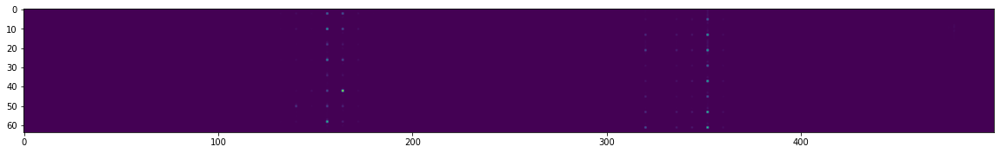

In [38]:
plt.figure(figsize = figsize)
plt.imshow(model_distribution_res['xy_hat'][figrange[0]:figrange[1], figrange[2]:figrange[3]])

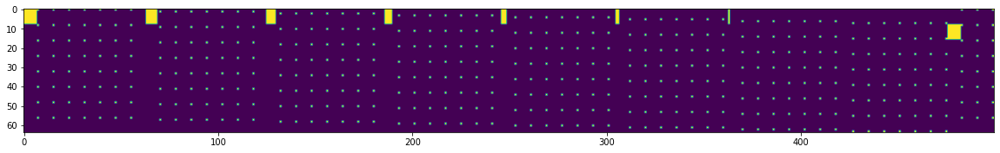

In [39]:
plt.figure(figsize = figsize)
plt.imshow(xy[figrange[0]:figrange[1], figrange[2]:figrange[3]])

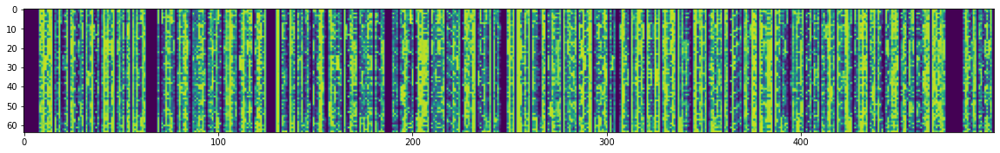

In [40]:
plt.figure(figsize = figsize)
plt.imshow(model_distribution_res['xy_div_xyind_hat'][figrange[0]:figrange[1], figrange[2]:figrange[3]])

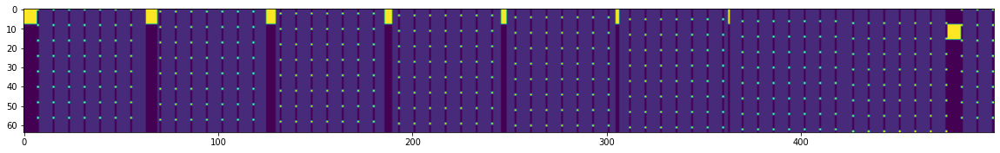

In [41]:
plt.figure(figsize = figsize)
plt.imshow((xy/xyind)[figrange[0]:figrange[1], figrange[2]:figrange[3]])

## Continue Training from checkpoint

In [ ]:
checkpoint_PATH = os.path.join(ckpt_dir_PATH, 'last.ckpt')
run_PATH = os.path.join(project_name, 'trtcuqus') # also from wandb interface

wandb.restore(checkpoint_PATH, run_path=run_PATH)
checkpoint = torch.load(checkpoint_PATH, map_location=lambda storage, loc: storage)
trainmodule.load_state_dict(checkpoint['state_dict'])

In [ ]:
trainer = pl.Trainer(
    gpus=[1], 
    min_epochs=2, max_epochs=800, 
    precision=32, 
    logger=wd_logger,
    log_gpu_memory='all',
    weights_summary = 'full',
    gradient_clip_val=hparams['gradient_clip_val'],
    replace_sampler_ddp=False,
    callbacks=[checkpoint_callback]
)

with torch.autograd.detect_anomaly():
    trainer.fit(trainmodule, game_datamodule)
    
wandb.save(os.path.join(ckpt_dir_PATH, 'last.ckpt'))

## Test after reloading checkpoint

In [ ]:
checkpoint_PATH = os.path.join(ckpt_dir_PATH, 'last.ckpt')
run_PATH = os.path.join(project_name, 'trtcuqus') # also from wandb interface

wandb.restore(checkpoint_PATH, run_path=run_PATH)
checkpoint = torch.load(checkpoint_PATH, map_location=lambda storage, loc: storage)
trainmodule.load_state_dict(checkpoint['state_dict'])

trainer = pl.Trainer(
    gpus=[1], 
    min_epochs=2, max_epochs=300, 
    precision=32, 
    logger=wd_logger,
    log_gpu_memory='all',
    weights_summary = 'full',
    gradient_clip_val=hparams['gradient_clip_val'],
    replace_sampler_ddp=False,
#     callbacks=[checkpoint_callback]
)

In [ ]:
test_loader = DataLoader(
            GameTestFullDataset(raw_data=game_data, debug=True), 
            batch_size=hparams['batch_size'], shuffle=False
        )
res = trainer.test(model=trainmodule, test_dataloaders=test_loader)

In [ ]:
model_distribution_res = trainmodule.pull_model_distribution(debug=True)
print('xy_hat_rank:', model_distribution_res['xy_hat_rank'])
print('xy_div_xyind_hat_rank:', model_distribution_res['xy_div_xyind_hat_rank'])
print('mi_hat:', model_distribution_res['mi_hat'])
print('mi_gt_minus_hat:', model_distribution_res['mi_gt_minus_hat'])
print('kl_div:', model_distribution_res['kl_div'])

In [ ]:
plt.figure(figsize = figsize)
plt.imshow(model_distribution_res['xy_hat'][figrange[0]:figrange[1], figrange[2]:figrange[3]])

In [ ]:
plt.figure(figsize = figsize)
plt.imshow(xy[figrange[0]:figrange[1], figrange[2]:figrange[3]])

In [ ]:
plt.figure(figsize = figsize)
plt.imshow(model_distribution_res['xy_div_xyind_hat'][figrange[0]:figrange[1], figrange[2]:figrange[3]])

In [ ]:
plt.figure(figsize = figsize)
plt.imshow((xy/xyind)[figrange[0]:figrange[1], figrange[2]:figrange[3]])